# D02 — Portrait Skin-Tone and Hand Restoration Audit

**Origin:** New approved supplemental analysis arising from supervisor feedback\
**Refactor status:** Finished\
**Validation status:** Finished\
**Completion gate passed:** Yes\
**Output root:** `outputs/d02_portrait_skin_tone_and_hand_restoration_audit/`\
**Depends on:** Notebooks 01–21, including Notebook 12A

## Purpose

Evaluate two focused questions using the existing Controlled-300 evidence:

1. Are restoration errors systematically worse where damage intersects visible hands than in matched non-hand regions from the same painting and case?
2. Does restoration performance vary descriptively with the rendered lightness of depicted skin regions?

The primary study concerns hand-restoration difficulty. The depicted-skin-tone analysis is exploratory and remains subject to a separate claim-eligibility gate.

## Approved evidence population

The complete screening population contains all 60 paintings in the `portrait_figure` category:

- `p001`–`p010`;
- `p251`–`p300`.

Outcome-blind screening begins with:

- 300 canonical cases;
- 49 damage-size cases;
- 105 mask-robustness cases;
- 231 synthetic-degradation cases.

The main model comparison includes:

- OpenCV Telea;
- LaMa;
- HINT;
- Stable Diffusion 1.5 Inpainting.

SDXL is included only descriptively when an exact eligible case exists.

## Hard feasibility boundary

An anatomical intersection initially requires:

- at least 256 damaged anatomical pixels;
- at least 5% of the reviewed anatomical region to be damaged.

The hand study proceeds only if the evidence contains approximately:

- at least 12 independent paintings;
- at least 20 usable hand-hit cases;
- more than one damage family;
- viable within-case non-hand controls.

If this gate fails, the notebook publishes a feasibility-only result. It does not generate new masks or restoration candidates.

## Interpretation boundaries

- Anatomical regions are reviewed independently from damage masks and outcomes.
- Depicted skin tone is measured from rendered pixels; race or ethnicity is not inferred.
- Model disagreement or local error does not establish historical incorrectness.
- Computational evidence does not constitute conservation approval.
- No combined quality, uncertainty, trustworthiness, or bias score is constructed.

## Canonical outputs

- `data/portrait_screening.csv`
- `data/anatomical_annotations.csv`
- `data/anatomical_overlap_audit.csv`
- `data/eligible_cases.csv`
- `data/manual_anatomy_review.csv`
- `metrics/hand_region_comparison.csv`
- `metrics/skin_tone_audit.csv`
- `figures/portrait_screening_atlas.png`
- `figures/anatomical_annotation_qa.png`
- `figures/hand_vs_control.png`
- `figures/anatomical_failure_atlas.png`
- `figures/skin_tone_audit.png`
- `reports/portrait_skin_tone_and_hand_audit.html`
- `manifests/run_manifest.json`
- `manifests/artifacts.csv`
- `validation/checks.csv`

## Batch 1 — Contract, preflight, and ethical boundaries

This batch validates the repository, inventory, upstream completion gates,
approved output boundary, feasibility thresholds, model scope, and ethical
interpretation limits. It performs no anatomical screening, outcome inspection,
or restoration inference.

In [1]:
from __future__ import annotations

import json
import sys
from pathlib import Path

import pandas as pd
import yaml


def discover_project_root(start: Path | None = None) -> Path:
    candidate = (start or Path.cwd()).resolve()

    for directory in (candidate, *candidate.parents):
        if (
            (directory / ".git").exists()
            and (directory / "src" / "restoration_eval").is_dir()
            and (directory / "notebooks").is_dir()
        ):
            return directory

    raise FileNotFoundError(
        f"Could not locate the repository from {candidate}"
    )


PROJECT_ROOT = discover_project_root()
SRC_ROOT = PROJECT_ROOT / "src"

if str(SRC_ROOT) not in sys.path:
    sys.path.insert(0, str(SRC_ROOT))

from restoration_eval.manifests import (
    MANIFESTS_MODULE_VERSION,
    sha256_file,
    utc_now_iso,
)
from restoration_eval.paths import (
    PATHS_MODULE_VERSION,
    ensure_output_subdirs,
    load_project_paths_registry,
    notebook_output_root,
    validate_project_paths_registry,
)
from restoration_eval.portrait_anatomy_audit import (
    PORTRAIT_ANATOMY_MODULE_VERSION,
    load_json,
    load_portrait_anatomy_config,
    validate_upstream_manifests,
)
from restoration_eval.schemas import SCHEMAS_MODULE_VERSION
from restoration_eval.validation import (
    VALIDATION_MODULE_VERSION,
    ValidationCollector,
)

CONFIG_PATH = (
    PROJECT_ROOT
    / "config"
    / "evaluation"
    / "portrait_anatomy_audit.yaml"
)

CONFIG = load_portrait_anatomy_config(CONFIG_PATH)
SETTINGS = CONFIG["portrait_anatomy_audit"]

NOTEBOOK_ID = str(SETTINGS["notebook_id"])
NOTEBOOK_STEM = str(SETTINGS["notebook_stem"])
RUN_STARTED_AT_UTC = utc_now_iso()

NOTEBOOK_OUTPUT_ROOT = notebook_output_root(
    NOTEBOOK_STEM,
    PROJECT_ROOT,
)

declared_output_root = (
    PROJECT_ROOT
    / SETTINGS["output"]["root"]
).resolve()

if NOTEBOOK_OUTPUT_ROOT != declared_output_root:
    raise ValueError(
        "Configured and guarded D02 output roots disagree: "
        f"{declared_output_root} != {NOTEBOOK_OUTPUT_ROOT}"
    )

OUTPUT_DIRS = ensure_output_subdirs(
    NOTEBOOK_STEM,
    (
        "data",
        "metrics",
        "figures",
        "reports",
        "manifests",
        "validation",
        "work",
    ),
    PROJECT_ROOT,
)

OUTPUTS = {
    key: (
        NOTEBOOK_OUTPUT_ROOT
        / relative_path
    )
    for key, relative_path in SETTINGS["output"].items()
    if key not in {"root", "work_root"}
}

WORK_ROOT = (
    NOTEBOOK_OUTPUT_ROOT
    / SETTINGS["output"]["work_root"]
)

VALIDATION = ValidationCollector()

print("D02 environment initialized.")
print("Project root:", PROJECT_ROOT)
print("Notebook output root:", NOTEBOOK_OUTPUT_ROOT)
print("Configuration version:", CONFIG["config_version"])
print("Helper version:", PORTRAIT_ANATOMY_MODULE_VERSION)
print("Run started at:", RUN_STARTED_AT_UTC)

D02 environment initialized.
Project root: D:\Masters\FH\Thesis\painting-restoration-eval
Notebook output root: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\d02_portrait_skin_tone_and_hand_restoration_audit
Configuration version: 1.0.0
Helper version: 1.0.0
Run started at: 2026-09-20T19:45:52.341982Z


In [2]:
INPUTS = SETTINGS["inputs"]

INVENTORY_PATH = (
    PROJECT_ROOT
    / INPUTS["inventory_path"]
)
INVENTORY_RUN_PATH = (
    PROJECT_ROOT
    / INPUTS["inventory_run_path"]
)
PROJECT_PATHS_PATH = (
    PROJECT_ROOT
    / INPUTS["project_paths_path"]
)

inventory_run = load_json(INVENTORY_RUN_PATH)
inventory_df = pd.read_csv(
    INVENTORY_PATH,
    low_memory=False,
)

inventory_paths = set(
    inventory_df["relative_path"]
    .astype(str)
    .str.replace("\\", "/", regex=False)
)

inventory_status = str(
    inventory_run.get("status", "")
)
inventory_read_errors = int(
    inventory_run
    .get("summary", {})
    .get("read_error_count", -1)
)
inventory_checksum = sha256_file(
    INVENTORY_PATH
)
recorded_inventory_checksum = str(
    inventory_run.get("inventory_sha256", "")
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="inventory_completed",
    check_description=(
        "The project inventory completed successfully."
    ),
    severity="blocking",
    expected="completed",
    observed=inventory_status,
    passed=inventory_status == "completed",
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="inventory_has_no_read_errors",
    check_description=(
        "The project inventory contains no read errors."
    ),
    severity="blocking",
    expected=0,
    observed=inventory_read_errors,
    passed=inventory_read_errors == 0,
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="inventory_checksum_matches",
    check_description=(
        "The inventory checksum matches its run record."
    ),
    severity="blocking",
    expected=recorded_inventory_checksum,
    observed=inventory_checksum,
    passed=(
        inventory_checksum
        == recorded_inventory_checksum
    ),
)

declared_input_paths = []

for input_key, relative_path in INPUTS.items():
    if input_key == "upstream_manifest_paths":
        continue

    declared_input_paths.append(
        str(relative_path).replace("\\", "/")
    )

declared_input_paths.extend(
    str(relative_path).replace("\\", "/")
    for relative_path in (
        INPUTS["upstream_manifest_paths"].values()
    )
)

missing_files = [
    relative_path
    for relative_path in declared_input_paths
    if not (
        PROJECT_ROOT
        / relative_path
    ).is_file()
]

inventory_self_paths = {
    str(INPUTS["inventory_path"]),
    str(INPUTS["inventory_run_path"]),
}

missing_from_inventory = [
    relative_path
    for relative_path in declared_input_paths
    if (
        relative_path
        not in inventory_self_paths
        and relative_path
        not in inventory_paths
    )
]

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="declared_inputs_exist",
    check_description=(
        "Every declared D02 input exists."
    ),
    severity="blocking",
    expected=0,
    observed=len(missing_files),
    passed=not missing_files,
    details=missing_files,
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="declared_inputs_are_in_inventory",
    check_description=(
        "Every non-inventory input is indexed."
    ),
    severity="blocking",
    expected=0,
    observed=len(missing_from_inventory),
    passed=not missing_from_inventory,
    details=missing_from_inventory,
)

project_paths_registry = load_project_paths_registry(
    PROJECT_PATHS_PATH
)
project_paths_errors = (
    validate_project_paths_registry(
        project_paths_registry
    )
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="project_paths_registry_valid",
    check_description=(
        "The project-path registry passes its schema contract."
    ),
    severity="blocking",
    expected=[],
    observed=project_paths_errors,
    passed=not project_paths_errors,
)

coverage_path = (
    PROJECT_ROOT
    / "config"
    / "evaluation"
    / "evidence_coverage.yaml"
)

with coverage_path.open(
    "r",
    encoding="utf-8",
) as handle:
    coverage_config = yaml.safe_load(handle)

controlled_rerun = (
    coverage_config["evidence_coverage"]
    ["controlled_300_rerun"]
)

next_eligible = str(
    controlled_rerun[
        "next_eligible_notebook_id"
    ]
)

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="d02_is_next_eligible_notebook",
    check_description=(
        "The governed rerun sequence authorizes D02 next."
    ),
    severity="blocking",
    expected="D02",
    observed=next_eligible,
    passed=next_eligible == "D02",
)

upstream_manifests = {
    notebook_id: load_json(
        PROJECT_ROOT
        / relative_path
    )
    for notebook_id, relative_path in (
        INPUTS["upstream_manifest_paths"].items()
    )
}

upstream_audit_df = (
    validate_upstream_manifests(
        upstream_manifests,
        list(
            INPUTS[
                "upstream_manifest_paths"
            ]
        ),
    )
)

failed_upstream = upstream_audit_df[
    ~upstream_audit_df["passed"]
]

VALIDATION.add(
    validation_stage="batch_1_preflight",
    check_id="upstream_completion_gates_pass",
    check_description=(
        "All declared upstream notebooks have completed, "
        "validated runs."
    ),
    severity="blocking",
    expected=(
        len(
            INPUTS[
                "upstream_manifest_paths"
            ]
        )
    ),
    observed=int(
        upstream_audit_df["passed"].sum()
    ),
    passed=failed_upstream.empty,
    details=(
        failed_upstream.to_dict("records")
    ),
)

print("Inventory run:", inventory_run["inventory_run_id"])
print("Inventory files:", len(inventory_df))
print("Inventory read errors:", inventory_read_errors)
print("Declared input paths:", len(declared_input_paths))
print("Missing inputs:", missing_files)
print("Missing from inventory:", missing_from_inventory)
print(
    "Upstream completion gates:",
    f"{int(upstream_audit_df['passed'].sum())}"
    f"/{len(upstream_audit_df)}",
)

display(upstream_audit_df)

Inventory run: inventory_20260919T223448Z_2c48b66f
Inventory files: 140804
Inventory read errors: 0
Declared input paths: 48
Missing inputs: []
Missing from inventory: []
Upstream completion gates: 22/22


,notebook_id,manifest_present,run_status,validation_status,completion_gate_passed,passed,issue
0,01,True,completed,passed,True,True,
1,02,True,completed,passed,True,True,
2,03,True,completed,passed,True,True,
3,04,True,completed,passed,True,True,
4,05,True,completed,passed,True,True,
5,06,True,completed,passed,True,True,
6,07,True,completed,passed,True,True,
7,08,True,completed,passed,True,True,
8,09,True,completed,passed,True,True,
9,10,True,completed,passed,True,True,


In [3]:
POLICY = SETTINGS["evidence_policy"]
GATE = SETTINGS["overlap_gate"]
ANALYSIS = SETTINGS["analysis"]
SKIN_TONE = SETTINGS["skin_tone"]

contract_rows = [
    {
        "contract_item": "Independent unit",
        "value": ANALYSIS["independent_unit"],
        "role": "statistical boundary",
    },
    {
        "contract_item": "Primary estimand",
        "value": ANALYSIS["primary_estimand"],
        "role": "hand-restoration question",
    },
    {
        "contract_item": "Minimum damaged anatomy pixels",
        "value": GATE[
            "minimum_damaged_anatomical_pixels"
        ],
        "role": "case eligibility",
    },
    {
        "contract_item": "Minimum anatomy fraction affected",
        "value": GATE[
            "minimum_anatomical_fraction_affected"
        ],
        "role": "case eligibility",
    },
    {
        "contract_item": "Minimum hand paintings",
        "value": GATE[
            "minimum_independent_hand_paintings"
        ],
        "role": "hand-study feasibility",
    },
    {
        "contract_item": "Minimum hand cases",
        "value": GATE[
            "minimum_usable_hand_cases"
        ],
        "role": "hand-study feasibility",
    },
    {
        "contract_item": "Minimum damage families",
        "value": GATE[
            "minimum_hand_damage_families"
        ],
        "role": "coverage requirement",
    },
    {
        "contract_item": "New restoration inference",
        "value": POLICY[
            "new_masks_or_restoration_inference_authorized"
        ],
        "role": "must remain false",
    },
    {
        "contract_item": "Race or ethnicity inference",
        "value": not SKIN_TONE[
            "prohibit_race_or_ethnicity_inference"
        ],
        "role": "must remain false",
    },
    {
        "contract_item": "Combined score",
        "value": not POLICY[
            "no_combined_quality_score"
        ],
        "role": "must remain false",
    },
]

contract_df = pd.DataFrame(
    contract_rows
)

boundary_checks = {
    "annotation_independent_of_damage": bool(
        POLICY[
            "annotation_independent_of_damage_masks"
        ]
    ),
    "outcome_blind_screening": bool(
        POLICY[
            "outcome_blind_screening_required"
        ]
    ),
    "no_new_inference": not bool(
        POLICY[
            "new_masks_or_restoration_inference_authorized"
        ]
    ),
    "no_race_or_ethnicity_inference": bool(
        SKIN_TONE[
            "prohibit_race_or_ethnicity_inference"
        ]
    ),
    "no_inherent_bias_claim": bool(
        SKIN_TONE[
            "prohibit_inherent_model_bias_claim"
        ]
    ),
    "self_contained_report": bool(
        SETTINGS["report"]["self_contained_html"]
    ),
}

for check_id, passed in (
    boundary_checks.items()
):
    VALIDATION.add(
        validation_stage="batch_1_contract",
        check_id=check_id,
        check_description=(
            f"D02 contract boundary: {check_id}."
        ),
        severity="blocking",
        expected=True,
        observed=passed,
        passed=passed,
    )

VALIDATION.raise_for_blocking()

batch_1_validation_df = (
    VALIDATION.to_dataframe()
)

print("D02 Batch 1 passed.")
print(
    "Validation checks:",
    len(batch_1_validation_df),
)
print(
    "Blocking failures:",
    len(VALIDATION.blocking_failures),
)
print(
    "Primary models:",
    SETTINGS["models"]["primary"],
)
print(
    "SDXL role:",
    SETTINGS["models"]["sdxl_role"],
)
print(
    "New inference authorized:",
    POLICY[
        "new_masks_or_restoration_inference_authorized"
    ],
)
print(
    "Next stage:",
    "outcome-blind loading of all 60 portraits",
)

display(contract_df)
display(batch_1_validation_df)

D02 Batch 1 passed.
Validation checks: 14
Blocking failures: 0
Primary models: ['opencv_telea', 'lama', 'hint_places2', 'stable_diffusion_inpainting']
SDXL role: descriptive_exact_case_overlap_only
New inference authorized: False
Next stage: outcome-blind loading of all 60 portraits


,contract_item,value,role
0,Independent unit,painting_id,statistical boundary
1,Primary estimand,within_case_hand_minus_matched_non_hand_control,hand-restoration question
2,Minimum damaged anatomy pixels,256,case eligibility
3,Minimum anatomy fraction affected,0.05,case eligibility
4,Minimum hand paintings,12,hand-study feasibility
5,Minimum hand cases,20,hand-study feasibility
6,Minimum damage families,2,coverage requirement
7,New restoration inference,False,must remain false
8,Race or ethnicity inference,False,must remain false
9,Combined score,False,must remain false


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_1_preflight,inventory_completed,The project inventory completed successfully.,blocking,completed,completed,True,
1,batch_1_preflight,inventory_has_no_read_errors,The project inventory contains no read errors.,blocking,0,0,True,
2,batch_1_preflight,inventory_checksum_matches,The inventory checksum matches its run record.,blocking,3e71ca145aa5a67084dc01c37a1a85d26e88da4fc4c861...,3e71ca145aa5a67084dc01c37a1a85d26e88da4fc4c861...,True,
3,batch_1_preflight,declared_inputs_exist,Every declared D02 input exists.,blocking,0,0,True,[]
4,batch_1_preflight,declared_inputs_are_in_inventory,Every non-inventory input is indexed.,blocking,0,0,True,[]
5,batch_1_preflight,project_paths_registry_valid,The project-path registry passes its schema co...,blocking,[],[],True,
6,batch_1_preflight,d02_is_next_eligible_notebook,The governed rerun sequence authorizes D02 next.,blocking,D02,D02,True,
7,batch_1_preflight,upstream_completion_gates_pass,All declared upstream notebooks have completed...,blocking,22,22,True,[]
8,batch_1_contract,annotation_independent_of_damage,D02 contract boundary: annotation_independent_...,blocking,True,True,True,
9,batch_1_contract,outcome_blind_screening,D02 contract boundary: outcome_blind_screening.,blocking,True,True,True,


## Batch 2 — Portrait population and outcome-blind case loading

This batch:

- loads all 60 `portrait_figure` paintings;
- joins normalized-image paths and recorded content bounds;
- loads canonical, damage-size, mask-robustness, and degradation case registries;
- verifies the exact approved case counts without reading model outcomes;
- creates the complete outcome-blind portrait-screening table;
- preserves any previously entered manual screening fields on safe reruns;
- creates an empty annotation table only when one does not already exist;
- renders the complete 60-painting screening atlas;
- does not inspect restoration outputs or performance metrics.

In [4]:
import importlib

import restoration_eval.portrait_anatomy_audit as portrait_audit

portrait_audit = importlib.reload(
    portrait_audit
)

artworks_df = pd.read_csv(
    PROJECT_ROOT
    / INPUTS["artworks_path"],
    low_memory=False,
)

preprocessing_df = pd.read_csv(
    PROJECT_ROOT
    / INPUTS["preprocessing_path"],
    low_memory=False,
)

canonical_cases_df = pd.read_csv(
    PROJECT_ROOT
    / INPUTS["canonical_cases_path"],
    low_memory=False,
)

damage_size_cases_df = pd.read_csv(
    PROJECT_ROOT
    / INPUTS["damage_size_cases_path"],
    low_memory=False,
)

robustness_cases_df = pd.read_csv(
    PROJECT_ROOT
    / INPUTS["robustness_cases_path"],
    low_memory=False,
)

degradation_cases_df = pd.read_csv(
    PROJECT_ROOT
    / INPUTS["degradation_cases_path"],
    low_memory=False,
)

portrait_screening_df = (
    portrait_audit
    .build_portrait_screening_population(
        artworks_df,
        preprocessing_df,
        canonical_cases_df,
        damage_size_cases_df,
        robustness_cases_df,
        degradation_cases_df,
        CONFIG,
    )
)

screening_errors = (
    portrait_audit
    .validate_portrait_screening(
        portrait_screening_df,
        CONFIG,
        require_reviewed=False,
    )
)

POPULATION = SETTINGS["population"]

observed_case_counts = {
    "portrait_count": len(
        portrait_screening_df
    ),
    "canonical_case_count": int(
        portrait_screening_df[
            "canonical_case_count"
        ].sum()
    ),
    "damage_size_case_count": int(
        portrait_screening_df[
            "damage_size_case_count"
        ].sum()
    ),
    "robustness_case_count": int(
        portrait_screening_df[
            "robustness_case_count"
        ].sum()
    ),
    "degradation_case_count": int(
        portrait_screening_df[
            "degradation_case_count"
        ].sum()
    ),
}

expected_case_counts = {
    "portrait_count": int(
        POPULATION["exact_portrait_count"]
    ),
    "canonical_case_count": int(
        POPULATION[
            "exact_canonical_case_count"
        ]
    ),
    "damage_size_case_count": int(
        POPULATION[
            "exact_damage_size_case_count"
        ]
    ),
    "robustness_case_count": int(
        POPULATION[
            "exact_robustness_case_count"
        ]
    ),
    "degradation_case_count": int(
        POPULATION[
            "exact_degradation_case_count"
        ]
    ),
}

portrait_ids = set(
    portrait_screening_df[
        "painting_id"
    ].astype(str)
)

expected_portrait_ids = {
    *(
        f"p{number:03d}"
        for number in range(1, 11)
    ),
    *(
        f"p{number:03d}"
        for number in range(251, 301)
    ),
}

source_tables = {
    "artworks": artworks_df,
    "preprocessing": preprocessing_df,
    "canonical_cases": canonical_cases_df,
    "damage_size_cases": damage_size_cases_df,
    "robustness_cases": robustness_cases_df,
    "degradation_cases": degradation_cases_df,
}

source_status_failures = {
    name: int(
        (
            frame["status"]
            .astype(str)
            .str.lower()
            != "passed"
        ).sum()
    )
    for name, frame in source_tables.items()
    if "status" in frame.columns
}

source_scope_failures = {
    name: int(
        (
            frame["dataset_scope"]
            .astype(str)
            != SETTINGS["dataset_scope"]
        ).sum()
    )
    for name, frame in source_tables.items()
    if "dataset_scope" in frame.columns
}

BATCH_2_VALIDATION = ValidationCollector()

BATCH_2_VALIDATION.add(
    validation_stage="batch_2_population",
    check_id="portrait_screening_schema_valid",
    check_description=(
        "The outcome-blind portrait screening "
        "table satisfies its schema contract."
    ),
    severity="blocking",
    expected=[],
    observed=screening_errors,
    passed=not screening_errors,
)

BATCH_2_VALIDATION.add(
    validation_stage="batch_2_population",
    check_id="portrait_ids_exact",
    check_description=(
        "The screening population contains "
        "the exact approved 60 portrait IDs."
    ),
    severity="blocking",
    expected=sorted(
        expected_portrait_ids
    ),
    observed=sorted(
        portrait_ids
    ),
    passed=(
        portrait_ids
        == expected_portrait_ids
    ),
)

for count_name, expected_value in (
    expected_case_counts.items()
):
    observed_value = (
        observed_case_counts[
            count_name
        ]
    )

    BATCH_2_VALIDATION.add(
        validation_stage="batch_2_population",
        check_id=f"exact_{count_name}",
        check_description=(
            f"The observed {count_name} "
            "matches the frozen contract."
        ),
        severity="blocking",
        expected=expected_value,
        observed=observed_value,
        passed=(
            observed_value
            == expected_value
        ),
    )

BATCH_2_VALIDATION.add(
    validation_stage="batch_2_population",
    check_id="source_statuses_pass",
    check_description=(
        "Every loaded source row retains "
        "a passed status."
    ),
    severity="blocking",
    expected={
        name: 0
        for name in source_status_failures
    },
    observed=source_status_failures,
    passed=all(
        count == 0
        for count in (
            source_status_failures.values()
        )
    ),
)

BATCH_2_VALIDATION.add(
    validation_stage="batch_2_population",
    check_id="source_scopes_match",
    check_description=(
        "Every loaded source row belongs "
        "to Controlled-300."
    ),
    severity="blocking",
    expected={
        name: 0
        for name in source_scope_failures
    },
    observed=source_scope_failures,
    passed=all(
        count == 0
        for count in (
            source_scope_failures.values()
        )
    ),
)

missing_clean_images = [
    relative_path
    for relative_path in (
        portrait_screening_df[
            "clean_image_path"
        ].astype(str)
    )
    if not (
        PROJECT_ROOT
        / relative_path
    ).is_file()
]

BATCH_2_VALIDATION.add(
    validation_stage="batch_2_population",
    check_id="portrait_clean_images_exist",
    check_description=(
        "Every screened portrait has its "
        "normalized clean image."
    ),
    severity="blocking",
    expected=0,
    observed=len(
        missing_clean_images
    ),
    passed=not missing_clean_images,
    details=missing_clean_images,
)

BATCH_2_VALIDATION.raise_for_blocking()

print("Outcome-blind population loaded.")
print(
    "Portraits:",
    observed_case_counts[
        "portrait_count"
    ],
)
print(
    "Case counts:",
    observed_case_counts,
)
print(
    "Preliminary shortlisted paintings:",
    int(
        portrait_screening_df[
            "preliminary_shortlist"
        ].sum()
    ),
)

display(
    portrait_screening_df[
        [
            "painting_id",
            "title",
            "artist",
            "source",
            "canonical_case_count",
            "damage_size_case_count",
            "robustness_case_count",
            "degradation_case_count",
            "preliminary_shortlist",
        ]
    ]
)

Outcome-blind population loaded.
Portraits: 60
Case counts: {'portrait_count': 60, 'canonical_case_count': 300, 'damage_size_case_count': 49, 'robustness_case_count': 105, 'degradation_case_count': 231}
Preliminary shortlisted paintings: 14


,painting_id,title,artist,source,canonical_case_count,damage_size_case_count,robustness_case_count,degradation_case_count,preliminary_shortlist
0,p001,Juan de Pareja,Diego Velázquez,The Metropolitan Museum of Art,5,7,15,33,True
1,p002,Madame X (Madame Pierre Gautreau),John Singer Sargent,The Metropolitan Museum of Art,5,0,0,0,False
2,p003,Marie Joséphine Charlotte du Val d'Ognes,Marie-Denise Villers,The Metropolitan Museum of Art,5,0,0,0,False
3,p004,Madame Georges Charpentier and Her Children,Pierre-Auguste Renoir,The Metropolitan Museum of Art,5,0,0,0,False
4,p005,Self-Portrait with Two Pupils,Adélaïde Labille-Guiard,The Metropolitan Museum of Art,5,0,0,0,False
5,p006,Boy with a Sword,Édouard Manet,The Metropolitan Museum of Art,5,0,0,0,True
6,p007,Princesse de Broglie,Jean-Auguste-Dominique Ingres,The Metropolitan Museum of Art,5,0,0,0,True
7,p008,Manuel Osorio Manrique de Zuñiga,Francisco de Goya y Lucientes,The Metropolitan Museum of Art,5,0,0,0,True
8,p009,Madame Roulin and Her Baby,Vincent van Gogh,The Metropolitan Museum of Art,5,7,15,33,True
9,p010,Joan of Arc,Jules Bastien-Lepage,The Metropolitan Museum of Art,5,0,0,0,False


In [5]:
import os
import time

from PIL import Image


def write_csv_atomic_retry(
    frame: pd.DataFrame,
    target: Path,
    *,
    attempts: int = 8,
    delay_seconds: float = 0.25,
) -> Path:
    target.parent.mkdir(
        parents=True,
        exist_ok=True,
    )

    temporary = target.with_suffix(
        target.suffix + ".tmp"
    )

    for attempt in range(
        1,
        attempts + 1,
    ):
        try:
            frame.to_csv(
                temporary,
                index=False,
            )
            os.replace(
                temporary,
                target,
            )
            return target
        except PermissionError:
            temporary.unlink(
                missing_ok=True
            )

            if attempt == attempts:
                raise

            time.sleep(
                delay_seconds * attempt
            )

    raise RuntimeError(
        f"Could not write {target}"
    )


screening_path = OUTPUTS[
    "portrait_screening_path"
]

manual_screening_columns = [
    "screening_status",
    "visible_face",
    "visible_skin",
    "visible_left_hand",
    "visible_right_hand",
    "other_exposed_body_part",
    "screening_notes",
    "exclusion_reason",
]

if screening_path.is_file():
    previous_screening_df = (
        pd.read_csv(
            screening_path,
            low_memory=False,
        )
    )

    previous_ids = set(
        previous_screening_df[
            "painting_id"
        ].astype(str)
    )

    current_ids = set(
        portrait_screening_df[
            "painting_id"
        ].astype(str)
    )

    if previous_ids != current_ids:
        raise RuntimeError(
            "Existing screening IDs differ "
            "from the governed population."
        )

    missing_manual_columns = sorted(
        set(
            manual_screening_columns
        )
        - set(
            previous_screening_df.columns
        )
    )

    if missing_manual_columns:
        raise RuntimeError(
            "Existing screening table lacks "
            f"manual fields: "
            f"{missing_manual_columns}"
        )

    prior_manual = (
        previous_screening_df[
            [
                "painting_id",
                *manual_screening_columns,
            ]
        ]
        .copy()
    )

    portrait_screening_df = (
        portrait_screening_df
        .drop(
            columns=manual_screening_columns
        )
        .merge(
            prior_manual,
            on="painting_id",
            how="left",
            validate="one_to_one",
        )
    )

    portrait_screening_df = (
        portrait_screening_df[
            portrait_audit
            .PORTRAIT_SCREENING_COLUMNS
        ]
    )

write_csv_atomic_retry(
    portrait_screening_df,
    screening_path,
)

annotations_path = OUTPUTS[
    "annotations_path"
]

if annotations_path.is_file():
    anatomical_annotations_df = (
        pd.read_csv(
            annotations_path,
            low_memory=False,
        )
    )

    missing_annotation_columns = sorted(
        set(
            portrait_audit
            .ANNOTATION_COLUMNS
        )
        - set(
            anatomical_annotations_df
            .columns
        )
    )

    if missing_annotation_columns:
        raise RuntimeError(
            "Existing annotation table lacks "
            f"required fields: "
            f"{missing_annotation_columns}"
        )
else:
    anatomical_annotations_df = (
        portrait_audit
        .empty_annotation_table()
    )

    write_csv_atomic_retry(
        anatomical_annotations_df,
        annotations_path,
    )

screening_atlas_path = (
    portrait_audit
    .create_screening_atlas(
        portrait_screening_df,
        OUTPUTS[
            "screening_atlas_path"
        ],
        project_root=PROJECT_ROOT,
        columns=6,
        tile_size=180,
    )
)

with Image.open(
    screening_atlas_path
) as atlas_image:
    atlas_details = {
        "format": atlas_image.format,
        "mode": atlas_image.mode,
        "width": atlas_image.width,
        "height": atlas_image.height,
        "size_bytes": (
            screening_atlas_path
            .stat()
            .st_size
        ),
    }

reloaded_screening_df = pd.read_csv(
    screening_path,
    low_memory=False,
)

reloaded_annotations_df = pd.read_csv(
    annotations_path,
    low_memory=False,
)

persisted_screening_errors = (
    portrait_audit
    .validate_portrait_screening(
        reloaded_screening_df,
        CONFIG,
        require_reviewed=False,
    )
)

BATCH_2_VALIDATION.add(
    validation_stage="batch_2_persistence",
    check_id="screening_table_reloads",
    check_description=(
        "The screening table reloads with "
        "all 60 governed portrait rows."
    ),
    severity="blocking",
    expected=60,
    observed=len(
        reloaded_screening_df
    ),
    passed=(
        len(reloaded_screening_df)
        == 60
        and not persisted_screening_errors
    ),
    details=persisted_screening_errors,
)

BATCH_2_VALIDATION.add(
    validation_stage="batch_2_persistence",
    check_id="annotation_template_schema",
    check_description=(
        "The annotation table exists with "
        "the complete required schema."
    ),
    severity="blocking",
    expected=(
        portrait_audit
        .ANNOTATION_COLUMNS
    ),
    observed=list(
        reloaded_annotations_df.columns
    ),
    passed=(
        list(
            reloaded_annotations_df.columns
        )
        == (
            portrait_audit
            .ANNOTATION_COLUMNS
        )
    ),
)

BATCH_2_VALIDATION.add(
    validation_stage="batch_2_persistence",
    check_id="screening_atlas_valid",
    check_description=(
        "The complete screening atlas is "
        "a valid RGB PNG."
    ),
    severity="blocking",
    expected={
        "format": "PNG",
        "mode": "RGB",
        "width": 1080,
        "height": 2140,
    },
    observed=atlas_details,
    passed=(
        atlas_details["format"] == "PNG"
        and atlas_details["mode"] == "RGB"
        and atlas_details["width"] == 1080
        and atlas_details["height"] == 2140
    ),
)

BATCH_2_VALIDATION.raise_for_blocking()

batch_2_validation_df = (
    BATCH_2_VALIDATION
    .to_dataframe()
)

shortlist_df = (
    reloaded_screening_df[
        reloaded_screening_df[
            "preliminary_shortlist"
        ].fillna(False)
    ][
        [
            "painting_id",
            "title",
            "preliminary_shortlist_families",
            "clean_image_path",
        ]
    ]
    .reset_index(drop=True)
)

print("D02 Batch 2 passed.")
print(
    "Screening rows:",
    len(reloaded_screening_df),
)
print(
    "Pending manual reviews:",
    int(
        reloaded_screening_df[
            "screening_status"
        ]
        .astype(str)
        .eq(
            "pending_manual_review"
        )
        .sum()
    ),
)
print(
    "Annotation rows:",
    len(
        reloaded_annotations_df
    ),
)
print(
    "Atlas:",
    atlas_details,
)
print(
    "Validation checks:",
    len(batch_2_validation_df),
)
print(
    "Blocking failures:",
    len(
        BATCH_2_VALIDATION
        .blocking_failures
    ),
)
print(
    "Next stage:",
    "manual anatomical screening and annotation",
)

display(shortlist_df)
display(batch_2_validation_df)

D02 Batch 2 passed.
Screening rows: 60
Pending manual reviews: 0
Annotation rows: 91
Atlas: {'format': 'PNG', 'mode': 'RGB', 'width': 1080, 'height': 2140, 'size_bytes': 2511495}
Validation checks: 13
Blocking failures: 0
Next stage: manual anatomical screening and annotation


,painting_id,title,preliminary_shortlist_families,clean_image_path
0,p001,Juan de Pareja,scratch_thin|loss_large|mixed_damage,outputs/02_image_preprocessing/images/clean/p0...
1,p006,Boy with a Sword,scratch_thin|loss_small|mixed_damage,outputs/02_image_preprocessing/images/clean/p0...
2,p007,Princesse de Broglie,scratch_thin|mixed_damage,outputs/02_image_preprocessing/images/clean/p0...
3,p008,Manuel Osorio Manrique de Zuñiga,loss_small,outputs/02_image_preprocessing/images/clean/p0...
4,p009,Madame Roulin and Her Baby,scratch_thin|loss_small|loss_large|mixed_damage,outputs/02_image_preprocessing/images/clean/p0...
5,p251,Nur Jahan holding a portrait of Emperor Jahangir,scratch_thin|mixed_damage,outputs/02_image_preprocessing/images/clean/p2...
6,p252,Portrait of Murad Bakhsh (1624–61),scratch_thin|mixed_damage,outputs/02_image_preprocessing/images/clean/p2...
7,p254,Portrait of the Aged Akbar,scratch_thin|loss_large,outputs/02_image_preprocessing/images/clean/p2...
8,p255,Court lady singing and playing the vina (recto),scratch_thin|loss_large,outputs/02_image_preprocessing/images/clean/p2...
9,p256,Portrait of Dora Wheeler,mixed_damage,outputs/02_image_preprocessing/images/clean/p2...


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_2_population,portrait_screening_schema_valid,The outcome-blind portrait screening table sat...,blocking,[],[],True,
1,batch_2_population,portrait_ids_exact,The screening population contains the exact ap...,blocking,"[""p001"", ""p002"", ""p003"", ""p004"", ""p005"", ""p006...","[""p001"", ""p002"", ""p003"", ""p004"", ""p005"", ""p006...",True,
2,batch_2_population,exact_portrait_count,The observed portrait_count matches the frozen...,blocking,60,60,True,
3,batch_2_population,exact_canonical_case_count,The observed canonical_case_count matches the ...,blocking,300,300,True,
4,batch_2_population,exact_damage_size_case_count,The observed damage_size_case_count matches th...,blocking,49,49,True,
5,batch_2_population,exact_robustness_case_count,The observed robustness_case_count matches the...,blocking,105,105,True,
6,batch_2_population,exact_degradation_case_count,The observed degradation_case_count matches th...,blocking,231,231,True,
7,batch_2_population,source_statuses_pass,Every loaded source row retains a passed status.,blocking,"{""canonical_cases"": 0, ""damage_size_cases"": 0,...","{""canonical_cases"": 0, ""damage_size_cases"": 0,...",True,
8,batch_2_population,source_scopes_match,Every loaded source row belongs to Controlled-...,blocking,"{""artworks"": 0, ""canonical_cases"": 0, ""damage_...","{""artworks"": 0, ""canonical_cases"": 0, ""damage_...",True,
9,batch_2_population,portrait_clean_images_exist,Every screened portrait has its normalized cle...,blocking,0,0,True,[]


## Batch 3 — Outcome-blind anatomical screening and annotation

This batch establishes the human-reviewed anatomical layer before any
restoration outcomes are loaded.

The screening stage:

- reviews all 60 clean portrait images;
- records visible faces, skin, left hands, right hands, and other exposed body
  regions;
- uses the depicted subject's anatomical left and right;
- records explicit exclusion reasons;
- checkpoints after every painting and safely resumes;
- remains blind to damage overlap and model performance.

After screening is complete, the retained anatomical regions become the
worklist for reviewed polygon annotation and visual QA.

In [6]:
from IPython.display import (
    clear_output,
    display,
)


SCREENING_RESET_IDS = [
    # Add painting IDs here only when a completed
    # decision needs to be reviewed again.
    # Example: "p259",
]


def as_review_boolean(
    value,
) -> bool:
    if pd.isna(value):
        return False

    return (
        str(value)
        .strip()
        .lower()
        in {
            "true",
            "1",
            "yes",
            "y",
        }
    )


def run_outcome_blind_screening(
    screening: pd.DataFrame,
    *,
    project_root: Path,
    checkpoint_path: Path,
    reset_ids=(),
) -> pd.DataFrame:
    reviewed = screening.copy()

    reset_ids = {
        str(value)
        for value in reset_ids
    }

    if reset_ids:
        unknown_reset_ids = sorted(
            reset_ids
            - set(
                reviewed[
                    "painting_id"
                ].astype(str)
            )
        )

        if unknown_reset_ids:
            raise ValueError(
                "Unknown screening reset IDs: "
                f"{unknown_reset_ids}"
            )

        reset_mask = (
            reviewed["painting_id"]
            .astype(str)
            .isin(reset_ids)
        )

        reviewed.loc[
            reset_mask,
            "screening_status",
        ] = "pending_manual_review"

        for column in [
            "visible_face",
            "visible_skin",
            "visible_left_hand",
            "visible_right_hand",
            "other_exposed_body_part",
        ]:
            reviewed.loc[
                reset_mask,
                column,
            ] = pd.NA

        reviewed.loc[
            reset_mask,
            "screening_notes",
        ] = ""

        reviewed.loc[
            reset_mask,
            "exclusion_reason",
        ] = ""

    total = len(reviewed)

    while True:
        pending_mask = (
            reviewed[
                "screening_status"
            ]
            .astype(str)
            .eq(
                "pending_manual_review"
            )
        )

        pending_indices = list(
            reviewed.index[
                pending_mask
            ]
        )

        if not pending_indices:
            clear_output(wait=True)

            print(
                "Outcome-blind screening complete."
            )
            print(
                "Reviewed paintings:",
                total,
            )

            return reviewed

        index = pending_indices[0]
        row = reviewed.loc[index]

        completed = (
            total
            - len(pending_indices)
        )

        image_path = (
            project_root
            / str(
                row[
                    "clean_image_path"
                ]
            )
        )

        with Image.open(
            image_path
        ) as source_image:
            preview = (
                source_image
                .convert("RGB")
                .copy()
            )

        preview.thumbnail(
            (650, 650),
            Image.Resampling.LANCZOS,
        )

        clear_output(wait=True)

        print(
            f"Painting {completed + 1}"
            f"/{total}: "
            f"{row['painting_id']}"
        )
        print("Title:", row["title"])
        print("Artist:", row["artist"])
        print(
            "Preliminary shortlist:",
            bool(
                row[
                    "preliminary_shortlist"
                ]
            ),
        )
        print(
            "Shortlisted families:",
            row[
                "preliminary_shortlist_families"
            ],
        )
        print()
        print(
            "Codes: "
            "f=face, s=visible skin, "
            "l=subject's left hand, "
            "r=subject's right hand, "
            "o=other exposed body part"
        )
        print(
            "Example: f,s,l,r"
        )
        print(
            "Optional note: "
            "f,s,l|left hand is small"
        )
        print(
            "Exclude: "
            "x:no usable anatomical region"
        )
        print(
            "Use q to checkpoint and quit."
        )
        print()

        display(preview)

        response = input(
            "Screening decision: "
        ).strip()

        if not response:
            print(
                "A decision is required."
            )
            continue

        if response.lower() == "q":
            write_csv_atomic_retry(
                reviewed,
                checkpoint_path,
            )

            clear_output(wait=True)

            print(
                "Screening checkpoint saved."
            )
            print(
                "Completed:",
                completed,
                "of",
                total,
            )
            print(
                "Rerun this cell to resume."
            )

            return reviewed

        decision_text, separator, note = (
            response.partition("|")
        )

        decision_text = (
            decision_text
            .strip()
            .lower()
        )

        note = note.strip()

        if decision_text.startswith("x"):
            _, reason_separator, reason = (
                decision_text.partition(":")
            )

            exclusion_reason = (
                reason.strip()
                if reason_separator
                else note
            )

            if not exclusion_reason:
                print(
                    "An exclusion reason is required."
                )
                continue

            reviewed.loc[
                index,
                "screening_status",
            ] = "excluded"

            for column in [
                "visible_face",
                "visible_skin",
                "visible_left_hand",
                "visible_right_hand",
                "other_exposed_body_part",
            ]:
                reviewed.loc[
                    index,
                    column,
                ] = False

            reviewed.loc[
                index,
                "screening_notes",
            ] = note

            reviewed.loc[
                index,
                "exclusion_reason",
            ] = exclusion_reason

        else:
            tokens = {
                token.strip()
                for token in (
                    decision_text.split(",")
                )
                if token.strip()
            }

            allowed_tokens = {
                "f",
                "s",
                "l",
                "r",
                "o",
            }

            invalid_tokens = sorted(
                tokens
                - allowed_tokens
            )

            if invalid_tokens:
                print(
                    "Unknown screening codes:",
                    invalid_tokens,
                )
                continue

            if not tokens:
                print(
                    "At least one anatomical "
                    "region code is required."
                )
                continue

            reviewed.loc[
                index,
                "screening_status",
            ] = "included"

            reviewed.loc[
                index,
                "visible_face",
            ] = "f" in tokens

            reviewed.loc[
                index,
                "visible_skin",
            ] = "s" in tokens

            reviewed.loc[
                index,
                "visible_left_hand",
            ] = "l" in tokens

            reviewed.loc[
                index,
                "visible_right_hand",
            ] = "r" in tokens

            reviewed.loc[
                index,
                "other_exposed_body_part",
            ] = "o" in tokens

            reviewed.loc[
                index,
                "screening_notes",
            ] = note

            reviewed.loc[
                index,
                "exclusion_reason",
            ] = ""

        write_csv_atomic_retry(
            reviewed,
            checkpoint_path,
        )


portrait_screening_df = (
    run_outcome_blind_screening(
        portrait_screening_df,
        project_root=PROJECT_ROOT,
        checkpoint_path=OUTPUTS[
            "portrait_screening_path"
        ],
        reset_ids=SCREENING_RESET_IDS,
    )
)

Outcome-blind screening complete.
Reviewed paintings: 60


In [7]:
reviewed_screening_df = pd.read_csv(
    OUTPUTS[
        "portrait_screening_path"
    ],
    low_memory=False,
)

pending_screening_df = (
    reviewed_screening_df[
        reviewed_screening_df[
            "screening_status"
        ]
        .astype(str)
        .eq(
            "pending_manual_review"
        )
    ]
)

included_screening_df = (
    reviewed_screening_df[
        reviewed_screening_df[
            "screening_status"
        ]
        .astype(str)
        .eq("included")
    ]
)

excluded_screening_df = (
    reviewed_screening_df[
        reviewed_screening_df[
            "screening_status"
        ]
        .astype(str)
        .eq("excluded")
    ]
)

boolean_region_columns = {
    "face": "visible_face",
    "visible_skin": "visible_skin",
    "left_hand": "visible_left_hand",
    "right_hand": "visible_right_hand",
    "other_exposed_body_part": (
        "other_exposed_body_part"
    ),
}

included_without_regions = []

for _, row in (
    included_screening_df.iterrows()
):
    has_region = any(
        as_review_boolean(
            row[column]
        )
        for column in (
            boolean_region_columns
            .values()
        )
    )

    if not has_region:
        included_without_regions.append(
            str(row["painting_id"])
        )

excluded_without_reasons = (
    excluded_screening_df[
        excluded_screening_df[
            "exclusion_reason"
        ]
        .fillna("")
        .astype(str)
        .str.strip()
        .eq("")
    ]["painting_id"]
    .astype(str)
    .tolist()
)

screening_review_errors = (
    portrait_audit
    .validate_portrait_screening(
        reviewed_screening_df,
        CONFIG,
        require_reviewed=True,
    )
)

BATCH_3_SCREENING_VALIDATION = (
    ValidationCollector()
)

BATCH_3_SCREENING_VALIDATION.add(
    validation_stage=(
        "batch_3_anatomical_screening"
    ),
    check_id="all_portraits_reviewed",
    check_description=(
        "All 60 portraits have an explicit "
        "included or excluded decision."
    ),
    severity="blocking",
    expected=0,
    observed=len(
        pending_screening_df
    ),
    passed=pending_screening_df.empty,
    details=(
        pending_screening_df[
            "painting_id"
        ]
        .astype(str)
        .tolist()
    ),
)

BATCH_3_SCREENING_VALIDATION.add(
    validation_stage=(
        "batch_3_anatomical_screening"
    ),
    check_id="screening_contract_valid",
    check_description=(
        "The reviewed screening table "
        "passes its governed contract."
    ),
    severity="blocking",
    expected=[],
    observed=screening_review_errors,
    passed=not screening_review_errors,
)

BATCH_3_SCREENING_VALIDATION.add(
    validation_stage=(
        "batch_3_anatomical_screening"
    ),
    check_id="included_rows_have_regions",
    check_description=(
        "Every included painting declares "
        "at least one visible anatomical region."
    ),
    severity="blocking",
    expected=[],
    observed=included_without_regions,
    passed=not included_without_regions,
)

BATCH_3_SCREENING_VALIDATION.add(
    validation_stage=(
        "batch_3_anatomical_screening"
    ),
    check_id="excluded_rows_have_reasons",
    check_description=(
        "Every excluded painting records "
        "an explicit reason."
    ),
    severity="blocking",
    expected=[],
    observed=excluded_without_reasons,
    passed=not excluded_without_reasons,
)

BATCH_3_SCREENING_VALIDATION.raise_for_blocking()

annotation_worklist_rows = []

for _, row in (
    included_screening_df.iterrows()
):
    for region_type, column in (
        boolean_region_columns.items()
    ):
        if not as_review_boolean(
            row[column]
        ):
            continue

        annotation_worklist_rows.append(
            {
                "painting_id": str(
                    row["painting_id"]
                ),
                "title": str(
                    row["title"]
                ),
                "region_type": region_type,
                "clean_image_path": str(
                    row[
                        "clean_image_path"
                    ]
                ),
                "preliminary_shortlist": (
                    as_review_boolean(
                        row[
                            "preliminary_shortlist"
                        ]
                    )
                ),
                "preliminary_shortlist_families": (
                    str(
                        row[
                            "preliminary_shortlist_families"
                        ]
                    )
                ),
                "annotation_status": (
                    "pending_polygon_review"
                ),
            }
        )

annotation_worklist_df = (
    pd.DataFrame(
        annotation_worklist_rows
    )
    .sort_values(
        [
            "painting_id",
            "region_type",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

annotation_worklist_path = (
    WORK_ROOT
    / "anatomical_annotation_worklist.csv"
)

write_csv_atomic_retry(
    annotation_worklist_df,
    annotation_worklist_path,
)

screening_region_summary_df = (
    pd.DataFrame(
        [
            {
                "region_type": region_type,
                "painting_count": int(
                    included_screening_df[
                        column
                    ]
                    .map(
                        as_review_boolean
                    )
                    .sum()
                ),
            }
            for region_type, column in (
                boolean_region_columns.items()
            )
        ]
    )
)

batch_3_screening_validation_df = (
    BATCH_3_SCREENING_VALIDATION
    .to_dataframe()
)

print("D02 anatomical screening passed.")
print(
    "Included paintings:",
    len(included_screening_df),
)
print(
    "Excluded paintings:",
    len(excluded_screening_df),
)
print(
    "Annotation worklist rows:",
    len(annotation_worklist_df),
)
print(
    "Hand-visible paintings:",
    int(
        included_screening_df[
            [
                "visible_left_hand",
                "visible_right_hand",
            ]
        ]
        .apply(
            lambda row: any(
                as_review_boolean(value)
                for value in row
            ),
            axis=1,
        )
        .sum()
    ),
)
print(
    "Annotation worklist:",
    annotation_worklist_path,
)
print(
    "Next step:",
    "reviewed polygon annotation",
)

display(screening_region_summary_df)
display(
    annotation_worklist_df.head(20)
)
display(
    batch_3_screening_validation_df
)

D02 anatomical screening passed.
Included paintings: 36
Excluded paintings: 24
Annotation worklist rows: 89
Hand-visible paintings: 29
Annotation worklist: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\d02_portrait_skin_tone_and_hand_restoration_audit\work\anatomical_annotation_worklist.csv
Next step: reviewed polygon annotation


,region_type,painting_count
0,face,36
1,visible_skin,2
2,left_hand,23
3,right_hand,26
4,other_exposed_body_part,2


,painting_id,title,region_type,clean_image_path,preliminary_shortlist,preliminary_shortlist_families,annotation_status
0,p001,Juan de Pareja,face,outputs/02_image_preprocessing/images/clean/p0...,True,scratch_thin|loss_large|mixed_damage,pending_polygon_review
1,p001,Juan de Pareja,right_hand,outputs/02_image_preprocessing/images/clean/p0...,True,scratch_thin|loss_large|mixed_damage,pending_polygon_review
2,p002,Madame X (Madame Pierre Gautreau),face,outputs/02_image_preprocessing/images/clean/p0...,False,nan,pending_polygon_review
3,p002,Madame X (Madame Pierre Gautreau),left_hand,outputs/02_image_preprocessing/images/clean/p0...,False,nan,pending_polygon_review
4,p002,Madame X (Madame Pierre Gautreau),other_exposed_body_part,outputs/02_image_preprocessing/images/clean/p0...,False,nan,pending_polygon_review
5,p002,Madame X (Madame Pierre Gautreau),right_hand,outputs/02_image_preprocessing/images/clean/p0...,False,nan,pending_polygon_review
6,p002,Madame X (Madame Pierre Gautreau),visible_skin,outputs/02_image_preprocessing/images/clean/p0...,False,nan,pending_polygon_review
7,p003,Marie Joséphine Charlotte du Val d'Ognes,face,outputs/02_image_preprocessing/images/clean/p0...,False,nan,pending_polygon_review
8,p003,Marie Joséphine Charlotte du Val d'Ognes,left_hand,outputs/02_image_preprocessing/images/clean/p0...,False,nan,pending_polygon_review
9,p004,Madame Georges Charpentier and Her Children,face,outputs/02_image_preprocessing/images/clean/p0...,False,nan,pending_polygon_review


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_3_anatomical_screening,all_portraits_reviewed,All 60 portraits have an explicit included or ...,blocking,0,0,True,[]
1,batch_3_anatomical_screening,screening_contract_valid,The reviewed screening table passes its govern...,blocking,[],[],True,
2,batch_3_anatomical_screening,included_rows_have_regions,Every included painting declares at least one ...,blocking,[],[],True,
3,batch_3_anatomical_screening,excluded_rows_have_reasons,Every excluded painting records an explicit re...,blocking,[],[],True,


### Batch 3B — Reviewed anatomical polygon capture and validation

This stage manually outlines the anatomical regions declared during outcome-blind screening. Only normalized clean paintings are displayed; damage masks, restorations, metrics, and model identities remain hidden.

Annotation rules:

- `face`: visible facial surface and features; exclude hair, headwear, clothing, and background;
- `visible_skin`: exposed skin not already represented by the face or hand regions;
- `left_hand` and `right_hand`: the depicted subject's anatomical left and right hands;
- `other_exposed_body_part`: another visible anatomical surface justified during screening;
- trace only visible pixels and remain inside the green painting-content boundary;
- use separate polygons when one declared region has disconnected visible components;
- use ambiguity and occlusion labels rather than guessing uncertain boundaries.

The annotation tool checkpoints after every saved polygon or decision and can be safely closed and resumed.

In [8]:
# ---------------------------------------------------------------------------
# Recover reviewer-approved assisted annotations after an interrupted rerun
# ---------------------------------------------------------------------------
# On a fresh project run, no proposal checkpoint exists and the normal
# interactive annotation workflow continues.
#
# On later reruns, a validated reviewer-approved proposal checkpoint can
# restore an intermediate/pending canonical state before the annotation UI
# or strict Batch 3 validation executes.

proposal_annotations_recovery_path = (
    WORK_ROOT
    / "anatomical_annotations_proposed.csv"
)

proposal_worklist_recovery_path = (
    WORK_ROOT
    / "anatomical_annotation_worklist_proposed.csv"
)

canonical_annotations_recovery_path = (
    OUTPUTS["annotations_path"]
)

canonical_worklist_recovery_path = (
    WORK_ROOT
    / "anatomical_annotation_worklist.csv"
)

reviewed_screening_df = pd.read_csv(
    OUTPUTS["portrait_screening_path"],
    low_memory=False,
    keep_default_na=False,
)

canonical_worklist_recovery_df = pd.read_csv(
    canonical_worklist_recovery_path,
    low_memory=False,
    keep_default_na=False,
)

pending_before_recovery = int(
    canonical_worklist_recovery_df[
        "annotation_status"
    ]
    .astype(str)
    .eq("pending_polygon_review")
    .sum()
)

proposal_checkpoint_available = (
    proposal_annotations_recovery_path.is_file()
    and proposal_worklist_recovery_path.is_file()
)

recovery_performed = False

if (
    pending_before_recovery > 0
    and proposal_checkpoint_available
):
    recovered_annotations_df = pd.read_csv(
        proposal_annotations_recovery_path,
        low_memory=False,
        keep_default_na=False,
    )

    recovered_worklist_df = pd.read_csv(
        proposal_worklist_recovery_path,
        low_memory=False,
        keep_default_na=False,
    )

    assisted_recovery_mask = (
        recovered_annotations_df[
            "annotator"
        ]
        .astype(str)
        .eq(
            "Codex-assisted outcome-blind proposal"
        )
    )

    assisted_recovery_count = int(
        assisted_recovery_mask.sum()
    )

    if assisted_recovery_count != 35:
        raise RuntimeError(
            "The assisted annotation checkpoint "
            "does not contain the expected 35 "
            "reviewed decisions. Observed "
            f"{assisted_recovery_count}."
        )

    recovered_annotations_df.loc[
        assisted_recovery_mask,
        "reviewer",
    ] = "Rahul Maddineni"

    confirmation_note = (
        "Visually inspected and confirmed "
        "by the named reviewer."
    )

    for index in recovered_annotations_df.index[
        assisted_recovery_mask
    ]:
        existing_note = str(
            recovered_annotations_df.loc[
                index,
                "notes",
            ]
        ).strip()

        if confirmation_note not in existing_note:
            recovered_annotations_df.loc[
                index,
                "notes",
            ] = (
                f"{existing_note} {confirmation_note}"
                if existing_note
                else confirmation_note
            )

    (
        recovered_annotations_df,
        recovery_validation_errors,
    ) = portrait_audit.validate_annotations(
        recovered_annotations_df,
        reviewed_screening_df,
        CONFIG,
        project_root=PROJECT_ROOT,
    )

    recovered_pending_count = int(
        recovered_worklist_df[
            "annotation_status"
        ]
        .astype(str)
        .eq("pending_polygon_review")
        .sum()
    )

    if recovery_validation_errors:
        raise RuntimeError(
            "The assisted annotation checkpoint "
            "failed recovery validation: "
            f"{recovery_validation_errors}"
        )

    if recovered_pending_count != 0:
        raise RuntimeError(
            "The assisted worklist checkpoint "
            "still contains pending regions: "
            f"{recovered_pending_count}"
        )

    write_csv_atomic_retry(
        recovered_annotations_df,
        canonical_annotations_recovery_path,
    )

    write_csv_atomic_retry(
        recovered_worklist_df,
        canonical_worklist_recovery_path,
    )

    recovery_performed = True

canonical_annotations_after_recovery_df = (
    pd.read_csv(
        canonical_annotations_recovery_path,
        low_memory=False,
        keep_default_na=False,
    )
)

canonical_worklist_after_recovery_df = (
    pd.read_csv(
        canonical_worklist_recovery_path,
        low_memory=False,
        keep_default_na=False,
    )
)

pending_after_recovery = int(
    canonical_worklist_after_recovery_df[
        "annotation_status"
    ]
    .astype(str)
    .eq("pending_polygon_review")
    .sum()
)

print(
    "Batch 3B checkpoint recovery checked."
)
print(
    "Pending before recovery:",
    pending_before_recovery,
)
print(
    "Proposal checkpoint available:",
    proposal_checkpoint_available,
)
print(
    "Recovery performed:",
    recovery_performed,
)
print(
    "Canonical annotation rows:",
    len(
        canonical_annotations_after_recovery_df
    ),
)
print(
    "Pending after recovery:",
    pending_after_recovery,
)

if (
    pending_after_recovery > 0
    and not proposal_checkpoint_available
):
    print(
        "No approved proposal checkpoint exists; "
        "the following annotation cell will resume "
        "normal manual review."
    )

Batch 3B checkpoint recovery checked.
Pending before recovery: 89
Proposal checkpoint available: True
Recovery performed: True
Canonical annotation rows: 91
Pending after recovery: 0


In [9]:
import importlib

import restoration_eval.portrait_anatomy_audit as portrait_audit

portrait_audit = importlib.reload(
    portrait_audit
)

ANNOTATOR = "Rahul Maddineni"
REVIEWER = ""

# Add a pair here only when a completed region must be
# deleted and annotated again.
ANNOTATION_RESET_REGIONS = [
    # ("p259", "left_hand"),
]

annotation_worklist_path = (
    WORK_ROOT
    / "anatomical_annotation_worklist.csv"
)

annotations_path = OUTPUTS[
    "annotations_path"
]

reviewed_screening_df = pd.read_csv(
    OUTPUTS[
        "portrait_screening_path"
    ],
    low_memory=False,
    keep_default_na=False,
)

annotation_worklist_df = pd.read_csv(
    annotation_worklist_path,
    low_memory=False,
    keep_default_na=False,
)

if annotations_path.is_file():
    annotations_df = pd.read_csv(
        annotations_path,
        low_memory=False,
        keep_default_na=False,
    )
else:
    annotations_df = (
        portrait_audit
        .empty_annotation_table()
    )

# Recover completed worklist states if an earlier notebook
# cell recreated the worklist after annotations were saved.
if not annotations_df.empty:
    for (
        painting_id,
        region_type,
    ), group in annotations_df.groupby(
        [
            "painting_id",
            "region_type",
        ],
        sort=False,
    ):
        statuses = set(
            group[
                "review_status"
            ].astype(str)
        )

        recovered_status = (
            "completed"
            if statuses.intersection(
                {
                    "approved",
                    "approved_with_ambiguity",
                }
            )
            else "excluded"
        )

        match = (
            annotation_worklist_df[
                "painting_id"
            ]
            .astype(str)
            .eq(str(painting_id))
            & annotation_worklist_df[
                "region_type"
            ]
            .astype(str)
            .eq(str(region_type))
        )

        annotation_worklist_df.loc[
            match,
            "annotation_status",
        ] = recovered_status

write_csv_atomic_retry(
    annotation_worklist_df,
    annotation_worklist_path,
)

print("Native annotation window controls:")
print(
    "  Left click  = add polygon vertex"
)
print(
    "  Right click = remove current vertex"
)
print(
    "  Enter       = save polygon and finish region"
)
print(
    "  A           = save polygon and add another polygon"
)
print(
    "  N           = finish after previously saved polygon(s)"
)
print(
    "  U           = remove the last saved polygon"
)
print(
    "  M           = cycle ambiguity label"
)
print(
    "  O           = cycle occlusion label"
)
print(
    "  X           = exclude the region after closer inspection"
)
print(
    "  Q           = checkpoint and quit"
)
print()
print(
    "For multiple disconnected polygons, use A after each "
    "non-final polygon and Enter after the final polygon."
)
print(
    "The OpenCV window may open behind the browser; use "
    "Alt+Tab if it is not immediately visible."
)
print()

(
    annotation_worklist_df,
    annotations_df,
) = (
    portrait_audit
    .run_polygon_annotation_session(
        annotation_worklist_df,
        annotations_df,
        reviewed_screening_df,
        CONFIG,
        project_root=PROJECT_ROOT,
        annotations_path=annotations_path,
        worklist_path=annotation_worklist_path,
        annotator=ANNOTATOR,
        reviewer=REVIEWER,
        reset_regions=(
            ANNOTATION_RESET_REGIONS
        ),
    )
)

remaining_annotation_rows = int(
    annotation_worklist_df[
        "annotation_status"
    ]
    .astype(str)
    .eq(
        "pending_polygon_review"
    )
    .sum()
)

print()
print(
    "Recorded annotation rows:",
    len(annotations_df),
)
print(
    "Remaining worklist regions:",
    remaining_annotation_rows,
)
print(
    "Worklist status counts:",
    annotation_worklist_df[
        "annotation_status"
    ]
    .astype(str)
    .value_counts(dropna=False)
    .to_dict(),
)

display(
    annotation_worklist_df[
        "annotation_status"
    ]
    .astype(str)
    .value_counts(dropna=False)
    .rename_axis(
        "annotation_status"
    )
    .reset_index(
        name="region_count"
    )
)

Native annotation window controls:
  Left click  = add polygon vertex
  Right click = remove current vertex
  Enter       = save polygon and finish region
  A           = save polygon and add another polygon
  N           = finish after previously saved polygon(s)
  U           = remove the last saved polygon
  M           = cycle ambiguity label
  O           = cycle occlusion label
  X           = exclude the region after closer inspection
  Q           = checkpoint and quit

For multiple disconnected polygons, use A after each non-final polygon and Enter after the final polygon.
The OpenCV window may open behind the browser; use Alt+Tab if it is not immediately visible.

Polygon annotation worklist complete.

Recorded annotation rows: 91
Remaining worklist regions: 0
Worklist status counts: {'completed': 86, 'excluded': 3}


,annotation_status,region_count
0,completed,86
1,excluded,3


D02 anatomical annotation passed.
Worklist regions: 89
Annotation rows: 91
Approved polygons: 88
Explicitly excluded regions: 3
Annotated paintings: 36
Annotation QA figure: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\d02_portrait_skin_tone_and_hand_restoration_audit\figures\anatomical_annotation_qa.png
Annotation QA metadata: {'format': 'PNG', 'mode': 'RGB', 'width': 1100, 'height': 2192, 'size_bytes': 2176739, 'sha256': 'eaf74c6d438932be1a11c5aebc292d9d0dfed8e985dd02d82d67625eb18f3a74'}


,region_type,review_status,annotation_rows,painting_count,visible_pixels
0,face,approved,38,36,497949
1,left_hand,approved,6,6,23749
2,left_hand,approved_with_ambiguity,15,15,42770
3,left_hand,excluded,2,2,0
4,other_exposed_body_part,approved,2,2,5280
5,right_hand,approved,10,10,74226
6,right_hand,approved_with_ambiguity,15,15,39389
7,right_hand,excluded,1,1,0
8,visible_skin,approved,2,2,6953


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_3_anatomical_annotation,polygon_worklist_complete,Every screened anatomical region has been comp...,blocking,0,0,True,[]
1,batch_3_anatomical_annotation,annotation_contract_valid,"Annotations have valid geometry, identifiers, ...",blocking,[],[],True,
2,batch_3_anatomical_annotation,all_worklist_regions_accounted_for,Every worklist painting-region pair has a corr...,blocking,[],[],True,
3,batch_3_anatomical_annotation,no_unexpected_annotation_regions,No annotation exists outside the screened anat...,blocking,[],[],True,
4,batch_3_anatomical_annotation,approved_polygons_have_pixels,Every approved polygon rasterizes to a non-emp...,blocking,[],[],True,
5,batch_3_anatomical_annotation,approved_annotation_population_nonempty,The reviewed population retains approved anato...,blocking,greater_than_zero,88,True,


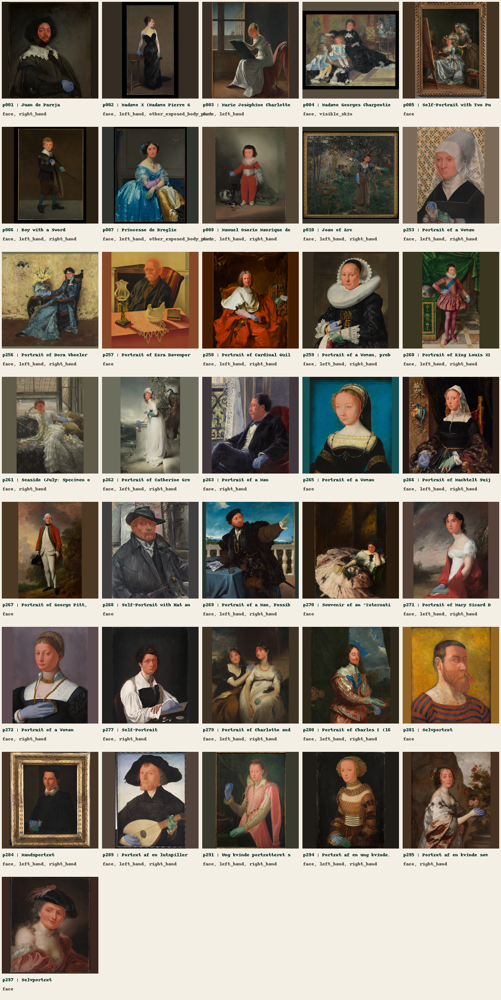

In [10]:
from IPython.display import (
    Image as IPythonImage,
    display,
)
from PIL import Image

annotation_worklist_df = pd.read_csv(
    annotation_worklist_path,
    low_memory=False,
    keep_default_na=False,
)

annotations_df = pd.read_csv(
    annotations_path,
    low_memory=False,
    keep_default_na=False,
)

(
    validated_annotations_df,
    annotation_errors,
) = (
    portrait_audit
    .validate_annotations(
        annotations_df,
        reviewed_screening_df,
        CONFIG,
        project_root=PROJECT_ROOT,
    )
)

pending_annotation_df = (
    annotation_worklist_df[
        annotation_worklist_df[
            "annotation_status"
        ]
        .astype(str)
        .eq(
            "pending_polygon_review"
        )
    ]
)

worklist_keys = set(
    zip(
        annotation_worklist_df[
            "painting_id"
        ].astype(str),
        annotation_worklist_df[
            "region_type"
        ].astype(str),
    )
)

annotation_keys = set(
    zip(
        validated_annotations_df[
            "painting_id"
        ].astype(str),
        validated_annotations_df[
            "region_type"
        ].astype(str),
    )
)

missing_annotation_keys = sorted(
    worklist_keys
    - annotation_keys
)

unexpected_annotation_keys = sorted(
    annotation_keys
    - worklist_keys
)

approved_annotations_df = (
    validated_annotations_df[
        validated_annotations_df[
            "review_status"
        ]
        .astype(str)
        .isin(
            {
                "approved",
                "approved_with_ambiguity",
            }
        )
    ]
)

excluded_annotations_df = (
    validated_annotations_df[
        validated_annotations_df[
            "review_status"
        ]
        .astype(str)
        .eq("excluded")
    ]
)

nonpositive_approved_ids = (
    approved_annotations_df[
        approved_annotations_df[
            "visible_pixel_count"
        ]
        .astype(int)
        .le(0)
    ][
        "annotation_id"
    ]
    .astype(str)
    .tolist()
)

BATCH_3_ANNOTATION_VALIDATION = (
    ValidationCollector()
)

BATCH_3_ANNOTATION_VALIDATION.add(
    validation_stage=(
        "batch_3_anatomical_annotation"
    ),
    check_id=(
        "polygon_worklist_complete"
    ),
    check_description=(
        "Every screened anatomical region "
        "has been completed or explicitly excluded."
    ),
    severity="blocking",
    expected=0,
    observed=len(
        pending_annotation_df
    ),
    passed=pending_annotation_df.empty,
    details=(
        pending_annotation_df[
            [
                "painting_id",
                "region_type",
            ]
        ]
        .to_dict("records")
    ),
)

BATCH_3_ANNOTATION_VALIDATION.add(
    validation_stage=(
        "batch_3_anatomical_annotation"
    ),
    check_id=(
        "annotation_contract_valid"
    ),
    check_description=(
        "Annotations have valid geometry, "
        "identifiers, regions, pixel counts, "
        "and painting-content bounds."
    ),
    severity="blocking",
    expected=[],
    observed=annotation_errors,
    passed=not annotation_errors,
)

BATCH_3_ANNOTATION_VALIDATION.add(
    validation_stage=(
        "batch_3_anatomical_annotation"
    ),
    check_id=(
        "all_worklist_regions_accounted_for"
    ),
    check_description=(
        "Every worklist painting-region pair "
        "has a corresponding annotation decision."
    ),
    severity="blocking",
    expected=[],
    observed=missing_annotation_keys,
    passed=not missing_annotation_keys,
)

BATCH_3_ANNOTATION_VALIDATION.add(
    validation_stage=(
        "batch_3_anatomical_annotation"
    ),
    check_id=(
        "no_unexpected_annotation_regions"
    ),
    check_description=(
        "No annotation exists outside the "
        "screened anatomical worklist."
    ),
    severity="blocking",
    expected=[],
    observed=unexpected_annotation_keys,
    passed=not unexpected_annotation_keys,
)

BATCH_3_ANNOTATION_VALIDATION.add(
    validation_stage=(
        "batch_3_anatomical_annotation"
    ),
    check_id=(
        "approved_polygons_have_pixels"
    ),
    check_description=(
        "Every approved polygon rasterizes "
        "to a non-empty anatomical region."
    ),
    severity="blocking",
    expected=[],
    observed=nonpositive_approved_ids,
    passed=not nonpositive_approved_ids,
)

BATCH_3_ANNOTATION_VALIDATION.add(
    validation_stage=(
        "batch_3_anatomical_annotation"
    ),
    check_id=(
        "approved_annotation_population_nonempty"
    ),
    check_description=(
        "The reviewed population retains "
        "approved anatomical polygons."
    ),
    severity="blocking",
    expected="greater_than_zero",
    observed=len(
        approved_annotations_df
    ),
    passed=(
        len(
            approved_annotations_df
        )
        > 0
    ),
)

BATCH_3_ANNOTATION_VALIDATION.raise_for_blocking()

write_csv_atomic_retry(
    validated_annotations_df,
    annotations_path,
)

annotation_qa_path = (
    portrait_audit
    .create_annotation_qa_atlas(
        reviewed_screening_df,
        validated_annotations_df,
        OUTPUTS[
            "annotation_qa_path"
        ],
        project_root=PROJECT_ROOT,
    )
)

with Image.open(
    annotation_qa_path
) as annotation_qa_image:
    annotation_qa_image.verify()

with Image.open(
    annotation_qa_path
) as annotation_qa_image:
    annotation_qa_metadata = {
        "format": (
            annotation_qa_image.format
        ),
        "mode": (
            annotation_qa_image.mode
        ),
        "width": (
            annotation_qa_image.width
        ),
        "height": (
            annotation_qa_image.height
        ),
        "size_bytes": (
            annotation_qa_path
            .stat()
            .st_size
        ),
        "sha256": sha256_file(
            annotation_qa_path
        ),
    }

annotation_region_summary_df = (
    validated_annotations_df
    .groupby(
        [
            "region_type",
            "review_status",
        ],
        dropna=False,
    )
    .agg(
        annotation_rows=(
            "annotation_id",
            "size",
        ),
        painting_count=(
            "painting_id",
            "nunique",
        ),
        visible_pixels=(
            "visible_pixel_count",
            "sum",
        ),
    )
    .reset_index()
    .sort_values(
        [
            "region_type",
            "review_status",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

batch_3_annotation_validation_df = (
    BATCH_3_ANNOTATION_VALIDATION
    .to_dataframe()
)

print(
    "D02 anatomical annotation passed."
)
print(
    "Worklist regions:",
    len(annotation_worklist_df),
)
print(
    "Annotation rows:",
    len(
        validated_annotations_df
    ),
)
print(
    "Approved polygons:",
    len(
        approved_annotations_df
    ),
)
print(
    "Explicitly excluded regions:",
    len(
        excluded_annotations_df
    ),
)
print(
    "Annotated paintings:",
    approved_annotations_df[
        "painting_id"
    ].nunique(),
)
print(
    "Annotation QA figure:",
    annotation_qa_path,
)
print(
    "Annotation QA metadata:",
    annotation_qa_metadata,
)

display(
    annotation_region_summary_df
)

display(
    batch_3_annotation_validation_df
)

display(
    IPythonImage(
        filename=str(
            annotation_qa_path
        ),
        width=1100,
    )
)

In [11]:
# ---------------------------------------------------------------------------
# Targeted visual-QA corrections for Batch 3B
# ---------------------------------------------------------------------------

HAND_REGION_COLUMNS = {
    "left_hand": "visible_left_hand",
    "right_hand": "visible_right_hand",
}

# These paintings contain clearly visible, usable hands that were
# missed during the initial outcome-blind screening.
HAND_REGION_ADDITIONS = {
    "p006": ("left_hand", "right_hand"),
    "p008": ("left_hand", "right_hand"),
    "p253": ("left_hand", "right_hand"),
    "p258": ("left_hand", "right_hand"),
    "p259": ("left_hand", "right_hand"),
    "p262": ("left_hand", "right_hand"),
    "p280": ("left_hand", "right_hand"),
    "p284": ("left_hand", "right_hand"),
    "p289": ("left_hand", "right_hand"),
    "p294": ("left_hand", "right_hand"),
}

# These existing polygons require redrawing after enlarged visual QA.
# Hand polygons must stop at the wrist and exclude the forearm.
# The two face polygons must exclude scalp hair, headwear, and background.
QA_RESET_REGIONS = [
    ("p001", "face"),
    ("p253", "face"),
    ("p002", "left_hand"),
    ("p002", "right_hand"),
    ("p003", "left_hand"),
    ("p004", "left_hand"),
    ("p004", "right_hand"),
    ("p005", "left_hand"),
    ("p007", "left_hand"),
    ("p010", "left_hand"),
    ("p010", "right_hand"),
    ("p261", "right_hand"),
    ("p279", "left_hand"),
    ("p279", "right_hand"),
    ("p295", "right_hand"),
]

reviewed_screening_df = pd.read_csv(
    OUTPUTS[
        "portrait_screening_path"
    ],
    low_memory=False,
    keep_default_na=False,
)

annotation_worklist_df = pd.read_csv(
    annotation_worklist_path,
    low_memory=False,
    keep_default_na=False,
)

annotations_df = pd.read_csv(
    annotations_path,
    low_memory=False,
    keep_default_na=False,
)

screening_ids = set(
    reviewed_screening_df[
        "painting_id"
    ].astype(str)
)

unknown_addition_ids = sorted(
    set(HAND_REGION_ADDITIONS)
    - screening_ids
)

if unknown_addition_ids:
    raise ValueError(
        "Unknown hand-addition painting IDs: "
        f"{unknown_addition_ids}"
    )

# Update the reviewed screening record.
for painting_id, region_types in (
    HAND_REGION_ADDITIONS.items()
):
    painting_match = (
        reviewed_screening_df[
            "painting_id"
        ]
        .astype(str)
        .eq(painting_id)
    )

    if not painting_match.any():
        raise ValueError(
            "Missing screening row for "
            f"{painting_id}"
        )

    reviewed_screening_df.loc[
        painting_match,
        "screening_status",
    ] = "included"

    for region_type in region_types:
        reviewed_screening_df.loc[
            painting_match,
            HAND_REGION_COLUMNS[
                region_type
            ],
        ] = True

    existing_note = str(
        reviewed_screening_df.loc[
            painting_match,
            "screening_notes",
        ].iloc[0]
    ).strip()

    qa_note = (
        "Enlarged visual QA confirmed "
        "clearly visible usable hands."
    )

    reviewed_screening_df.loc[
        painting_match,
        "screening_notes",
    ] = (
        f"{existing_note} | {qa_note}"
        if existing_note
        else qa_note
    )

screening_errors = (
    portrait_audit
    .validate_portrait_screening(
        reviewed_screening_df,
        CONFIG,
        require_reviewed=True,
    )
)

if screening_errors:
    raise RuntimeError(
        "Corrected screening failed validation: "
        f"{screening_errors}"
    )

write_csv_atomic_retry(
    reviewed_screening_df,
    OUTPUTS[
        "portrait_screening_path"
    ],
)

# Add the newly declared hand regions to the worklist.
existing_worklist_keys = set(
    zip(
        annotation_worklist_df[
            "painting_id"
        ].astype(str),
        annotation_worklist_df[
            "region_type"
        ].astype(str),
    )
)

new_worklist_rows = []

for painting_id, region_types in (
    HAND_REGION_ADDITIONS.items()
):
    screening_row = (
        reviewed_screening_df[
            reviewed_screening_df[
                "painting_id"
            ]
            .astype(str)
            .eq(painting_id)
        ]
        .iloc[0]
    )

    for region_type in region_types:
        key = (
            painting_id,
            region_type,
        )

        if key in existing_worklist_keys:
            continue

        new_worklist_rows.append(
            {
                "painting_id": painting_id,
                "title": str(
                    screening_row["title"]
                ),
                "region_type": region_type,
                "clean_image_path": str(
                    screening_row[
                        "clean_image_path"
                    ]
                ),
                "preliminary_shortlist": (
                    as_review_boolean(
                        screening_row[
                            "preliminary_shortlist"
                        ]
                    )
                ),
                "preliminary_shortlist_families": str(
                    screening_row[
                        "preliminary_shortlist_families"
                    ]
                ),
                "annotation_status": (
                    "pending_polygon_review"
                ),
            }
        )

if new_worklist_rows:
    annotation_worklist_df = pd.concat(
        [
            annotation_worklist_df,
            pd.DataFrame(
                new_worklist_rows
            ),
        ],
        ignore_index=True,
    )

# Remove only the polygons that failed enlarged visual QA and
# return their worklist pairs to pending status.
for painting_id, region_type in (
    QA_RESET_REGIONS
):
    worklist_match = (
        annotation_worklist_df[
            "painting_id"
        ]
        .astype(str)
        .eq(painting_id)
        & annotation_worklist_df[
            "region_type"
        ]
        .astype(str)
        .eq(region_type)
    )

    if not worklist_match.any():
        raise ValueError(
            "QA reset pair is absent from "
            "the annotation worklist: "
            f"{painting_id}, {region_type}"
        )

    annotation_worklist_df.loc[
        worklist_match,
        "annotation_status",
    ] = "pending_polygon_review"

    keep_annotation = ~(
        annotations_df[
            "painting_id"
        ]
        .astype(str)
        .eq(painting_id)
        & annotations_df[
            "region_type"
        ]
        .astype(str)
        .eq(region_type)
    )

    annotations_df = (
        annotations_df.loc[
            keep_annotation
        ]
        .reset_index(drop=True)
    )

annotation_worklist_df = (
    annotation_worklist_df
    .sort_values(
        [
            "painting_id",
            "region_type",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

write_csv_atomic_retry(
    annotation_worklist_df,
    annotation_worklist_path,
)

write_csv_atomic_retry(
    annotations_df,
    annotations_path,
)

pending_after_qa = (
    annotation_worklist_df[
        annotation_worklist_df[
            "annotation_status"
        ]
        .astype(str)
        .eq(
            "pending_polygon_review"
        )
    ]
)

print(
    "Targeted annotation corrections staged."
)
print(
    "Expanded worklist regions:",
    len(annotation_worklist_df),
)
print(
    "Pending regions to annotate:",
    len(pending_after_qa),
)
print(
    "Retained annotation polygons:",
    len(annotations_df),
)

display(
    pending_after_qa[
        [
            "painting_id",
            "title",
            "region_type",
        ]
    ]
)

Targeted annotation corrections staged.
Expanded worklist regions: 89
Pending regions to annotate: 15
Retained annotation polygons: 76


,painting_id,title,region_type
0,p001,Juan de Pareja,face
3,p002,Madame X (Madame Pierre Gautreau),left_hand
5,p002,Madame X (Madame Pierre Gautreau),right_hand
8,p003,Marie Joséphine Charlotte du Val d'Ognes,left_hand
10,p004,Madame Georges Charpentier and Her Children,left_hand
11,p004,Madame Georges Charpentier and Her Children,right_hand
14,p005,Self-Portrait with Two Pupils,left_hand
19,p007,Princesse de Broglie,left_hand
25,p010,Joan of Arc,left_hand
26,p010,Joan of Arc,right_hand


In [12]:
# ---------------------------------------------------------------------------
# Normalize assisted-proposal regions for deterministic reruns
# ---------------------------------------------------------------------------
# This makes the correction/proposal sequence idempotent. Every governed
# assisted region is returned to pending before the fixed proposal polygons
# are reconstructed in the following cell.

assisted_proposal_regions = {
    (
        str(painting_id),
        str(region_type),
    )
    for painting_id, region_type in (
        QA_RESET_REGIONS
    )
}

assisted_proposal_regions.update(
    {
        (
            str(painting_id),
            str(region_type),
        )
        for painting_id, region_types in (
            HAND_REGION_ADDITIONS.items()
        )
        for region_type in region_types
    }
)

if len(assisted_proposal_regions) != 35:
    raise RuntimeError(
        "Expected exactly 35 governed assisted "
        "painting-region decisions, observed "
        f"{len(assisted_proposal_regions)}."
    )

annotation_worklist_df = pd.read_csv(
    annotation_worklist_path,
    low_memory=False,
    keep_default_na=False,
)

annotations_df = pd.read_csv(
    annotations_path,
    low_memory=False,
    keep_default_na=False,
)

known_worklist_regions = set(
    zip(
        annotation_worklist_df[
            "painting_id"
        ].astype(str),
        annotation_worklist_df[
            "region_type"
        ].astype(str),
    )
)

missing_governed_regions = sorted(
    assisted_proposal_regions
    - known_worklist_regions
)

if missing_governed_regions:
    raise RuntimeError(
        "Assisted proposal regions are absent "
        "from the worklist: "
        f"{missing_governed_regions}"
    )

annotation_region_keys = pd.Series(
    list(
        zip(
            annotations_df[
                "painting_id"
            ].astype(str),
            annotations_df[
                "region_type"
            ].astype(str),
        )
    ),
    index=annotations_df.index,
)

remove_annotation_mask = (
    annotation_region_keys
    .isin(assisted_proposal_regions)
)

removed_annotation_rows = int(
    remove_annotation_mask.sum()
)

annotations_df = (
    annotations_df.loc[
        ~remove_annotation_mask
    ]
    .reset_index(drop=True)
)

for painting_id, region_type in sorted(
    assisted_proposal_regions
):
    worklist_match = (
        annotation_worklist_df[
            "painting_id"
        ]
        .astype(str)
        .eq(painting_id)
        & annotation_worklist_df[
            "region_type"
        ]
        .astype(str)
        .eq(region_type)
    )

    annotation_worklist_df.loc[
        worklist_match,
        "annotation_status",
    ] = "pending_polygon_review"

write_csv_atomic_retry(
    annotations_df,
    annotations_path,
)

write_csv_atomic_retry(
    annotation_worklist_df,
    annotation_worklist_path,
)

pending_assisted_regions = set(
    zip(
        annotation_worklist_df.loc[
            annotation_worklist_df[
                "annotation_status"
            ]
            .astype(str)
            .eq("pending_polygon_review"),
            "painting_id",
        ].astype(str),
        annotation_worklist_df.loc[
            annotation_worklist_df[
                "annotation_status"
            ]
            .astype(str)
            .eq("pending_polygon_review"),
            "region_type",
        ].astype(str),
    )
)

if (
    pending_assisted_regions
    != assisted_proposal_regions
):
    raise RuntimeError(
        "Rerun normalization produced an "
        "unexpected pending worklist. "
        f"Missing={sorted(assisted_proposal_regions - pending_assisted_regions)}; "
        f"unexpected={sorted(pending_assisted_regions - assisted_proposal_regions)}"
    )

print(
    "Assisted-proposal rerun state normalized."
)
print(
    "Governed pending regions:",
    len(pending_assisted_regions),
)
print(
    "Existing rows removed:",
    removed_annotation_rows,
)
print(
    "Retained canonical annotation rows:",
    len(annotations_df),
)

Assisted-proposal rerun state normalized.
Governed pending regions: 35
Existing rows removed: 20
Retained canonical annotation rows: 56


Assisted annotation proposal staged.
Pending regions covered: 35
Proposed polygon rows: 32
Proposed exclusions: 3
Canonical annotation file unchanged: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\d02_portrait_skin_tone_and_hand_restoration_audit\data\anatomical_annotations.csv
Proposal annotation file: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\d02_portrait_skin_tone_and_hand_restoration_audit\work\anatomical_annotations_proposed.csv
Proposal worklist file: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\d02_portrait_skin_tone_and_hand_restoration_audit\work\anatomical_annotation_worklist_proposed.csv
Focused proposal QA: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\d02_portrait_skin_tone_and_hand_restoration_audit\work\anatomical_annotation_qa_proposed.png


,region_type,review_status,annotation_rows,painting_count
0,face,approved,2,2
1,left_hand,approved_with_ambiguity,15,15
2,left_hand,excluded,2,2
3,right_hand,approved_with_ambiguity,15,15
4,right_hand,excluded,1,1


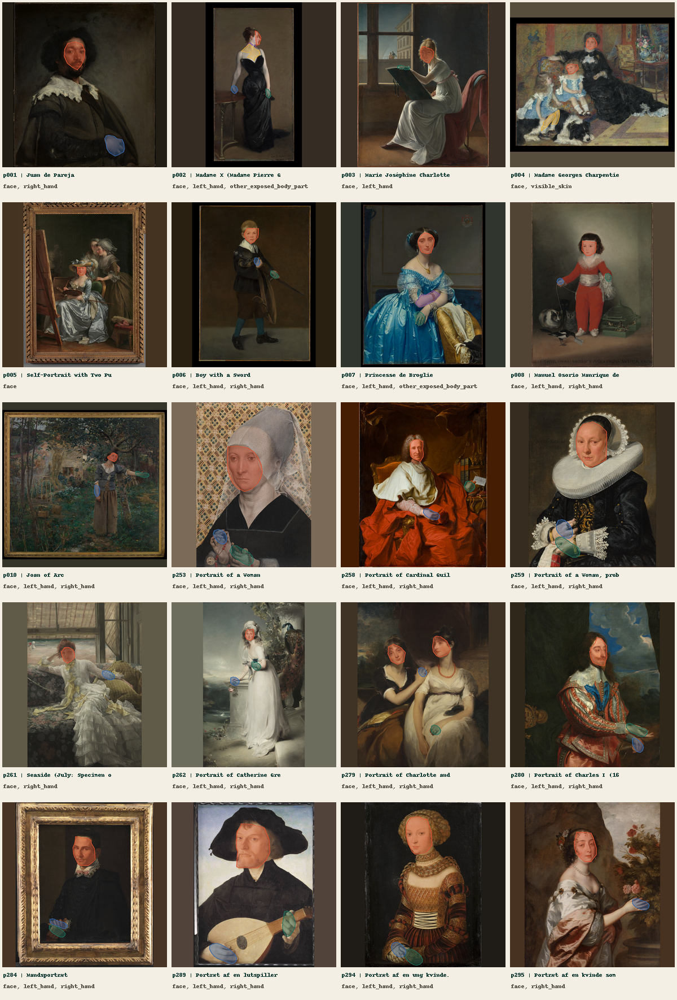

In [13]:
# ---------------------------------------------------------------------------
# Outcome-blind assisted polygon proposals
# ---------------------------------------------------------------------------
# This cell stages manually constructed proposals for visual confirmation.
# It does not overwrite the canonical annotation or worklist CSVs.

import hashlib

from IPython.display import (
    Image as IPythonImage,
    display,
)

PROPOSED_POLYGONS = {
    ("p001", "face"): [
        [
            (304, 190), (340, 182), (373, 194),
            (386, 224), (382, 260), (370, 292),
            (350, 315), (325, 303), (302, 284),
            (287, 252), (289, 218),
        ],
    ],
    ("p002", "left_hand"): [
        [
            (438, 401), (451, 404), (460, 418),
            (464, 434), (456, 447), (444, 441),
            (439, 428),
        ],
    ],
    ("p002", "right_hand"): [
        [
            (280, 389), (293, 386), (304, 393),
            (309, 406), (305, 418), (295, 426),
            (283, 419), (276, 407),
        ],
    ],
    ("p003", "left_hand"): [
        [
            (263, 296), (276, 291), (289, 294),
            (300, 299), (317, 298), (323, 305),
            (317, 314), (303, 315), (289, 311),
            (275, 310), (263, 306),
        ],
    ],
    ("p006", "left_hand"): [
        [
            (462, 317), (476, 320), (490, 330),
            (500, 342), (495, 353), (481, 355),
            (469, 347), (460, 336),
        ],
    ],
    ("p006", "right_hand"): [
        [
            (389, 256), (401, 258), (410, 268),
            (413, 281), (407, 293), (397, 296),
            (388, 286), (383, 273),
        ],
    ],
    ("p007", "left_hand"): [
        [
            (348, 512), (360, 507), (375, 511),
            (387, 522), (393, 537), (390, 552),
            (383, 566), (370, 574), (357, 570),
            (348, 558), (344, 541), (345, 525),
        ],
    ],
    ("p008", "left_hand"): [
        [
            (445, 332), (458, 329), (470, 338),
            (474, 350), (468, 363), (458, 370),
            (449, 365), (443, 352),
        ],
    ],
    ("p008", "right_hand"): [
        [
            (221, 357), (232, 351), (243, 355),
            (250, 366), (247, 377), (237, 383),
            (225, 380), (217, 370),
        ],
    ],
    ("p010", "left_hand"): [
        [
            (622, 319), (636, 321), (650, 328),
            (671, 327), (684, 333), (685, 343),
            (675, 351), (657, 350), (642, 345),
            (629, 342), (619, 334),
        ],
    ],
    ("p010", "right_hand"): [
        [
            (429, 387), (440, 384), (449, 390),
            (455, 401), (455, 418), (451, 433),
            (443, 440), (434, 435), (428, 421),
        ],
    ],
    ("p253", "face"): [
        [
            (261, 205), (307, 202), (354, 210),
            (385, 230), (405, 257), (419, 291),
            (424, 324), (416, 354), (401, 379),
            (374, 404), (340, 416), (309, 402),
            (286, 379), (270, 348), (260, 309),
            (258, 262),
        ],
    ],
    ("p253", "right_hand"): [
        [
            (198, 596), (217, 590), (236, 595),
            (249, 606), (258, 624), (258, 645),
            (247, 660), (231, 660), (215, 650),
            (201, 631), (192, 613),
        ],
    ],
    ("p253", "left_hand"): [
        [
            (282, 665), (303, 666), (322, 678),
            (343, 687), (363, 699), (378, 716),
            (383, 736), (376, 752), (359, 760),
            (337, 752), (318, 740), (299, 728),
            (281, 711), (270, 692),
        ],
    ],
    ("p258", "left_hand"): [
        [
            (582, 368), (596, 365), (612, 373),
            (624, 383), (625, 397), (617, 410),
            (603, 419), (590, 416), (579, 405),
            (573, 391),
        ],
    ],
    ("p258", "right_hand"): [
        [
            (386, 497), (402, 493), (419, 499),
            (435, 508), (450, 513), (462, 526),
            (459, 540), (446, 548), (428, 547),
            (410, 539), (394, 528), (383, 514),
        ],
    ],
    ("p259", "right_hand"): [
        [
            (224, 548), (241, 544), (257, 549),
            (271, 561), (282, 575), (291, 594),
            (294, 612), (287, 627), (273, 635),
            (255, 632), (239, 622), (225, 609),
            (215, 592), (214, 570),
        ],
    ],
    ("p259", "left_hand"): [
        [
            (213, 632), (230, 625), (248, 629),
            (266, 640), (282, 652), (302, 664),
            (320, 678), (327, 696), (324, 711),
            (311, 722), (292, 722), (273, 713),
            (255, 702), (237, 690), (221, 675),
            (210, 655),
        ],
    ],
    ("p261", "right_hand"): [
        [
            (466, 319), (482, 316), (497, 320),
            (510, 327), (522, 337), (525, 348),
            (519, 358), (506, 363), (492, 360),
            (480, 353), (470, 345), (464, 333),
        ],
    ],
    ("p262", "right_hand"): [
        [
            (275, 350), (287, 346), (300, 349),
            (311, 356), (317, 366), (315, 378),
            (306, 387), (293, 389), (281, 383),
            (273, 372),
        ],
    ],
    ("p262", "left_hand"): [
        [
            (373, 277), (386, 274), (399, 279),
            (411, 287), (418, 298), (415, 310),
            (404, 318), (392, 316), (381, 309),
            (373, 297),
        ],
    ],
    ("p279", "left_hand"): [
        [
            (423, 574), (436, 569), (449, 574),
            (461, 584), (467, 597), (463, 609),
            (451, 618), (437, 616), (425, 607),
            (418, 594),
        ],
    ],
    ("p279", "right_hand"): [
        [
            (363, 307), (374, 302), (386, 305),
            (397, 315), (402, 328), (398, 340),
            (388, 348), (376, 346), (367, 337),
            (360, 323),
        ],
    ],
    ("p280", "left_hand"): [
        [
            (543, 565), (557, 561), (574, 568),
            (590, 577), (608, 582), (628, 588),
            (641, 599), (640, 612), (631, 623),
            (616, 627), (599, 622), (583, 614),
            (566, 608), (550, 597), (541, 582),
        ],
    ],
    ("p280", "right_hand"): [
        [
            (568, 633), (581, 630), (594, 637),
            (607, 648), (619, 661), (623, 676),
            (618, 691), (607, 700), (595, 698),
            (585, 690), (578, 678), (571, 666),
        ],
    ],
    ("p284", "left_hand"): [
        [
            (218, 573), (231, 567), (245, 570),
            (258, 579), (271, 588), (283, 597),
            (294, 609), (293, 620), (282, 629),
            (268, 628), (254, 621), (241, 613),
            (228, 603), (218, 590),
        ],
    ],
    ("p284", "right_hand"): [
        [
            (220, 544), (233, 540), (246, 544),
            (257, 550), (270, 554), (286, 557),
            (299, 565), (305, 575), (300, 585),
            (288, 590), (274, 586), (261, 579),
            (248, 574), (234, 570), (222, 561),
        ],
    ],
    ("p289", "left_hand"): [
        [
            (525, 507), (540, 504), (554, 511),
            (565, 524), (573, 541), (578, 559),
            (576, 580), (568, 599), (557, 616),
            (545, 626), (533, 623), (525, 612),
            (519, 597), (516, 579), (517, 560),
            (520, 540),
        ],
    ],
    ("p289", "right_hand"): [
        [
            (177, 666), (193, 657), (211, 655),
            (229, 660), (247, 670), (265, 680),
            (283, 694), (299, 710), (305, 728),
            (300, 743), (286, 751), (268, 749),
            (250, 742), (232, 735), (214, 728),
            (197, 716), (184, 700), (176, 683),
        ],
    ],
    ("p294", "left_hand"): [
        [
            (300, 689), (315, 681), (331, 683),
            (347, 691), (361, 701), (374, 714),
            (382, 730), (380, 744), (370, 755),
            (354, 760), (337, 756), (323, 748),
            (311, 738), (301, 724), (296, 706),
        ],
    ],
    ("p294", "right_hand"): [
        [
            (239, 657), (252, 650), (266, 651),
            (279, 658), (290, 667), (301, 681),
            (305, 697), (300, 711), (289, 721),
            (274, 722), (260, 715), (248, 705),
            (239, 691), (234, 674),
        ],
    ],
    ("p295", "right_hand"): [
        [
            (570, 452), (584, 447), (600, 449),
            (616, 456), (632, 461), (645, 469),
            (650, 480), (646, 492), (635, 501),
            (620, 502), (605, 497), (591, 491),
            (579, 484), (570, 472),
        ],
    ],
}

PROPOSED_EXCLUSIONS = {
    ("p004", "left_hand"),
    ("p004", "right_hand"),
    ("p005", "left_hand"),
}

MODERATE_AMBIGUITY_KEYS = {
    ("p279", "left_hand"),
    ("p279", "right_hand"),
    ("p284", "left_hand"),
    ("p284", "right_hand"),
    ("p294", "left_hand"),
    ("p294", "right_hand"),
}

proposal_annotations_path = (
    WORK_ROOT
    / "anatomical_annotations_proposed.csv"
)

proposal_worklist_path = (
    WORK_ROOT
    / "anatomical_annotation_worklist_proposed.csv"
)

proposal_qa_path = (
    WORK_ROOT
    / "anatomical_annotation_qa_proposed.png"
)

reviewed_screening_df = pd.read_csv(
    OUTPUTS["portrait_screening_path"],
    low_memory=False,
    keep_default_na=False,
)

canonical_annotations_df = pd.read_csv(
    annotations_path,
    low_memory=False,
    keep_default_na=False,
)

canonical_worklist_df = pd.read_csv(
    annotation_worklist_path,
    low_memory=False,
    keep_default_na=False,
)

pending_key_set = set(
    zip(
        canonical_worklist_df.loc[
            canonical_worklist_df[
                "annotation_status"
            ]
            .astype(str)
            .eq("pending_polygon_review"),
            "painting_id",
        ].astype(str),
        canonical_worklist_df.loc[
            canonical_worklist_df[
                "annotation_status"
            ]
            .astype(str)
            .eq("pending_polygon_review"),
            "region_type",
        ].astype(str),
    )
)

proposal_key_set = (
    set(PROPOSED_POLYGONS)
    | PROPOSED_EXCLUSIONS
)

if proposal_key_set != pending_key_set:
    raise RuntimeError(
        "Proposal coverage does not exactly match "
        "the pending annotation worklist. "
        f"Missing proposals={sorted(pending_key_set - proposal_key_set)}; "
        f"unexpected proposals={sorted(proposal_key_set - pending_key_set)}"
    )

canonical_key_set = set(
    zip(
        canonical_annotations_df[
            "painting_id"
        ].astype(str),
        canonical_annotations_df[
            "region_type"
        ].astype(str),
    )
)

unexpected_existing_keys = sorted(
    canonical_key_set
    & proposal_key_set
)

if unexpected_existing_keys:
    raise RuntimeError(
        "Canonical annotations unexpectedly still contain "
        "pending proposal regions: "
        f"{unexpected_existing_keys}"
    )


def proposal_annotation_id(
    painting_id,
    region_type,
    polygon_number,
):
    payload = (
        f"d02-assisted-v1|{painting_id}|"
        f"{region_type}|{polygon_number}"
    )

    digest = hashlib.sha256(
        payload.encode("utf-8")
    ).hexdigest()[:20]

    return f"anatomy_{digest}"


proposal_rows = []

for (
    painting_id,
    region_type,
), polygons in sorted(
    PROPOSED_POLYGONS.items()
):
    ambiguity_level = (
        "moderate"
        if (
            painting_id,
            region_type,
        )
        in MODERATE_AMBIGUITY_KEYS
        else (
            "none"
            if region_type == "face"
            else "low"
        )
    )

    occlusion_status = (
        "partial"
        if ambiguity_level == "moderate"
        else "none"
    )

    review_status = (
        "approved_with_ambiguity"
        if ambiguity_level != "none"
        else "approved"
    )

    for polygon_number, polygon in enumerate(
        polygons,
        start=1,
    ):
        proposal_rows.append(
            {
                "annotation_id": (
                    proposal_annotation_id(
                        painting_id,
                        region_type,
                        polygon_number,
                    )
                ),
                "painting_id": painting_id,
                "region_type": region_type,
                "polygon_json": json.dumps(
                    polygon,
                    separators=(",", ":"),
                ),
                "binary_mask_path": "",
                "visible_pixel_count": 0,
                "ambiguity_level": ambiguity_level,
                "occlusion_status": occlusion_status,
                "annotator": (
                    "Codex-assisted "
                    "outcome-blind proposal"
                ),
                "reviewer": "",
                "review_status": review_status,
                "notes": (
                    "Outcome-blind assisted polygon "
                    "proposal pending visual reviewer "
                    "confirmation."
                ),
                "schema_version": (
                    "portrait_anatomy_annotations.v1"
                ),
            }
        )

for painting_id, region_type in sorted(
    PROPOSED_EXCLUSIONS
):
    proposal_rows.append(
        {
            "annotation_id": (
                proposal_annotation_id(
                    painting_id,
                    region_type,
                    0,
                )
            ),
            "painting_id": painting_id,
            "region_type": region_type,
            "polygon_json": "",
            "binary_mask_path": "",
            "visible_pixel_count": 0,
            "ambiguity_level": "high",
            "occlusion_status": "partial",
            "annotator": (
                "Codex-assisted "
                "outcome-blind proposal"
            ),
            "reviewer": "",
            "review_status": "excluded",
            "notes": (
                "Multiple overlapping subjects make "
                "reliable hand ownership and boundary "
                "assignment unsuitable for the controlled "
                "hand-region audit."
            ),
            "schema_version": (
                "portrait_anatomy_annotations.v1"
            ),
        }
    )

proposal_rows_df = pd.DataFrame(
    proposal_rows,
    columns=portrait_audit.ANNOTATION_COLUMNS,
)

proposed_annotations_df = pd.concat(
    [
        canonical_annotations_df,
        proposal_rows_df,
    ],
    ignore_index=True,
)

proposed_annotations_df = (
    proposed_annotations_df
    .sort_values(
        [
            "painting_id",
            "region_type",
            "annotation_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

(
    proposed_annotations_df,
    proposal_validation_errors,
) = portrait_audit.validate_annotations(
    proposed_annotations_df,
    reviewed_screening_df,
    CONFIG,
    project_root=PROJECT_ROOT,
)

if proposal_validation_errors:
    raise RuntimeError(
        "Proposed annotations failed validation: "
        f"{proposal_validation_errors}"
    )

proposed_worklist_df = (
    canonical_worklist_df.copy()
)

for painting_id, region_type in sorted(
    proposal_key_set
):
    pair_match = (
        proposed_worklist_df[
            "painting_id"
        ]
        .astype(str)
        .eq(painting_id)
        & proposed_worklist_df[
            "region_type"
        ]
        .astype(str)
        .eq(region_type)
    )

    proposed_worklist_df.loc[
        pair_match,
        "annotation_status",
    ] = (
        "excluded"
        if (
            painting_id,
            region_type,
        )
        in PROPOSED_EXCLUSIONS
        else "completed"
    )

remaining_proposed_regions = (
    proposed_worklist_df[
        proposed_worklist_df[
            "annotation_status"
        ]
        .astype(str)
        .eq("pending_polygon_review")
    ]
)

if not remaining_proposed_regions.empty:
    raise RuntimeError(
        "The proposal still contains pending regions: "
        f"{remaining_proposed_regions[['painting_id', 'region_type']].to_dict('records')}"
    )

write_csv_atomic_retry(
    proposed_annotations_df,
    proposal_annotations_path,
)

write_csv_atomic_retry(
    proposed_worklist_df,
    proposal_worklist_path,
)

affected_painting_ids = sorted(
    {
        painting_id
        for painting_id, _ in proposal_key_set
    }
)

focused_screening_df = (
    reviewed_screening_df[
        reviewed_screening_df[
            "painting_id"
        ]
        .astype(str)
        .isin(affected_painting_ids)
    ]
    .copy()
)

portrait_audit.create_annotation_qa_atlas(
    focused_screening_df,
    proposed_annotations_df,
    proposal_qa_path,
    project_root=PROJECT_ROOT,
    columns=4,
    tile_size=300,
)

proposal_summary_df = (
    proposal_rows_df
    .groupby(
        [
            "region_type",
            "review_status",
        ],
        dropna=False,
    )
    .agg(
        annotation_rows=(
            "annotation_id",
            "size",
        ),
        painting_count=(
            "painting_id",
            "nunique",
        ),
    )
    .reset_index()
)

print("Assisted annotation proposal staged.")
print(
    "Pending regions covered:",
    len(proposal_key_set),
)
print(
    "Proposed polygon rows:",
    len(
        proposal_rows_df[
            proposal_rows_df[
                "review_status"
            ]
            .astype(str)
            .ne("excluded")
        ]
    ),
)
print(
    "Proposed exclusions:",
    len(PROPOSED_EXCLUSIONS),
)
print(
    "Canonical annotation file unchanged:",
    annotations_path,
)
print(
    "Proposal annotation file:",
    proposal_annotations_path,
)
print(
    "Proposal worklist file:",
    proposal_worklist_path,
)
print(
    "Focused proposal QA:",
    proposal_qa_path,
)

display(proposal_summary_df)

display(
    IPythonImage(
        filename=str(proposal_qa_path),
        width=1200,
    )
)

D02 reviewed anatomical annotations promoted.
Worklist regions: 89
Annotation rows: 91
Approved polygon rows: 88
Explicitly excluded regions: 3
Pending regions: 0
Reviewer-confirmed assisted decisions: 35
Canonical QA figure: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\d02_portrait_skin_tone_and_hand_restoration_audit\figures\anatomical_annotation_qa.png
Canonical QA metadata: {'format': 'PNG', 'mode': 'RGB', 'width': 1100, 'height': 2192, 'size_bytes': 2176739, 'sha256': 'eaf74c6d438932be1a11c5aebc292d9d0dfed8e985dd02d82d67625eb18f3a74'}


,region_type,review_status,annotation_rows,painting_count,visible_pixels
0,face,approved,38,36,497949
1,left_hand,approved,6,6,23749
2,left_hand,approved_with_ambiguity,15,15,42770
3,left_hand,excluded,2,2,0
4,other_exposed_body_part,approved,2,2,5280
5,right_hand,approved,10,10,74226
6,right_hand,approved_with_ambiguity,15,15,39389
7,right_hand,excluded,1,1,0
8,visible_skin,approved,2,2,6953


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_3_anatomical_annotation,polygon_worklist_complete,Every screened anatomical region has been comp...,blocking,0,0,True,[]
1,batch_3_anatomical_annotation,annotation_contract_valid,"Annotations have valid geometry, identifiers, ...",blocking,[],[],True,
2,batch_3_anatomical_annotation,all_worklist_regions_accounted_for,Every worklist painting-region pair has a corr...,blocking,[],[],True,
3,batch_3_anatomical_annotation,no_unexpected_annotation_regions,No annotation exists outside the screened anat...,blocking,[],[],True,
4,batch_3_anatomical_annotation,approved_polygons_have_pixels,Every approved polygon rasterizes to a non-emp...,blocking,[],[],True,
5,batch_3_anatomical_annotation,assisted_proposals_reviewer_confirmed,Every assisted proposal records the confirming...,blocking,35,35,True,


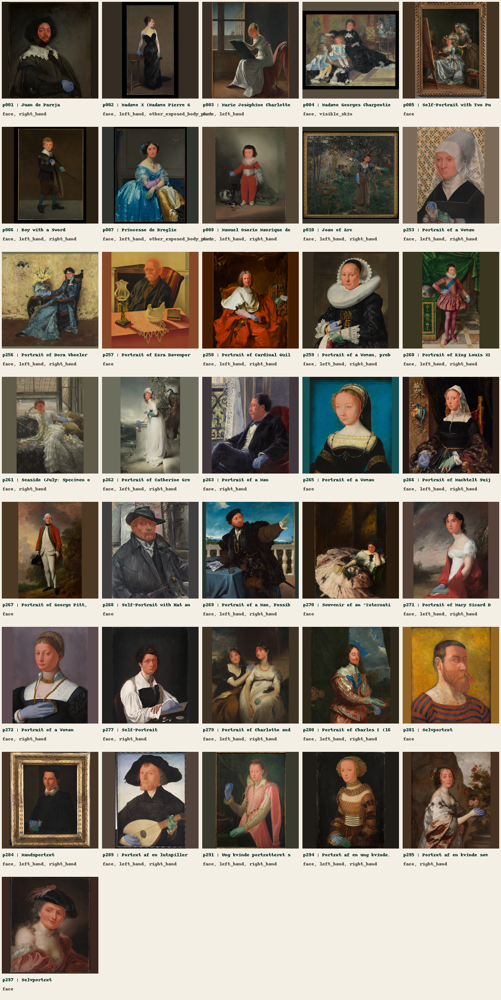

In [14]:
# ---------------------------------------------------------------------------
# Promote visually confirmed anatomical proposals
# ---------------------------------------------------------------------------

from IPython.display import (
    Image as IPythonImage,
    display,
)
from PIL import Image

proposal_annotations_path = (
    WORK_ROOT
    / "anatomical_annotations_proposed.csv"
)

proposal_worklist_path = (
    WORK_ROOT
    / "anatomical_annotation_worklist_proposed.csv"
)

if not proposal_annotations_path.is_file():
    raise FileNotFoundError(
        "Run the assisted proposal cell first: "
        f"{proposal_annotations_path}"
    )

if not proposal_worklist_path.is_file():
    raise FileNotFoundError(
        "Run the assisted proposal cell first: "
        f"{proposal_worklist_path}"
    )

reviewed_screening_df = pd.read_csv(
    OUTPUTS["portrait_screening_path"],
    low_memory=False,
    keep_default_na=False,
)

proposed_annotations_df = pd.read_csv(
    proposal_annotations_path,
    low_memory=False,
    keep_default_na=False,
)

proposed_worklist_df = pd.read_csv(
    proposal_worklist_path,
    low_memory=False,
    keep_default_na=False,
)

assisted_row_mask = (
    proposed_annotations_df[
        "annotator"
    ]
    .astype(str)
    .eq(
        "Codex-assisted outcome-blind proposal"
    )
)

assisted_row_count = int(
    assisted_row_mask.sum()
)

if assisted_row_count != 35:
    raise RuntimeError(
        "Expected exactly 35 assisted decisions, "
        f"observed {assisted_row_count}."
    )

proposed_annotations_df.loc[
    assisted_row_mask,
    "reviewer",
] = "Rahul Maddineni"

for index in proposed_annotations_df.index[
    assisted_row_mask
]:
    existing_note = str(
        proposed_annotations_df.loc[
            index,
            "notes",
        ]
    ).strip()

    confirmation_note = (
        "Visually inspected and confirmed "
        "by the named reviewer."
    )

    if confirmation_note not in existing_note:
        proposed_annotations_df.loc[
            index,
            "notes",
        ] = (
            f"{existing_note} {confirmation_note}"
            if existing_note
            else confirmation_note
        )

(
    validated_annotations_df,
    annotation_errors,
) = portrait_audit.validate_annotations(
    proposed_annotations_df,
    reviewed_screening_df,
    CONFIG,
    project_root=PROJECT_ROOT,
)

pending_annotation_df = (
    proposed_worklist_df[
        proposed_worklist_df[
            "annotation_status"
        ]
        .astype(str)
        .eq("pending_polygon_review")
    ]
)

worklist_keys = set(
    zip(
        proposed_worklist_df[
            "painting_id"
        ].astype(str),
        proposed_worklist_df[
            "region_type"
        ].astype(str),
    )
)

annotation_keys = set(
    zip(
        validated_annotations_df[
            "painting_id"
        ].astype(str),
        validated_annotations_df[
            "region_type"
        ].astype(str),
    )
)

missing_annotation_keys = sorted(
    worklist_keys
    - annotation_keys
)

unexpected_annotation_keys = sorted(
    annotation_keys
    - worklist_keys
)

approved_annotations_df = (
    validated_annotations_df[
        validated_annotations_df[
            "review_status"
        ]
        .astype(str)
        .isin(
            {
                "approved",
                "approved_with_ambiguity",
            }
        )
    ]
    .copy()
)

excluded_annotations_df = (
    validated_annotations_df[
        validated_annotations_df[
            "review_status"
        ]
        .astype(str)
        .eq("excluded")
    ]
    .copy()
)

nonpositive_approved_ids = (
    approved_annotations_df[
        approved_annotations_df[
            "visible_pixel_count"
        ]
        .astype(int)
        .le(0)
    ][
        "annotation_id"
    ]
    .astype(str)
    .tolist()
)

BATCH_3_ANNOTATION_VALIDATION = (
    ValidationCollector()
)

BATCH_3_ANNOTATION_VALIDATION.add(
    validation_stage=(
        "batch_3_anatomical_annotation"
    ),
    check_id="polygon_worklist_complete",
    check_description=(
        "Every screened anatomical region "
        "has been completed or explicitly excluded."
    ),
    severity="blocking",
    expected=0,
    observed=len(pending_annotation_df),
    passed=pending_annotation_df.empty,
    details=(
        pending_annotation_df[
            [
                "painting_id",
                "region_type",
            ]
        ]
        .to_dict("records")
    ),
)

BATCH_3_ANNOTATION_VALIDATION.add(
    validation_stage=(
        "batch_3_anatomical_annotation"
    ),
    check_id="annotation_contract_valid",
    check_description=(
        "Annotations have valid geometry, identifiers, "
        "regions, pixel counts and content bounds."
    ),
    severity="blocking",
    expected=[],
    observed=annotation_errors,
    passed=not annotation_errors,
)

BATCH_3_ANNOTATION_VALIDATION.add(
    validation_stage=(
        "batch_3_anatomical_annotation"
    ),
    check_id=(
        "all_worklist_regions_accounted_for"
    ),
    check_description=(
        "Every worklist painting-region pair has "
        "a corresponding annotation decision."
    ),
    severity="blocking",
    expected=[],
    observed=missing_annotation_keys,
    passed=not missing_annotation_keys,
)

BATCH_3_ANNOTATION_VALIDATION.add(
    validation_stage=(
        "batch_3_anatomical_annotation"
    ),
    check_id=(
        "no_unexpected_annotation_regions"
    ),
    check_description=(
        "No annotation exists outside the "
        "screened anatomical worklist."
    ),
    severity="blocking",
    expected=[],
    observed=unexpected_annotation_keys,
    passed=not unexpected_annotation_keys,
)

BATCH_3_ANNOTATION_VALIDATION.add(
    validation_stage=(
        "batch_3_anatomical_annotation"
    ),
    check_id="approved_polygons_have_pixels",
    check_description=(
        "Every approved polygon rasterizes "
        "to a non-empty anatomical region."
    ),
    severity="blocking",
    expected=[],
    observed=nonpositive_approved_ids,
    passed=not nonpositive_approved_ids,
)

BATCH_3_ANNOTATION_VALIDATION.add(
    validation_stage=(
        "batch_3_anatomical_annotation"
    ),
    check_id=(
        "assisted_proposals_reviewer_confirmed"
    ),
    check_description=(
        "Every assisted proposal records "
        "the confirming human reviewer."
    ),
    severity="blocking",
    expected=35,
    observed=int(
        (
            assisted_row_mask
            & proposed_annotations_df[
                "reviewer"
            ]
            .astype(str)
            .eq("Rahul Maddineni")
        ).sum()
    ),
    passed=(
        int(
            (
                assisted_row_mask
                & proposed_annotations_df[
                    "reviewer"
                ]
                .astype(str)
                .eq("Rahul Maddineni")
            ).sum()
        )
        == 35
    ),
)

BATCH_3_ANNOTATION_VALIDATION.raise_for_blocking()

# Promote only after every blocking check has passed.
write_csv_atomic_retry(
    validated_annotations_df,
    annotations_path,
)

write_csv_atomic_retry(
    proposed_worklist_df,
    annotation_worklist_path,
)

annotation_worklist_df = (
    proposed_worklist_df.copy()
)

annotations_df = (
    validated_annotations_df.copy()
)

annotation_qa_path = (
    portrait_audit
    .create_annotation_qa_atlas(
        reviewed_screening_df,
        validated_annotations_df,
        OUTPUTS["annotation_qa_path"],
        project_root=PROJECT_ROOT,
    )
)

with Image.open(
    annotation_qa_path
) as annotation_qa_image:
    annotation_qa_image.verify()

with Image.open(
    annotation_qa_path
) as annotation_qa_image:
    annotation_qa_metadata = {
        "format": annotation_qa_image.format,
        "mode": annotation_qa_image.mode,
        "width": annotation_qa_image.width,
        "height": annotation_qa_image.height,
        "size_bytes": (
            annotation_qa_path
            .stat()
            .st_size
        ),
        "sha256": sha256_file(
            annotation_qa_path
        ),
    }

annotation_region_summary_df = (
    validated_annotations_df
    .groupby(
        [
            "region_type",
            "review_status",
        ],
        dropna=False,
    )
    .agg(
        annotation_rows=(
            "annotation_id",
            "size",
        ),
        painting_count=(
            "painting_id",
            "nunique",
        ),
        visible_pixels=(
            "visible_pixel_count",
            "sum",
        ),
    )
    .reset_index()
    .sort_values(
        [
            "region_type",
            "review_status",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

batch_3_annotation_validation_df = (
    BATCH_3_ANNOTATION_VALIDATION
    .to_dataframe()
)

print(
    "D02 reviewed anatomical annotations promoted."
)
print(
    "Worklist regions:",
    len(annotation_worklist_df),
)
print(
    "Annotation rows:",
    len(validated_annotations_df),
)
print(
    "Approved polygon rows:",
    len(approved_annotations_df),
)
print(
    "Explicitly excluded regions:",
    len(excluded_annotations_df),
)
print(
    "Pending regions:",
    len(pending_annotation_df),
)
print(
    "Reviewer-confirmed assisted decisions:",
    assisted_row_count,
)
print(
    "Canonical QA figure:",
    annotation_qa_path,
)
print(
    "Canonical QA metadata:",
    annotation_qa_metadata,
)

display(annotation_region_summary_df)
display(batch_3_annotation_validation_df)

display(
    IPythonImage(
        filename=str(annotation_qa_path),
        width=1200,
    )
)

## Batch 4 — Anatomical overlap audit and hard feasibility decision

This batch remains outcome-blind. It measures intersections between the reviewed anatomical regions and saved damage/effect masks without loading restorations or performance metrics.

The primary hand-study gate uses canonical, damage-size, and mask-robustness cases. Procedural degradation overlap is retained separately as supplementary evidence.

A usable hand case must:

- affect at least 256 annotated hand pixels;
- affect at least 5% of the annotated hand region;
- retain at least 256 damaged pixels outside the hand for a possible within-case control.

The hand study proceeds only if the retained population contains at least 12 paintings, 20 cases, and two damage families.

In [15]:
# ---------------------------------------------------------------------------
# Build the complete outcome-blind case population
# ---------------------------------------------------------------------------

import numpy as np

CASE_SOURCE_SPECS = [
    {
        "source_notebook": "04",
        "frame": canonical_cases_df,
        "mask_column": "mask_path",
        "family_column": "mask_type",
        "input_column": "damaged_image_path",
        "pixel_column": "mask_pixel_count",
        "evidence_role": "canonical_primary",
    },
    {
        "source_notebook": "05",
        "frame": damage_size_cases_df,
        "mask_column": "mask_or_effect_path",
        "family_column": "base_mask_type",
        "input_column": "input_image_path",
        "pixel_column": "realized_damage_pixels",
        "evidence_role": "focused_extension",
    },
    {
        "source_notebook": "06",
        "frame": robustness_cases_df,
        "mask_column": "mask_path",
        "family_column": "mask_type",
        "input_column": "damaged_image_path",
        "pixel_column": "realized_damage_pixels",
        "evidence_role": "focused_extension",
    },
    {
        "source_notebook": "07",
        "frame": degradation_cases_df,
        "mask_column": "effect_mask_path",
        "family_column": "degradation_family",
        "input_column": "degraded_image_path",
        "pixel_column": "affected_active_pixels",
        "evidence_role": (
            "supplementary_degradation"
        ),
    },
]

reviewed_screening_df = pd.read_csv(
    OUTPUTS["portrait_screening_path"],
    low_memory=False,
    keep_default_na=False,
)

validated_annotations_df = pd.read_csv(
    OUTPUTS["annotations_path"],
    low_memory=False,
    keep_default_na=False,
)

included_portrait_ids = set(
    reviewed_screening_df.loc[
        reviewed_screening_df[
            "screening_status"
        ]
        .astype(str)
        .eq("included"),
        "painting_id",
    ].astype(str)
)

case_population_frames = []

for source_spec in CASE_SOURCE_SPECS:
    source_frame = (
        source_spec["frame"].copy()
    )

    required_source_columns = {
        "painting_id",
        "case_id",
        "experiment_id",
        "clean_image_path",
        source_spec["mask_column"],
        source_spec["family_column"],
        source_spec["input_column"],
        source_spec["pixel_column"],
    }

    missing_source_columns = sorted(
        required_source_columns
        - set(source_frame.columns)
    )

    if missing_source_columns:
        raise RuntimeError(
            "D02 overlap source "
            f"{source_spec['source_notebook']} "
            "is missing columns: "
            f"{missing_source_columns}"
        )

    source_frame = (
        source_frame[
            source_frame[
                "painting_id"
            ]
            .astype(str)
            .isin(included_portrait_ids)
        ]
        .copy()
    )

    normalized_source_df = pd.DataFrame(
        {
            "painting_id": (
                source_frame[
                    "painting_id"
                ].astype(str)
            ),
            "case_id": (
                source_frame[
                    "case_id"
                ].astype(str)
            ),
            "experiment_id": (
                source_frame[
                    "experiment_id"
                ].astype(str)
            ),
            "damage_family": (
                source_frame[
                    source_spec[
                        "family_column"
                    ]
                ].astype(str)
            ),
            "mask_path": (
                source_frame[
                    source_spec[
                        "mask_column"
                    ]
                ].astype(str)
            ),
            "input_image_path": (
                source_frame[
                    source_spec[
                        "input_column"
                    ]
                ].astype(str)
            ),
            "clean_image_path": (
                source_frame[
                    "clean_image_path"
                ].astype(str)
            ),
            "declared_damage_pixel_count": (
                pd.to_numeric(
                    source_frame[
                        source_spec[
                            "pixel_column"
                        ]
                    ],
                    errors="coerce",
                )
                .fillna(0)
                .astype(int)
            ),
            "source_notebook": (
                source_spec[
                    "source_notebook"
                ]
            ),
            "evidence_role": (
                source_spec[
                    "evidence_role"
                ]
            ),
        }
    )

    case_population_frames.append(
        normalized_source_df
    )

overlap_case_population_df = pd.concat(
    case_population_frames,
    ignore_index=True,
)

overlap_case_population_df = (
    overlap_case_population_df
    .sort_values(
        [
            "painting_id",
            "source_notebook",
            "case_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

duplicate_case_ids = (
    overlap_case_population_df[
        overlap_case_population_df[
            "case_id"
        ]
        .astype(str)
        .duplicated(keep=False)
    ][
        "case_id"
    ]
    .astype(str)
    .unique()
    .tolist()
)

missing_mask_paths = [
    relative_path
    for relative_path in (
        overlap_case_population_df[
            "mask_path"
        ].astype(str)
    )
    if not (
        PROJECT_ROOT
        / relative_path
    ).is_file()
]

missing_input_paths = [
    relative_path
    for relative_path in (
        overlap_case_population_df[
            "input_image_path"
        ].astype(str)
    )
    if not (
        PROJECT_ROOT
        / relative_path
    ).is_file()
]

included_screening_df = (
    reviewed_screening_df[
        reviewed_screening_df[
            "screening_status"
        ]
        .astype(str)
        .eq("included")
    ]
)

expected_source_case_counts = {
    "04": int(
        included_screening_df[
            "canonical_case_count"
        ].sum()
    ),
    "05": int(
        included_screening_df[
            "damage_size_case_count"
        ].sum()
    ),
    "06": int(
        included_screening_df[
            "robustness_case_count"
        ].sum()
    ),
    "07": int(
        included_screening_df[
            "degradation_case_count"
        ].sum()
    ),
}

observed_source_case_counts = {
    str(source): int(count)
    for source, count in (
        overlap_case_population_df[
            "source_notebook"
        ]
        .astype(str)
        .value_counts()
        .sort_index()
        .items()
    )
}

expected_case_count = int(
    sum(
        expected_source_case_counts.values()
    )
)

approved_annotation_counts = (
    validated_annotations_df[
        validated_annotations_df[
            "review_status"
        ]
        .astype(str)
        .isin(
            {
                "approved",
                "approved_with_ambiguity",
            }
        )
    ]
    .groupby("painting_id")
    .size()
    .to_dict()
)

case_counts_by_painting = (
    overlap_case_population_df
    .groupby("painting_id")
    .size()
    .to_dict()
)

expected_overlap_row_count = int(
    sum(
        int(case_count)
        * int(
            approved_annotation_counts.get(
                painting_id,
                0,
            )
        )
        for painting_id, case_count in (
            case_counts_by_painting.items()
        )
    )
)

BATCH_4_VALIDATION = ValidationCollector()

BATCH_4_VALIDATION.add(
    validation_stage=(
        "batch_4_overlap_feasibility"
    ),
    check_id="overlap_case_population_exact",
    check_description=(
        "The overlap audit contains every case "
        "belonging to an included portrait."
    ),
    severity="blocking",
    expected=expected_case_count,
    observed=len(
        overlap_case_population_df
    ),
    passed=(
        len(overlap_case_population_df)
        == expected_case_count
    ),
)

BATCH_4_VALIDATION.add(
    validation_stage=(
        "batch_4_overlap_feasibility"
    ),
    check_id="case_source_counts_exact",
    check_description=(
        "Each producer contributes the exact "
        "screening-derived case population."
    ),
    severity="blocking",
    expected=expected_source_case_counts,
    observed=observed_source_case_counts,
    passed=(
        observed_source_case_counts
        == expected_source_case_counts
    ),
)

BATCH_4_VALIDATION.add(
    validation_stage=(
        "batch_4_overlap_feasibility"
    ),
    check_id="case_ids_unique",
    check_description=(
        "Case identifiers remain unique across "
        "the four outcome-blind source registries."
    ),
    severity="blocking",
    expected=[],
    observed=duplicate_case_ids,
    passed=not duplicate_case_ids,
)

BATCH_4_VALIDATION.add(
    validation_stage=(
        "batch_4_overlap_feasibility"
    ),
    check_id="overlap_inputs_exist",
    check_description=(
        "Every case mask and damaged input exists."
    ),
    severity="blocking",
    expected={
        "missing_masks": 0,
        "missing_inputs": 0,
    },
    observed={
        "missing_masks": len(
            missing_mask_paths
        ),
        "missing_inputs": len(
            missing_input_paths
        ),
    },
    passed=(
        not missing_mask_paths
        and not missing_input_paths
    ),
    details={
        "missing_masks": (
            missing_mask_paths[:20]
        ),
        "missing_inputs": (
            missing_input_paths[:20]
        ),
    },
)

BATCH_4_VALIDATION.raise_for_blocking()

# ---------------------------------------------------------------------------
# Compute anatomical intersections
# ---------------------------------------------------------------------------

overlap_audit_df = (
    portrait_audit
    .compute_anatomical_overlap_audit(
        overlap_case_population_df,
        validated_annotations_df,
        CONFIG,
        project_root=PROJECT_ROOT,
    )
)

case_metadata_df = (
    overlap_case_population_df[
        [
            "case_id",
            "source_notebook",
            "evidence_role",
            "input_image_path",
            "clean_image_path",
            "declared_damage_pixel_count",
        ]
    ]
    .copy()
)

overlap_audit_df = (
    overlap_audit_df
    .merge(
        case_metadata_df,
        on="case_id",
        how="left",
        validate="many_to_one",
    )
)

overlap_checkpoint_path = (
    WORK_ROOT
    / "anatomical_overlap_audit_checkpoint.csv"
)

write_csv_atomic_retry(
    overlap_audit_df,
    overlap_checkpoint_path,
)

BATCH_4_VALIDATION.add(
    validation_stage=(
        "batch_4_overlap_feasibility"
    ),
    check_id="overlap_population_complete",
    check_description=(
        "Every approved annotation was evaluated "
        "against every applicable case mask."
    ),
    severity="blocking",
    expected=expected_overlap_row_count,
    observed=len(overlap_audit_df),
    passed=(
        len(overlap_audit_df)
        == expected_overlap_row_count
    ),
)

threshold_gate = SETTINGS[
    "overlap_gate"
]

recomputed_overlap_pass = (
    overlap_audit_df[
        "damaged_anatomical_pixels"
    ]
    .astype(int)
    .ge(
        int(
            threshold_gate[
                "minimum_damaged_anatomical_pixels"
            ]
        )
    )
    & overlap_audit_df[
        "anatomical_fraction_affected"
    ]
    .astype(float)
    .ge(
        float(
            threshold_gate[
                "minimum_anatomical_fraction_affected"
            ]
        )
    )
)

threshold_mismatch_count = int(
    (
        recomputed_overlap_pass
        != overlap_audit_df[
            "passes_overlap_thresholds"
        ].astype(bool)
    ).sum()
)

BATCH_4_VALIDATION.add(
    validation_stage=(
        "batch_4_overlap_feasibility"
    ),
    check_id="overlap_threshold_logic_exact",
    check_description=(
        "Every pass/fail decision follows the "
        "predeclared pixel and fraction thresholds."
    ),
    severity="blocking",
    expected=0,
    observed=threshold_mismatch_count,
    passed=(
        threshold_mismatch_count == 0
    ),
)

BATCH_4_VALIDATION.raise_for_blocking()

print("Outcome-blind overlap audit computed.")
print(
    "Included portraits:",
    len(included_portrait_ids),
)
print(
    "Applicable cases:",
    len(overlap_case_population_df),
)
print(
    "Source case counts:",
    observed_source_case_counts,
)
print(
    "Overlap rows:",
    len(overlap_audit_df),
)
print(
    "Threshold-passing rows:",
    int(
        overlap_audit_df[
            "passes_overlap_thresholds"
        ].astype(bool).sum()
    ),
)
print(
    "Checkpoint:",
    overlap_checkpoint_path,
)

Outcome-blind overlap audit computed.
Included portraits: 36
Applicable cases: 510
Source case counts: {'04': 180, '05': 42, '06': 90, '07': 198}
Overlap rows: 1265
Threshold-passing rows: 459
Checkpoint: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\d02_portrait_skin_tone_and_hand_restoration_audit\work\anatomical_overlap_audit_checkpoint.csv


In [16]:
# ---------------------------------------------------------------------------
# Construct exact case-level eligibility evidence
# ---------------------------------------------------------------------------

HAND_REGION_TYPES = {
    "left_hand",
    "right_hand",
}

SKIN_REGION_TYPES = {
    "face",
    "visible_skin",
    "other_exposed_body_part",
}

MASK_THRESHOLD = int(
    SETTINGS[
        "overlap_gate"
    ][
        "mask_threshold"
    ]
)

MINIMUM_CONTROL_PIXELS = int(
    SETTINGS[
        "overlap_gate"
    ][
        "minimum_damaged_anatomical_pixels"
    ]
)

approved_annotation_df = (
    validated_annotations_df[
        validated_annotations_df[
            "review_status"
        ]
        .astype(str)
        .isin(
            {
                "approved",
                "approved_with_ambiguity",
            }
        )
    ]
    .copy()
)

hand_union_masks = {}

for painting_id, painting_rows in (
    approved_annotation_df[
        approved_annotation_df[
            "region_type"
        ]
        .astype(str)
        .isin(HAND_REGION_TYPES)
    ]
    .groupby(
        "painting_id",
        sort=True,
    )
):
    painting_masks = [
        portrait_audit.annotation_mask(
            row,
            project_root=PROJECT_ROOT,
            width=768,
            height=768,
        )
        for _, row in (
            painting_rows.iterrows()
        )
    ]

    hand_union_masks[
        str(painting_id)
    ] = np.logical_or.reduce(
        painting_masks
    )

case_lookup_df = (
    overlap_case_population_df
    .set_index(
        "case_id",
        drop=False,
    )
)

eligible_case_rows = []

for case_id, case_overlap_df in (
    overlap_audit_df.groupby(
        "case_id",
        sort=True,
    )
):
    case_id = str(case_id)

    passing_overlap_df = (
        case_overlap_df[
            case_overlap_df[
                "passes_overlap_thresholds"
            ].astype(bool)
        ]
    )

    if passing_overlap_df.empty:
        continue

    case_row = (
        case_lookup_df.loc[case_id]
    )

    painting_id = str(
        case_row["painting_id"]
    )

    passing_hand_df = (
        passing_overlap_df[
            passing_overlap_df[
                "region_type"
            ]
            .astype(str)
            .isin(HAND_REGION_TYPES)
        ]
    )

    passing_skin_df = (
        passing_overlap_df[
            passing_overlap_df[
                "region_type"
            ]
            .astype(str)
            .isin(SKIN_REGION_TYPES)
        ]
    )

    mask_path = (
        PROJECT_ROOT
        / str(case_row["mask_path"])
    )

    with Image.open(
        mask_path
    ) as mask_image:
        damage_mask = (
            np.asarray(
                mask_image.convert("L"),
                dtype=np.uint8,
            )
            >= MASK_THRESHOLD
        )

    actual_damage_pixels = int(
        damage_mask.sum()
    )

    hand_union = hand_union_masks.get(
        painting_id
    )

    damaged_hand_union_pixels = (
        int(
            np.logical_and(
                damage_mask,
                hand_union,
            ).sum()
        )
        if hand_union is not None
        else 0
    )

    non_hand_damage_pixels = max(
        0,
        actual_damage_pixels
        - damaged_hand_union_pixels,
    )

    hand_hit = (
        not passing_hand_df.empty
    )

    skin_hit = (
        not passing_skin_df.empty
    )

    within_case_control_available = (
        hand_hit
        and non_hand_damage_pixels
        >= MINIMUM_CONTROL_PIXELS
    )

    evidence_role = str(
        case_row["evidence_role"]
    )

    primary_source = (
        evidence_role
        != "supplementary_degradation"
    )

    primary_hand_eligible = (
        hand_hit
        and within_case_control_available
        and primary_source
    )

    primary_skin_eligible = (
        skin_hit
        and primary_source
    )

    if hand_hit and skin_hit:
        analysis_scope = "hand_and_skin"
    elif hand_hit:
        analysis_scope = "hand_only"
    elif skin_hit:
        analysis_scope = "skin_only"
    else:
        analysis_scope = (
            "other_anatomical_region"
        )

    eligible_case_rows.append(
        {
            "case_id": case_id,
            "painting_id": painting_id,
            "experiment_id": str(
                case_row[
                    "experiment_id"
                ]
            ),
            "damage_family": str(
                case_row[
                    "damage_family"
                ]
            ),
            "source_notebook": str(
                case_row[
                    "source_notebook"
                ]
            ),
            "evidence_role": evidence_role,
            "mask_path": str(
                case_row["mask_path"]
            ),
            "input_image_path": str(
                case_row[
                    "input_image_path"
                ]
            ),
            "clean_image_path": str(
                case_row[
                    "clean_image_path"
                ]
            ),
            "declared_damage_pixel_count": int(
                case_row[
                    "declared_damage_pixel_count"
                ]
            ),
            "actual_damage_pixel_count": (
                actual_damage_pixels
            ),
            "passing_annotation_count": len(
                passing_overlap_df
            ),
            "passing_region_types": "|".join(
                sorted(
                    passing_overlap_df[
                        "region_type"
                    ]
                    .astype(str)
                    .unique()
                )
            ),
            "passing_annotation_ids": "|".join(
                sorted(
                    passing_overlap_df[
                        "annotation_id"
                    ]
                    .astype(str)
                    .unique()
                )
            ),
            "hand_annotation_count": len(
                passing_hand_df
            ),
            "skin_annotation_count": len(
                passing_skin_df
            ),
            "damaged_hand_union_pixels": (
                damaged_hand_union_pixels
            ),
            "non_hand_damage_pixels": (
                non_hand_damage_pixels
            ),
            "hand_hit": hand_hit,
            "skin_hit": skin_hit,
            "within_case_non_hand_control_available": (
                within_case_control_available
            ),
            "primary_hand_eligible": (
                primary_hand_eligible
            ),
            "primary_skin_eligible": (
                primary_skin_eligible
            ),
            "supplementary_degradation_overlap": (
                evidence_role
                == "supplementary_degradation"
            ),
            "analysis_scope": analysis_scope,
            "schema_version": (
                "portrait_anatomy_eligible_cases.v1"
            ),
        }
    )

eligible_cases_df = (
    pd.DataFrame(
        eligible_case_rows
    )
    .sort_values(
        [
            "painting_id",
            "source_notebook",
            "case_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

primary_hand_cases_df = (
    eligible_cases_df[
        eligible_cases_df[
            "primary_hand_eligible"
        ].astype(bool)
    ]
    .copy()
)

HAND_GATE = SETTINGS[
    "overlap_gate"
]

hand_feasibility_checks = {
    "independent_hand_paintings": {
        "observed": int(
            primary_hand_cases_df[
                "painting_id"
            ].nunique()
        ),
        "required": int(
            HAND_GATE[
                "minimum_independent_hand_paintings"
            ]
        ),
    },
    "usable_hand_cases": {
        "observed": int(
            primary_hand_cases_df[
                "case_id"
            ].nunique()
        ),
        "required": int(
            HAND_GATE[
                "minimum_usable_hand_cases"
            ]
        ),
    },
    "hand_damage_families": {
        "observed": int(
            primary_hand_cases_df[
                "damage_family"
            ].nunique()
        ),
        "required": int(
            HAND_GATE[
                "minimum_hand_damage_families"
            ]
        ),
    },
}

for check in (
    hand_feasibility_checks.values()
):
    check["passed"] = (
        check["observed"]
        >= check["required"]
    )

hand_analysis_feasible = all(
    check["passed"]
    for check in (
        hand_feasibility_checks.values()
    )
)

hand_feasibility_decision = {
    "hand_analysis_feasible": (
        hand_analysis_feasible
    ),
    "stop_after_feasibility": (
        bool(
            HAND_GATE[
                "stop_if_failed"
            ]
        )
        and not hand_analysis_feasible
    ),
    "checks": hand_feasibility_checks,
    "eligible_hand_painting_ids": sorted(
        primary_hand_cases_df[
            "painting_id"
        ]
        .astype(str)
        .unique()
    ),
    "eligible_hand_case_ids": sorted(
        primary_hand_cases_df[
            "case_id"
        ]
        .astype(str)
        .unique()
    ),
}

# ---------------------------------------------------------------------------
# Persist and reload the canonical Batch 4 outputs
# ---------------------------------------------------------------------------

write_csv_atomic_retry(
    overlap_audit_df,
    OUTPUTS["overlap_audit_path"],
)

write_csv_atomic_retry(
    eligible_cases_df,
    OUTPUTS["eligible_cases_path"],
)

reloaded_overlap_audit_df = pd.read_csv(
    OUTPUTS["overlap_audit_path"],
    low_memory=False,
)

reloaded_eligible_cases_df = pd.read_csv(
    OUTPUTS["eligible_cases_path"],
    low_memory=False,
)

eligible_without_passing_rows = sorted(
    set(
        reloaded_eligible_cases_df[
            "case_id"
        ].astype(str)
    )
    - set(
        overlap_audit_df.loc[
            overlap_audit_df[
                "passes_overlap_thresholds"
            ].astype(bool),
            "case_id",
        ].astype(str)
    )
)

BATCH_4_VALIDATION.add(
    validation_stage=(
        "batch_4_overlap_feasibility"
    ),
    check_id="overlap_audit_reloads",
    check_description=(
        "The complete overlap audit reloads "
        "without row loss."
    ),
    severity="blocking",
    expected=len(overlap_audit_df),
    observed=len(
        reloaded_overlap_audit_df
    ),
    passed=(
        len(
            reloaded_overlap_audit_df
        )
        == len(overlap_audit_df)
    ),
)

BATCH_4_VALIDATION.add(
    validation_stage=(
        "batch_4_overlap_feasibility"
    ),
    check_id="eligible_cases_reconcile",
    check_description=(
        "Every eligible case has at least one "
        "threshold-passing anatomical intersection."
    ),
    severity="blocking",
    expected=[],
    observed=eligible_without_passing_rows,
    passed=not eligible_without_passing_rows,
)

BATCH_4_VALIDATION.add(
    validation_stage=(
        "batch_4_overlap_feasibility"
    ),
    check_id="hand_feasibility_gate",
    check_description=(
        "The primary hand study reaches its "
        "predeclared painting, case and family gates."
    ),
    severity="warning",
    expected={
        name: check["required"]
        for name, check in (
            hand_feasibility_checks.items()
        )
    },
    observed={
        name: check["observed"]
        for name, check in (
            hand_feasibility_checks.items()
        )
    },
    passed=hand_analysis_feasible,
    details=hand_feasibility_decision,
)

BATCH_4_VALIDATION.raise_for_blocking()

batch_4_validation_df = (
    BATCH_4_VALIDATION
    .to_dataframe()
)

overlap_summary_df = (
    overlap_audit_df
    .groupby(
        [
            "source_notebook",
            "evidence_role",
            "region_type",
        ],
        dropna=False,
    )
    .agg(
        overlap_rows=(
            "overlap_id",
            "size",
        ),
        passing_rows=(
            "passes_overlap_thresholds",
            "sum",
        ),
        painting_count=(
            "painting_id",
            "nunique",
        ),
        case_count=(
            "case_id",
            "nunique",
        ),
    )
    .reset_index()
)

eligible_case_summary_df = (
    eligible_cases_df
    .groupby(
        [
            "source_notebook",
            "evidence_role",
        ],
        dropna=False,
    )
    .agg(
        eligible_cases=(
            "case_id",
            "nunique",
        ),
        paintings=(
            "painting_id",
            "nunique",
        ),
        hand_cases=(
            "hand_hit",
            "sum",
        ),
        primary_hand_cases=(
            "primary_hand_eligible",
            "sum",
        ),
        skin_cases=(
            "skin_hit",
            "sum",
        ),
    )
    .reset_index()
)

print("D02 Batch 4 passed.")
print(
    "Overlap rows:",
    len(overlap_audit_df),
)
print(
    "Eligible anatomical cases:",
    len(eligible_cases_df),
)
print(
    "Primary hand cases:",
    len(primary_hand_cases_df),
)
print(
    "Primary hand paintings:",
    primary_hand_cases_df[
        "painting_id"
    ].nunique(),
)
print(
    "Primary hand damage families:",
    primary_hand_cases_df[
        "damage_family"
    ].nunique(),
)
print(
    "Hand feasibility decision:",
    hand_feasibility_decision,
)
print(
    "Next stage:",
    (
        "candidate and evidence joins"
        if hand_analysis_feasible
        else "stop after feasibility reporting"
    ),
)

display(overlap_summary_df)
display(eligible_case_summary_df)
display(batch_4_validation_df)

D02 Batch 4 passed.
Overlap rows: 1265
Eligible anatomical cases: 292
Primary hand cases: 45
Primary hand paintings: 20
Primary hand damage families: 4
Hand feasibility decision: {'hand_analysis_feasible': True, 'stop_after_feasibility': False, 'checks': {'independent_hand_paintings': {'observed': 20, 'required': 12, 'passed': True}, 'usable_hand_cases': {'observed': 45, 'required': 20, 'passed': True}, 'hand_damage_families': {'observed': 4, 'required': 2, 'passed': True}}, 'eligible_hand_painting_ids': ['p001', 'p002', 'p003', 'p006', 'p007', 'p008', 'p010', 'p253', 'p256', 'p259', 'p260', 'p261', 'p269', 'p271', 'p279', 'p284', 'p289', 'p291', 'p294', 'p295'], 'eligible_hand_case_ids': ['canonical__p002__loss_large', 'canonical__p002__loss_small', 'canonical__p003__loss_large', 'canonical__p006__mixed_damage', 'canonical__p007__loss_large', 'canonical__p007__mixed_damage', 'canonical__p008__loss_small', 'canonical__p010__loss_large', 'canonical__p253__loss_small', 'canonical__p256__

,source_notebook,evidence_role,region_type,overlap_rows,passing_rows,painting_count,case_count
0,04,canonical_primary,face,190,55,36,180
1,04,canonical_primary,left_hand,105,14,21,105
2,04,canonical_primary,other_exposed_body_part,10,3,2,10
3,04,canonical_primary,right_hand,125,17,25,125
4,04,canonical_primary,visible_skin,10,2,2,10
5,05,focused_extension,face,42,21,6,42
6,05,focused_extension,left_hand,28,0,4,28
7,05,focused_extension,right_hand,35,3,5,35
8,06,focused_extension,face,90,26,6,90
9,06,focused_extension,left_hand,60,7,4,60


,source_notebook,evidence_role,eligible_cases,paintings,hand_cases,primary_hand_cases,skin_cases
0,04,canonical_primary,74,33,26,26,58
1,05,focused_extension,24,4,3,3,21
2,06,focused_extension,38,6,16,16,26
3,07,supplementary_degradation,156,6,105,0,133


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_4_overlap_feasibility,overlap_case_population_exact,The overlap audit contains every case belongin...,blocking,510,510,True,
1,batch_4_overlap_feasibility,case_source_counts_exact,Each producer contributes the exact screening-...,blocking,"{""04"": 180, ""05"": 42, ""06"": 90, ""07"": 198}","{""04"": 180, ""05"": 42, ""06"": 90, ""07"": 198}",True,
2,batch_4_overlap_feasibility,case_ids_unique,Case identifiers remain unique across the four...,blocking,[],[],True,
3,batch_4_overlap_feasibility,overlap_inputs_exist,Every case mask and damaged input exists.,blocking,"{""missing_inputs"": 0, ""missing_masks"": 0}","{""missing_inputs"": 0, ""missing_masks"": 0}",True,"{""missing_inputs"": [], ""missing_masks"": []}"
4,batch_4_overlap_feasibility,overlap_population_complete,Every approved annotation was evaluated agains...,blocking,1265,1265,True,
5,batch_4_overlap_feasibility,overlap_threshold_logic_exact,Every pass/fail decision follows the predeclar...,blocking,0,0,True,
6,batch_4_overlap_feasibility,overlap_audit_reloads,The complete overlap audit reloads without row...,blocking,1265,1265,True,
7,batch_4_overlap_feasibility,eligible_cases_reconcile,Every eligible case has at least one threshold...,blocking,[],[],True,
8,batch_4_overlap_feasibility,hand_feasibility_gate,The primary hand study reaches its predeclared...,warning,"{""hand_damage_families"": 2, ""independent_hand_...","{""hand_damage_families"": 4, ""independent_hand_...",True,"{""checks"": {""hand_damage_families"": {""observed..."


## Batch 5 — Candidate and saved-evidence joins

Join the eligible anatomical cases to completed Telea, LaMa, HINT, Stable Diffusion and bounded SDXL candidates.

Stable Diffusion retains:

- the generic primary candidate;
- eligible repeated-seed candidates;
- explicit seed-group identity.

Other prompt-ablation arms are outside this audit. SDXL remains descriptive and is never required for the common four-method comparison.

Large metric tables are filtered sequentially in bounded chunks. Only eligible rows are staged under the D02 work directory.

In [17]:
# ---------------------------------------------------------------------------
# Load and normalize eligible restoration candidates
# ---------------------------------------------------------------------------

import hashlib

eligible_cases_df = pd.read_csv(
    OUTPUTS["eligible_cases_path"],
    low_memory=False,
)

eligible_case_ids = set(
    eligible_cases_df[
        "case_id"
    ].astype(str)
)

primary_hand_case_ids = set(
    eligible_cases_df.loc[
        eligible_cases_df[
            "primary_hand_eligible"
        ].astype(bool),
        "case_id",
    ].astype(str)
)


def text_column(
    frame,
    column,
    default="",
):
    if column not in frame.columns:
        return pd.Series(
            default,
            index=frame.index,
            dtype="object",
        )

    return (
        frame[column]
        .astype("string")
        .fillna("")
        .astype(str)
    )


def boolean_column(
    frame,
    column,
    default=False,
):
    if column not in frame.columns:
        return pd.Series(
            default,
            index=frame.index,
            dtype=bool,
        )

    return (
        frame[column]
        .astype(str)
        .str.strip()
        .str.lower()
        .isin(
            {
                "true",
                "1",
                "yes",
                "y",
            }
        )
    )


def normalize_seed_value(value):
    if pd.isna(value):
        return ""

    text = str(value).strip()

    if not text or text.lower() == "nan":
        return ""

    try:
        numeric = float(text)

        if numeric.is_integer():
            return str(int(numeric))
    except ValueError:
        pass

    return text

def normalize_candidate_restored_path(
    value,
    source_table_path,
):
    raw_path = Path(
        str(value).strip()
    )

    if raw_path.is_absolute():
        resolved_path = (
            raw_path.resolve()
        )
    else:
        project_relative_path = (
            PROJECT_ROOT
            / raw_path
        ).resolve()

        if project_relative_path.is_file():
            resolved_path = (
                project_relative_path
            )
        else:
            producer_output_root = (
                source_table_path
                .parent
                .parent
            )

            resolved_path = (
                producer_output_root
                / raw_path
            ).resolve()

    try:
        repository_relative_path = (
            resolved_path.relative_to(
                PROJECT_ROOT.resolve()
            )
        )
    except ValueError as exc:
        raise RuntimeError(
            "Candidate restoration path "
            "resolves outside the repository: "
            f"{resolved_path}"
        ) from exc

    return (
        repository_relative_path
        .as_posix()
    )

def candidate_seed_group_id(row):
    payload = "|".join(
        [
            str(row["model_id"]),
            str(row["case_id"]),
            str(row["configuration_id"]),
            str(row["prompt_policy_id"]),
            str(row["prompt_variant_id"]),
        ]
    )

    digest = hashlib.sha256(
        payload.encode("utf-8")
    ).hexdigest()[:20]

    return f"seed_group_{digest}"


candidate_source_specs = [
    {
        "source_notebook": "09",
        "path": (
            PROJECT_ROOT
            / INPUTS[
                "opencv_candidates_path"
            ]
        ),
        "source_type": "deterministic",
    },
    {
        "source_notebook": "10",
        "path": (
            PROJECT_ROOT
            / INPUTS[
                "lama_candidates_path"
            ]
        ),
        "source_type": "deterministic",
    },
    {
        "source_notebook": "11",
        "path": (
            PROJECT_ROOT
            / INPUTS[
                "stable_diffusion_candidates_path"
            ]
        ),
        "source_type": "stable_diffusion",
    },
    {
        "source_notebook": "12",
        "path": (
            PROJECT_ROOT
            / INPUTS[
                "sdxl_candidates_path"
            ]
        ),
        "source_type": "sdxl",
    },
    {
        "source_notebook": "12A",
        "path": (
            PROJECT_ROOT
            / INPUTS[
                "hint_candidates_path"
            ]
        ),
        "source_type": "deterministic",
    },
]

candidate_frames = []
candidate_source_summaries = []

for source_spec in candidate_source_specs:
    source_df = pd.read_csv(
        source_spec["path"],
        low_memory=False,
    )

    required_columns = {
        "candidate_id",
        "case_id",
        "model_id",
        "restored_path",
        "status",
    }

    missing_columns = sorted(
        required_columns
        - set(source_df.columns)
    )

    if missing_columns:
        raise RuntimeError(
            "Candidate source "
            f"{source_spec['source_notebook']} "
            "is missing columns: "
            f"{missing_columns}"
        )

    eligible_source_df = (
        source_df[
            source_df[
                "case_id"
            ]
            .astype(str)
            .isin(eligible_case_ids)
            & source_df[
                "status"
            ]
            .astype(str)
            .eq("completed")
        ]
        .copy()
    )

    source_type = str(
        source_spec["source_type"]
    )

    if source_type == "stable_diffusion":
        generic_prompt = (
            text_column(
                eligible_source_df,
                "prompt_variant_id",
            )
            .eq("p00_generic")
        )

        primary_role = (
            text_column(
                eligible_source_df,
                "execution_role",
            )
            .eq("primary")
        )

        uncertainty_candidate = (
            boolean_column(
                eligible_source_df,
                "is_uncertainty_candidate",
            )
        )

        eligible_source_df = (
            eligible_source_df[
                generic_prompt
                & (
                    primary_role
                    | uncertainty_candidate
                )
            ]
            .copy()
        )

    normalized_source_df = pd.DataFrame(
        {
            "candidate_id": text_column(
                eligible_source_df,
                "candidate_id",
            ),
            "case_id": text_column(
                eligible_source_df,
                "case_id",
            ),
            "model_id": text_column(
                eligible_source_df,
                "model_id",
            ),
            "candidate_index": text_column(
                eligible_source_df,
                "candidate_index",
            ),
            "seed": [
                normalize_seed_value(value)
                for value in text_column(
                    eligible_source_df,
                    "seed",
                )
            ],
            "configuration_id": text_column(
                eligible_source_df,
                "configuration_id",
                "not_applicable",
            ),
            "prompt_policy_id": text_column(
                eligible_source_df,
                "prompt_policy_id",
                "not_applicable",
            ),
            "prompt_variant_id": text_column(
                eligible_source_df,
                "prompt_variant_id",
                "not_applicable",
            ),
            "execution_role": text_column(
                eligible_source_df,
                "execution_role",
                (
                    "bounded_descriptive"
                    if source_type == "sdxl"
                    else "deterministic_primary"
                ),
            ),
            "restored_path": [
                normalize_candidate_restored_path(
                    value,
                    source_spec["path"],
                )
                for value in text_column(
                    eligible_source_df,
                    "restored_path",
                )
            ],
            "runtime_seconds": pd.to_numeric(
                (
                    eligible_source_df[
                        "runtime_seconds"
                    ]
                    if "runtime_seconds"
                    in eligible_source_df.columns
                    else pd.Series(
                        pd.NA,
                        index=(
                            eligible_source_df.index
                        ),
                    )
                ),
                errors="coerce",
            ),
            "status": text_column(
                eligible_source_df,
                "status",
            ),
            "source_notebook": (
                source_spec[
                    "source_notebook"
                ]
            ),
            "source_type": source_type,
        }
    )

    if source_type == "stable_diffusion":
        normalized_source_df[
            "model_evidence_role"
        ] = np.where(
            normalized_source_df[
                "execution_role"
            ]
            .astype(str)
            .eq("primary"),
            "primary_common_comparison",
            "nested_seed_repeat",
        )

        normalized_source_df[
            "is_primary_comparison_candidate"
        ] = (
            normalized_source_df[
                "execution_role"
            ]
            .astype(str)
            .eq("primary")
        )

    elif source_type == "sdxl":
        normalized_source_df[
            "model_evidence_role"
        ] = "bounded_descriptive_only"

        normalized_source_df[
            "is_primary_comparison_candidate"
        ] = False

    else:
        normalized_source_df[
            "model_evidence_role"
        ] = "primary_common_comparison"

        normalized_source_df[
            "is_primary_comparison_candidate"
        ] = True

    candidate_frames.append(
        normalized_source_df
    )

    candidate_source_summaries.append(
        {
            "source_notebook": (
                source_spec[
                    "source_notebook"
                ]
            ),
            "source_type": source_type,
            "eligible_completed_rows": len(
                normalized_source_df
            ),
            "eligible_case_count": (
                normalized_source_df[
                    "case_id"
                ].nunique()
            ),
            "model_ids": "|".join(
                sorted(
                    normalized_source_df[
                        "model_id"
                    ]
                    .astype(str)
                    .unique()
                )
            ),
        }
    )

eligible_candidates_df = pd.concat(
    candidate_frames,
    ignore_index=True,
)

eligible_candidates_df = (
    eligible_candidates_df
    .merge(
        eligible_cases_df[
            [
                "case_id",
                "painting_id",
                "experiment_id",
                "damage_family",
                "source_notebook",
                "evidence_role",
                "primary_hand_eligible",
                "primary_skin_eligible",
                "supplementary_degradation_overlap",
            ]
        ]
        .rename(
            columns={
                "source_notebook": (
                    "case_source_notebook"
                ),
                "evidence_role": (
                    "case_evidence_role"
                ),
            }
        ),
        on="case_id",
        how="left",
        validate="many_to_one",
    )
)

eligible_candidates_df[
    "seed_group_id"
] = eligible_candidates_df.apply(
    candidate_seed_group_id,
    axis=1,
)

seed_group_counts = (
    eligible_candidates_df
    .groupby(
        "seed_group_id"
    )[
        "candidate_id"
    ]
    .transform("size")
    .astype(int)
)

eligible_candidates_df[
    "seed_group_candidate_count"
] = seed_group_counts

eligible_candidates_df[
    "is_seed_nested"
] = (
    eligible_candidates_df[
        "model_id"
    ]
    .astype(str)
    .eq(
        "stable_diffusion_inpainting"
    )
    & seed_group_counts.gt(1)
)

eligible_candidates_df[
    "schema_version"
] = "portrait_anatomy_candidates.v1"

eligible_candidates_df = (
    eligible_candidates_df
    .sort_values(
        [
            "painting_id",
            "case_id",
            "model_id",
            "seed_group_id",
            "seed",
            "candidate_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

duplicate_candidate_ids = (
    eligible_candidates_df[
        eligible_candidates_df[
            "candidate_id"
        ]
        .astype(str)
        .duplicated(keep=False)
    ][
        "candidate_id"
    ]
    .astype(str)
    .unique()
    .tolist()
)

missing_restored_paths = [
    relative_path
    for relative_path in (
        eligible_candidates_df[
            "restored_path"
        ].astype(str)
    )
    if not (
        PROJECT_ROOT
        / relative_path
    ).is_file()
]

PRIMARY_MODELS = {
    "opencv_telea",
    "lama",
    "hint_places2",
    "stable_diffusion_inpainting",
}

primary_coverage_df = (
    eligible_candidates_df[
        eligible_candidates_df[
            "case_id"
        ]
        .astype(str)
        .isin(primary_hand_case_ids)
        & eligible_candidates_df[
            "model_id"
        ]
        .astype(str)
        .isin(PRIMARY_MODELS)
        & eligible_candidates_df[
            "is_primary_comparison_candidate"
        ]
        .astype(bool)
    ][
        [
            "case_id",
            "model_id",
        ]
    ]
    .drop_duplicates()
)

observed_primary_pairs = set(
    zip(
        primary_coverage_df[
            "case_id"
        ].astype(str),
        primary_coverage_df[
            "model_id"
        ].astype(str),
    )
)

expected_primary_pairs = {
    (
        case_id,
        model_id,
    )
    for case_id in primary_hand_case_ids
    for model_id in PRIMARY_MODELS
}

missing_primary_model_pairs = sorted(
    expected_primary_pairs
    - observed_primary_pairs
)

non_generic_sd_rows = (
    eligible_candidates_df[
        eligible_candidates_df[
            "model_id"
        ]
        .astype(str)
        .eq(
            "stable_diffusion_inpainting"
        )
        & ~eligible_candidates_df[
            "prompt_variant_id"
        ]
        .astype(str)
        .eq("p00_generic")
    ]
)

eligible_candidates_path = (
    WORK_ROOT
    / "eligible_candidates.csv"
)

write_csv_atomic_retry(
    eligible_candidates_df,
    eligible_candidates_path,
)

candidate_source_summary_df = (
    pd.DataFrame(
        candidate_source_summaries
    )
)

print("Eligible candidate population staged.")
print(
    "Eligible candidates:",
    len(eligible_candidates_df),
)
print(
    "Eligible cases with candidates:",
    eligible_candidates_df[
        "case_id"
    ].nunique(),
)
print(
    "Candidate counts by model:",
    eligible_candidates_df[
        "model_id"
    ]
    .astype(str)
    .value_counts()
    .to_dict(),
)
print(
    "Nested Stable Diffusion candidates:",
    int(
        eligible_candidates_df[
            "is_seed_nested"
        ].sum()
    ),
)
print(
    "Bounded SDXL candidates:",
    int(
        eligible_candidates_df[
            "model_id"
        ]
        .astype(str)
        .eq("sdxl_inpainting")
        .sum()
    ),
)
print(
    "Missing primary case-model pairs:",
    len(missing_primary_model_pairs),
)
print(
    "Staged candidate table:",
    eligible_candidates_path,
)

display(candidate_source_summary_df)

Eligible candidate population staged.
Eligible candidates: 708
Eligible cases with candidates: 166
Candidate counts by model: {'stable_diffusion_inpainting': 208, 'hint_places2': 166, 'lama': 166, 'opencv_telea': 166, 'sdxl_inpainting': 2}
Nested Stable Diffusion candidates: 56
Bounded SDXL candidates: 2
Missing primary case-model pairs: 0
Staged candidate table: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\d02_portrait_skin_tone_and_hand_restoration_audit\work\eligible_candidates.csv


,source_notebook,source_type,eligible_completed_rows,eligible_case_count,model_ids
0,09,deterministic,166,166,opencv_telea
1,10,deterministic,166,166,lama
2,11,stable_diffusion,208,166,stable_diffusion_inpainting
3,12,sdxl,2,2,sdxl_inpainting
4,12A,deterministic,166,166,hint_places2


In [18]:
# ---------------------------------------------------------------------------
# Filter large evidence tables without loading them simultaneously
# ---------------------------------------------------------------------------

import gc
from collections import Counter

EVIDENCE_CHUNK_ROWS = 25_000

selected_candidate_ids = set(
    eligible_candidates_df[
        "candidate_id"
    ].astype(str)
)

selected_case_ids = set(
    eligible_candidates_df[
        "case_id"
    ].astype(str)
)

evidence_stage_root = (
    WORK_ROOT
    / "batch_5_evidence"
)

evidence_stage_root.mkdir(
    parents=True,
    exist_ok=True,
)

candidate_evidence_specs = [
    {
        "source_notebook": "13",
        "path": (
            PROJECT_ROOT
            / INPUTS[
                "classical_metrics_path"
            ]
        ),
        "output_name": (
            "n13_classical_metrics.csv"
        ),
    },
    {
        "source_notebook": "14",
        "path": (
            PROJECT_ROOT
            / INPUTS[
                "lpips_metrics_path"
            ]
        ),
        "output_name": (
            "n14_lpips_metrics.csv"
        ),
    },
    {
        "source_notebook": "15",
        "path": (
            PROJECT_ROOT
            / INPUTS[
                "feature_metrics_path"
            ]
        ),
        "output_name": (
            "n15_feature_metrics.csv"
        ),
    },
    {
        "source_notebook": "16",
        "path": (
            PROJECT_ROOT
            / INPUTS[
                "spatial_metrics_path"
            ]
        ),
        "output_name": (
            "n16_spatial_diagnostics.csv"
        ),
    },
    {
        "source_notebook": "17",
        "path": (
            PROJECT_ROOT
            / INPUTS[
                "local_metrics_path"
            ]
        ),
        "output_name": (
            "n17_local_consistency.csv"
        ),
    },
    {
        "source_notebook": "20",
        "path": (
            PROJECT_ROOT
            / INPUTS[
                "semantic_metrics_path"
            ]
        ),
        "output_name": (
            "n20_semantic_structural.csv"
        ),
    },
]

case_evidence_specs = [
    {
        "source_notebook": "18",
        "path": (
            PROJECT_ROOT
            / INPUTS[
                "uncertainty_metrics_path"
            ]
        ),
        "output_name": (
            "n18_uncertainty_metrics.csv"
        ),
    },
    {
        "source_notebook": "19",
        "path": (
            PROJECT_ROOT
            / INPUTS[
                "spatial_explanations_path"
            ]
        ),
        "output_name": (
            "n19_spatial_explanations.csv"
        ),
    },
]


def filter_evidence_csv(
    *,
    source_notebook,
    source_path,
    output_path,
    eligible_cases,
    eligible_candidates=None,
):
    temporary_path = output_path.with_suffix(
        output_path.suffix + ".tmp"
    )

    temporary_path.unlink(
        missing_ok=True
    )

    input_rows = 0
    selected_rows = 0
    wrote_header = False
    candidate_counts = Counter()
    case_counts = Counter()
    model_counts = Counter()
    metric_names = set()
    region_ids = set()

    for chunk in pd.read_csv(
        source_path,
        chunksize=EVIDENCE_CHUNK_ROWS,
        low_memory=False,
    ):
        input_rows += len(chunk)

        if "case_id" not in chunk.columns:
            raise RuntimeError(
                f"N{source_notebook} evidence "
                "does not contain case_id."
            )

        keep_mask = (
            chunk[
                "case_id"
            ]
            .astype(str)
            .isin(eligible_cases)
        )

        if eligible_candidates is not None:
            if "candidate_id" not in chunk.columns:
                raise RuntimeError(
                    f"N{source_notebook} evidence "
                    "does not contain candidate_id."
                )

            keep_mask &= (
                chunk[
                    "candidate_id"
                ]
                .astype(str)
                .isin(eligible_candidates)
            )

        selected_chunk = (
            chunk.loc[
                keep_mask
            ]
            .copy()
        )

        if selected_chunk.empty:
            del chunk
            del selected_chunk
            gc.collect()
            continue

        selected_rows += len(
            selected_chunk
        )

        for value, count in (
            selected_chunk[
                "case_id"
            ]
            .astype(str)
            .value_counts()
            .items()
        ):
            case_counts[
                str(value)
            ] += int(count)

        if "candidate_id" in (
            selected_chunk.columns
        ):
            for value, count in (
                selected_chunk[
                    "candidate_id"
                ]
                .astype(str)
                .value_counts()
                .items()
            ):
                candidate_counts[
                    str(value)
                ] += int(count)

        if "model_id" in (
            selected_chunk.columns
        ):
            for value, count in (
                selected_chunk[
                    "model_id"
                ]
                .astype(str)
                .value_counts()
                .items()
            ):
                model_counts[
                    str(value)
                ] += int(count)

        if "metric_name" in (
            selected_chunk.columns
        ):
            metric_names.update(
                selected_chunk[
                    "metric_name"
                ]
                .astype(str)
                .unique()
            )

        if "region_id" in (
            selected_chunk.columns
        ):
            region_ids.update(
                selected_chunk[
                    "region_id"
                ]
                .astype(str)
                .unique()
            )

        selected_chunk.to_csv(
            temporary_path,
            mode=(
                "a"
                if wrote_header
                else "w"
            ),
            header=not wrote_header,
            index=False,
        )

        wrote_header = True

        del chunk
        del selected_chunk
        gc.collect()

    if not wrote_header:
        empty_source_df = pd.read_csv(
            source_path,
            nrows=0,
        )

        empty_source_df.to_csv(
            temporary_path,
            index=False,
        )

    os.replace(
        temporary_path,
        output_path,
    )

    return {
        "source_notebook": (
            source_notebook
        ),
        "join_scope": (
            "candidate"
            if eligible_candidates
            is not None
            else "case"
        ),
        "source_path": str(
            source_path.relative_to(
                PROJECT_ROOT
            )
        ),
        "staged_path": str(
            output_path.relative_to(
                PROJECT_ROOT
            )
        ),
        "input_rows": input_rows,
        "selected_rows": selected_rows,
        "selected_case_count": len(
            case_counts
        ),
        "selected_candidate_count": len(
            candidate_counts
        ),
        "model_ids": "|".join(
            sorted(model_counts)
        ),
        "metric_names": "|".join(
            sorted(metric_names)
        ),
        "region_ids": "|".join(
            sorted(region_ids)
        ),
        "candidate_counts": (
            candidate_counts
        ),
        "case_counts": case_counts,
    }


evidence_results = []

for evidence_spec in (
    candidate_evidence_specs
):
    result = filter_evidence_csv(
        source_notebook=(
            evidence_spec[
                "source_notebook"
            ]
        ),
        source_path=(
            evidence_spec["path"]
        ),
        output_path=(
            evidence_stage_root
            / evidence_spec[
                "output_name"
            ]
        ),
        eligible_cases=selected_case_ids,
        eligible_candidates=(
            selected_candidate_ids
        ),
    )

    evidence_results.append(
        result
    )

    print(
        "Filtered N"
        f"{result['source_notebook']}: "
        f"{result['selected_rows']:,} "
        "eligible rows"
    )

for evidence_spec in case_evidence_specs:
    result = filter_evidence_csv(
        source_notebook=(
            evidence_spec[
                "source_notebook"
            ]
        ),
        source_path=(
            evidence_spec["path"]
        ),
        output_path=(
            evidence_stage_root
            / evidence_spec[
                "output_name"
            ]
        ),
        eligible_cases=selected_case_ids,
        eligible_candidates=None,
    )

    evidence_results.append(
        result
    )

    print(
        "Filtered N"
        f"{result['source_notebook']}: "
        f"{result['selected_rows']:,} "
        "eligible rows"
    )

# N21 is aggregate thesis-level context and cannot be
# row-joined to individual cases or candidates.
n21_row_count = 0

for n21_chunk in pd.read_csv(
    PROJECT_ROOT
    / INPUTS[
        "comparison_metrics_path"
    ],
    chunksize=EVIDENCE_CHUNK_ROWS,
    low_memory=False,
):
    n21_row_count += len(n21_chunk)
    del n21_chunk
    gc.collect()

evidence_summary_rows = []

for result in evidence_results:
    evidence_summary_rows.append(
        {
            key: value
            for key, value in (
                result.items()
            )
            if key not in {
                "candidate_counts",
                "case_counts",
            }
        }
    )

evidence_summary_rows.append(
    {
        "source_notebook": "21",
        "join_scope": (
            "global_context_only"
        ),
        "source_path": str(
            (
                PROJECT_ROOT
                / INPUTS[
                    "comparison_metrics_path"
                ]
            )
            .relative_to(
                PROJECT_ROOT
            )
        ),
        "staged_path": "",
        "input_rows": n21_row_count,
        "selected_rows": n21_row_count,
        "selected_case_count": 0,
        "selected_candidate_count": 0,
        "model_ids": "",
        "metric_names": "",
        "region_ids": "",
    }
)

evidence_join_summary_df = (
    pd.DataFrame(
        evidence_summary_rows
    )
)

candidate_evidence_index_df = (
    eligible_candidates_df[
        [
            "candidate_id",
            "case_id",
            "painting_id",
            "model_id",
            "seed",
            "seed_group_id",
            "model_evidence_role",
            "is_primary_comparison_candidate",
        ]
    ]
    .copy()
)

for result in evidence_results:
    if result["join_scope"] != "candidate":
        continue

    count_column = (
        f"n{result['source_notebook']}"
        "_row_count"
    )

    candidate_evidence_index_df[
        count_column
    ] = (
        candidate_evidence_index_df[
            "candidate_id"
        ]
        .astype(str)
        .map(
            result[
                "candidate_counts"
            ]
        )
        .fillna(0)
        .astype(int)
    )

case_evidence_index_df = (
    eligible_cases_df[
        [
            "case_id",
            "painting_id",
            "experiment_id",
            "damage_family",
            "evidence_role",
            "primary_hand_eligible",
            "primary_skin_eligible",
        ]
    ]
    .copy()
)

for result in evidence_results:
    if result["join_scope"] != "case":
        continue

    count_column = (
        f"n{result['source_notebook']}"
        "_row_count"
    )

    case_evidence_index_df[
        count_column
    ] = (
        case_evidence_index_df[
            "case_id"
        ]
        .astype(str)
        .map(
            result["case_counts"]
        )
        .fillna(0)
        .astype(int)
    )

candidate_evidence_index_path = (
    evidence_stage_root
    / "eligible_candidate_evidence_index.csv"
)

case_evidence_index_path = (
    evidence_stage_root
    / "eligible_case_evidence_index.csv"
)

evidence_join_summary_path = (
    evidence_stage_root
    / "evidence_join_summary.csv"
)

write_csv_atomic_retry(
    candidate_evidence_index_df,
    candidate_evidence_index_path,
)

write_csv_atomic_retry(
    case_evidence_index_df,
    case_evidence_index_path,
)

write_csv_atomic_retry(
    evidence_join_summary_df,
    evidence_join_summary_path,
)

# ---------------------------------------------------------------------------
# Validate candidate and evidence joins
# ---------------------------------------------------------------------------

classical_count_column = (
    "n13_row_count"
)

primary_candidate_mask = (
    candidate_evidence_index_df[
        "is_primary_comparison_candidate"
    ].astype(bool)
    & candidate_evidence_index_df[
        "model_id"
    ]
    .astype(str)
    .isin(PRIMARY_MODELS)
)

missing_classical_primary_ids = (
    candidate_evidence_index_df.loc[
        primary_candidate_mask
        & candidate_evidence_index_df[
            classical_count_column
        ]
        .astype(int)
        .eq(0),
        "candidate_id",
    ]
    .astype(str)
    .tolist()
)

staged_evidence_paths = [
    PROJECT_ROOT
    / relative_path
    for relative_path in (
        evidence_join_summary_df.loc[
            evidence_join_summary_df[
                "staged_path"
            ]
            .astype(str)
            .ne(""),
            "staged_path",
        ].astype(str)
    )
]

missing_staged_evidence_paths = [
    str(path)
    for path in staged_evidence_paths
    if not path.is_file()
]

BATCH_5_VALIDATION = (
    ValidationCollector()
)

BATCH_5_VALIDATION.add(
    validation_stage=(
        "batch_5_candidate_evidence_join"
    ),
    check_id="candidate_ids_unique",
    check_description=(
        "Eligible candidate identifiers "
        "remain globally unique."
    ),
    severity="blocking",
    expected=[],
    observed=duplicate_candidate_ids,
    passed=not duplicate_candidate_ids,
)

BATCH_5_VALIDATION.add(
    validation_stage=(
        "batch_5_candidate_evidence_join"
    ),
    check_id="candidate_images_exist",
    check_description=(
        "Every eligible completed candidate "
        "has its local restoration image."
    ),
    severity="blocking",
    expected=0,
    observed=len(
        missing_restored_paths
    ),
    passed=not missing_restored_paths,
    details=missing_restored_paths[:20],
)

BATCH_5_VALIDATION.add(
    validation_stage=(
        "batch_5_candidate_evidence_join"
    ),
    check_id=(
        "primary_hand_model_coverage_complete"
    ),
    check_description=(
        "Every primary hand case has one "
        "primary candidate from each required method."
    ),
    severity="blocking",
    expected=[],
    observed=missing_primary_model_pairs,
    passed=not missing_primary_model_pairs,
)

BATCH_5_VALIDATION.add(
    validation_stage=(
        "batch_5_candidate_evidence_join"
    ),
    check_id="sd_prompt_scope_exact",
    check_description=(
        "Stable Diffusion candidates use only "
        "the governed generic prompt arm."
    ),
    severity="blocking",
    expected=0,
    observed=len(
        non_generic_sd_rows
    ),
    passed=non_generic_sd_rows.empty,
)

BATCH_5_VALIDATION.add(
    validation_stage=(
        "batch_5_candidate_evidence_join"
    ),
    check_id=(
        "primary_candidates_have_classical_evidence"
    ),
    check_description=(
        "Every primary comparison candidate has "
        "saved Notebook 13 reference evidence."
    ),
    severity="blocking",
    expected=[],
    observed=missing_classical_primary_ids,
    passed=not missing_classical_primary_ids,
)

BATCH_5_VALIDATION.add(
    validation_stage=(
        "batch_5_candidate_evidence_join"
    ),
    check_id="filtered_evidence_files_exist",
    check_description=(
        "Every filtered evidence table was "
        "written successfully."
    ),
    severity="blocking",
    expected=[],
    observed=missing_staged_evidence_paths,
    passed=not missing_staged_evidence_paths,
)

reloaded_candidate_index_df = pd.read_csv(
    candidate_evidence_index_path,
    low_memory=False,
)

BATCH_5_VALIDATION.add(
    validation_stage=(
        "batch_5_candidate_evidence_join"
    ),
    check_id="candidate_index_reloads",
    check_description=(
        "The candidate evidence index reloads "
        "without row loss."
    ),
    severity="blocking",
    expected=len(
        candidate_evidence_index_df
    ),
    observed=len(
        reloaded_candidate_index_df
    ),
    passed=(
        len(
            reloaded_candidate_index_df
        )
        == len(
            candidate_evidence_index_df
        )
    ),
)

BATCH_5_VALIDATION.raise_for_blocking()

batch_5_validation_df = (
    BATCH_5_VALIDATION
    .to_dataframe()
)

print("D02 Batch 5 passed.")
print(
    "Eligible candidates:",
    len(eligible_candidates_df),
)
print(
    "Eligible candidate cases:",
    eligible_candidates_df[
        "case_id"
    ].nunique(),
)
print(
    "Primary hand cases:",
    len(primary_hand_case_ids),
)
print(
    "Missing primary model pairs:",
    len(missing_primary_model_pairs),
)
print(
    "Evidence staging root:",
    evidence_stage_root,
)
print(
    "Evidence source rows:",
    dict(
        zip(
            evidence_join_summary_df[
                "source_notebook"
            ],
            evidence_join_summary_df[
                "selected_rows"
            ],
        )
    ),
)

display(candidate_source_summary_df)
display(evidence_join_summary_df)
display(batch_5_validation_df)

Filtered N13: 21,600 eligible rows
Filtered N14: 1,416 eligible rows
Filtered N15: 2,832 eligible rows
Filtered N16: 6,492 eligible rows
Filtered N17: 94,308 eligible rows
Filtered N20: 19,824 eligible rows
Filtered N18: 4,640 eligible rows
Filtered N19: 174 eligible rows
D02 Batch 5 passed.
Eligible candidates: 708
Eligible candidate cases: 166
Primary hand cases: 45
Missing primary model pairs: 0
Evidence staging root: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\d02_portrait_skin_tone_and_hand_restoration_audit\work\batch_5_evidence
Evidence source rows: {'13': 21600, '14': 1416, '15': 2832, '16': 6492, '17': 94308, '20': 19824, '18': 4640, '19': 174, '21': 277319}


,source_notebook,source_type,eligible_completed_rows,eligible_case_count,model_ids
0,09,deterministic,166,166,opencv_telea
1,10,deterministic,166,166,lama
2,11,stable_diffusion,208,166,stable_diffusion_inpainting
3,12,sdxl,2,2,sdxl_inpainting
4,12A,deterministic,166,166,hint_places2


,source_notebook,join_scope,source_path,staged_path,input_rows,selected_rows,selected_case_count,selected_candidate_count,model_ids,metric_names,region_ids
0,13,candidate,outputs\13_classical_metrics\metrics\classical...,outputs\d02_portrait_skin_tone_and_hand_restor...,477753,21600,166,708,hint_places2|lama|opencv_telea|sdxl_inpainting...,mae|mse|psnr|ssim,boundary_ring|content_region|degradation_suppo...
1,14,candidate,outputs\14_lpips_metrics\metrics\lpips_metrics...,outputs\d02_portrait_skin_tone_and_hand_restor...,31608,1416,166,708,hint_places2|lama|opencv_telea|sdxl_inpainting...,lpips,content_region|mask_bbox_crop
2,15,candidate,outputs\15_feature_similarity\metrics\feature_...,outputs\d02_portrait_skin_tone_and_hand_restor...,63216,2832,166,708,hint_places2|lama|opencv_telea|sdxl_inpainting...,clip_cosine_similarity|dinov2_cosine_similarity,content_region|mask_bbox_crop
3,16,candidate,outputs\16_difference_maps_and_spatial_diagnos...,outputs\d02_portrait_skin_tone_and_hand_restor...,143247,6492,166,708,hint_places2|lama|opencv_telea|sdxl_inpainting...,,boundary_ring|content_region|degradation_suppo...
4,17,candidate,outputs\17_local_consistency_metrics\metrics\l...,outputs\d02_portrait_skin_tone_and_hand_restor...,2060667,94308,166,708,hint_places2|lama|opencv_telea|sdxl_inpainting...,boundary_gradient_mismatch|boundary_local_ssim...,boundary_ring|content_region|degradation_suppo...
5,20,candidate,outputs\20_semantic_and_structural_consistency...,outputs\d02_portrait_skin_tone_and_hand_restor...,447312,19824,166,708,hint_places2|lama|opencv_telea|sdxl_inpainting...,clip_dinov2_local_map_agreement|dinov2_patch_c...,content_region|mask_bbox_crop|outside_mask_pat...
6,18,case,outputs\18_diffusion_uncertainty_analysis\metr...,outputs\d02_portrait_skin_tone_and_hand_restor...,124800,4640,21,117,stable_diffusion_inpainting,colour_delta_e_masked|pairwise_clip_cosine_dis...,boundary_ring|content_region|full_image|mask_b...
7,19,case,outputs\19_uncertainty_and_spatial_explanation...,outputs\d02_portrait_skin_tone_and_hand_restor...,4680,174,21,0,stable_diffusion_inpainting,,boundary_ring|content_region|full_image|mask_b...
8,21,global_context_only,outputs\21_multi_model_comparison\metrics\mode...,,277319,277319,0,0,,,


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_5_candidate_evidence_join,candidate_ids_unique,Eligible candidate identifiers remain globally...,blocking,[],[],True,
1,batch_5_candidate_evidence_join,candidate_images_exist,Every eligible completed candidate has its loc...,blocking,0,0,True,[]
2,batch_5_candidate_evidence_join,primary_hand_model_coverage_complete,Every primary hand case has one primary candid...,blocking,[],[],True,
3,batch_5_candidate_evidence_join,sd_prompt_scope_exact,Stable Diffusion candidates use only the gover...,blocking,0,0,True,
4,batch_5_candidate_evidence_join,primary_candidates_have_classical_evidence,Every primary comparison candidate has saved N...,blocking,[],[],True,
5,batch_5_candidate_evidence_join,filtered_evidence_files_exist,Every filtered evidence table was written succ...,blocking,[],[],True,
6,batch_5_candidate_evidence_join,candidate_index_reloads,The candidate evidence index reloads without r...,blocking,708,708,True,


## Batch 6 — Hand-versus-control construction and local measurement

This batch constructs deterministic within-case non-hand controls for every
eligible damaged-hand intersection.

The control contract:

- uses the same painting, damaged case and restoration candidate;
- contains exactly the same number of damaged pixels as the hand target;
- excludes every approved anatomical annotation;
- matches local gradient, texture, damage density and mask-boundary depth;
- preserves a same-size contiguous crop when a valid crop is available;
- computes sparse-pixel metrics only on explicitly selected damaged pixels;
- computes SSIM only on declared contiguous crops;
- retains Stable Diffusion seeds as nested observations;
- prepares a bounded, model-blinded anatomical-review package without yet
  treating manual review rows as independent statistical observations.

No restoration inference occurs.

In [19]:
# ---------------------------------------------------------------------------
# Construct deterministic within-case hand/control matches
# ---------------------------------------------------------------------------

from scipy.ndimage import (
    distance_transform_edt,
    uniform_filter,
)

from skimage.color import rgb2lab
from skimage.metrics import structural_similarity


CANVAS_WIDTH = int(
    SETTINGS["annotations"]["canvas_width"]
)

CANVAS_HEIGHT = int(
    SETTINGS["annotations"]["canvas_height"]
)

HAND_REGION_TYPES = {
    "left_hand",
    "right_hand",
}

approved_annotations_df = pd.read_csv(
    OUTPUTS["annotations_path"],
    low_memory=False,
)

approved_annotations_df = (
    approved_annotations_df[
        approved_annotations_df[
            "review_status"
        ]
        .astype(str)
        .isin(
            {
                "approved",
                "approved_with_ambiguity",
            }
        )
    ]
    .copy()
)

overlap_audit_df = pd.read_csv(
    OUTPUTS["overlap_audit_path"],
    low_memory=False,
)

screening_df = pd.read_csv(
    OUTPUTS["portrait_screening_path"],
    low_memory=False,
)

eligible_cases_df = pd.read_csv(
    OUTPUTS["eligible_cases_path"],
    low_memory=False,
)

primary_hand_cases_df = (
    eligible_cases_df[
        boolean_column(
            eligible_cases_df,
            "primary_hand_eligible",
        )
    ]
    .copy()
)

primary_hand_case_ids = set(
    primary_hand_cases_df[
        "case_id"
    ].astype(str)
)

passing_hand_overlap_df = (
    overlap_audit_df[
        overlap_audit_df[
            "case_id"
        ]
        .astype(str)
        .isin(primary_hand_case_ids)
        & overlap_audit_df[
            "region_type"
        ]
        .astype(str)
        .isin(HAND_REGION_TYPES)
        & boolean_column(
            overlap_audit_df,
            "passes_overlap_thresholds",
        )
    ]
    .copy()
    .sort_values(
        [
            "painting_id",
            "case_id",
            "annotation_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

annotation_lookup = {
    str(row["annotation_id"]): row
    for _, row in (
        approved_annotations_df.iterrows()
    )
}

annotations_by_painting = {
    str(painting_id): group.copy()
    for painting_id, group in (
        approved_annotations_df.groupby(
            "painting_id",
            sort=False,
        )
    )
}

screening_lookup = (
    screening_df
    .set_index(
        "painting_id",
        drop=False,
    )
)

case_lookup = (
    primary_hand_cases_df
    .set_index(
        "case_id",
        drop=False,
    )
)


def load_rgb_float(relative_path):
    with Image.open(
        PROJECT_ROOT
        / str(relative_path)
    ) as source_image:
        return (
            np.asarray(
                source_image.convert("RGB"),
                dtype=np.float32,
            )
            / 255.0
        )


def load_binary_mask(relative_path):
    with Image.open(
        PROJECT_ROOT
        / str(relative_path)
    ) as source_image:
        return (
            np.asarray(
                source_image.convert("L"),
                dtype=np.uint8,
            )
            >= int(GATE["mask_threshold"])
        )


def integral_image(values):
    return np.pad(
        np.cumsum(
            np.cumsum(
                values,
                axis=0,
                dtype=np.float64,
            ),
            axis=1,
            dtype=np.float64,
        ),
        (
            (1, 0),
            (1, 0),
        ),
        mode="constant",
    )


def rectangle_sum(
    integral,
    x_min,
    y_min,
    x_max,
    y_max,
):
    return float(
        integral[y_max, x_max]
        - integral[y_min, x_max]
        - integral[y_max, x_min]
        + integral[y_min, x_min]
    )


def padded_mask_bounds(
    mask,
    *,
    content_bounds,
    padding=12,
):
    y_values, x_values = np.nonzero(mask)

    if not len(x_values):
        raise ValueError(
            "Cannot construct bounds for "
            "an empty anatomical mask."
        )

    content_x_min = int(
        content_bounds["content_x_min"]
    )
    content_y_min = int(
        content_bounds["content_y_min"]
    )
    content_x_max = int(
        content_bounds["content_x_max"]
    )
    content_y_max = int(
        content_bounds["content_y_max"]
    )

    x_min = max(
        content_x_min,
        int(x_values.min()) - padding,
    )
    y_min = max(
        content_y_min,
        int(y_values.min()) - padding,
    )
    x_max = min(
        content_x_max,
        int(x_values.max()) + 1 + padding,
    )
    y_max = min(
        content_y_max,
        int(y_values.max()) + 1 + padding,
    )

    return (
        x_min,
        y_min,
        x_max,
        y_max,
    )


case_feature_cache = {}


def load_case_features(case_row):
    case_id = str(
        case_row["case_id"]
    )

    if case_id in case_feature_cache:
        return case_feature_cache[case_id]

    painting_id = str(
        case_row["painting_id"]
    )

    clean = load_rgb_float(
        case_row["clean_image_path"]
    )

    damage_mask = load_binary_mask(
        case_row["mask_path"]
    )

    grayscale = (
        0.2126 * clean[..., 0]
        + 0.7152 * clean[..., 1]
        + 0.0722 * clean[..., 2]
    )

    gradient_y, gradient_x = np.gradient(
        grayscale
    )

    gradient = np.hypot(
        gradient_x,
        gradient_y,
    ).astype(np.float32)

    local_mean = uniform_filter(
        grayscale,
        size=9,
        mode="reflect",
    )

    local_square_mean = uniform_filter(
        grayscale * grayscale,
        size=9,
        mode="reflect",
    )

    texture = np.sqrt(
        np.maximum(
            local_square_mean
            - local_mean * local_mean,
            0.0,
        )
    ).astype(np.float32)

    boundary_depth = (
        distance_transform_edt(
            damage_mask
        )
        .astype(np.float32)
    )

    anatomy_union = np.zeros(
        (
            CANVAS_HEIGHT,
            CANVAS_WIDTH,
        ),
        dtype=bool,
    )

    for _, annotation_row in (
        annotations_by_painting[
            painting_id
        ].iterrows()
    ):
        anatomy_union |= (
            portrait_audit.annotation_mask(
                annotation_row,
                project_root=PROJECT_ROOT,
                width=CANVAS_WIDTH,
                height=CANVAS_HEIGHT,
            )
        )

    screening_row = (
        screening_lookup.loc[
            painting_id
        ]
    )

    content_mask = np.zeros_like(
        damage_mask,
        dtype=bool,
    )

    content_mask[
        int(screening_row["content_y_min"]):
        int(screening_row["content_y_max"]),
        int(screening_row["content_x_min"]):
        int(screening_row["content_x_max"]),
    ] = True

    result = {
        "clean": clean,
        "damage_mask": damage_mask,
        "gradient": gradient,
        "texture": texture,
        "boundary_depth": boundary_depth,
        "anatomy_union": anatomy_union,
        "content_mask": content_mask,
        "content_bounds": screening_row,
    }

    case_feature_cache[
        case_id
    ] = result

    return result


def select_control_crop(
    *,
    hand_mask,
    hand_sparse_mask,
    damage_mask,
    anatomy_union,
    content_bounds,
    gradient,
    texture,
    boundary_depth,
):
    hand_bounds = padded_mask_bounds(
        hand_mask,
        content_bounds=content_bounds,
        padding=12,
    )

    hand_x_min, hand_y_min, (
        hand_x_max
    ), hand_y_max = hand_bounds

    crop_width = (
        hand_x_max
        - hand_x_min
    )

    crop_height = (
        hand_y_max
        - hand_y_min
    )

    required_pixels = int(
        hand_sparse_mask.sum()
    )

    hand_features = np.column_stack(
        [
            gradient[
                hand_sparse_mask
            ],
            texture[
                hand_sparse_mask
            ],
            boundary_depth[
                hand_sparse_mask
            ],
        ]
    )

    target_feature_mean = (
        hand_features.mean(axis=0)
    )

    non_hand_pool = (
        damage_mask
        & ~anatomy_union
    )

    pool_features = np.column_stack(
        [
            gradient[non_hand_pool],
            texture[non_hand_pool],
            boundary_depth[
                non_hand_pool
            ],
        ]
    )

    feature_scale = np.maximum(
        pool_features.std(axis=0),
        1e-6,
    )

    damage_float = (
        damage_mask.astype(np.float32)
    )

    anatomy_float = (
        anatomy_union.astype(np.float32)
    )

    integrals = {
        "damage": integral_image(
            damage_float
        ),
        "anatomy": integral_image(
            anatomy_float
        ),
        "gradient": integral_image(
            gradient * damage_float
        ),
        "texture": integral_image(
            texture * damage_float
        ),
        "boundary": integral_image(
            boundary_depth
            * damage_float
        ),
    }

    content_x_min = int(
        content_bounds["content_x_min"]
    )
    content_y_min = int(
        content_bounds["content_y_min"]
    )
    content_x_max = int(
        content_bounds["content_x_max"]
    )
    content_y_max = int(
        content_bounds["content_y_max"]
    )

    hand_damage_fraction = (
        required_pixels
        / max(
            crop_width * crop_height,
            1,
        )
    )

    best_match = None

    for stride in (
        max(
            4,
            min(
                crop_width,
                crop_height,
            )
            // 10,
        ),
        1,
    ):
        for y_min in range(
            content_y_min,
            content_y_max
            - crop_height
            + 1,
            stride,
        ):
            y_max = (
                y_min
                + crop_height
            )

            for x_min in range(
                content_x_min,
                content_x_max
                - crop_width
                + 1,
                stride,
            ):
                x_max = (
                    x_min
                    + crop_width
                )

                anatomy_pixels = (
                    rectangle_sum(
                        integrals["anatomy"],
                        x_min,
                        y_min,
                        x_max,
                        y_max,
                    )
                )

                if anatomy_pixels > 0:
                    continue

                damage_pixels = int(
                    round(
                        rectangle_sum(
                            integrals[
                                "damage"
                            ],
                            x_min,
                            y_min,
                            x_max,
                            y_max,
                        )
                    )
                )

                if (
                    damage_pixels
                    < required_pixels
                ):
                    continue

                feature_mean = np.asarray(
                    [
                        rectangle_sum(
                            integrals[
                                "gradient"
                            ],
                            x_min,
                            y_min,
                            x_max,
                            y_max,
                        )
                        / damage_pixels,
                        rectangle_sum(
                            integrals[
                                "texture"
                            ],
                            x_min,
                            y_min,
                            x_max,
                            y_max,
                        )
                        / damage_pixels,
                        rectangle_sum(
                            integrals[
                                "boundary"
                            ],
                            x_min,
                            y_min,
                            x_max,
                            y_max,
                        )
                        / damage_pixels,
                    ],
                    dtype=np.float64,
                )

                damage_fraction = (
                    damage_pixels
                    / (
                        crop_width
                        * crop_height
                    )
                )

                score = float(
                    np.mean(
                        np.abs(
                            feature_mean
                            - target_feature_mean
                        )
                        / feature_scale
                    )
                    + abs(
                        damage_fraction
                        - hand_damage_fraction
                    )
                    / max(
                        hand_damage_fraction,
                        0.01,
                    )
                )

                candidate_match = (
                    score,
                    y_min,
                    x_min,
                    x_max,
                    y_max,
                    damage_pixels,
                )

                if (
                    best_match is None
                    or candidate_match
                    < best_match
                ):
                    best_match = (
                        candidate_match
                    )

        if best_match is not None:
            break

    if best_match is None:
        control_source_mask = (
            non_hand_pool
        )

        crop_available = False
        control_bounds = (
            None,
            None,
            None,
            None,
        )
    else:
        (
            _,
            control_y_min,
            control_x_min,
            control_x_max,
            control_y_max,
            _,
        ) = best_match

        control_source_mask = (
            non_hand_pool.copy()
        )

        crop_selector = np.zeros_like(
            control_source_mask,
            dtype=bool,
        )

        crop_selector[
            control_y_min:
            control_y_max,
            control_x_min:
            control_x_max,
        ] = True

        control_source_mask &= (
            crop_selector
        )

        crop_available = True

        control_bounds = (
            control_x_min,
            control_y_min,
            control_x_max,
            control_y_max,
        )

    source_positions = np.flatnonzero(
        control_source_mask
    )

    if (
        len(source_positions)
        < required_pixels
    ):
        raise RuntimeError(
            "Insufficient non-anatomical damage "
            "pixels for matched control."
        )

    source_feature_values = (
        np.column_stack(
            [
                gradient.ravel()[
                    source_positions
                ],
                texture.ravel()[
                    source_positions
                ],
                boundary_depth.ravel()[
                    source_positions
                ],
            ]
        )
    )

    source_scores = np.mean(
        np.abs(
            source_feature_values
            - target_feature_mean
        )
        / feature_scale,
        axis=1,
    )

    ordering = np.lexsort(
        (
            source_positions,
            source_scores,
        )
    )

    control_positions = (
        source_positions[
            ordering[
                :required_pixels
            ]
        ]
    )

    control_feature_mean = (
        source_feature_values[
            ordering[
                :required_pixels
            ]
        ]
        .mean(axis=0)
    )

    match_score = float(
        np.mean(
            np.abs(
                control_feature_mean
                - target_feature_mean
            )
            / feature_scale
        )
    )

    return {
        "hand_bounds": hand_bounds,
        "control_bounds": (
            control_bounds
        ),
        "crop_available": (
            crop_available
        ),
        "hand_positions": (
            np.flatnonzero(
                hand_sparse_mask
            )
        ),
        "control_positions": (
            control_positions
        ),
        "target_feature_mean": (
            target_feature_mean
        ),
        "control_feature_mean": (
            control_feature_mean
        ),
        "match_score": match_score,
    }


hand_control_rows = []

for number, overlap_row in (
    passing_hand_overlap_df.iterrows()
):
    case_id = str(
        overlap_row["case_id"]
    )

    case_row = (
        case_lookup.loc[
            case_id
        ]
    )

    annotation_id = str(
        overlap_row["annotation_id"]
    )

    annotation_row = (
        annotation_lookup[
            annotation_id
        ]
    )

    features = load_case_features(
        case_row
    )

    hand_mask = (
        portrait_audit.annotation_mask(
            annotation_row,
            project_root=PROJECT_ROOT,
            width=CANVAS_WIDTH,
            height=CANVAS_HEIGHT,
        )
    )

    hand_sparse_mask = (
        hand_mask
        & features["damage_mask"]
    )

    control_match = (
        select_control_crop(
            hand_mask=hand_mask,
            hand_sparse_mask=(
                hand_sparse_mask
            ),
            damage_mask=(
                features["damage_mask"]
            ),
            anatomy_union=(
                features["anatomy_union"]
            ),
            content_bounds=(
                features["content_bounds"]
            ),
            gradient=features["gradient"],
            texture=features["texture"],
            boundary_depth=(
                features["boundary_depth"]
            ),
        )
    )

    hand_positions = (
        control_match[
            "hand_positions"
        ]
    )

    control_positions = (
        control_match[
            "control_positions"
        ]
    )

    hand_control_id = (
        "hand_control_"
        + hashlib.sha256(
            (
                case_id
                + "|"
                + annotation_id
            ).encode("utf-8")
        ).hexdigest()[:20]
    )

    (
        hand_x_min,
        hand_y_min,
        hand_x_max,
        hand_y_max,
    ) = control_match[
        "hand_bounds"
    ]

    (
        control_x_min,
        control_y_min,
        control_x_max,
        control_y_max,
    ) = control_match[
        "control_bounds"
    ]

    target_features = (
        control_match[
            "target_feature_mean"
        ]
    )

    control_features = (
        control_match[
            "control_feature_mean"
        ]
    )

    hand_control_rows.append(
        {
            "hand_control_id": (
                hand_control_id
            ),
            "case_id": case_id,
            "painting_id": str(
                overlap_row[
                    "painting_id"
                ]
            ),
            "experiment_id": str(
                overlap_row[
                    "experiment_id"
                ]
            ),
            "damage_family": str(
                overlap_row[
                    "damage_family"
                ]
            ),
            "annotation_id": (
                annotation_id
            ),
            "region_type": str(
                overlap_row[
                    "region_type"
                ]
            ),
            "clean_image_path": str(
                case_row[
                    "clean_image_path"
                ]
            ),
            "damaged_image_path": str(
                case_row[
                    "input_image_path"
                ]
            ),
            "mask_path": str(
                case_row[
                    "mask_path"
                ]
            ),
            "hand_pixel_count": len(
                hand_positions
            ),
            "control_pixel_count": len(
                control_positions
            ),
            "hand_flat_indices_json": (
                json.dumps(
                    hand_positions.tolist(),
                    separators=(",", ":"),
                )
            ),
            "control_flat_indices_json": (
                json.dumps(
                    control_positions.tolist(),
                    separators=(",", ":"),
                )
            ),
            "hand_crop_x_min": (
                hand_x_min
            ),
            "hand_crop_y_min": (
                hand_y_min
            ),
            "hand_crop_x_max": (
                hand_x_max
            ),
            "hand_crop_y_max": (
                hand_y_max
            ),
            "control_crop_available": (
                control_match[
                    "crop_available"
                ]
            ),
            "control_crop_x_min": (
                control_x_min
            ),
            "control_crop_y_min": (
                control_y_min
            ),
            "control_crop_x_max": (
                control_x_max
            ),
            "control_crop_y_max": (
                control_y_max
            ),
            "hand_gradient_mean": float(
                target_features[0]
            ),
            "control_gradient_mean": float(
                control_features[0]
            ),
            "hand_texture_mean": float(
                target_features[1]
            ),
            "control_texture_mean": float(
                control_features[1]
            ),
            "hand_boundary_depth_mean": float(
                target_features[2]
            ),
            "control_boundary_depth_mean": float(
                control_features[2]
            ),
            "feature_match_score": float(
                control_match[
                    "match_score"
                ]
            ),
            "hand_control_overlap_pixels": int(
                np.intersect1d(
                    hand_positions,
                    control_positions,
                    assume_unique=True,
                ).size
            ),
            "status": "matched",
            "schema_version": (
                "hand_control_design.v1"
            ),
        }
    )

hand_control_design_df = (
    pd.DataFrame(
        hand_control_rows
    )
    .sort_values(
        [
            "painting_id",
            "case_id",
            "annotation_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

hand_control_design_path = (
    WORK_ROOT
    / "hand_control_design.csv"
)

write_csv_atomic_retry(
    hand_control_design_df,
    hand_control_design_path,
)

print("Hand/control design constructed.")
print(
    "Matched hand intersections:",
    len(hand_control_design_df),
)
print(
    "Independent cases:",
    hand_control_design_df[
        "case_id"
    ].nunique(),
)
print(
    "Independent paintings:",
    hand_control_design_df[
        "painting_id"
    ].nunique(),
)
print(
    "Same-size control crops available:",
    int(
        boolean_column(
            hand_control_design_df,
            "control_crop_available",
        ).sum()
    ),
)
print(
    "Median feature-match score:",
    round(
        float(
            hand_control_design_df[
                "feature_match_score"
            ].median()
        ),
        4,
    ),
)
print(
    "Design table:",
    hand_control_design_path,
)

display(
    hand_control_design_df[
        [
            "painting_id",
            "case_id",
            "region_type",
            "hand_pixel_count",
            "control_pixel_count",
            "control_crop_available",
            "feature_match_score",
        ]
    ].head(20)
)

Hand/control design constructed.
Matched hand intersections: 53
Independent cases: 45
Independent paintings: 20
Same-size control crops available: 53
Median feature-match score: 0.3197
Design table: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\d02_portrait_skin_tone_and_hand_restoration_audit\work\hand_control_design.csv


,painting_id,case_id,region_type,hand_pixel_count,control_pixel_count,control_crop_available,feature_match_score
0,p001,mask_robustness__p001__loss_small__target_04p5...,right_hand,605,605,True,0.192056
1,p002,canonical__p002__loss_large,left_hand,296,296,True,0.372555
2,p002,canonical__p002__loss_large,right_hand,602,602,True,0.064661
3,p002,canonical__p002__loss_small,left_hand,422,422,True,0.457167
4,p003,canonical__p003__loss_large,left_hand,947,947,True,1.294504
5,p006,canonical__p006__mixed_damage,left_hand,941,941,True,0.705721
6,p006,canonical__p006__mixed_damage,right_hand,859,859,True,1.486980
7,p007,canonical__p007__loss_large,left_hand,2515,2515,True,0.892671
8,p007,canonical__p007__mixed_damage,left_hand,2299,2299,True,0.248249
9,p008,canonical__p008__loss_small,left_hand,724,724,True,0.305230


In [20]:
# ---------------------------------------------------------------------------
# Compute hand and matched-control restoration measurements
# ---------------------------------------------------------------------------

LOWER_IS_BETTER_METRICS = {
    "mae",
    "rmse",
    "delta_e_ciede2000_mean",
    "lightness_error_mean",
    "chroma_error_mean",
}

HIGHER_IS_BETTER_METRICS = {
    "psnr",
    "ssim",
}

METRIC_UNITS = {
    "mae": "normalized_rgb_absolute_error",
    "rmse": "normalized_rgb_root_mean_square_error",
    "psnr": "dB",
    "delta_e_ciede2000_mean": "CIEDE2000",
    "lightness_error_mean": "CIELAB_Lstar_difference",
    "chroma_error_mean": "CIELAB_chroma_difference",
    "ssim": "unitless",
}


def sparse_metric_values(
    reference_rgb,
    observed_rgb,
    reference_lab,
    observed_lab,
    flat_indices,
):
    reference_values = (
        reference_rgb
        .reshape(-1, 3)[
            flat_indices
        ]
    )

    observed_values = (
        observed_rgb
        .reshape(-1, 3)[
            flat_indices
        ]
    )

    difference = (
        observed_values
        - reference_values
    )

    mae = float(
        np.mean(
            np.abs(difference)
        )
    )

    rmse = float(
        np.sqrt(
            np.mean(
                difference * difference
            )
        )
    )

    psnr = float(
        20.0
        * np.log10(
            1.0
            / max(
                rmse,
                1e-12,
            )
        )
    )

    reference_lab_values = (
        reference_lab
        .reshape(-1, 3)[
            flat_indices
        ]
    )

    observed_lab_values = (
        observed_lab
        .reshape(-1, 3)[
            flat_indices
        ]
    )

    delta_e_values = (
        skimage_delta_e(
            reference_lab_values,
            observed_lab_values,
        )
    )

    lightness_error = np.abs(
        observed_lab_values[:, 0]
        - reference_lab_values[:, 0]
    )

    reference_chroma = np.hypot(
        reference_lab_values[:, 1],
        reference_lab_values[:, 2],
    )

    observed_chroma = np.hypot(
        observed_lab_values[:, 1],
        observed_lab_values[:, 2],
    )

    chroma_error = np.abs(
        observed_chroma
        - reference_chroma
    )

    return {
        "mae": mae,
        "rmse": rmse,
        "psnr": psnr,
        "delta_e_ciede2000_mean": float(
            np.mean(delta_e_values)
        ),
        "lightness_error_mean": float(
            np.mean(lightness_error)
        ),
        "chroma_error_mean": float(
            np.mean(chroma_error)
        ),
    }


def crop_ssim(
    reference_rgb,
    observed_rgb,
    bounds,
):
    (
        x_min,
        y_min,
        x_max,
        y_max,
    ) = bounds

    reference_crop = (
        reference_rgb[
            y_min:y_max,
            x_min:x_max,
        ]
    )

    observed_crop = (
        observed_rgb[
            y_min:y_max,
            x_min:x_max,
        ]
    )

    minimum_dimension = min(
        reference_crop.shape[:2]
    )

    window_size = min(
        7,
        minimum_dimension,
    )

    if window_size % 2 == 0:
        window_size -= 1

    if window_size < 3:
        return np.nan

    return float(
        structural_similarity(
            reference_crop,
            observed_crop,
            data_range=1.0,
            channel_axis=2,
            win_size=window_size,
        )
    )


from skimage.color import (
    deltaE_ciede2000 as skimage_delta_e,
)

measurement_rows = []

design_groups = (
    hand_control_design_df.groupby(
        "case_id",
        sort=True,
    )
)

for case_number, (
    case_id,
    case_design_df,
) in enumerate(
    design_groups,
    start=1,
):
    case_candidates_df = (
        eligible_candidates_df[
            eligible_candidates_df[
                "case_id"
            ]
            .astype(str)
            .eq(str(case_id))
        ]
        .copy()
    )

    if case_candidates_df.empty:
        raise RuntimeError(
            "No candidates available for "
            f"eligible hand case {case_id}."
        )

    first_design_row = (
        case_design_df.iloc[0]
    )

    clean_rgb = load_rgb_float(
        first_design_row[
            "clean_image_path"
        ]
    )

    damaged_rgb = load_rgb_float(
        first_design_row[
            "damaged_image_path"
        ]
    )

    clean_lab = rgb2lab(
        clean_rgb
    ).astype(np.float32)

    damaged_lab = rgb2lab(
        damaged_rgb
    ).astype(np.float32)

    damaged_metric_cache = {}

    for _, design_row in (
        case_design_df.iterrows()
    ):
        hand_control_id = str(
            design_row[
                "hand_control_id"
            ]
        )

        hand_indices = np.asarray(
            json.loads(
                design_row[
                    "hand_flat_indices_json"
                ]
            ),
            dtype=np.int64,
        )

        control_indices = np.asarray(
            json.loads(
                design_row[
                    "control_flat_indices_json"
                ]
            ),
            dtype=np.int64,
        )

        damaged_hand_metrics = (
            sparse_metric_values(
                clean_rgb,
                damaged_rgb,
                clean_lab,
                damaged_lab,
                hand_indices,
            )
        )

        damaged_control_metrics = (
            sparse_metric_values(
                clean_rgb,
                damaged_rgb,
                clean_lab,
                damaged_lab,
                control_indices,
            )
        )

        crop_available = bool(
            design_row[
                "control_crop_available"
            ]
        )

        if crop_available:
            hand_bounds = (
                int(
                    design_row[
                        "hand_crop_x_min"
                    ]
                ),
                int(
                    design_row[
                        "hand_crop_y_min"
                    ]
                ),
                int(
                    design_row[
                        "hand_crop_x_max"
                    ]
                ),
                int(
                    design_row[
                        "hand_crop_y_max"
                    ]
                ),
            )

            control_bounds = (
                int(
                    design_row[
                        "control_crop_x_min"
                    ]
                ),
                int(
                    design_row[
                        "control_crop_y_min"
                    ]
                ),
                int(
                    design_row[
                        "control_crop_x_max"
                    ]
                ),
                int(
                    design_row[
                        "control_crop_y_max"
                    ]
                ),
            )

            damaged_hand_metrics[
                "ssim"
            ] = crop_ssim(
                clean_rgb,
                damaged_rgb,
                hand_bounds,
            )

            damaged_control_metrics[
                "ssim"
            ] = crop_ssim(
                clean_rgb,
                damaged_rgb,
                control_bounds,
            )

        damaged_metric_cache[
            hand_control_id
        ] = {
            "hand": (
                damaged_hand_metrics
            ),
            "control": (
                damaged_control_metrics
            ),
        }

    for _, candidate_row in (
        case_candidates_df.iterrows()
    ):
        restored_rgb = load_rgb_float(
            candidate_row[
                "restored_path"
            ]
        )

        restored_lab = rgb2lab(
            restored_rgb
        ).astype(np.float32)

        for _, design_row in (
            case_design_df.iterrows()
        ):
            hand_control_id = str(
                design_row[
                    "hand_control_id"
                ]
            )

            hand_indices = np.asarray(
                json.loads(
                    design_row[
                        "hand_flat_indices_json"
                    ]
                ),
                dtype=np.int64,
            )

            control_indices = np.asarray(
                json.loads(
                    design_row[
                        "control_flat_indices_json"
                    ]
                ),
                dtype=np.int64,
            )

            restored_hand_metrics = (
                sparse_metric_values(
                    clean_rgb,
                    restored_rgb,
                    clean_lab,
                    restored_lab,
                    hand_indices,
                )
            )

            restored_control_metrics = (
                sparse_metric_values(
                    clean_rgb,
                    restored_rgb,
                    clean_lab,
                    restored_lab,
                    control_indices,
                )
            )

            crop_available = bool(
                design_row[
                    "control_crop_available"
                ]
            )

            if crop_available:
                hand_bounds = (
                    int(
                        design_row[
                            "hand_crop_x_min"
                        ]
                    ),
                    int(
                        design_row[
                            "hand_crop_y_min"
                        ]
                    ),
                    int(
                        design_row[
                            "hand_crop_x_max"
                        ]
                    ),
                    int(
                        design_row[
                            "hand_crop_y_max"
                        ]
                    ),
                )

                control_bounds = (
                    int(
                        design_row[
                            "control_crop_x_min"
                        ]
                    ),
                    int(
                        design_row[
                            "control_crop_y_min"
                        ]
                    ),
                    int(
                        design_row[
                            "control_crop_x_max"
                        ]
                    ),
                    int(
                        design_row[
                            "control_crop_y_max"
                        ]
                    ),
                )

                restored_hand_metrics[
                    "ssim"
                ] = crop_ssim(
                    clean_rgb,
                    restored_rgb,
                    hand_bounds,
                )

                restored_control_metrics[
                    "ssim"
                ] = crop_ssim(
                    clean_rgb,
                    restored_rgb,
                    control_bounds,
                )

            damaged_values = (
                damaged_metric_cache[
                    hand_control_id
                ]
            )

            for metric_name in (
                restored_hand_metrics
            ):
                hand_value = float(
                    restored_hand_metrics[
                        metric_name
                    ]
                )

                control_value = float(
                    restored_control_metrics[
                        metric_name
                    ]
                )

                damaged_hand_value = float(
                    damaged_values[
                        "hand"
                    ][
                        metric_name
                    ]
                )

                damaged_control_value = float(
                    damaged_values[
                        "control"
                    ][
                        metric_name
                    ]
                )

                if metric_name in (
                    LOWER_IS_BETTER_METRICS
                ):
                    direction = (
                        "lower_is_better"
                    )

                    hand_improvement = (
                        damaged_hand_value
                        - hand_value
                    )

                    control_improvement = (
                        damaged_control_value
                        - control_value
                    )

                    hand_worse_difference = (
                        hand_value
                        - control_value
                    )
                else:
                    direction = (
                        "higher_is_better"
                    )

                    hand_improvement = (
                        hand_value
                        - damaged_hand_value
                    )

                    control_improvement = (
                        control_value
                        - damaged_control_value
                    )

                    hand_worse_difference = (
                        control_value
                        - hand_value
                    )

                comparison_id = (
                    "hand_metric_"
                    + hashlib.sha256(
                        "|".join(
                            [
                                hand_control_id,
                                str(
                                    candidate_row[
                                        "candidate_id"
                                    ]
                                ),
                                metric_name,
                            ]
                        )
                        .encode("utf-8")
                    )
                    .hexdigest()[:20]
                )

                measurement_rows.append(
                    {
                        "comparison_id": (
                            comparison_id
                        ),
                        "hand_control_id": (
                            hand_control_id
                        ),
                        "case_id": str(
                            case_id
                        ),
                        "painting_id": str(
                            design_row[
                                "painting_id"
                            ]
                        ),
                        "experiment_id": str(
                            design_row[
                                "experiment_id"
                            ]
                        ),
                        "damage_family": str(
                            design_row[
                                "damage_family"
                            ]
                        ),
                        "annotation_id": str(
                            design_row[
                                "annotation_id"
                            ]
                        ),
                        "region_type": str(
                            design_row[
                                "region_type"
                            ]
                        ),
                        "candidate_id": str(
                            candidate_row[
                                "candidate_id"
                            ]
                        ),
                        "model_id": str(
                            candidate_row[
                                "model_id"
                            ]
                        ),
                        "seed": str(
                            candidate_row[
                                "seed"
                            ]
                        ),
                        "seed_group_id": str(
                            candidate_row[
                                "seed_group_id"
                            ]
                        ),
                        "model_evidence_role": str(
                            candidate_row[
                                "model_evidence_role"
                            ]
                        ),
                        "is_primary_comparison_candidate": bool(
                            candidate_row[
                                "is_primary_comparison_candidate"
                            ]
                        ),
                        "metric_name": (
                            metric_name
                        ),
                        "metric_direction": (
                            direction
                        ),
                        "metric_unit": (
                            METRIC_UNITS[
                                metric_name
                            ]
                        ),
                        "spatial_support": (
                            "contiguous_matched_crop"
                            if metric_name == "ssim"
                            else "matched_sparse_pixels"
                        ),
                        "hand_pixel_count": int(
                            design_row[
                                "hand_pixel_count"
                            ]
                        ),
                        "control_pixel_count": int(
                            design_row[
                                "control_pixel_count"
                            ]
                        ),
                        "hand_value": (
                            hand_value
                        ),
                        "control_value": (
                            control_value
                        ),
                        "hand_minus_control_value": (
                            hand_value
                            - control_value
                        ),
                        "hand_worse_oriented_difference": (
                            hand_worse_difference
                        ),
                        "damaged_hand_value": (
                            damaged_hand_value
                        ),
                        "damaged_control_value": (
                            damaged_control_value
                        ),
                        "hand_improvement": (
                            hand_improvement
                        ),
                        "control_improvement": (
                            control_improvement
                        ),
                        "improvement_difference": (
                            hand_improvement
                            - control_improvement
                        ),
                        "feature_match_score": float(
                            design_row[
                                "feature_match_score"
                            ]
                        ),
                        "status": "ok",
                        "issue": "",
                        "schema_version": (
                            SETTINGS[
                                "hand_comparison_schema_version"
                            ]
                        ),
                    }
                )

    if (
        case_number % 10 == 0
        or case_number
        == len(design_groups)
    ):
        print(
            "Measured hand cases:",
            case_number,
            "/",
            len(design_groups),
        )

    gc.collect()

hand_comparison_df = (
    pd.DataFrame(
        measurement_rows
    )
    .sort_values(
        [
            "painting_id",
            "case_id",
            "annotation_id",
            "model_id",
            "seed",
            "metric_name",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

write_csv_atomic_retry(
    hand_comparison_df,
    OUTPUTS[
        "hand_comparison_path"
    ],
)

print("Hand/control measurements persisted.")
print(
    "Measurement rows:",
    len(hand_comparison_df),
)
print(
    "Candidates measured:",
    hand_comparison_df[
        "candidate_id"
    ].nunique(),
)
print(
    "Hand/control units:",
    hand_comparison_df[
        "hand_control_id"
    ].nunique(),
)
print(
    "Metric names:",
    sorted(
        hand_comparison_df[
            "metric_name"
        ].unique()
    ),
)
print(
    "Output:",
    OUTPUTS[
        "hand_comparison_path"
    ],
)

display(
    hand_comparison_df.head(20)
)

Measured hand cases: 10 / 45
Measured hand cases: 20 / 45
Measured hand cases: 30 / 45
Measured hand cases: 40 / 45
Measured hand cases: 45 / 45
Hand/control measurements persisted.
Measurement rows: 1638
Candidates measured: 196
Hand/control units: 53
Metric names: ['chroma_error_mean', 'delta_e_ciede2000_mean', 'lightness_error_mean', 'mae', 'psnr', 'rmse', 'ssim']
Output: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\d02_portrait_skin_tone_and_hand_restoration_audit\metrics\hand_region_comparison.csv


,comparison_id,hand_control_id,case_id,painting_id,experiment_id,damage_family,annotation_id,region_type,candidate_id,model_id,...,hand_worse_oriented_difference,damaged_hand_value,damaged_control_value,hand_improvement,control_improvement,improvement_difference,feature_match_score,status,issue,schema_version
0,hand_metric_c4043dae74aa3d8ee2bf,hand_control_5145e5b124d28e2541fd,mask_robustness__p001__loss_small__target_04p5...,p001,mask_robustness,loss_small,anatomy_309b412bb72a51df4dea,right_hand,candidate__hint_places2__mask_robustness__p001...,hint_places2,...,3.000909,9.318250,8.056140,5.006832,6.745632,-1.738800,0.192056,ok,,hand_region_comparison.v1
1,hand_metric_bf82a8018018a692c732,hand_control_5145e5b124d28e2541fd,mask_robustness__p001__loss_small__target_04p5...,p001,mask_robustness,loss_small,anatomy_309b412bb72a51df4dea,right_hand,candidate__hint_places2__mask_robustness__p001...,hint_places2,...,4.050682,83.480370,77.300941,76.891251,74.762505,2.128746,0.192056,ok,,hand_region_comparison.v1
2,hand_metric_1ec7efc0bc020d307892,hand_control_5145e5b124d28e2541fd,mask_robustness__p001__loss_small__target_04p5...,p001,mask_robustness,loss_small,anatomy_309b412bb72a51df4dea,right_hand,candidate__hint_places2__mask_robustness__p001...,hint_places2,...,3.959766,88.389305,84.368309,82.401679,82.340449,0.061230,0.192056,ok,,hand_region_comparison.v1
3,hand_metric_3e48ace78cfa4de01966,hand_control_5145e5b124d28e2541fd,mask_robustness__p001__loss_small__target_04p5...,p001,mask_robustness,loss_small,anatomy_309b412bb72a51df4dea,right_hand,candidate__hint_places2__mask_robustness__p001...,hint_places2,...,0.032256,0.886056,0.855613,0.837040,0.838853,-0.001813,0.192056,ok,,hand_region_comparison.v1
4,hand_metric_835140c41572c0c523d6,hand_control_5145e5b124d28e2541fd,mask_robustness__p001__loss_small__target_04p5...,p001,mask_robustness,loss_small,anatomy_309b412bb72a51df4dea,right_hand,candidate__hint_places2__mask_robustness__p001...,hint_places2,...,9.594529,1.032519,1.337428,22.523044,31.812663,-9.289619,0.192056,ok,,hand_region_comparison.v1
5,hand_metric_e7205e75b3d565d97fb0,hand_control_5145e5b124d28e2541fd,mask_robustness__p001__loss_small__target_04p5...,p001,mask_robustness,loss_small,anatomy_309b412bb72a51df4dea,right_hand,candidate__hint_places2__mask_robustness__p001...,hint_places2,...,0.044405,0.887920,0.857292,0.821512,0.835288,-0.013776,0.192056,ok,,hand_region_comparison.v1
6,hand_metric_66226b25e666429a808f,hand_control_5145e5b124d28e2541fd,mask_robustness__p001__loss_small__target_04p5...,p001,mask_robustness,loss_small,anatomy_309b412bb72a51df4dea,right_hand,candidate__hint_places2__mask_robustness__p001...,hint_places2,...,0.058928,0.849672,0.957191,0.083999,0.035408,0.048591,0.192056,ok,,hand_region_comparison.v1
7,hand_metric_017d099dbd7766b31042,hand_control_5145e5b124d28e2541fd,mask_robustness__p001__loss_small__target_04p5...,p001,mask_robustness,loss_small,anatomy_309b412bb72a51df4dea,right_hand,candidate__lama__mask_robustness__p001__loss_s...,lama,...,1.400984,9.318250,8.056140,6.808769,6.947643,-0.138874,0.192056,ok,,hand_region_comparison.v1
8,hand_metric_7e6501a7726326348a0a,hand_control_5145e5b124d28e2541fd,mask_robustness__p001__loss_small__target_04p5...,p001,mask_robustness,loss_small,anatomy_309b412bb72a51df4dea,right_hand,candidate__lama__mask_robustness__p001__loss_s...,lama,...,1.349890,83.480370,77.300941,80.324185,75.494647,4.829538,0.192056,ok,,hand_region_comparison.v1
9,hand_metric_38ccbd34a317b1ec3bc7,hand_control_5145e5b124d28e2541fd,mask_robustness__p001__loss_small__target_04p5...,p001,mask_robustness,loss_small,anatomy_309b412bb72a51df4dea,right_hand,candidate__lama__mask_robustness__p001__loss_s...,lama,...,0.914220,88.389305,84.368309,85.879395,82.772618,3.106776,0.192056,ok,,hand_region_comparison.v1


In [21]:
# ---------------------------------------------------------------------------
# Prepare a bounded model-blinded anatomical-review package
# ---------------------------------------------------------------------------

import matplotlib.pyplot as plt


REVIEW_CASE_LIMIT = 8

review_selection_pool_df = (
    hand_control_design_df
    .copy()
)

review_selection_pool_df[
    "selection_key"
] = review_selection_pool_df.apply(
    lambda row: hashlib.sha256(
        "|".join(
            [
                str(
                    ANALYSIS[
                        "random_seed"
                    ]
                ),
                str(row["painting_id"]),
                str(row["case_id"]),
                str(row["annotation_id"]),
            ]
        ).encode("utf-8")
    ).hexdigest(),
    axis=1,
)

review_selection_pool_df = (
    review_selection_pool_df
    .sort_values(
        [
            "selection_key",
            "painting_id",
            "case_id",
        ],
        kind="stable",
    )
)

selected_review_rows = []
used_paintings = set()

for damage_family in sorted(
    review_selection_pool_df[
        "damage_family"
    ].astype(str).unique()
):
    family_candidates = (
        review_selection_pool_df[
            review_selection_pool_df[
                "damage_family"
            ]
            .astype(str)
            .eq(damage_family)
        ]
    )

    for _, row in (
        family_candidates.iterrows()
    ):
        painting_id = str(
            row["painting_id"]
        )

        if painting_id in used_paintings:
            continue

        selected_review_rows.append(
            row
        )

        used_paintings.add(
            painting_id
        )

        break

for _, row in (
    review_selection_pool_df.iterrows()
):
    if (
        len(selected_review_rows)
        >= REVIEW_CASE_LIMIT
    ):
        break

    painting_id = str(
        row["painting_id"]
    )

    if painting_id in used_paintings:
        continue

    selected_review_rows.append(
        row
    )

    used_paintings.add(
        painting_id
    )

selected_review_design_df = (
    pd.DataFrame(
        selected_review_rows
    )
    .head(REVIEW_CASE_LIMIT)
    .reset_index(drop=True)
)

selected_review_case_ids = set(
    selected_review_design_df[
        "case_id"
    ].astype(str)
)

primary_review_candidates_df = (
    eligible_candidates_df[
        eligible_candidates_df[
            "case_id"
        ]
        .astype(str)
        .isin(selected_review_case_ids)
        & eligible_candidates_df[
            "model_id"
        ]
        .astype(str)
        .isin(PRIMARY_MODELS)
        & boolean_column(
            eligible_candidates_df,
            "is_primary_comparison_candidate",
        )
    ]
    .copy()
)

review_rows = []

for _, design_row in (
    selected_review_design_df.iterrows()
):
    case_id = str(
        design_row["case_id"]
    )

    case_candidates_df = (
        primary_review_candidates_df[
            primary_review_candidates_df[
                "case_id"
            ]
            .astype(str)
            .eq(case_id)
        ]
    )

    for _, candidate_row in (
        case_candidates_df.iterrows()
    ):
        review_unit_id = (
            "anatomy_review_"
            + hashlib.sha256(
                "|".join(
                    [
                        str(
                            design_row[
                                "hand_control_id"
                            ]
                        ),
                        str(
                            candidate_row[
                                "candidate_id"
                            ]
                        ),
                    ]
                )
                .encode("utf-8")
            )
            .hexdigest()[:20]
        )

        blind_order_key = (
            hashlib.sha256(
                "|".join(
                    [
                        str(
                            ANALYSIS[
                                "random_seed"
                            ]
                        ),
                        review_unit_id,
                    ]
                )
                .encode("utf-8")
            )
            .hexdigest()
        )

        review_rows.append(
            {
                "review_unit_id": (
                    review_unit_id
                ),
                "blind_order_key": (
                    blind_order_key
                ),
                "hand_control_id": str(
                    design_row[
                        "hand_control_id"
                    ]
                ),
                "case_id": case_id,
                "painting_id": str(
                    design_row[
                        "painting_id"
                    ]
                ),
                "damage_family": str(
                    design_row[
                        "damage_family"
                    ]
                ),
                "annotation_id": str(
                    design_row[
                        "annotation_id"
                    ]
                ),
                "region_type": str(
                    design_row[
                        "region_type"
                    ]
                ),
                "candidate_id": str(
                    candidate_row[
                        "candidate_id"
                    ]
                ),
                "model_id": str(
                    candidate_row[
                        "model_id"
                    ]
                ),
                "seed": str(
                    candidate_row[
                        "seed"
                    ]
                ),
                "clean_image_path": str(
                    design_row[
                        "clean_image_path"
                    ]
                ),
                "damaged_image_path": str(
                    design_row[
                        "damaged_image_path"
                    ]
                ),
                "mask_path": str(
                    design_row[
                        "mask_path"
                    ]
                ),
                "restored_path": str(
                    candidate_row[
                        "restored_path"
                    ]
                ),
                "crop_x_min": int(
                    design_row[
                        "hand_crop_x_min"
                    ]
                ),
                "crop_y_min": int(
                    design_row[
                        "hand_crop_y_min"
                    ]
                ),
                "crop_x_max": int(
                    design_row[
                        "hand_crop_x_max"
                    ]
                ),
                "crop_y_max": int(
                    design_row[
                        "hand_crop_y_max"
                    ]
                ),
            }
        )

manual_review_df = (
    pd.DataFrame(
        review_rows
    )
    .sort_values(
        "blind_order_key",
        kind="stable",
    )
    .reset_index(drop=True)
)

manual_review_df[
    "blind_review_code"
] = [
    f"R{number:03d}"
    for number in range(
        1,
        len(manual_review_df) + 1,
    )
]

review_panel_root = (
    WORK_ROOT
    / "manual_review_panels"
)

review_panel_root.mkdir(
    parents=True,
    exist_ok=True,
)

panel_paths = []

for _, review_row in (
    manual_review_df.iterrows()
):
    panel_path = (
        review_panel_root
        / (
            str(
                review_row[
                    "blind_review_code"
                ]
            )
            + ".png"
        )
    )

    clean_rgb = load_rgb_float(
        review_row[
            "clean_image_path"
        ]
    )

    damaged_rgb = load_rgb_float(
        review_row[
            "damaged_image_path"
        ]
    )

    restored_rgb = load_rgb_float(
        review_row[
            "restored_path"
        ]
    )

    damage_mask = load_binary_mask(
        review_row[
            "mask_path"
        ]
    )

    x_min = max(
        0,
        int(
            review_row[
                "crop_x_min"
            ]
        )
        - 20,
    )

    y_min = max(
        0,
        int(
            review_row[
                "crop_y_min"
            ]
        )
        - 20,
    )

    x_max = min(
        CANVAS_WIDTH,
        int(
            review_row[
                "crop_x_max"
            ]
        )
        + 20,
    )

    y_max = min(
        CANVAS_HEIGHT,
        int(
            review_row[
                "crop_y_max"
            ]
        )
        + 20,
    )

    clean_crop = (
        clean_rgb[
            y_min:y_max,
            x_min:x_max,
        ]
    )

    damaged_crop = (
        damaged_rgb[
            y_min:y_max,
            x_min:x_max,
        ]
    )

    restored_crop = (
        restored_rgb[
            y_min:y_max,
            x_min:x_max,
        ]
    )

    mask_crop = (
        damage_mask[
            y_min:y_max,
            x_min:x_max,
        ]
    )

    overlay_crop = (
        damaged_crop.copy()
    )

    overlay_crop[
        mask_crop
    ] = (
        0.45
        * overlay_crop[
            mask_crop
        ]
        + 0.55
        * np.asarray(
            [
                1.0,
                0.1,
                0.05,
            ],
            dtype=np.float32,
        )
    )

    difference_crop = np.mean(
        np.abs(
            restored_crop
            - clean_crop
        ),
        axis=2,
    )

    figure, axes = plt.subplots(
        1,
        4,
        figsize=(12.0, 3.2),
        constrained_layout=True,
    )

    axes[0].imshow(clean_crop)
    axes[0].set_title("Reference")

    axes[1].imshow(overlay_crop)
    axes[1].set_title(
        "Damaged + mask"
    )

    axes[2].imshow(restored_crop)
    axes[2].set_title(
        "Blinded candidate"
    )

    axes[3].imshow(
        difference_crop,
        cmap="inferno",
        vmin=0.0,
        vmax=max(
            0.25,
            float(
                np.percentile(
                    difference_crop,
                    99,
                )
            ),
        ),
    )

    axes[3].set_title(
        "Reference difference"
    )

    for axis in axes:
        axis.axis("off")

    figure.suptitle(
        str(
            review_row[
                "blind_review_code"
            ]
        )
        + " — "
        + str(
            review_row[
                "region_type"
            ]
        ),
        fontsize=12,
        fontweight="bold",
    )

    figure.savefig(
        panel_path,
        dpi=160,
        facecolor="white",
    )

    plt.close(figure)

    panel_paths.append(
        str(
            panel_path.relative_to(
                PROJECT_ROOT
            )
        ).replace("\\", "/")
    )

manual_review_df[
    "panel_path"
] = panel_paths

manual_review_fields = list(
    ANALYSIS[
        "manual_review_fields"
    ]
)

for field in (
    manual_review_fields
):
    manual_review_df[field] = (
        ""
    )

manual_review_df[
    "review_status"
] = "pending_manual_review"

manual_review_df[
    "reviewer"
] = ""

manual_review_df[
    "reviewed_at_utc"
] = ""

manual_review_df[
    "schema_version"
] = "manual_anatomy_review.v1"

if OUTPUTS[
    "manual_review_path"
].is_file():
    previous_review_df = pd.read_csv(
        OUTPUTS[
            "manual_review_path"
        ],
        low_memory=False,
    )

    completed_previous_df = (
        previous_review_df[
            previous_review_df[
                "review_status"
            ]
            .astype(str)
            .eq("completed")
        ]
        .copy()
    )

    if not completed_previous_df.empty:
        preserved_columns = [
            "review_unit_id",
            *manual_review_fields,
            "review_status",
            "reviewer",
            "reviewed_at_utc",
        ]

        manual_review_df = (
            manual_review_df
            .drop(
                columns=[
                    *manual_review_fields,
                    "review_status",
                    "reviewer",
                    "reviewed_at_utc",
                ]
            )
            .merge(
                completed_previous_df[
                    preserved_columns
                ],
                on="review_unit_id",
                how="left",
                validate="one_to_one",
            )
        )

        manual_review_df[
            "review_status"
        ] = (
            manual_review_df[
                "review_status"
            ]
            .fillna(
                "pending_manual_review"
            )
        )

        for column in [
            *manual_review_fields,
            "reviewer",
            "reviewed_at_utc",
        ]:
            manual_review_df[
                column
            ] = (
                manual_review_df[
                    column
                ]
                .fillna("")
            )

        manual_review_df[
            "schema_version"
        ] = "manual_anatomy_review.v1"

write_csv_atomic_retry(
    manual_review_df,
    OUTPUTS[
        "manual_review_path"
    ],
)

print("Blinded review package prepared.")
print(
    "Selected hand cases:",
    selected_review_design_df[
        "case_id"
    ].nunique(),
)
print(
    "Selected paintings:",
    selected_review_design_df[
        "painting_id"
    ].nunique(),
)
print(
    "Review units:",
    len(manual_review_df),
)
print(
    "Model identities per case:",
    manual_review_df.groupby(
        "case_id"
    )[
        "model_id"
    ].nunique().to_dict(),
)
print(
    "Review panels:",
    review_panel_root,
)
print(
    "Review table:",
    OUTPUTS[
        "manual_review_path"
    ],
)

display(
    manual_review_df[
        [
            "blind_review_code",
            "painting_id",
            "damage_family",
            "region_type",
            "panel_path",
            "review_status",
        ]
    ]
)

Blinded review package prepared.
Selected hand cases: 8
Selected paintings: 8
Review units: 32
Model identities per case: {'canonical__p002__loss_large': 4, 'canonical__p007__mixed_damage': 4, 'canonical__p260__loss_small': 4, 'canonical__p269__mixed_damage': 4, 'canonical__p271__mixed_damage': 4, 'canonical__p284__scratch_thin': 4, 'mask_robustness__p259__loss_large__target_12p5pct__variant_05': 4, 'mask_robustness__p294__loss_small__target_04p5pct__variant_01': 4}
Review panels: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\d02_portrait_skin_tone_and_hand_restoration_audit\work\manual_review_panels
Review table: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\d02_portrait_skin_tone_and_hand_restoration_audit\data\manual_anatomy_review.csv


,blind_review_code,painting_id,damage_family,region_type,panel_path,review_status
0,R001,p269,mixed_damage,left_hand,outputs/d02_portrait_skin_tone_and_hand_restor...,pending_manual_review
1,R002,p260,loss_small,right_hand,outputs/d02_portrait_skin_tone_and_hand_restor...,pending_manual_review
2,R003,p260,loss_small,right_hand,outputs/d02_portrait_skin_tone_and_hand_restor...,pending_manual_review
3,R004,p260,loss_small,right_hand,outputs/d02_portrait_skin_tone_and_hand_restor...,pending_manual_review
4,R005,p269,mixed_damage,left_hand,outputs/d02_portrait_skin_tone_and_hand_restor...,pending_manual_review
5,R006,p269,mixed_damage,left_hand,outputs/d02_portrait_skin_tone_and_hand_restor...,pending_manual_review
6,R007,p271,mixed_damage,left_hand,outputs/d02_portrait_skin_tone_and_hand_restor...,pending_manual_review
7,R008,p002,loss_large,left_hand,outputs/d02_portrait_skin_tone_and_hand_restor...,pending_manual_review
8,R009,p294,loss_small,right_hand,outputs/d02_portrait_skin_tone_and_hand_restor...,pending_manual_review
9,R010,p271,mixed_damage,left_hand,outputs/d02_portrait_skin_tone_and_hand_restor...,pending_manual_review


In [22]:
# ---------------------------------------------------------------------------
# Validate Batch 6 controls, measurements, and review package
# ---------------------------------------------------------------------------

BATCH_6_VALIDATION = (
    ValidationCollector()
)

expected_design_rows = len(
    passing_hand_overlap_df
)

duplicate_control_ids = (
    hand_control_design_df[
        hand_control_design_df[
            "hand_control_id"
        ]
        .astype(str)
        .duplicated(keep=False)
    ][
        "hand_control_id"
    ]
    .astype(str)
    .tolist()
)

pixel_count_mismatches = (
    hand_control_design_df[
        hand_control_design_df[
            "hand_pixel_count"
        ]
        .astype(int)
        .ne(
            hand_control_design_df[
                "control_pixel_count"
            ]
            .astype(int)
        )
    ][
        "hand_control_id"
    ]
    .astype(str)
    .tolist()
)

overlapping_controls = (
    hand_control_design_df[
        hand_control_design_df[
            "hand_control_overlap_pixels"
        ]
        .astype(int)
        .gt(0)
    ][
        "hand_control_id"
    ]
    .astype(str)
    .tolist()
)

duplicate_measurement_ids = (
    hand_comparison_df[
        hand_comparison_df[
            "comparison_id"
        ]
        .astype(str)
        .duplicated(keep=False)
    ][
        "comparison_id"
    ]
    .astype(str)
    .tolist()
)

invalid_measurements = (
    hand_comparison_df[
        ~np.isfinite(
            hand_comparison_df[
                [
                    "hand_value",
                    "control_value",
                    "hand_worse_oriented_difference",
                    "damaged_hand_value",
                    "damaged_control_value",
                ]
            ]
            .to_numpy(
                dtype=float
            )
        )
        .all(axis=1)
    ][
        "comparison_id"
    ]
    .astype(str)
    .tolist()
)

review_case_model_counts = (
    manual_review_df.groupby(
        "case_id"
    )[
        "model_id"
    ]
    .nunique()
)

incomplete_review_model_cases = (
    review_case_model_counts[
        review_case_model_counts
        .ne(
            len(PRIMARY_MODELS)
        )
    ]
    .index
    .astype(str)
    .tolist()
)

missing_review_panels = [
    relative_path
    for relative_path in (
        manual_review_df[
            "panel_path"
        ].astype(str)
    )
    if not (
        PROJECT_ROOT
        / relative_path
    ).is_file()
]

BATCH_6_VALIDATION.add(
    validation_stage=(
        "batch_6_hand_control_measurement"
    ),
    check_id="hand_control_population_exact",
    check_description=(
        "Every passing primary hand intersection "
        "has one deterministic control."
    ),
    severity="blocking",
    expected=expected_design_rows,
    observed=len(
        hand_control_design_df
    ),
    passed=(
        len(
            hand_control_design_df
        )
        == expected_design_rows
    ),
)

BATCH_6_VALIDATION.add(
    validation_stage=(
        "batch_6_hand_control_measurement"
    ),
    check_id="hand_control_ids_unique",
    check_description=(
        "Hand/control identifiers are unique."
    ),
    severity="blocking",
    expected=[],
    observed=duplicate_control_ids,
    passed=not duplicate_control_ids,
)

BATCH_6_VALIDATION.add(
    validation_stage=(
        "batch_6_hand_control_measurement"
    ),
    check_id="matched_pixel_counts_exact",
    check_description=(
        "Every control contains exactly the "
        "same number of damaged pixels as its hand target."
    ),
    severity="blocking",
    expected=[],
    observed=pixel_count_mismatches,
    passed=not pixel_count_mismatches,
)

BATCH_6_VALIDATION.add(
    validation_stage=(
        "batch_6_hand_control_measurement"
    ),
    check_id="controls_exclude_hand_pixels",
    check_description=(
        "Matched controls do not reuse "
        "their target hand pixels."
    ),
    severity="blocking",
    expected=[],
    observed=overlapping_controls,
    passed=not overlapping_controls,
)

BATCH_6_VALIDATION.add(
    validation_stage=(
        "batch_6_hand_control_measurement"
    ),
    check_id="measurement_ids_unique",
    check_description=(
        "Every hand/control measurement "
        "has a unique identifier."
    ),
    severity="blocking",
    expected=[],
    observed=duplicate_measurement_ids,
    passed=not duplicate_measurement_ids,
)

BATCH_6_VALIDATION.add(
    validation_stage=(
        "batch_6_hand_control_measurement"
    ),
    check_id="measurements_are_finite",
    check_description=(
        "All retained hand/control measurements "
        "are finite."
    ),
    severity="blocking",
    expected=[],
    observed=invalid_measurements,
    passed=not invalid_measurements,
)

BATCH_6_VALIDATION.add(
    validation_stage=(
        "batch_6_hand_control_measurement"
    ),
    check_id="all_primary_models_in_review",
    check_description=(
        "Every blinded review case contains "
        "one primary candidate from each required method."
    ),
    severity="blocking",
    expected=[],
    observed=incomplete_review_model_cases,
    passed=not incomplete_review_model_cases,
)

BATCH_6_VALIDATION.add(
    validation_stage=(
        "batch_6_hand_control_measurement"
    ),
    check_id="review_panels_exist",
    check_description=(
        "Every blinded manual-review unit "
        "has a readable panel."
    ),
    severity="blocking",
    expected=[],
    observed=missing_review_panels,
    passed=not missing_review_panels,
)

reloaded_hand_comparison_df = pd.read_csv(
    OUTPUTS[
        "hand_comparison_path"
    ],
    low_memory=False,
)

reloaded_manual_review_df = pd.read_csv(
    OUTPUTS[
        "manual_review_path"
    ],
    low_memory=False,
)

BATCH_6_VALIDATION.add(
    validation_stage=(
        "batch_6_persistence"
    ),
    check_id="hand_comparison_reloads",
    check_description=(
        "The hand/control metric table reloads "
        "without row loss."
    ),
    severity="blocking",
    expected=len(
        hand_comparison_df
    ),
    observed=len(
        reloaded_hand_comparison_df
    ),
    passed=(
        len(
            reloaded_hand_comparison_df
        )
        == len(
            hand_comparison_df
        )
    ),
)

BATCH_6_VALIDATION.add(
    validation_stage=(
        "batch_6_persistence"
    ),
    check_id="manual_review_package_reloads",
    check_description=(
        "The blinded review package reloads "
        "without row loss."
    ),
    severity="blocking",
    expected=len(
        manual_review_df
    ),
    observed=len(
        reloaded_manual_review_df
    ),
    passed=(
        len(
            reloaded_manual_review_df
        )
        == len(
            manual_review_df
        )
    ),
)

BATCH_6_VALIDATION.raise_for_blocking()

batch_6_validation_df = (
    BATCH_6_VALIDATION
    .to_dataframe()
)

print("D02 Batch 6 passed.")
print(
    "Hand/control units:",
    len(hand_control_design_df),
)
print(
    "Eligible cases:",
    hand_control_design_df[
        "case_id"
    ].nunique(),
)
print(
    "Eligible paintings:",
    hand_control_design_df[
        "painting_id"
    ].nunique(),
)
print(
    "Measurement rows:",
    len(hand_comparison_df),
)
print(
    "Review units prepared:",
    len(manual_review_df),
)
print(
    "Pending manual reviews:",
    int(
        manual_review_df[
            "review_status"
        ]
        .astype(str)
        .eq(
            "pending_manual_review"
        )
        .sum()
    ),
)
print(
    "Blocking failures:",
    len(
        BATCH_6_VALIDATION
        .blocking_failures
    ),
)

display(batch_6_validation_df)

D02 Batch 6 passed.
Hand/control units: 53
Eligible cases: 45
Eligible paintings: 20
Measurement rows: 1638
Review units prepared: 32
Pending manual reviews: 32
Blocking failures: 0


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_6_hand_control_measurement,hand_control_population_exact,Every passing primary hand intersection has on...,blocking,53,53,True,
1,batch_6_hand_control_measurement,hand_control_ids_unique,Hand/control identifiers are unique.,blocking,[],[],True,
2,batch_6_hand_control_measurement,matched_pixel_counts_exact,Every control contains exactly the same number...,blocking,[],[],True,
3,batch_6_hand_control_measurement,controls_exclude_hand_pixels,Matched controls do not reuse their target han...,blocking,[],[],True,
4,batch_6_hand_control_measurement,measurement_ids_unique,Every hand/control measurement has a unique id...,blocking,[],[],True,
5,batch_6_hand_control_measurement,measurements_are_finite,All retained hand/control measurements are fin...,blocking,[],[],True,
6,batch_6_hand_control_measurement,all_primary_models_in_review,Every blinded review case contains one primary...,blocking,[],[],True,
7,batch_6_hand_control_measurement,review_panels_exist,Every blinded manual-review unit has a readabl...,blocking,[],[],True,
8,batch_6_persistence,hand_comparison_reloads,The hand/control metric table reloads without ...,blocking,1638,1638,True,
9,batch_6_persistence,manual_review_package_reloads,The blinded review package reloads without row...,blocking,32,32,True,


## Batch 7 — Exploratory depicted-skin-tone audit

This batch measures rendered skin lightness from the clean, manually reviewed
anatomical regions before inspecting restoration outcomes.

The analysis:

- treats CIELAB `L*` as a continuous rendered-pixel property;
- uses presentation bins only to make plots and tables readable;
- does not infer race, ethnicity, identity, or historical meaning;
- constructs contextual lower-versus-higher-lightness matches without using
  restoration outcomes;
- measures restoration error only over damaged pixels inside approved skin
  annotations;
- preserves painting as the independent unit and Stable Diffusion seeds as
  nested observations;
- applies a separate claim-eligibility gate before allowing even a qualified
  rendered-lightness comparison.

A failed claim gate retains useful case-level evidence but prohibits a
between-group model-bias conclusion.

In [23]:
# ---------------------------------------------------------------------------
# Build outcome-blind rendered-skin profiles
# ---------------------------------------------------------------------------

SKIN_REGION_TYPES = set(
    ANALYSIS[
        "skin_region_types"
    ]
)

eligible_skin_cases_df = (
    eligible_cases_df[
        boolean_column(
            eligible_cases_df,
            "primary_skin_eligible",
        )
    ]
    .copy()
)

eligible_skin_painting_ids = set(
    eligible_skin_cases_df[
        "painting_id"
    ].astype(str)
)

skin_annotations_df = (
    approved_annotations_df[
        approved_annotations_df[
            "region_type"
        ]
        .astype(str)
        .isin(SKIN_REGION_TYPES)
        & approved_annotations_df[
            "painting_id"
        ]
        .astype(str)
        .isin(
            eligible_skin_painting_ids
        )
    ]
    .copy()
)

skin_annotation_mask_cache = {
    str(row["annotation_id"]): (
        portrait_audit.annotation_mask(
            row,
            project_root=PROJECT_ROOT,
            width=CANVAS_WIDTH,
            height=CANVAS_HEIGHT,
        )
    )
    for _, row in (
        skin_annotations_df.iterrows()
    )
}

artwork_metadata_df = pd.read_csv(
    PROJECT_ROOT
    / INPUTS["artworks_path"],
    low_memory=False,
)

artwork_metadata_lookup = (
    artwork_metadata_df
    .set_index(
        "painting_id",
        drop=False,
    )
)

skin_profile_rows = []

for painting_id in sorted(
    eligible_skin_painting_ids
):
    painting_annotations_df = (
        skin_annotations_df[
            skin_annotations_df[
                "painting_id"
            ]
            .astype(str)
            .eq(painting_id)
        ]
    )

    skin_union = np.zeros(
        (
            CANVAS_HEIGHT,
            CANVAS_WIDTH,
        ),
        dtype=bool,
    )

    for _, annotation_row in (
        painting_annotations_df.iterrows()
    ):
        skin_union |= (
            skin_annotation_mask_cache[
                str(
                    annotation_row[
                        "annotation_id"
                    ]
                )
            ]
        )

    if not skin_union.any():
        raise RuntimeError(
            "Eligible skin painting has no "
            f"approved skin pixels: {painting_id}"
        )

    clean_path = str(
        eligible_skin_cases_df.loc[
            eligible_skin_cases_df[
                "painting_id"
            ]
            .astype(str)
            .eq(painting_id),
            "clean_image_path",
        ].iloc[0]
    )

    clean_rgb = load_rgb_float(
        clean_path
    )

    skin_rgb = clean_rgb[
        skin_union
    ]

    skin_lab = (
        rgb2lab(
            skin_rgb.reshape(
                -1,
                1,
                3,
            )
        )
        .reshape(-1, 3)
    )

    lightness = skin_lab[:, 0]
    chroma = np.hypot(
        skin_lab[:, 1],
        skin_lab[:, 2],
    )

    metadata_row = (
        artwork_metadata_lookup.loc[
            painting_id
        ]
    )

    skin_profile_rows.append(
        {
            "painting_id": (
                painting_id
            ),
            "title": str(
                metadata_row.get(
                    "title",
                    "",
                )
            ),
            "artist": str(
                metadata_row.get(
                    "artist",
                    "",
                )
            ),
            "source": str(
                metadata_row.get(
                    "source",
                    "",
                )
            ),
            "date_or_period": str(
                metadata_row.get(
                    "date_or_period",
                    "",
                )
            ),
            "style_or_period": str(
                metadata_row.get(
                    "style_or_period",
                    "",
                )
            ),
            "medium": str(
                metadata_row.get(
                    "medium",
                    "",
                )
            ),
            "skin_annotation_count": len(
                painting_annotations_df
            ),
            "annotated_skin_pixel_count": int(
                skin_union.sum()
            ),
            "median_clean_region_lstar": float(
                np.median(lightness)
            ),
            "median_clean_region_chroma": float(
                np.median(chroma)
            ),
            "clean_region_lstar_contrast": float(
                np.std(lightness)
            ),
            "eligible_skin_case_count": int(
                eligible_skin_cases_df[
                    "painting_id"
                ]
                .astype(str)
                .eq(painting_id)
                .sum()
            ),
            "schema_version": (
                "depicted_skin_profile.v1"
            ),
        }
    )

skin_profile_df = (
    pd.DataFrame(
        skin_profile_rows
    )
    .sort_values(
        [
            "median_clean_region_lstar",
            "painting_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

lightness_values = (
    skin_profile_df[
        "median_clean_region_lstar"
    ].to_numpy(
        dtype=float
    )
)

lower_threshold, upper_threshold = (
    np.quantile(
        lightness_values,
        [
            1.0 / 3.0,
            2.0 / 3.0,
        ],
        method="linear",
    )
)

skin_profile_df[
    "rendered_lightness_bin"
] = np.select(
    [
        skin_profile_df[
            "median_clean_region_lstar"
        ]
        .le(lower_threshold),
        skin_profile_df[
            "median_clean_region_lstar"
        ]
        .le(upper_threshold),
    ],
    [
        "lower_rendered_lightness",
        "middle_rendered_lightness",
    ],
    default=(
        "higher_rendered_lightness"
    ),
)

# ---------------------------------------------------------------------------
# Construct outcome-blind contextual matches between range endpoints
# ---------------------------------------------------------------------------

matching_feature_columns = [
    "annotated_skin_pixel_count",
    "median_clean_region_chroma",
    "clean_region_lstar_contrast",
]

matching_features = (
    skin_profile_df[
        matching_feature_columns
    ]
    .astype(float)
    .copy()
)

matching_features[
    "annotated_skin_pixel_count"
] = np.log1p(
    matching_features[
        "annotated_skin_pixel_count"
    ]
)

matching_centres = (
    matching_features.mean(axis=0)
)

matching_scales = (
    matching_features.std(axis=0)
    .replace(0.0, 1.0)
)

matching_z = (
    matching_features
    - matching_centres
) / matching_scales

lower_indices = list(
    skin_profile_df.index[
        skin_profile_df[
            "rendered_lightness_bin"
        ]
        .eq(
            "lower_rendered_lightness"
        )
    ]
)

higher_indices = list(
    skin_profile_df.index[
        skin_profile_df[
            "rendered_lightness_bin"
        ]
        .eq(
            "higher_rendered_lightness"
        )
    ]
)

match_candidates = []

for lower_index in lower_indices:
    lower_row = (
        skin_profile_df.loc[
            lower_index
        ]
    )

    for higher_index in higher_indices:
        higher_row = (
            skin_profile_df.loc[
                higher_index
            ]
        )

        numeric_cost = float(
            np.mean(
                np.abs(
                    matching_z.loc[
                        lower_index
                    ].to_numpy(
                        dtype=float
                    )
                    - matching_z.loc[
                        higher_index
                    ].to_numpy(
                        dtype=float
                    )
                )
            )
        )

        source_penalty = (
            0.0
            if str(
                lower_row["source"]
            )
            == str(
                higher_row["source"]
            )
            else 1.5
        )

        medium_penalty = (
            0.0
            if str(
                lower_row["medium"]
            )
            == str(
                higher_row["medium"]
            )
            else 0.75
        )

        style_penalty = (
            0.0
            if str(
                lower_row[
                    "style_or_period"
                ]
            )
            == str(
                higher_row[
                    "style_or_period"
                ]
            )
            else 0.5
        )

        total_cost = float(
            numeric_cost
            + source_penalty
            + medium_penalty
            + style_penalty
        )

        match_candidates.append(
            {
                "lower_index": (
                    lower_index
                ),
                "higher_index": (
                    higher_index
                ),
                "match_cost": (
                    total_cost
                ),
                "numeric_cost": (
                    numeric_cost
                ),
                "source_match": (
                    source_penalty == 0.0
                ),
                "medium_match": (
                    medium_penalty == 0.0
                ),
                "style_match": (
                    style_penalty == 0.0
                ),
            }
        )

match_candidates_df = (
    pd.DataFrame(
        match_candidates
    )
    .sort_values(
        [
            "match_cost",
            "lower_index",
            "higher_index",
        ],
        kind="stable",
    )
)

used_lower_indices = set()
used_higher_indices = set()
skin_match_rows = []

for _, match_row in (
    match_candidates_df.iterrows()
):
    lower_index = int(
        match_row["lower_index"]
    )

    higher_index = int(
        match_row["higher_index"]
    )

    if (
        lower_index
        in used_lower_indices
        or higher_index
        in used_higher_indices
    ):
        continue

    lower_row = (
        skin_profile_df.loc[
            lower_index
        ]
    )

    higher_row = (
        skin_profile_df.loc[
            higher_index
        ]
    )

    used_lower_indices.add(
        lower_index
    )

    used_higher_indices.add(
        higher_index
    )

    skin_match_rows.append(
        {
            "skin_match_id": (
                "skin_match_"
                + hashlib.sha256(
                    (
                        str(
                            lower_row[
                                "painting_id"
                            ]
                        )
                        + "|"
                        + str(
                            higher_row[
                                "painting_id"
                            ]
                        )
                    )
                    .encode("utf-8")
                )
                .hexdigest()[:20]
            ),
            "lower_painting_id": str(
                lower_row[
                    "painting_id"
                ]
            ),
            "higher_painting_id": str(
                higher_row[
                    "painting_id"
                ]
            ),
            "lower_lstar": float(
                lower_row[
                    "median_clean_region_lstar"
                ]
            ),
            "higher_lstar": float(
                higher_row[
                    "median_clean_region_lstar"
                ]
            ),
            "lstar_separation": float(
                higher_row[
                    "median_clean_region_lstar"
                ]
                - lower_row[
                    "median_clean_region_lstar"
                ]
            ),
            "match_cost": float(
                match_row[
                    "match_cost"
                ]
            ),
            "source_match": bool(
                match_row[
                    "source_match"
                ]
            ),
            "medium_match": bool(
                match_row[
                    "medium_match"
                ]
            ),
            "style_match": bool(
                match_row[
                    "style_match"
                ]
            ),
            "sufficient_context_match": bool(
                float(
                    match_row[
                        "match_cost"
                    ]
                )
                <= 4.0
            ),
            "schema_version": (
                "depicted_skin_match.v1"
            ),
        }
    )

skin_matches_df = pd.DataFrame(
    skin_match_rows
)

bin_summary_df = (
    skin_profile_df.groupby(
        "rendered_lightness_bin",
        sort=True,
    )
    .agg(
        painting_count=(
            "painting_id",
            "nunique",
        ),
        source_count=(
            "source",
            "nunique",
        ),
        minimum_lstar=(
            "median_clean_region_lstar",
            "min",
        ),
        median_lstar=(
            "median_clean_region_lstar",
            "median",
        ),
        maximum_lstar=(
            "median_clean_region_lstar",
            "max",
        ),
    )
    .reset_index()
)

bin_source_shares = (
    skin_profile_df.groupby(
        [
            "rendered_lightness_bin",
            "source",
        ]
    )
    .size()
    .rename("count")
    .reset_index()
)

bin_source_totals = (
    bin_source_shares.groupby(
        "rendered_lightness_bin"
    )[
        "count"
    ]
    .transform("sum")
)

bin_source_shares[
    "share"
] = (
    bin_source_shares[
        "count"
    ]
    / bin_source_totals
)

maximum_source_share = float(
    bin_source_shares[
        "share"
    ].max()
)

minimum_bin_paintings = int(
    bin_summary_df[
        "painting_count"
    ].min()
)

minimum_bin_sources = int(
    bin_summary_df[
        "source_count"
    ].min()
)

sufficient_match_count = int(
    skin_matches_df[
        "sufficient_context_match"
    ].sum()
)

minimum_required_matches = int(
    SKIN_TONE[
        "minimum_matched_paintings_for_comparative_claim"
    ]
)

claim_gate_checks = {
    "minimum_paintings_per_bin": {
        "expected": (
            minimum_required_matches
        ),
        "observed": (
            minimum_bin_paintings
        ),
        "passed": (
            minimum_bin_paintings
            >= minimum_required_matches
        ),
    },
    "minimum_sources_per_bin": {
        "expected": 2,
        "observed": (
            minimum_bin_sources
        ),
        "passed": (
            minimum_bin_sources
            >= 2
        ),
    },
    "maximum_single_source_share": {
        "expected": "<=0.80",
        "observed": (
            maximum_source_share
        ),
        "passed": (
            maximum_source_share
            <= 0.80
        ),
    },
    "sufficient_context_matches": {
        "expected": (
            minimum_required_matches
        ),
        "observed": (
            sufficient_match_count
        ),
        "passed": (
            sufficient_match_count
            >= minimum_required_matches
        ),
    },
}

skin_claim_eligible = all(
    check["passed"]
    for check in (
        claim_gate_checks.values()
    )
)

skin_claim_status = (
    "qualified_exploratory_comparison_allowed"
    if skin_claim_eligible
    else "case_descriptive_only"
)

skin_claim_gate_df = pd.DataFrame(
    [
        {
            "check_id": check_id,
            "expected": str(
                values["expected"]
            ),
            "observed": str(
                values["observed"]
            ),
            "passed": bool(
                values["passed"]
            ),
            "claim_status": (
                skin_claim_status
            ),
            "schema_version": (
                "depicted_skin_claim_gate.v1"
            ),
        }
        for check_id, values in (
            claim_gate_checks.items()
        )
    ]
)

skin_profiles_path = (
    WORK_ROOT
    / "skin_tone_profiles.csv"
)

skin_matches_path = (
    WORK_ROOT
    / "skin_tone_context_matches.csv"
)

skin_claim_gate_path = (
    WORK_ROOT
    / "skin_tone_claim_gate.csv"
)

write_csv_atomic_retry(
    skin_profile_df,
    skin_profiles_path,
)

write_csv_atomic_retry(
    skin_matches_df,
    skin_matches_path,
)

write_csv_atomic_retry(
    skin_claim_gate_df,
    skin_claim_gate_path,
)

print("Outcome-blind skin profiles frozen.")
print(
    "Eligible skin paintings:",
    len(skin_profile_df),
)
print(
    "Lightness thresholds:",
    {
        "lower_to_middle": round(
            float(lower_threshold),
            4,
        ),
        "middle_to_higher": round(
            float(upper_threshold),
            4,
        ),
    },
)
print(
    "Bin counts:",
    skin_profile_df[
        "rendered_lightness_bin"
    ]
    .value_counts()
    .to_dict(),
)
print(
    "Sufficient contextual matches:",
    sufficient_match_count,
)
print(
    "Claim status:",
    skin_claim_status,
)

display(bin_summary_df)
display(skin_claim_gate_df)

Outcome-blind skin profiles frozen.
Eligible skin paintings: 30
Lightness thresholds: {'lower_to_middle': 46.4745, 'middle_to_higher': 54.6338}
Bin counts: {'lower_rendered_lightness': 10, 'middle_rendered_lightness': 10, 'higher_rendered_lightness': 10}
Sufficient contextual matches: 10
Claim status: qualified_exploratory_comparison_allowed


,rendered_lightness_bin,painting_count,source_count,minimum_lstar,median_lstar,maximum_lstar
0,higher_rendered_lightness,10,3,55.608559,61.248014,69.948204
1,lower_rendered_lightness,10,3,23.995949,39.755239,46.014500
2,middle_rendered_lightness,10,3,46.704483,51.814873,54.146393


,check_id,expected,observed,passed,claim_status,schema_version
0,minimum_paintings_per_bin,6,10,True,qualified_exploratory_comparison_allowed,depicted_skin_claim_gate.v1
1,minimum_sources_per_bin,2,3,True,qualified_exploratory_comparison_allowed,depicted_skin_claim_gate.v1
2,maximum_single_source_share,<=0.80,0.7,True,qualified_exploratory_comparison_allowed,depicted_skin_claim_gate.v1
3,sufficient_context_matches,6,10,True,qualified_exploratory_comparison_allowed,depicted_skin_claim_gate.v1


In [24]:
# ---------------------------------------------------------------------------
# Measure restoration evidence inside damaged skin pixels
# ---------------------------------------------------------------------------

passing_skin_overlap_df = (
    overlap_audit_df[
        overlap_audit_df[
            "case_id"
        ]
        .astype(str)
        .isin(
            set(
                eligible_skin_cases_df[
                    "case_id"
                ].astype(str)
            )
        )
        & overlap_audit_df[
            "region_type"
        ]
        .astype(str)
        .isin(SKIN_REGION_TYPES)
        & boolean_column(
            overlap_audit_df,
            "passes_overlap_thresholds",
        )
    ]
    .copy()
)

skin_case_rows = []

for case_id, case_overlap_df in (
    passing_skin_overlap_df.groupby(
        "case_id",
        sort=True,
    )
):
    case_row = (
        eligible_skin_cases_df[
            eligible_skin_cases_df[
                "case_id"
            ]
            .astype(str)
            .eq(str(case_id))
        ]
        .iloc[0]
    )

    skin_union = np.zeros(
        (
            CANVAS_HEIGHT,
            CANVAS_WIDTH,
        ),
        dtype=bool,
    )

    for annotation_id in (
        case_overlap_df[
            "annotation_id"
        ].astype(str).unique()
    ):
        skin_union |= (
            skin_annotation_mask_cache[
                annotation_id
            ]
        )

    damage_mask = load_binary_mask(
        case_row[
            "mask_path"
        ]
    )

    damaged_skin_mask = (
        skin_union
        & damage_mask
    )

    damaged_skin_positions = (
        np.flatnonzero(
            damaged_skin_mask
        )
    )

    if not len(
        damaged_skin_positions
    ):
        raise RuntimeError(
            "Eligible skin case has no "
            f"damaged skin pixels: {case_id}"
        )

    skin_case_rows.append(
        {
            "case_id": str(case_id),
            "painting_id": str(
                case_row[
                    "painting_id"
                ]
            ),
            "experiment_id": str(
                case_row[
                    "experiment_id"
                ]
            ),
            "damage_family": str(
                case_row[
                    "damage_family"
                ]
            ),
            "clean_image_path": str(
                case_row[
                    "clean_image_path"
                ]
            ),
            "damaged_image_path": str(
                case_row[
                    "input_image_path"
                ]
            ),
            "mask_path": str(
                case_row[
                    "mask_path"
                ]
            ),
            "skin_annotation_count": int(
                case_overlap_df[
                    "annotation_id"
                ].nunique()
            ),
            "damaged_skin_pixel_count": int(
                len(
                    damaged_skin_positions
                )
            ),
            "damaged_skin_fraction": float(
                len(
                    damaged_skin_positions
                )
                / max(
                    int(
                        skin_union.sum()
                    ),
                    1,
                )
            ),
            "damaged_skin_flat_indices_json": (
                json.dumps(
                    damaged_skin_positions.tolist(),
                    separators=(",", ":"),
                )
            ),
            "schema_version": (
                "depicted_skin_case_design.v1"
            ),
        }
    )

skin_case_design_df = (
    pd.DataFrame(
        skin_case_rows
    )
    .merge(
        skin_profile_df,
        on="painting_id",
        how="left",
        validate="many_to_one",
        suffixes=(
            "",
            "_profile",
        ),
    )
    .sort_values(
        [
            "painting_id",
            "case_id",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

skin_case_design_path = (
    WORK_ROOT
    / "skin_tone_case_design.csv"
)

write_csv_atomic_retry(
    skin_case_design_df,
    skin_case_design_path,
)


def selected_pixel_metrics(
    reference_rgb,
    observed_rgb,
    flat_indices,
):
    reference_values = (
        reference_rgb
        .reshape(-1, 3)[
            flat_indices
        ]
    )

    observed_values = (
        observed_rgb
        .reshape(-1, 3)[
            flat_indices
        ]
    )

    rgb_difference = (
        observed_values
        - reference_values
    )

    mae = float(
        np.mean(
            np.abs(
                rgb_difference
            )
        )
    )

    rmse = float(
        np.sqrt(
            np.mean(
                rgb_difference
                * rgb_difference
            )
        )
    )

    psnr = float(
        20.0
        * np.log10(
            1.0
            / max(
                rmse,
                1e-12,
            )
        )
    )

    reference_lab = (
        rgb2lab(
            reference_values.reshape(
                -1,
                1,
                3,
            )
        )
        .reshape(-1, 3)
    )

    observed_lab = (
        rgb2lab(
            observed_values.reshape(
                -1,
                1,
                3,
            )
        )
        .reshape(-1, 3)
    )

    delta_e = skimage_delta_e(
        reference_lab,
        observed_lab,
    )

    lightness_error = np.abs(
        observed_lab[:, 0]
        - reference_lab[:, 0]
    )

    reference_chroma = np.hypot(
        reference_lab[:, 1],
        reference_lab[:, 2],
    )

    observed_chroma = np.hypot(
        observed_lab[:, 1],
        observed_lab[:, 2],
    )

    chroma_error = np.abs(
        observed_chroma
        - reference_chroma
    )

    return {
        "mae": mae,
        "rmse": rmse,
        "psnr": psnr,
        "delta_e_ciede2000_mean": float(
            np.mean(delta_e)
        ),
        "lightness_error_mean": float(
            np.mean(lightness_error)
        ),
        "chroma_error_mean": float(
            np.mean(chroma_error)
        ),
    }


skin_metric_rows = []

for case_number, (
    _,
    skin_case_row,
) in enumerate(
    skin_case_design_df.iterrows(),
    start=1,
):
    case_id = str(
        skin_case_row[
            "case_id"
        ]
    )

    flat_indices = np.asarray(
        json.loads(
            skin_case_row[
                "damaged_skin_flat_indices_json"
            ]
        ),
        dtype=np.int64,
    )

    clean_rgb = load_rgb_float(
        skin_case_row[
            "clean_image_path"
        ]
    )

    damaged_rgb = load_rgb_float(
        skin_case_row[
            "damaged_image_path"
        ]
    )

    damaged_metrics = (
        selected_pixel_metrics(
            clean_rgb,
            damaged_rgb,
            flat_indices,
        )
    )

    case_candidates_df = (
        eligible_candidates_df[
            eligible_candidates_df[
                "case_id"
            ]
            .astype(str)
            .eq(case_id)
        ]
    )

    if case_candidates_df.empty:
        raise RuntimeError(
            "No candidates available for "
            f"eligible skin case {case_id}."
        )

    for _, candidate_row in (
        case_candidates_df.iterrows()
    ):
        restored_rgb = load_rgb_float(
            candidate_row[
                "restored_path"
            ]
        )

        restored_metrics = (
            selected_pixel_metrics(
                clean_rgb,
                restored_rgb,
                flat_indices,
            )
        )

        for metric_name, restored_value in (
            restored_metrics.items()
        ):
            damaged_value = float(
                damaged_metrics[
                    metric_name
                ]
            )

            restored_value = float(
                restored_value
            )

            if metric_name in (
                LOWER_IS_BETTER_METRICS
            ):
                metric_direction = (
                    "lower_is_better"
                )

                improvement_value = (
                    damaged_value
                    - restored_value
                )
            else:
                metric_direction = (
                    "higher_is_better"
                )

                improvement_value = (
                    restored_value
                    - damaged_value
                )

            skin_metric_id = (
                "skin_metric_"
                + hashlib.sha256(
                    "|".join(
                        [
                            case_id,
                            str(
                                candidate_row[
                                    "candidate_id"
                                ]
                            ),
                            metric_name,
                        ]
                    )
                    .encode("utf-8")
                )
                .hexdigest()[:20]
            )

            skin_metric_rows.append(
                {
                    "skin_metric_id": (
                        skin_metric_id
                    ),
                    "case_id": case_id,
                    "painting_id": str(
                        skin_case_row[
                            "painting_id"
                        ]
                    ),
                    "experiment_id": str(
                        skin_case_row[
                            "experiment_id"
                        ]
                    ),
                    "damage_family": str(
                        skin_case_row[
                            "damage_family"
                        ]
                    ),
                    "candidate_id": str(
                        candidate_row[
                            "candidate_id"
                        ]
                    ),
                    "model_id": str(
                        candidate_row[
                            "model_id"
                        ]
                    ),
                    "seed": str(
                        candidate_row[
                            "seed"
                        ]
                    ),
                    "seed_group_id": str(
                        candidate_row[
                            "seed_group_id"
                        ]
                    ),
                    "model_evidence_role": str(
                        candidate_row[
                            "model_evidence_role"
                        ]
                    ),
                    "is_primary_comparison_candidate": bool(
                        candidate_row[
                            "is_primary_comparison_candidate"
                        ]
                    ),
                    "metric_name": (
                        metric_name
                    ),
                    "metric_direction": (
                        metric_direction
                    ),
                    "metric_unit": (
                        METRIC_UNITS[
                            metric_name
                        ]
                    ),
                    "spatial_support": (
                        "damaged_pixels_inside_approved_skin_annotations"
                    ),
                    "damaged_skin_pixel_count": int(
                        skin_case_row[
                            "damaged_skin_pixel_count"
                        ]
                    ),
                    "damaged_skin_fraction": float(
                        skin_case_row[
                            "damaged_skin_fraction"
                        ]
                    ),
                    "median_clean_region_lstar": float(
                        skin_case_row[
                            "median_clean_region_lstar"
                        ]
                    ),
                    "median_clean_region_chroma": float(
                        skin_case_row[
                            "median_clean_region_chroma"
                        ]
                    ),
                    "clean_region_lstar_contrast": float(
                        skin_case_row[
                            "clean_region_lstar_contrast"
                        ]
                    ),
                    "rendered_lightness_bin": str(
                        skin_case_row[
                            "rendered_lightness_bin"
                        ]
                    ),
                    "source": str(
                        skin_case_row[
                            "source"
                        ]
                    ),
                    "date_or_period": str(
                        skin_case_row[
                            "date_or_period"
                        ]
                    ),
                    "style_or_period": str(
                        skin_case_row[
                            "style_or_period"
                        ]
                    ),
                    "medium": str(
                        skin_case_row[
                            "medium"
                        ]
                    ),
                    "damaged_value": (
                        damaged_value
                    ),
                    "restored_value": (
                        restored_value
                    ),
                    "improvement_value": (
                        improvement_value
                    ),
                    "comparative_claim_status": (
                        skin_claim_status
                    ),
                    "status": "ok",
                    "issue": "",
                    "schema_version": (
                        SETTINGS[
                            "skin_tone_schema_version"
                        ]
                    ),
                }
            )

    if (
        case_number % 20 == 0
        or case_number
        == len(
            skin_case_design_df
        )
    ):
        print(
            "Measured skin cases:",
            case_number,
            "/",
            len(
                skin_case_design_df
            ),
        )

    gc.collect()

skin_tone_audit_df = (
    pd.DataFrame(
        skin_metric_rows
    )
    .sort_values(
        [
            "painting_id",
            "case_id",
            "model_id",
            "seed",
            "metric_name",
        ],
        kind="stable",
    )
    .reset_index(drop=True)
)

write_csv_atomic_retry(
    skin_tone_audit_df,
    OUTPUTS[
        "skin_tone_audit_path"
    ],
)

print("Skin-tone audit measurements persisted.")
print(
    "Cases:",
    skin_tone_audit_df[
        "case_id"
    ].nunique(),
)
print(
    "Paintings:",
    skin_tone_audit_df[
        "painting_id"
    ].nunique(),
)
print(
    "Candidates:",
    skin_tone_audit_df[
        "candidate_id"
    ].nunique(),
)
print(
    "Metric rows:",
    len(
        skin_tone_audit_df
    ),
)
print(
    "Claim status:",
    skin_claim_status,
)
print(
    "Output:",
    OUTPUTS[
        "skin_tone_audit_path"
    ],
)

display(
    skin_tone_audit_df.head(20)
)

Measured skin cases: 20 / 105
Measured skin cases: 40 / 105
Measured skin cases: 60 / 105
Measured skin cases: 80 / 105
Measured skin cases: 100 / 105
Measured skin cases: 105 / 105
Skin-tone audit measurements persisted.
Cases: 105
Paintings: 30
Candidates: 460
Metric rows: 2760
Claim status: qualified_exploratory_comparison_allowed
Output: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\d02_portrait_skin_tone_and_hand_restoration_audit\metrics\skin_tone_audit.csv


,skin_metric_id,case_id,painting_id,experiment_id,damage_family,candidate_id,model_id,seed,seed_group_id,model_evidence_role,...,date_or_period,style_or_period,medium,damaged_value,restored_value,improvement_value,comparative_claim_status,status,issue,schema_version
0,skin_metric_1a3f3cb4f173adc36b77,canonical__p001__loss_large,p001,canonical_missing_region,loss_large,candidate__hint_places2__canonical__p001__loss...,hint_places2,2026,seed_group_26d61bd5cdecd69df422,primary_common_comparison,...,1650,Baroque,Oil on canvas,18.860403,10.946281,7.914122,qualified_exploratory_comparison_allowed,ok,,depicted_skin_tone_audit.v1
1,skin_metric_8e55aea1a09d55f5f1de,canonical__p001__loss_large,p001,canonical_missing_region,loss_large,candidate__hint_places2__canonical__p001__loss...,hint_places2,2026,seed_group_26d61bd5cdecd69df422,primary_common_comparison,...,1650,Baroque,Oil on canvas,68.585754,14.863125,53.722630,qualified_exploratory_comparison_allowed,ok,,depicted_skin_tone_audit.v1
2,skin_metric_e5a9c3de0bd63a5d664c,canonical__p001__loss_large,p001,canonical_missing_region,loss_large,candidate__hint_places2__canonical__p001__loss...,hint_places2,2026,seed_group_26d61bd5cdecd69df422,primary_common_comparison,...,1650,Baroque,Oil on canvas,75.948441,11.513235,64.435205,qualified_exploratory_comparison_allowed,ok,,depicted_skin_tone_audit.v1
3,skin_metric_cc5dcb414b0226b20d61,canonical__p001__loss_large,p001,canonical_missing_region,loss_large,candidate__hint_places2__canonical__p001__loss...,hint_places2,2026,seed_group_26d61bd5cdecd69df422,primary_common_comparison,...,1650,Baroque,Oil on canvas,0.779641,0.103366,0.676274,qualified_exploratory_comparison_allowed,ok,,depicted_skin_tone_audit.v1
4,skin_metric_bc9157db5aab784a3cb5,canonical__p001__loss_large,p001,canonical_missing_region,loss_large,candidate__hint_places2__canonical__p001__loss...,hint_places2,2026,seed_group_26d61bd5cdecd69df422,primary_common_comparison,...,1650,Baroque,Oil on canvas,2.021694,17.442709,15.421015,qualified_exploratory_comparison_allowed,ok,,depicted_skin_tone_audit.v1
5,skin_metric_e802129f82ba346a3b8e,canonical__p001__loss_large,p001,canonical_missing_region,loss_large,candidate__hint_places2__canonical__p001__loss...,hint_places2,2026,seed_group_26d61bd5cdecd69df422,primary_common_comparison,...,1650,Baroque,Oil on canvas,0.792347,0.134235,0.658112,qualified_exploratory_comparison_allowed,ok,,depicted_skin_tone_audit.v1
6,skin_metric_e9582def54a83428ccaa,canonical__p001__loss_large,p001,canonical_missing_region,loss_large,candidate__lama__canonical__p001__loss_large__c00,lama,,seed_group_50c31f61cd8a1e8f837c,primary_common_comparison,...,1650,Baroque,Oil on canvas,18.860403,16.433619,2.426785,qualified_exploratory_comparison_allowed,ok,,depicted_skin_tone_audit.v1
7,skin_metric_6e8c4c4cb3c01ba46f01,canonical__p001__loss_large,p001,canonical_missing_region,loss_large,candidate__lama__canonical__p001__loss_large__c00,lama,,seed_group_50c31f61cd8a1e8f837c,primary_common_comparison,...,1650,Baroque,Oil on canvas,68.585754,19.490101,49.095654,qualified_exploratory_comparison_allowed,ok,,depicted_skin_tone_audit.v1
8,skin_metric_e8b900060f7575bf1e0b,canonical__p001__loss_large,p001,canonical_missing_region,loss_large,candidate__lama__canonical__p001__loss_large__c00,lama,,seed_group_50c31f61cd8a1e8f837c,primary_common_comparison,...,1650,Baroque,Oil on canvas,75.948441,18.989241,56.959200,qualified_exploratory_comparison_allowed,ok,,depicted_skin_tone_audit.v1
9,skin_metric_09732bad4f9863624838,canonical__p001__loss_large,p001,canonical_missing_region,loss_large,candidate__lama__canonical__p001__loss_large__c00,lama,,seed_group_50c31f61cd8a1e8f837c,primary_common_comparison,...,1650,Baroque,Oil on canvas,0.779641,0.159076,0.620564,qualified_exploratory_comparison_allowed,ok,,depicted_skin_tone_audit.v1


In [25]:
# ---------------------------------------------------------------------------
# Validate Batch 7 without converting it into an identity audit
# ---------------------------------------------------------------------------

BATCH_7_VALIDATION = (
    ValidationCollector()
)

expected_skin_case_count = int(
    eligible_skin_cases_df[
        "case_id"
    ].nunique()
)

duplicate_skin_metric_ids = (
    skin_tone_audit_df[
        skin_tone_audit_df[
            "skin_metric_id"
        ]
        .astype(str)
        .duplicated(keep=False)
    ][
        "skin_metric_id"
    ]
    .astype(str)
    .tolist()
)

nonfinite_skin_metrics = (
    skin_tone_audit_df[
        ~np.isfinite(
            skin_tone_audit_df[
                [
                    "damaged_value",
                    "restored_value",
                    "improvement_value",
                    "median_clean_region_lstar",
                    "median_clean_region_chroma",
                    "clean_region_lstar_contrast",
                ]
            ]
            .to_numpy(
                dtype=float
            )
        )
        .all(axis=1)
    ][
        "skin_metric_id"
    ]
    .astype(str)
    .tolist()
)

skin_primary_coverage_df = (
    eligible_candidates_df[
        eligible_candidates_df[
            "case_id"
        ]
        .astype(str)
        .isin(
            set(
                skin_case_design_df[
                    "case_id"
                ].astype(str)
            )
        )
        & eligible_candidates_df[
            "model_id"
        ]
        .astype(str)
        .isin(PRIMARY_MODELS)
        & boolean_column(
            eligible_candidates_df,
            "is_primary_comparison_candidate",
        )
    ][
        [
            "case_id",
            "model_id",
        ]
    ]
    .drop_duplicates()
)

observed_skin_primary_pairs = set(
    zip(
        skin_primary_coverage_df[
            "case_id"
        ].astype(str),
        skin_primary_coverage_df[
            "model_id"
        ].astype(str),
    )
)

expected_skin_primary_pairs = {
    (
        case_id,
        model_id,
    )
    for case_id in (
        skin_case_design_df[
            "case_id"
        ].astype(str)
    )
    for model_id in PRIMARY_MODELS
}

missing_skin_primary_pairs = sorted(
    expected_skin_primary_pairs
    - observed_skin_primary_pairs
)

prohibited_identity_columns = [
    column
    for column in (
        skin_tone_audit_df.columns
    )
    if any(
        token in column.lower()
        for token in (
            "race",
            "ethnicity",
            "racial",
            "ethnic_group",
        )
    )
]

BATCH_7_VALIDATION.add(
    validation_stage=(
        "batch_7_depicted_skin_tone"
    ),
    check_id="skin_case_population_exact",
    check_description=(
        "Every eligible skin-intersection case "
        "is represented in the audit."
    ),
    severity="blocking",
    expected=expected_skin_case_count,
    observed=skin_tone_audit_df[
        "case_id"
    ].nunique(),
    passed=(
        skin_tone_audit_df[
            "case_id"
        ].nunique()
        == expected_skin_case_count
    ),
)

BATCH_7_VALIDATION.add(
    validation_stage=(
        "batch_7_depicted_skin_tone"
    ),
    check_id="skin_primary_model_coverage",
    check_description=(
        "Every eligible skin case has one primary "
        "candidate from each required method."
    ),
    severity="blocking",
    expected=[],
    observed=missing_skin_primary_pairs,
    passed=not missing_skin_primary_pairs,
)

BATCH_7_VALIDATION.add(
    validation_stage=(
        "batch_7_depicted_skin_tone"
    ),
    check_id="skin_metric_ids_unique",
    check_description=(
        "Every local skin measurement has "
        "a unique identifier."
    ),
    severity="blocking",
    expected=[],
    observed=duplicate_skin_metric_ids,
    passed=not duplicate_skin_metric_ids,
)

BATCH_7_VALIDATION.add(
    validation_stage=(
        "batch_7_depicted_skin_tone"
    ),
    check_id="skin_metrics_finite",
    check_description=(
        "All retained skin-region measurements "
        "are finite."
    ),
    severity="blocking",
    expected=[],
    observed=nonfinite_skin_metrics,
    passed=not nonfinite_skin_metrics,
)

BATCH_7_VALIDATION.add(
    validation_stage=(
        "batch_7_depicted_skin_tone"
    ),
    check_id="presentation_bins_complete",
    check_description=(
        "All three declared rendered-lightness "
        "presentation bins contain paintings."
    ),
    severity="blocking",
    expected={
        "lower_rendered_lightness",
        "middle_rendered_lightness",
        "higher_rendered_lightness",
    },
    observed=set(
        skin_profile_df[
            "rendered_lightness_bin"
        ].astype(str)
    ),
    passed=(
        set(
            skin_profile_df[
                "rendered_lightness_bin"
            ].astype(str)
        )
        == {
            "lower_rendered_lightness",
            "middle_rendered_lightness",
            "higher_rendered_lightness",
        }
    ),
)

BATCH_7_VALIDATION.add(
    validation_stage=(
        "batch_7_depicted_skin_tone"
    ),
    check_id="no_identity_classification_fields",
    check_description=(
        "The audit contains no inferred race "
        "or ethnicity classification field."
    ),
    severity="blocking",
    expected=[],
    observed=prohibited_identity_columns,
    passed=not prohibited_identity_columns,
)

BATCH_7_VALIDATION.add(
    validation_stage=(
        "batch_7_depicted_skin_tone"
    ),
    check_id="claim_gate_explicit",
    check_description=(
        "The rendered-lightness comparison has "
        "an explicit qualified or descriptive-only status."
    ),
    severity="blocking",
    expected={
        "qualified_exploratory_comparison_allowed",
        "case_descriptive_only",
    },
    observed=skin_claim_status,
    passed=(
        skin_claim_status
        in {
            "qualified_exploratory_comparison_allowed",
            "case_descriptive_only",
        }
    ),
)

reloaded_skin_tone_df = pd.read_csv(
    OUTPUTS[
        "skin_tone_audit_path"
    ],
    low_memory=False,
)

BATCH_7_VALIDATION.add(
    validation_stage=(
        "batch_7_persistence"
    ),
    check_id="skin_tone_audit_reloads",
    check_description=(
        "The skin-tone audit table reloads "
        "without row loss."
    ),
    severity="blocking",
    expected=len(
        skin_tone_audit_df
    ),
    observed=len(
        reloaded_skin_tone_df
    ),
    passed=(
        len(
            reloaded_skin_tone_df
        )
        == len(
            skin_tone_audit_df
        )
    ),
)

BATCH_7_VALIDATION.raise_for_blocking()

batch_7_validation_df = (
    BATCH_7_VALIDATION
    .to_dataframe()
)

print("D02 Batch 7 passed.")
print(
    "Eligible skin paintings:",
    skin_profile_df[
        "painting_id"
    ].nunique(),
)
print(
    "Eligible skin cases:",
    skin_tone_audit_df[
        "case_id"
    ].nunique(),
)
print(
    "Candidates measured:",
    skin_tone_audit_df[
        "candidate_id"
    ].nunique(),
)
print(
    "Metric rows:",
    len(
        skin_tone_audit_df
    ),
)
print(
    "Rendered-lightness claim status:",
    skin_claim_status,
)
print(
    "Blocking failures:",
    len(
        BATCH_7_VALIDATION
        .blocking_failures
    ),
)

display(skin_claim_gate_df)
display(batch_7_validation_df)

D02 Batch 7 passed.
Eligible skin paintings: 30
Eligible skin cases: 105
Candidates measured: 460
Metric rows: 2760
Rendered-lightness claim status: qualified_exploratory_comparison_allowed
Blocking failures: 0


,check_id,expected,observed,passed,claim_status,schema_version
0,minimum_paintings_per_bin,6,10,True,qualified_exploratory_comparison_allowed,depicted_skin_claim_gate.v1
1,minimum_sources_per_bin,2,3,True,qualified_exploratory_comparison_allowed,depicted_skin_claim_gate.v1
2,maximum_single_source_share,<=0.80,0.7,True,qualified_exploratory_comparison_allowed,depicted_skin_claim_gate.v1
3,sufficient_context_matches,6,10,True,qualified_exploratory_comparison_allowed,depicted_skin_claim_gate.v1


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_7_depicted_skin_tone,skin_case_population_exact,Every eligible skin-intersection case is repre...,blocking,105,105,True,
1,batch_7_depicted_skin_tone,skin_primary_model_coverage,Every eligible skin case has one primary candi...,blocking,[],[],True,
2,batch_7_depicted_skin_tone,skin_metric_ids_unique,Every local skin measurement has a unique iden...,blocking,[],[],True,
3,batch_7_depicted_skin_tone,skin_metrics_finite,All retained skin-region measurements are finite.,blocking,[],[],True,
4,batch_7_depicted_skin_tone,presentation_bins_complete,All three declared rendered-lightness presenta...,blocking,"""{'middle_rendered_lightness', 'higher_rendere...","""{'middle_rendered_lightness', 'higher_rendere...",True,
5,batch_7_depicted_skin_tone,no_identity_classification_fields,The audit contains no inferred race or ethnici...,blocking,[],[],True,
6,batch_7_depicted_skin_tone,claim_gate_explicit,The rendered-lightness comparison has an expli...,blocking,"""{'qualified_exploratory_comparison_allowed', ...",qualified_exploratory_comparison_allowed,True,
7,batch_7_persistence,skin_tone_audit_reloads,The skin-tone audit table reloads without row ...,blocking,2760,2760,True,


## Batch 8 — Painting-level analysis and robustness checks

This batch performs the inferential and sensitivity analysis while preserving
the approved independence structure.

For the hand study:

- Stable Diffusion seeds are first collapsed within fixed case, prompt and
  configuration groups;
- multiple hand annotations within one case are collapsed next;
- cases are finally summarized at painting level;
- the predeclared primary metric family is MAE, CIEDE2000 and SSIM;
- positive oriented differences mean that the hand was restored worse than its
  matched non-hand control;
- painting-cluster bootstrap intervals and painting-level sign-flip tests are
  used;
- Benjamini-Hochberg correction is applied only to the predeclared primary
  within-model family;
- model contrasts and threshold sensitivities remain secondary evidence.

For the depicted-skin-tone study:

- Stable Diffusion seeds and repeated cases are collapsed before painting-level
  analysis;
- rendered `L*` remains continuous;
- contextual matches and presentation bins supplement, but do not replace,
  the continuous analysis;
- associations remain exploratory even though the outcome-blind claim gate
  passed;
- no association is interpreted as race, ethnicity, inherent model bias,
  historical correctness, or conservation suitability.

In [26]:
# ---------------------------------------------------------------------------
# Painting-level hand analysis
# ---------------------------------------------------------------------------

from itertools import combinations


PRIMARY_HAND_METRICS = [
    "mae",
    "delta_e_ciede2000_mean",
    "ssim",
]

BOOTSTRAP_REPLICATES = int(
    ANALYSIS["bootstrap_replicates"]
)

SIGN_FLIP_REPLICATES = 20_000

ANALYSIS_RANDOM_SEED = int(
    ANALYSIS["random_seed"]
)


def deterministic_rng(*parts):
    payload = "|".join(
        str(part)
        for part in (
            ANALYSIS_RANDOM_SEED,
            *parts,
        )
    )

    seed = int(
        hashlib.sha256(
            payload.encode("utf-8")
        ).hexdigest()[:8],
        16,
    )

    return np.random.default_rng(
        seed
    )


def bootstrap_mean_interval(
    values,
    *,
    key,
    replicates=BOOTSTRAP_REPLICATES,
):
    values = np.asarray(
        values,
        dtype=np.float64,
    )

    values = values[
        np.isfinite(values)
    ]

    if not len(values):
        return (
            np.nan,
            np.nan,
        )

    if len(values) == 1:
        return (
            float(values[0]),
            float(values[0]),
        )

    rng = deterministic_rng(
        "bootstrap",
        key,
    )

    indices = rng.integers(
        0,
        len(values),
        size=(
            replicates,
            len(values),
        ),
    )

    bootstrap_means = (
        values[indices]
        .mean(axis=1)
    )

    lower, upper = np.quantile(
        bootstrap_means,
        [
            0.025,
            0.975,
        ],
    )

    return (
        float(lower),
        float(upper),
    )


def sign_flip_p_value(
    values,
    *,
    key,
    replicates=SIGN_FLIP_REPLICATES,
):
    values = np.asarray(
        values,
        dtype=np.float64,
    )

    values = values[
        np.isfinite(values)
    ]

    if not len(values):
        return np.nan

    observed = abs(
        float(values.mean())
    )

    rng = deterministic_rng(
        "sign_flip",
        key,
    )

    signs = rng.choice(
        np.asarray(
            [
                -1.0,
                1.0,
            ]
        ),
        size=(
            replicates,
            len(values),
        ),
        replace=True,
    )

    null_means = np.abs(
        (
            signs
            * values[
                np.newaxis,
                :
            ]
        )
        .mean(axis=1)
    )

    return float(
        (
            np.sum(
                null_means
                >= observed
            )
            + 1
        )
        / (
            replicates
            + 1
        )
    )


def benjamini_hochberg(
    p_values,
):
    p_values = np.asarray(
        p_values,
        dtype=np.float64,
    )

    adjusted = np.full(
        len(p_values),
        np.nan,
        dtype=np.float64,
    )

    finite_indices = np.flatnonzero(
        np.isfinite(p_values)
    )

    if not len(finite_indices):
        return adjusted

    finite_values = (
        p_values[
            finite_indices
        ]
    )

    order = np.argsort(
        finite_values
    )

    ordered_values = (
        finite_values[
            order
        ]
    )

    count = len(
        ordered_values
    )

    ordered_adjusted = (
        ordered_values
        * count
        / np.arange(
            1,
            count + 1,
        )
    )

    ordered_adjusted = np.minimum.accumulate(
        ordered_adjusted[::-1]
    )[::-1]

    ordered_adjusted = np.clip(
        ordered_adjusted,
        0.0,
        1.0,
    )

    adjusted_indices = (
        finite_indices[
            order
        ]
    )

    adjusted[
        adjusted_indices
    ] = ordered_adjusted

    return adjusted


def build_hand_painting_level(
    source_df,
):
    analysis_mask = (
        source_df[
            "model_id"
        ]
        .astype(str)
        .isin(PRIMARY_MODELS)
        & (
            boolean_column(
                source_df,
                "is_primary_comparison_candidate",
            )
            | source_df[
                "model_id"
            ]
            .astype(str)
            .eq(
                "stable_diffusion_inpainting"
            )
        )
    )

    analysis_df = (
        source_df[
            analysis_mask
        ]
        .copy()
    )

    seed_group_df = (
        analysis_df.groupby(
            [
                "hand_control_id",
                "case_id",
                "painting_id",
                "experiment_id",
                "damage_family",
                "annotation_id",
                "region_type",
                "model_id",
                "seed_group_id",
                "metric_name",
                "metric_direction",
                "spatial_support",
            ],
            as_index=False,
            sort=True,
        )
        .agg(
            hand_worse_oriented_difference=(
                "hand_worse_oriented_difference",
                "mean",
            ),
            hand_minus_control_value=(
                "hand_minus_control_value",
                "mean",
            ),
            hand_improvement=(
                "hand_improvement",
                "mean",
            ),
            control_improvement=(
                "control_improvement",
                "mean",
            ),
            improvement_difference=(
                "improvement_difference",
                "mean",
            ),
            hand_pixel_count=(
                "hand_pixel_count",
                "first",
            ),
            feature_match_score=(
                "feature_match_score",
                "first",
            ),
            seed_count=(
                "candidate_id",
                "nunique",
            ),
        )
    )

    case_level_df = (
        seed_group_df.groupby(
            [
                "case_id",
                "painting_id",
                "experiment_id",
                "damage_family",
                "model_id",
                "metric_name",
                "metric_direction",
                "spatial_support",
            ],
            as_index=False,
            sort=True,
        )
        .agg(
            hand_worse_oriented_difference=(
                "hand_worse_oriented_difference",
                "mean",
            ),
            hand_minus_control_value=(
                "hand_minus_control_value",
                "mean",
            ),
            hand_improvement=(
                "hand_improvement",
                "mean",
            ),
            control_improvement=(
                "control_improvement",
                "mean",
            ),
            improvement_difference=(
                "improvement_difference",
                "mean",
            ),
            hand_control_count=(
                "hand_control_id",
                "nunique",
            ),
            mean_hand_pixel_count=(
                "hand_pixel_count",
                "mean",
            ),
            mean_feature_match_score=(
                "feature_match_score",
                "mean",
            ),
            maximum_seed_count=(
                "seed_count",
                "max",
            ),
        )
    )

    painting_level_df = (
        case_level_df.groupby(
            [
                "painting_id",
                "model_id",
                "metric_name",
                "metric_direction",
                "spatial_support",
            ],
            as_index=False,
            sort=True,
        )
        .agg(
            hand_worse_oriented_difference=(
                "hand_worse_oriented_difference",
                "mean",
            ),
            hand_minus_control_value=(
                "hand_minus_control_value",
                "mean",
            ),
            hand_improvement=(
                "hand_improvement",
                "mean",
            ),
            control_improvement=(
                "control_improvement",
                "mean",
            ),
            improvement_difference=(
                "improvement_difference",
                "mean",
            ),
            case_count=(
                "case_id",
                "nunique",
            ),
            hand_control_count=(
                "hand_control_count",
                "sum",
            ),
            mean_hand_pixel_count=(
                "mean_hand_pixel_count",
                "mean",
            ),
            mean_feature_match_score=(
                "mean_feature_match_score",
                "mean",
            ),
            maximum_seed_count=(
                "maximum_seed_count",
                "max",
            ),
        )
    )

    return (
        seed_group_df,
        case_level_df,
        painting_level_df,
    )


(
    hand_seed_group_df,
    hand_case_level_df,
    hand_painting_level_df,
) = build_hand_painting_level(
    hand_comparison_df
)

hand_inference_rows = []

for model_id in sorted(
    PRIMARY_MODELS
):
    for metric_name in (
        PRIMARY_HAND_METRICS
    ):
        subset_df = (
            hand_painting_level_df[
                hand_painting_level_df[
                    "model_id"
                ]
                .astype(str)
                .eq(model_id)
                & hand_painting_level_df[
                    "metric_name"
                ]
                .astype(str)
                .eq(metric_name)
            ]
        )

        values = (
            subset_df[
                "hand_worse_oriented_difference"
            ]
            .to_numpy(
                dtype=float
            )
        )

        mean_difference = float(
            np.mean(values)
        )

        median_difference = float(
            np.median(values)
        )

        ci_lower, ci_upper = (
            bootstrap_mean_interval(
                values,
                key=(
                    "hand_primary",
                    model_id,
                    metric_name,
                ),
            )
        )

        p_value = sign_flip_p_value(
            values,
            key=(
                "hand_primary",
                model_id,
                metric_name,
            ),
        )

        standard_deviation = float(
            np.std(
                values,
                ddof=1,
            )
        )

        standardized_effect = (
            mean_difference
            / standard_deviation
            if standard_deviation > 0
            else np.nan
        )

        hand_inference_rows.append(
            {
                "analysis_id": (
                    "hand_primary_"
                    + hashlib.sha256(
                        (
                            model_id
                            + "|"
                            + metric_name
                        )
                        .encode("utf-8")
                    )
                    .hexdigest()[:20]
                ),
                "model_id": (
                    model_id
                ),
                "metric_name": (
                    metric_name
                ),
                "painting_count": int(
                    subset_df[
                        "painting_id"
                    ].nunique()
                ),
                "mean_hand_worse_difference": (
                    mean_difference
                ),
                "median_hand_worse_difference": (
                    median_difference
                ),
                "ci_lower": (
                    ci_lower
                ),
                "ci_upper": (
                    ci_upper
                ),
                "standardized_paired_effect": (
                    standardized_effect
                ),
                "sign_flip_p_value": (
                    p_value
                ),
                "interpretation_direction": (
                    "positive_means_hand_worse"
                ),
                "inferential_role": (
                    "predeclared_primary"
                ),
                "schema_version": (
                    "hand_painting_inference.v1"
                ),
            }
        )

hand_inference_df = pd.DataFrame(
    hand_inference_rows
)

hand_inference_df[
    "bh_adjusted_p_value"
] = benjamini_hochberg(
    hand_inference_df[
        "sign_flip_p_value"
    ].to_numpy(
        dtype=float
    )
)

hand_inference_df[
    "bh_reject_0p05"
] = (
    hand_inference_df[
        "bh_adjusted_p_value"
    ]
    .le(0.05)
)

hand_model_contrast_rows = []

for metric_name in (
    PRIMARY_HAND_METRICS
):
    metric_df = (
        hand_painting_level_df[
            hand_painting_level_df[
                "metric_name"
            ]
            .astype(str)
            .eq(metric_name)
        ]
    )

    metric_pivot = (
        metric_df.pivot(
            index="painting_id",
            columns="model_id",
            values=(
                "hand_worse_oriented_difference"
            ),
        )
    )

    for left_model, right_model in (
        combinations(
            sorted(PRIMARY_MODELS),
            2,
        )
    ):
        paired_df = (
            metric_pivot[
                [
                    left_model,
                    right_model,
                ]
            ]
            .dropna()
        )

        paired_difference = (
            paired_df[
                left_model
            ]
            .to_numpy(
                dtype=float
            )
            - paired_df[
                right_model
            ]
            .to_numpy(
                dtype=float
            )
        )

        ci_lower, ci_upper = (
            bootstrap_mean_interval(
                paired_difference,
                key=(
                    "hand_model_contrast",
                    metric_name,
                    left_model,
                    right_model,
                ),
            )
        )

        hand_model_contrast_rows.append(
            {
                "metric_name": (
                    metric_name
                ),
                "left_model_id": (
                    left_model
                ),
                "right_model_id": (
                    right_model
                ),
                "painting_count": len(
                    paired_difference
                ),
                "mean_left_minus_right_hand_penalty": float(
                    np.mean(
                        paired_difference
                    )
                ),
                "ci_lower": (
                    ci_lower
                ),
                "ci_upper": (
                    ci_upper
                ),
                "sign_flip_p_value": (
                    sign_flip_p_value(
                        paired_difference,
                        key=(
                            "hand_model_contrast",
                            metric_name,
                            left_model,
                            right_model,
                        ),
                    )
                ),
                "interpretation_direction": (
                    "positive_means_left_model_has_larger_hand_penalty"
                ),
                "inferential_role": (
                    "secondary_descriptive_contrast"
                ),
                "schema_version": (
                    "hand_model_contrast.v1"
                ),
            }
        )

hand_model_contrasts_df = (
    pd.DataFrame(
        hand_model_contrast_rows
    )
)

hand_seed_group_path = (
    WORK_ROOT
    / "hand_seed_group_level.csv"
)

hand_case_level_path = (
    WORK_ROOT
    / "hand_case_level.csv"
)

hand_painting_level_path = (
    WORK_ROOT
    / "hand_painting_level.csv"
)

hand_inference_path = (
    WORK_ROOT
    / "hand_inference.csv"
)

hand_model_contrasts_path = (
    WORK_ROOT
    / "hand_model_contrasts.csv"
)

for frame, path in [
    (
        hand_seed_group_df,
        hand_seed_group_path,
    ),
    (
        hand_case_level_df,
        hand_case_level_path,
    ),
    (
        hand_painting_level_df,
        hand_painting_level_path,
    ),
    (
        hand_inference_df,
        hand_inference_path,
    ),
    (
        hand_model_contrasts_df,
        hand_model_contrasts_path,
    ),
]:
    write_csv_atomic_retry(
        frame,
        path,
    )

print("Painting-level hand analysis complete.")
print(
    "Seed-group rows:",
    len(hand_seed_group_df),
)
print(
    "Case-level rows:",
    len(hand_case_level_df),
)
print(
    "Painting-level rows:",
    len(hand_painting_level_df),
)
print(
    "Primary inference rows:",
    len(hand_inference_df),
)
print(
    "BH-significant primary rows:",
    int(
        hand_inference_df[
            "bh_reject_0p05"
        ].sum()
    ),
)

display(hand_inference_df)

Painting-level hand analysis complete.
Seed-group rows: 1484
Case-level rows: 1260
Painting-level rows: 560
Primary inference rows: 12
BH-significant primary rows: 10


,analysis_id,model_id,metric_name,painting_count,mean_hand_worse_difference,median_hand_worse_difference,ci_lower,ci_upper,standardized_paired_effect,sign_flip_p_value,interpretation_direction,inferential_role,schema_version,bh_adjusted_p_value,bh_reject_0p05
0,hand_primary_4f706e4e777091da90e9,hint_places2,mae,20,0.034238,0.031391,0.021817,0.046699,1.144980,0.000150,positive_means_hand_worse,predeclared_primary,hand_painting_inference.v1,0.000225,True
1,hand_primary_31c1ed2dbf803d358eec,hint_places2,delta_e_ciede2000_mean,20,4.018145,3.252273,2.582833,5.516313,1.182169,0.000050,positive_means_hand_worse,predeclared_primary,hand_painting_inference.v1,0.000120,True
2,hand_primary_c49a71c59a5ff267b398,hint_places2,ssim,20,0.249505,0.158465,0.158495,0.351265,1.085677,0.000050,positive_means_hand_worse,predeclared_primary,hand_painting_inference.v1,0.000120,True
3,hand_primary_dfbdaa1fff5aa6fdaf75,lama,mae,20,0.040158,0.025895,0.022669,0.058296,0.952611,0.000150,positive_means_hand_worse,predeclared_primary,hand_painting_inference.v1,0.000225,True
4,hand_primary_dac30ed565b2fa728b3f,lama,delta_e_ciede2000_mean,20,4.752249,3.213043,2.730359,6.834287,0.951031,0.000150,positive_means_hand_worse,predeclared_primary,hand_painting_inference.v1,0.000225,True
5,hand_primary_7b55095c97847a181a62,lama,ssim,20,0.219079,0.150164,0.141629,0.303379,1.134801,0.000050,positive_means_hand_worse,predeclared_primary,hand_painting_inference.v1,0.000120,True
6,hand_primary_35e882a44988b8d8624d,opencv_telea,mae,20,0.034493,0.029712,0.018505,0.052075,0.862263,0.000950,positive_means_hand_worse,predeclared_primary,hand_painting_inference.v1,0.001140,True
7,hand_primary_9f686671f18d9f631d70,opencv_telea,delta_e_ciede2000_mean,20,4.058433,2.346114,1.994797,6.213427,0.842357,0.000750,positive_means_hand_worse,predeclared_primary,hand_painting_inference.v1,0.001000,True
8,hand_primary_76db752e0023556ab771,opencv_telea,ssim,20,0.209996,0.160516,0.141127,0.286535,1.219276,0.000050,positive_means_hand_worse,predeclared_primary,hand_painting_inference.v1,0.000120,True
9,hand_primary_9c9968419be4776dd44d,stable_diffusion_inpainting,mae,20,0.022702,0.013037,-0.006012,0.052272,0.332626,0.157842,positive_means_hand_worse,predeclared_primary,hand_painting_inference.v1,0.157842,False


In [27]:
# ---------------------------------------------------------------------------
# Sensitivity to pixel threshold, match quality, and experiment scope
# ---------------------------------------------------------------------------

feature_score_median = float(
    hand_control_design_df[
        "feature_match_score"
    ].median()
)

feature_score_q75 = float(
    hand_control_design_df[
        "feature_match_score"
    ].quantile(0.75)
)

sensitivity_scenarios = {
    "primary_all": (
        hand_comparison_df[
            "hand_pixel_count"
        ]
        .astype(int)
        .ge(
            int(
                GATE[
                    "minimum_damaged_anatomical_pixels"
                ]
            )
        )
    ),
    "minimum_512_hand_pixels": (
        hand_comparison_df[
            "hand_pixel_count"
        ]
        .astype(int)
        .ge(512)
    ),
    "minimum_1024_hand_pixels": (
        hand_comparison_df[
            "hand_pixel_count"
        ]
        .astype(int)
        .ge(1024)
    ),
    "best_75pct_feature_matches": (
        hand_comparison_df[
            "feature_match_score"
        ]
        .astype(float)
        .le(
            feature_score_q75
        )
    ),
    "best_50pct_feature_matches": (
        hand_comparison_df[
            "feature_match_score"
        ]
        .astype(float)
        .le(
            feature_score_median
        )
    ),
    "canonical_cases_only": (
        hand_comparison_df[
            "experiment_id"
        ]
        .astype(str)
        .eq(
            "canonical_missing_region"
        )
    ),
}

hand_sensitivity_rows = []

for scenario_id, scenario_mask in (
    sensitivity_scenarios.items()
):
    scenario_df = (
        hand_comparison_df[
            scenario_mask
        ]
        .copy()
    )

    (
        _,
        _,
        scenario_painting_df,
    ) = build_hand_painting_level(
        scenario_df
    )

    for model_id in sorted(
        PRIMARY_MODELS
    ):
        for metric_name in (
            PRIMARY_HAND_METRICS
        ):
            subset_df = (
                scenario_painting_df[
                    scenario_painting_df[
                        "model_id"
                    ]
                    .astype(str)
                    .eq(model_id)
                    & scenario_painting_df[
                        "metric_name"
                    ]
                    .astype(str)
                    .eq(metric_name)
                ]
            )

            values = (
                subset_df[
                    "hand_worse_oriented_difference"
                ]
                .to_numpy(
                    dtype=float
                )
            )

            if not len(values):
                continue

            ci_lower, ci_upper = (
                bootstrap_mean_interval(
                    values,
                    key=(
                        "hand_sensitivity",
                        scenario_id,
                        model_id,
                        metric_name,
                    ),
                )
            )

            hand_sensitivity_rows.append(
                {
                    "scenario_id": (
                        scenario_id
                    ),
                    "model_id": (
                        model_id
                    ),
                    "metric_name": (
                        metric_name
                    ),
                    "painting_count": int(
                        subset_df[
                            "painting_id"
                        ].nunique()
                    ),
                    "case_count": int(
                        subset_df[
                            "case_count"
                        ].sum()
                    ),
                    "mean_hand_worse_difference": float(
                        np.mean(values)
                    ),
                    "ci_lower": (
                        ci_lower
                    ),
                    "ci_upper": (
                        ci_upper
                    ),
                    "direction_consistent_with_primary": bool(
                        np.sign(
                            np.mean(values)
                        )
                        == np.sign(
                            hand_inference_df.loc[
                                hand_inference_df[
                                    "model_id"
                                ]
                                .astype(str)
                                .eq(model_id)
                                & hand_inference_df[
                                    "metric_name"
                                ]
                                .astype(str)
                                .eq(metric_name),
                                "mean_hand_worse_difference",
                            ]
                            .iloc[0]
                        )
                    ),
                    "schema_version": (
                        "hand_sensitivity.v1"
                    ),
                }
            )

hand_sensitivity_df = pd.DataFrame(
    hand_sensitivity_rows
)

hand_sensitivity_path = (
    WORK_ROOT
    / "hand_sensitivity.csv"
)

write_csv_atomic_retry(
    hand_sensitivity_df,
    hand_sensitivity_path,
)

sensitivity_direction_summary_df = (
    hand_sensitivity_df.groupby(
        [
            "model_id",
            "metric_name",
        ],
        as_index=False,
    )
    .agg(
        scenario_count=(
            "scenario_id",
            "nunique",
        ),
        direction_consistent_count=(
            "direction_consistent_with_primary",
            "sum",
        ),
        minimum_painting_count=(
            "painting_count",
            "min",
        ),
        maximum_painting_count=(
            "painting_count",
            "max",
        ),
    )
)

print("Hand sensitivity analysis complete.")
print(
    "Scenarios:",
    sorted(
        sensitivity_scenarios
    ),
)
print(
    "Sensitivity rows:",
    len(hand_sensitivity_df),
)
print(
    "Median match-score threshold:",
    round(
        feature_score_median,
        4,
    ),
)
print(
    "75th-percentile match-score threshold:",
    round(
        feature_score_q75,
        4,
    ),
)

display(
    sensitivity_direction_summary_df
)

Hand sensitivity analysis complete.
Scenarios: ['best_50pct_feature_matches', 'best_75pct_feature_matches', 'canonical_cases_only', 'minimum_1024_hand_pixels', 'minimum_512_hand_pixels', 'primary_all']
Sensitivity rows: 72
Median match-score threshold: 0.3197
75th-percentile match-score threshold: 0.6455


,model_id,metric_name,scenario_count,direction_consistent_count,minimum_painting_count,maximum_painting_count
0,hint_places2,delta_e_ciede2000_mean,6,6,11,20
1,hint_places2,mae,6,6,11,20
2,hint_places2,ssim,6,6,11,20
3,lama,delta_e_ciede2000_mean,6,6,11,20
4,lama,mae,6,6,11,20
5,lama,ssim,6,6,11,20
6,opencv_telea,delta_e_ciede2000_mean,6,6,11,20
7,opencv_telea,mae,6,6,11,20
8,opencv_telea,ssim,6,6,11,20
9,stable_diffusion_inpainting,delta_e_ciede2000_mean,6,6,11,20


In [28]:
# ---------------------------------------------------------------------------
# Collapse skin evidence to painting level
# ---------------------------------------------------------------------------

skin_analysis_mask = (
    skin_tone_audit_df[
        "model_id"
    ]
    .astype(str)
    .isin(PRIMARY_MODELS)
    & (
        boolean_column(
            skin_tone_audit_df,
            "is_primary_comparison_candidate",
        )
        | skin_tone_audit_df[
            "model_id"
        ]
        .astype(str)
        .eq(
            "stable_diffusion_inpainting"
        )
    )
)

skin_analysis_df = (
    skin_tone_audit_df[
        skin_analysis_mask
    ]
    .copy()
)

skin_analysis_df[
    "oriented_error_value"
] = np.where(
    skin_analysis_df[
        "metric_direction"
    ]
    .astype(str)
    .eq(
        "lower_is_better"
    ),
    skin_analysis_df[
        "restored_value"
    ].astype(float),
    -skin_analysis_df[
        "restored_value"
    ].astype(float),
)

skin_seed_group_df = (
    skin_analysis_df.groupby(
        [
            "case_id",
            "painting_id",
            "experiment_id",
            "damage_family",
            "model_id",
            "seed_group_id",
            "metric_name",
            "metric_direction",
            "rendered_lightness_bin",
            "source",
            "date_or_period",
            "style_or_period",
            "medium",
        ],
        as_index=False,
        sort=True,
    )
    .agg(
        oriented_error_value=(
            "oriented_error_value",
            "mean",
        ),
        restored_value=(
            "restored_value",
            "mean",
        ),
        improvement_value=(
            "improvement_value",
            "mean",
        ),
        damaged_skin_fraction=(
            "damaged_skin_fraction",
            "first",
        ),
        median_clean_region_lstar=(
            "median_clean_region_lstar",
            "first",
        ),
        median_clean_region_chroma=(
            "median_clean_region_chroma",
            "first",
        ),
        clean_region_lstar_contrast=(
            "clean_region_lstar_contrast",
            "first",
        ),
        seed_count=(
            "candidate_id",
            "nunique",
        ),
    )
)

skin_case_level_df = (
    skin_seed_group_df.groupby(
        [
            "case_id",
            "painting_id",
            "experiment_id",
            "damage_family",
            "model_id",
            "metric_name",
            "metric_direction",
            "rendered_lightness_bin",
            "source",
            "date_or_period",
            "style_or_period",
            "medium",
        ],
        as_index=False,
        sort=True,
    )
    .agg(
        oriented_error_value=(
            "oriented_error_value",
            "mean",
        ),
        restored_value=(
            "restored_value",
            "mean",
        ),
        improvement_value=(
            "improvement_value",
            "mean",
        ),
        damaged_skin_fraction=(
            "damaged_skin_fraction",
            "mean",
        ),
        median_clean_region_lstar=(
            "median_clean_region_lstar",
            "first",
        ),
        median_clean_region_chroma=(
            "median_clean_region_chroma",
            "first",
        ),
        clean_region_lstar_contrast=(
            "clean_region_lstar_contrast",
            "first",
        ),
        maximum_seed_count=(
            "seed_count",
            "max",
        ),
    )
)

skin_painting_level_df = (
    skin_case_level_df.groupby(
        [
            "painting_id",
            "model_id",
            "metric_name",
            "metric_direction",
            "rendered_lightness_bin",
            "source",
            "date_or_period",
            "style_or_period",
            "medium",
        ],
        as_index=False,
        sort=True,
    )
    .agg(
        oriented_error_value=(
            "oriented_error_value",
            "mean",
        ),
        restored_value=(
            "restored_value",
            "mean",
        ),
        improvement_value=(
            "improvement_value",
            "mean",
        ),
        damaged_skin_fraction=(
            "damaged_skin_fraction",
            "mean",
        ),
        median_clean_region_lstar=(
            "median_clean_region_lstar",
            "first",
        ),
        median_clean_region_chroma=(
            "median_clean_region_chroma",
            "first",
        ),
        clean_region_lstar_contrast=(
            "clean_region_lstar_contrast",
            "first",
        ),
        case_count=(
            "case_id",
            "nunique",
        ),
        maximum_seed_count=(
            "maximum_seed_count",
            "max",
        ),
    )
)


def fitted_lstar_coefficient(
    frame,
):
    predictor_columns = [
        "median_clean_region_lstar",
        "damaged_skin_fraction",
        "median_clean_region_chroma",
        "clean_region_lstar_contrast",
    ]

    predictors = (
        frame[
            predictor_columns
        ]
        .to_numpy(
            dtype=np.float64
        )
    )

    predictor_mean = (
        predictors.mean(axis=0)
    )

    predictor_scale = (
        predictors.std(axis=0)
    )

    predictor_scale[
        predictor_scale == 0
    ] = 1.0

    standardized = (
        predictors
        - predictor_mean
    ) / predictor_scale

    design_matrix = np.column_stack(
        [
            np.ones(
                len(frame),
                dtype=np.float64,
            ),
            standardized,
        ]
    )

    outcome = (
        frame[
            "oriented_error_value"
        ]
        .to_numpy(
            dtype=np.float64
        )
    )

    coefficients = np.linalg.lstsq(
        design_matrix,
        outcome,
        rcond=None,
    )[0]

    return float(
        coefficients[1]
    )


skin_association_rows = []

for (
    model_id,
    metric_name,
), subset_df in (
    skin_painting_level_df.groupby(
        [
            "model_id",
            "metric_name",
        ],
        sort=True,
    )
):
    subset_df = (
        subset_df
        .reset_index(drop=True)
    )

    observed_coefficient = (
        fitted_lstar_coefficient(
            subset_df
        )
    )

    rng = deterministic_rng(
        "skin_regression",
        model_id,
        metric_name,
    )

    bootstrap_coefficients = []

    for _ in range(
        BOOTSTRAP_REPLICATES
    ):
        sampled_indices = (
            rng.integers(
                0,
                len(subset_df),
                size=len(subset_df),
            )
        )

        sampled_df = (
            subset_df.iloc[
                sampled_indices
            ]
            .reset_index(drop=True)
        )

        bootstrap_coefficients.append(
            fitted_lstar_coefficient(
                sampled_df
            )
        )

    ci_lower, ci_upper = np.quantile(
        np.asarray(
            bootstrap_coefficients,
            dtype=float,
        ),
        [
            0.025,
            0.975,
        ],
    )

    skin_association_rows.append(
        {
            "model_id": str(
                model_id
            ),
            "metric_name": str(
                metric_name
            ),
            "painting_count": int(
                subset_df[
                    "painting_id"
                ].nunique()
            ),
            "standardized_lstar_coefficient": (
                observed_coefficient
            ),
            "ci_lower": float(
                ci_lower
            ),
            "ci_upper": float(
                ci_upper
            ),
            "coefficient_interpretation": (
                "positive_means_oriented_error_increases_as_rendered_lightness_increases"
            ),
            "adjusted_context_fields": (
                "damaged_skin_fraction|"
                "median_clean_region_chroma|"
                "clean_region_lstar_contrast"
            ),
            "claim_status": (
                skin_claim_status
            ),
            "inferential_role": (
                "exploratory_association"
            ),
            "schema_version": (
                "skin_lightness_association.v1"
            ),
        }
    )

skin_lightness_associations_df = (
    pd.DataFrame(
        skin_association_rows
    )
)

skin_bin_summary_df = (
    skin_painting_level_df.groupby(
        [
            "model_id",
            "metric_name",
            "rendered_lightness_bin",
        ],
        as_index=False,
        sort=True,
    )
    .agg(
        painting_count=(
            "painting_id",
            "nunique",
        ),
        mean_oriented_error=(
            "oriented_error_value",
            "mean",
        ),
        median_oriented_error=(
            "oriented_error_value",
            "median",
        ),
        mean_improvement=(
            "improvement_value",
            "mean",
        ),
    )
)

skin_matched_rows = []

for _, match_row in (
    skin_matches_df[
        skin_matches_df[
            "sufficient_context_match"
        ]
        .astype(bool)
    ]
    .iterrows()
):
    lower_painting_id = str(
        match_row[
            "lower_painting_id"
        ]
    )

    higher_painting_id = str(
        match_row[
            "higher_painting_id"
        ]
    )

    for (
        model_id,
        metric_name,
    ), metric_df in (
        skin_painting_level_df.groupby(
            [
                "model_id",
                "metric_name",
            ],
            sort=True,
        )
    ):
        indexed_df = (
            metric_df.set_index(
                "painting_id"
            )
        )

        if (
            lower_painting_id
            not in indexed_df.index
            or higher_painting_id
            not in indexed_df.index
        ):
            continue

        lower_error = float(
            indexed_df.loc[
                lower_painting_id,
                "oriented_error_value",
            ]
        )

        higher_error = float(
            indexed_df.loc[
                higher_painting_id,
                "oriented_error_value",
            ]
        )

        skin_matched_rows.append(
            {
                "skin_match_id": str(
                    match_row[
                        "skin_match_id"
                    ]
                ),
                "lower_painting_id": (
                    lower_painting_id
                ),
                "higher_painting_id": (
                    higher_painting_id
                ),
                "model_id": str(
                    model_id
                ),
                "metric_name": str(
                    metric_name
                ),
                "lower_oriented_error": (
                    lower_error
                ),
                "higher_oriented_error": (
                    higher_error
                ),
                "lower_minus_higher_error": (
                    lower_error
                    - higher_error
                ),
                "match_cost": float(
                    match_row[
                        "match_cost"
                    ]
                ),
                "claim_status": (
                    skin_claim_status
                ),
                "schema_version": (
                    "skin_matched_comparison.v1"
                ),
            }
        )

skin_matched_comparisons_df = (
    pd.DataFrame(
        skin_matched_rows
    )
)

skin_matched_summary_rows = []

for (
    model_id,
    metric_name,
), subset_df in (
    skin_matched_comparisons_df.groupby(
        [
            "model_id",
            "metric_name",
        ],
        sort=True,
    )
):
    differences = (
        subset_df[
            "lower_minus_higher_error"
        ]
        .to_numpy(
            dtype=float
        )
    )

    ci_lower, ci_upper = (
        bootstrap_mean_interval(
            differences,
            key=(
                "skin_matched",
                model_id,
                metric_name,
            ),
        )
    )

    skin_matched_summary_rows.append(
        {
            "model_id": str(
                model_id
            ),
            "metric_name": str(
                metric_name
            ),
            "matched_pair_count": len(
                differences
            ),
            "mean_lower_minus_higher_error": float(
                np.mean(
                    differences
                )
            ),
            "ci_lower": (
                ci_lower
            ),
            "ci_upper": (
                ci_upper
            ),
            "interpretation_direction": (
                "positive_means_lower_rendered_lightness_has_higher_error"
            ),
            "claim_status": (
                skin_claim_status
            ),
            "schema_version": (
                "skin_matched_summary.v1"
            ),
        }
    )

skin_matched_summary_df = (
    pd.DataFrame(
        skin_matched_summary_rows
    )
)

skin_painting_level_path = (
    WORK_ROOT
    / "skin_painting_level.csv"
)

skin_associations_path = (
    WORK_ROOT
    / "skin_lightness_associations.csv"
)

skin_bin_summary_path = (
    WORK_ROOT
    / "skin_bin_summary.csv"
)

skin_matched_comparisons_path = (
    WORK_ROOT
    / "skin_matched_comparisons.csv"
)

skin_matched_summary_path = (
    WORK_ROOT
    / "skin_matched_summary.csv"
)

for frame, path in [
    (
        skin_painting_level_df,
        skin_painting_level_path,
    ),
    (
        skin_lightness_associations_df,
        skin_associations_path,
    ),
    (
        skin_bin_summary_df,
        skin_bin_summary_path,
    ),
    (
        skin_matched_comparisons_df,
        skin_matched_comparisons_path,
    ),
    (
        skin_matched_summary_df,
        skin_matched_summary_path,
    ),
]:
    write_csv_atomic_retry(
        frame,
        path,
    )

print("Painting-level rendered-lightness analysis complete.")
print(
    "Painting-level rows:",
    len(
        skin_painting_level_df
    ),
)
print(
    "Association rows:",
    len(
        skin_lightness_associations_df
    ),
)
print(
    "Matched-comparison rows:",
    len(
        skin_matched_comparisons_df
    ),
)
print(
    "Claim status:",
    skin_claim_status,
)

display(
    skin_lightness_associations_df
)
display(
    skin_matched_summary_df
)

Painting-level rendered-lightness analysis complete.
Painting-level rows: 720
Association rows: 24
Matched-comparison rows: 240
Claim status: qualified_exploratory_comparison_allowed


,model_id,metric_name,painting_count,standardized_lstar_coefficient,ci_lower,ci_upper,coefficient_interpretation,adjusted_context_fields,claim_status,inferential_role,schema_version
0,hint_places2,chroma_error_mean,30,-0.778876,-1.241686,-0.166819,positive_means_oriented_error_increases_as_ren...,damaged_skin_fraction|median_clean_region_chro...,qualified_exploratory_comparison_allowed,exploratory_association,skin_lightness_association.v1
1,hint_places2,delta_e_ciede2000_mean,30,-0.100759,-0.796926,0.832373,positive_means_oriented_error_increases_as_ren...,damaged_skin_fraction|median_clean_region_chro...,qualified_exploratory_comparison_allowed,exploratory_association,skin_lightness_association.v1
2,hint_places2,lightness_error_mean,30,0.198233,-0.567825,1.113700,positive_means_oriented_error_increases_as_ren...,damaged_skin_fraction|median_clean_region_chro...,qualified_exploratory_comparison_allowed,exploratory_association,skin_lightness_association.v1
3,hint_places2,mae,30,0.004699,-0.002472,0.013401,positive_means_oriented_error_increases_as_ren...,damaged_skin_fraction|median_clean_region_chro...,qualified_exploratory_comparison_allowed,exploratory_association,skin_lightness_association.v1
4,hint_places2,psnr,30,0.202577,-0.539161,1.098120,positive_means_oriented_error_increases_as_ren...,damaged_skin_fraction|median_clean_region_chro...,qualified_exploratory_comparison_allowed,exploratory_association,skin_lightness_association.v1
5,hint_places2,rmse,30,0.005708,-0.003507,0.016999,positive_means_oriented_error_increases_as_ren...,damaged_skin_fraction|median_clean_region_chro...,qualified_exploratory_comparison_allowed,exploratory_association,skin_lightness_association.v1
6,lama,chroma_error_mean,30,-1.002800,-1.552247,-0.303223,positive_means_oriented_error_increases_as_ren...,damaged_skin_fraction|median_clean_region_chro...,qualified_exploratory_comparison_allowed,exploratory_association,skin_lightness_association.v1
7,lama,delta_e_ciede2000_mean,30,-0.776084,-1.989789,0.352100,positive_means_oriented_error_increases_as_ren...,damaged_skin_fraction|median_clean_region_chro...,qualified_exploratory_comparison_allowed,exploratory_association,skin_lightness_association.v1
8,lama,lightness_error_mean,30,-0.892124,-2.236347,0.316675,positive_means_oriented_error_increases_as_ren...,damaged_skin_fraction|median_clean_region_chro...,qualified_exploratory_comparison_allowed,exploratory_association,skin_lightness_association.v1
9,lama,mae,30,-0.004490,-0.016113,0.006686,positive_means_oriented_error_increases_as_ren...,damaged_skin_fraction|median_clean_region_chro...,qualified_exploratory_comparison_allowed,exploratory_association,skin_lightness_association.v1


,model_id,metric_name,matched_pair_count,mean_lower_minus_higher_error,ci_lower,ci_upper,interpretation_direction,claim_status,schema_version
0,hint_places2,chroma_error_mean,10,1.480300,-0.731774,3.795204,positive_means_lower_rendered_lightness_has_hi...,qualified_exploratory_comparison_allowed,skin_matched_summary.v1
1,hint_places2,delta_e_ciede2000_mean,10,-0.827066,-4.236283,2.995711,positive_means_lower_rendered_lightness_has_hi...,qualified_exploratory_comparison_allowed,skin_matched_summary.v1
2,hint_places2,lightness_error_mean,10,-1.545913,-4.972164,2.049625,positive_means_lower_rendered_lightness_has_hi...,qualified_exploratory_comparison_allowed,skin_matched_summary.v1
3,hint_places2,mae,10,-0.020784,-0.056047,0.014323,positive_means_lower_rendered_lightness_has_hi...,qualified_exploratory_comparison_allowed,skin_matched_summary.v1
4,hint_places2,psnr,10,-1.702079,-5.063000,1.895506,positive_means_lower_rendered_lightness_has_hi...,qualified_exploratory_comparison_allowed,skin_matched_summary.v1
5,hint_places2,rmse,10,-0.024792,-0.064739,0.015828,positive_means_lower_rendered_lightness_has_hi...,qualified_exploratory_comparison_allowed,skin_matched_summary.v1
6,lama,chroma_error_mean,10,2.133029,-0.167112,4.696968,positive_means_lower_rendered_lightness_has_hi...,qualified_exploratory_comparison_allowed,skin_matched_summary.v1
7,lama,delta_e_ciede2000_mean,10,1.181754,-2.741596,6.765005,positive_means_lower_rendered_lightness_has_hi...,qualified_exploratory_comparison_allowed,skin_matched_summary.v1
8,lama,lightness_error_mean,10,1.264022,-2.817327,7.028365,positive_means_lower_rendered_lightness_has_hi...,qualified_exploratory_comparison_allowed,skin_matched_summary.v1
9,lama,mae,10,0.003148,-0.034319,0.055983,positive_means_lower_rendered_lightness_has_hi...,qualified_exploratory_comparison_allowed,skin_matched_summary.v1


In [29]:
# ---------------------------------------------------------------------------
# Validate painting-level independence and analysis outputs
# ---------------------------------------------------------------------------

BATCH_8_VALIDATION = (
    ValidationCollector()
)

expected_primary_inference_rows = (
    len(PRIMARY_MODELS)
    * len(PRIMARY_HAND_METRICS)
)

duplicate_hand_painting_rows = (
    hand_painting_level_df[
        hand_painting_level_df[
            [
                "painting_id",
                "model_id",
                "metric_name",
            ]
        ]
        .astype(str)
        .agg("|".join, axis=1)
        .duplicated(keep=False)
    ][
        [
            "painting_id",
            "model_id",
            "metric_name",
        ]
    ]
    .to_dict("records")
)

duplicate_skin_painting_rows = (
    skin_painting_level_df[
        skin_painting_level_df[
            [
                "painting_id",
                "model_id",
                "metric_name",
            ]
        ]
        .astype(str)
        .agg("|".join, axis=1)
        .duplicated(keep=False)
    ][
        [
            "painting_id",
            "model_id",
            "metric_name",
        ]
    ]
    .to_dict("records")
)

nonfinite_hand_inference = (
    hand_inference_df[
        ~np.isfinite(
            hand_inference_df[
                [
                    "mean_hand_worse_difference",
                    "ci_lower",
                    "ci_upper",
                    "sign_flip_p_value",
                    "bh_adjusted_p_value",
                ]
            ]
            .to_numpy(
                dtype=float
            )
        )
        .all(axis=1)
    ][
        "analysis_id"
    ]
    .astype(str)
    .tolist()
)

nonfinite_skin_associations = (
    skin_lightness_associations_df[
        ~np.isfinite(
            skin_lightness_associations_df[
                [
                    "standardized_lstar_coefficient",
                    "ci_lower",
                    "ci_upper",
                ]
            ]
            .to_numpy(
                dtype=float
            )
        )
        .all(axis=1)
    ][
        [
            "model_id",
            "metric_name",
        ]
    ]
    .to_dict("records")
)

sd_seed_group_counts = (
    hand_seed_group_df[
        hand_seed_group_df[
            "model_id"
        ]
        .astype(str)
        .eq(
            "stable_diffusion_inpainting"
        )
    ][
        "seed_count"
    ]
    .astype(int)
)

BATCH_8_VALIDATION.add(
    validation_stage=(
        "batch_8_painting_analysis"
    ),
    check_id="hand_painting_rows_unique",
    check_description=(
        "Hand evidence has one row per "
        "painting, model, and metric after collapsing."
    ),
    severity="blocking",
    expected=[],
    observed=duplicate_hand_painting_rows,
    passed=not duplicate_hand_painting_rows,
)

BATCH_8_VALIDATION.add(
    validation_stage=(
        "batch_8_painting_analysis"
    ),
    check_id="skin_painting_rows_unique",
    check_description=(
        "Skin evidence has one row per "
        "painting, model, and metric after collapsing."
    ),
    severity="blocking",
    expected=[],
    observed=duplicate_skin_painting_rows,
    passed=not duplicate_skin_painting_rows,
)

BATCH_8_VALIDATION.add(
    validation_stage=(
        "batch_8_painting_analysis"
    ),
    check_id="stable_diffusion_seeds_collapsed",
    check_description=(
        "Stable Diffusion repeated candidates "
        "are collapsed inside seed groups before "
        "painting-level inference."
    ),
    severity="blocking",
    expected=True,
    observed=bool(
        sd_seed_group_counts.gt(1).any()
    ),
    passed=bool(
        sd_seed_group_counts.gt(1).any()
    ),
)

BATCH_8_VALIDATION.add(
    validation_stage=(
        "batch_8_painting_analysis"
    ),
    check_id="primary_hand_family_exact",
    check_description=(
        "The predeclared primary family contains "
        "three metrics for each primary model."
    ),
    severity="blocking",
    expected=(
        expected_primary_inference_rows
    ),
    observed=len(
        hand_inference_df
    ),
    passed=(
        len(
            hand_inference_df
        )
        == expected_primary_inference_rows
    ),
)

BATCH_8_VALIDATION.add(
    validation_stage=(
        "batch_8_painting_analysis"
    ),
    check_id="hand_inference_finite",
    check_description=(
        "All primary hand-analysis estimates "
        "and corrected p-values are finite."
    ),
    severity="blocking",
    expected=[],
    observed=nonfinite_hand_inference,
    passed=not nonfinite_hand_inference,
)

BATCH_8_VALIDATION.add(
    validation_stage=(
        "batch_8_painting_analysis"
    ),
    check_id="all_sensitivity_scenarios_present",
    check_description=(
        "Every predeclared hand sensitivity "
        "scenario produced results."
    ),
    severity="blocking",
    expected=set(
        sensitivity_scenarios
    ),
    observed=set(
        hand_sensitivity_df[
            "scenario_id"
        ].astype(str)
    ),
    passed=(
        set(
            hand_sensitivity_df[
                "scenario_id"
            ].astype(str)
        )
        == set(
            sensitivity_scenarios
        )
    ),
)

BATCH_8_VALIDATION.add(
    validation_stage=(
        "batch_8_painting_analysis"
    ),
    check_id="skin_associations_finite",
    check_description=(
        "All exploratory rendered-lightness "
        "association estimates are finite."
    ),
    severity="blocking",
    expected=[],
    observed=nonfinite_skin_associations,
    passed=not nonfinite_skin_associations,
)

BATCH_8_VALIDATION.add(
    validation_stage=(
        "batch_8_painting_analysis"
    ),
    check_id="sdxl_excluded_from_inference",
    check_description=(
        "Bounded SDXL evidence does not enter "
        "painting-level hand or skin inference."
    ),
    severity="blocking",
    expected=False,
    observed=bool(
        hand_painting_level_df[
            "model_id"
        ]
        .astype(str)
        .eq("sdxl_inpainting")
        .any()
        or skin_painting_level_df[
            "model_id"
        ]
        .astype(str)
        .eq("sdxl_inpainting")
        .any()
    ),
    passed=not bool(
        hand_painting_level_df[
            "model_id"
        ]
        .astype(str)
        .eq("sdxl_inpainting")
        .any()
        or skin_painting_level_df[
            "model_id"
        ]
        .astype(str)
        .eq("sdxl_inpainting")
        .any()
    ),
)

required_analysis_paths = [
    hand_seed_group_path,
    hand_case_level_path,
    hand_painting_level_path,
    hand_inference_path,
    hand_model_contrasts_path,
    hand_sensitivity_path,
    skin_painting_level_path,
    skin_associations_path,
    skin_bin_summary_path,
    skin_matched_comparisons_path,
    skin_matched_summary_path,
]

missing_analysis_paths = [
    str(path)
    for path in (
        required_analysis_paths
    )
    if not path.is_file()
]

BATCH_8_VALIDATION.add(
    validation_stage=(
        "batch_8_persistence"
    ),
    check_id="analysis_tables_exist",
    check_description=(
        "Every declared painting-level analysis "
        "table was persisted."
    ),
    severity="blocking",
    expected=[],
    observed=missing_analysis_paths,
    passed=not missing_analysis_paths,
)

BATCH_8_VALIDATION.raise_for_blocking()

batch_8_validation_df = (
    BATCH_8_VALIDATION
    .to_dataframe()
)

print("D02 Batch 8 passed.")
print(
    "Hand painting-level rows:",
    len(
        hand_painting_level_df
    ),
)
print(
    "Primary hand inference rows:",
    len(
        hand_inference_df
    ),
)
print(
    "Hand contrast rows:",
    len(
        hand_model_contrasts_df
    ),
)
print(
    "Hand sensitivity rows:",
    len(
        hand_sensitivity_df
    ),
)
print(
    "Skin painting-level rows:",
    len(
        skin_painting_level_df
    ),
)
print(
    "Skin association rows:",
    len(
        skin_lightness_associations_df
    ),
)
print(
    "Blocking failures:",
    len(
        BATCH_8_VALIDATION
        .blocking_failures
    ),
)

display(batch_8_validation_df)

D02 Batch 8 passed.
Hand painting-level rows: 560
Primary hand inference rows: 12
Hand contrast rows: 18
Hand sensitivity rows: 72
Skin painting-level rows: 720
Skin association rows: 24
Blocking failures: 0


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_8_painting_analysis,hand_painting_rows_unique,"Hand evidence has one row per painting, model,...",blocking,[],[],True,
1,batch_8_painting_analysis,skin_painting_rows_unique,"Skin evidence has one row per painting, model,...",blocking,[],[],True,
2,batch_8_painting_analysis,stable_diffusion_seeds_collapsed,Stable Diffusion repeated candidates are colla...,blocking,True,True,True,
3,batch_8_painting_analysis,primary_hand_family_exact,The predeclared primary family contains three ...,blocking,12,12,True,
4,batch_8_painting_analysis,hand_inference_finite,All primary hand-analysis estimates and correc...,blocking,[],[],True,
5,batch_8_painting_analysis,all_sensitivity_scenarios_present,Every predeclared hand sensitivity scenario pr...,blocking,"""{'minimum_1024_hand_pixels', 'best_50pct_feat...","""{'minimum_1024_hand_pixels', 'best_75pct_feat...",True,
6,batch_8_painting_analysis,skin_associations_finite,All exploratory rendered-lightness association...,blocking,[],[],True,
7,batch_8_painting_analysis,sdxl_excluded_from_inference,Bounded SDXL evidence does not enter painting-...,blocking,False,False,True,
8,batch_8_persistence,analysis_tables_exist,Every declared painting-level analysis table w...,blocking,[],[],True,


## Batch 9 — Blinded anatomical review, figures, and report

Batch 9 completes the bounded anatomical review prepared in Batch 6 and
generates the canonical visual evidence and self-contained report.

Each blinded review panel shows:

1. the clean reference hand;
2. the damaged input with the damage mask highlighted;
3. one model-blinded restoration;
4. its absolute reference-difference map.

The review uses the following unambiguous syntax:

- `ok,ch|optional note` — no visible anatomical failure, high confidence;
- `ok,cm` or `ok,cl` — no visible failure with medium or low confidence;
- `n=1,m,f,c,ch|missing and fused digit` — one digit-count error,
  missing digit, fused digit and contour failure, high confidence.

Failure codes:

- `m`: missing digit;
- `d`: duplicated digit;
- `f`: fused digit;
- `c`: broken contour;
- `a`: implausible articulation or pose;
- `w`: wrist or arm discontinuity;
- `t`: non-anatomical texture.

Confidence codes are deliberately separate from the failure codes:

- `ch`: high confidence;
- `cm`: medium confidence;
- `cl`: low confidence.

The completed review was produced through Codex-assisted blind visual
inspection. Model identity was not consulted during annotation and was
revealed only after the decisions and representative-case selection were
fixed.

The overall failure field is derived automatically whenever any failure
code or nonzero digit-count error is recorded.

The report embeds all selected visual evidence and complete downloadable
CSV tables. Representative panels explain the evidence but do not replace
the complete numerical population.

In [31]:
# ---------------------------------------------------------------------------
# Apply the bounded model-blinded anatomical review
# ---------------------------------------------------------------------------

from IPython.display import display


FAILURE_CODE_MAP = {
    "m": "missing_digits",
    "d": "duplicated_digits",
    "f": "fused_digits",
    "c": "contour_failure",
    "a": "articulation_failure",
    "w": "wrist_or_arm_discontinuity",
    "t": "non_anatomical_texture",
}

# Distinct two-character confidence codes prevent `m`
# from meaning both missing digits and medium confidence.
CONFIDENCE_CODE_MAP = {
    "ch": "high",
    "cm": "medium",
    "cl": "low",
}


def save_manual_review(
    frame: pd.DataFrame,
) -> None:
    write_csv_atomic_retry(
        frame,
        OUTPUTS[
            "manual_review_path"
        ],
    )


def parse_manual_review_response(
    response: str,
) -> dict:
    decision_text, _, note = (
        str(response).partition("|")
    )

    tokens = [
        token.strip().lower()
        for token in (
            decision_text.split(",")
        )
        if token.strip()
    ]

    if not tokens:
        raise ValueError(
            "A review decision is required."
        )

    confidence_tokens = [
        token
        for token in tokens
        if token
        in CONFIDENCE_CODE_MAP
    ]

    if len(confidence_tokens) != 1:
        raise ValueError(
            "Use exactly one confidence code: "
            "ch, cm, or cl."
        )

    confidence_code = (
        confidence_tokens[0]
    )

    decision_tokens = [
        token
        for token in tokens
        if token != confidence_code
    ]

    if "ok" in decision_tokens:
        if len(decision_tokens) != 1:
            raise ValueError(
                "`ok` cannot be combined "
                "with failure codes."
            )

        digit_count_error = 0
        active_failure_codes = set()

    else:
        digit_tokens = [
            token
            for token in decision_tokens
            if token.startswith("n=")
        ]

        if len(digit_tokens) > 1:
            raise ValueError(
                "Use at most one n=<count> token."
            )

        if digit_tokens:
            try:
                digit_count_error = int(
                    digit_tokens[0].split(
                        "=",
                        1,
                    )[1]
                )
            except ValueError as exc:
                raise ValueError(
                    "Digit-count error must be "
                    "a non-negative integer."
                ) from exc

            if digit_count_error < 0:
                raise ValueError(
                    "Digit-count error cannot "
                    "be negative."
                )
        else:
            digit_count_error = 0

        active_failure_codes = {
            token
            for token in decision_tokens
            if not token.startswith("n=")
        }

        invalid_codes = sorted(
            active_failure_codes
            - set(FAILURE_CODE_MAP)
        )

        if invalid_codes:
            raise ValueError(
                "Unknown failure codes: "
                f"{invalid_codes}"
            )

        if (
            not active_failure_codes
            and digit_count_error == 0
        ):
            raise ValueError(
                "Use `ok` when no failure "
                "is visible."
            )

    failure_values = {
        field: (
            code
            in active_failure_codes
        )
        for code, field in (
            FAILURE_CODE_MAP.items()
        )
    }

    overall_failure = bool(
        digit_count_error > 0
        or any(
            failure_values.values()
        )
    )

    return {
        "digit_count_error": (
            digit_count_error
        ),
        **failure_values,
        "overall_anatomy_failure": (
            overall_failure
        ),
        "reviewer_confidence": (
            CONFIDENCE_CODE_MAP[
                confidence_code
            ]
        ),
        "review_notes": note.strip(),
    }


# These decisions were made from the blinded panels only.
# Model identities were not consulted.
CODEX_BLIND_REVIEW_DECISIONS = {
    "R001": (
        "c,a,t,cm|Upper digits and contour are malformed; "
        "the exact digit discrepancy is uncertain."
    ),
    "R002": (
        "ok,ch|Hand anatomy is preserved; visible change is "
        "mainly in the adjacent textile and background."
    ),
    "R003": (
        "ok,ch|Hand anatomy and digit structure remain intact."
    ),
    "R004": (
        "ok,ch|Hand anatomy is preserved despite surrounding "
        "texture differences."
    ),
    "R005": (
        "f,c,a,t,ch|Upper digits merge into an irregular form "
        "with malformed contours."
    ),
    "R006": (
        "n=2,m,f,c,a,t,ch|Approximately two visible digits are "
        "lost or fused into a blunt reconstructed tip."
    ),
    "R007": (
        "c,a,t,ch|A dark non-anatomical structure interrupts "
        "the hand contour and local articulation."
    ),
    "R008": (
        "c,w,t,ch|The hand remains partly visible, but the "
        "forearm collapses into a blurred discontinuous plane."
    ),
    "R009": (
        "f,c,a,t,ch|Digits and palm contours merge into an "
        "anatomically inconsistent reconstruction."
    ),
    "R010": (
        "c,a,t,ch|The central hand contains angular deformation "
        "and implausible articulation."
    ),
    "R011": (
        "c,a,w,t,ch|The hand and arm are replaced by an "
        "elongated discontinuous anatomical structure."
    ),
    "R012": (
        "n=5,m,c,a,w,t,ch|The complete visible hand is absent "
        "and replaced by smooth colour fields."
    ),
    "R013": (
        "ok,ch|The thin scratch is removed while the visible "
        "hand anatomy remains intact."
    ),
    "R014": (
        "c,w,t,ch|The lower hand remains recognizable, but the "
        "wrist and forearm transition is discontinuous."
    ),
    "R015": (
        "c,t,cm|The overall hand remains recognizable, but the "
        "palm contains implausible generated texture."
    ),
    "R016": (
        "c,w,t,cm|Digit structure is mostly retained, but the "
        "hand-to-wrist transition and texture are distorted."
    ),
    "R017": (
        "c,a,t,cm|The central palm is smeared and its internal "
        "anatomical structure is poorly resolved."
    ),
    "R018": (
        "ok,ch|The thin scratch is removed without a visible "
        "anatomical change to the hand."
    ),
    "R019": (
        "c,a,w,t,ch|The wrist and upper hand are replaced by "
        "a hallucinated non-anatomical structure."
    ),
    "R020": (
        "f,c,a,cm|The reconstructed contact area creates fused "
        "and ambiguous finger articulation."
    ),
    "R021": (
        "c,a,w,t,ch|The original hand pose is replaced by a "
        "different malformed hand-like structure."
    ),
    "R022": (
        "n=5,m,c,a,w,t,ch|The hand is completely absent and "
        "replaced by unrelated painterly texture."
    ),
    "R023": (
        "n=1,m,f,c,a,t,ch|At least one visible digit is lost "
        "and the remaining upper digits merge together."
    ),
    "R024": (
        "ok,ch|The thin scratch is repaired while the visible "
        "hand anatomy remains unchanged."
    ),
    "R025": (
        "c,w,t,cm|The hand remains recognizable, but the wrist "
        "and forearm contour changes substantially."
    ),
    "R026": (
        "c,a,w,t,ch|The palm and wrist are replaced by unrelated "
        "texture, leaving anatomically disconnected digits."
    ),
    "R027": (
        "c,a,t,cm|The hand is mostly retained, but the fingertip "
        "boundary blends into a non-anatomical generated form."
    ),
    "R028": (
        "n=5,m,c,a,w,t,ch|The complete hand is absent and "
        "replaced by unrelated background texture."
    ),
    "R029": (
        "f,c,a,t,ch|The central fingers merge into a dark "
        "non-anatomical structure."
    ),
    "R030": (
        "f,c,a,t,ch|The palm and internal digits are replaced "
        "by block-like forms with fused contours."
    ),
    "R031": (
        "ok,ch|The thin scratch is repaired without materially "
        "changing the visible hand anatomy."
    ),
    "R032": (
        "c,a,w,t,ch|The palm and wrist disappear into a blurred "
        "field, leaving disconnected finger-like forms."
    ),
}


manual_review_df = pd.read_csv(
    OUTPUTS[
        "manual_review_path"
    ],
    keep_default_na=False,
    low_memory=False,
)

observed_review_codes = set(
    manual_review_df[
        "blind_review_code"
    ].astype(str)
)

expected_review_codes = set(
    CODEX_BLIND_REVIEW_DECISIONS
)

missing_decisions = sorted(
    observed_review_codes
    - expected_review_codes
)

unknown_decisions = sorted(
    expected_review_codes
    - observed_review_codes
)

if missing_decisions or unknown_decisions:
    raise RuntimeError(
        "Blind-review decision population does "
        "not match the prepared review package. "
        f"Missing={missing_decisions}; "
        f"unknown={unknown_decisions}"
    )

missing_panels = [
    str(relative_path)
    for relative_path in (
        manual_review_df[
            "panel_path"
        ].astype(str)
    )
    if not (
        PROJECT_ROOT
        / str(relative_path)
    ).is_file()
]

if missing_panels:
    raise FileNotFoundError(
        "Missing blinded review panels: "
        f"{missing_panels}"
    )

review_timestamp = utc_now_iso()

for index, row in (
    manual_review_df.iterrows()
):
    blind_code = str(
        row[
            "blind_review_code"
        ]
    )

    parsed_review = (
        parse_manual_review_response(
            CODEX_BLIND_REVIEW_DECISIONS[
                blind_code
            ]
        )
    )

    for column, value in (
        parsed_review.items()
    ):
        manual_review_df.loc[
            index,
            column,
        ] = value

    manual_review_df.loc[
        index,
        "review_status",
    ] = "completed"

    manual_review_df.loc[
        index,
        "reviewer",
    ] = (
        "Codex-assisted blind visual review"
    )

    # Preserve the original timestamp when the
    # completed cell is safely rerun.
    existing_timestamp = str(
        row.get(
            "reviewed_at_utc",
            "",
        )
    ).strip()

    manual_review_df.loc[
        index,
        "reviewed_at_utc",
    ] = (
        existing_timestamp
        if existing_timestamp
        else review_timestamp
    )

save_manual_review(
    manual_review_df
)

reloaded_manual_review_df = pd.read_csv(
    OUTPUTS[
        "manual_review_path"
    ],
    keep_default_na=False,
    low_memory=False,
)

pending_review_df = (
    reloaded_manual_review_df[
        reloaded_manual_review_df[
            "review_status"
        ]
        .astype(str)
        .ne("completed")
    ]
)

if not pending_review_df.empty:
    raise RuntimeError(
        "Some blinded review units remain "
        "incomplete: "
        f"{pending_review_df['blind_review_code'].tolist()}"
    )

completed_code_set = set(
    reloaded_manual_review_df[
        "blind_review_code"
    ].astype(str)
)

if completed_code_set != expected_review_codes:
    raise RuntimeError(
        "Persisted blind-review codes differ "
        "from the approved 32-unit package."
    )

review_summary_df = (
    reloaded_manual_review_df[
        [
            "blind_review_code",
            "painting_id",
            "damage_family",
            "region_type",
            "digit_count_error",
            "missing_digits",
            "duplicated_digits",
            "fused_digits",
            "contour_failure",
            "articulation_failure",
            "wrist_or_arm_discontinuity",
            "non_anatomical_texture",
            "overall_anatomy_failure",
            "reviewer_confidence",
            "review_notes",
        ]
    ]
    .sort_values(
        "blind_review_code"
    )
    .reset_index(drop=True)
)

overall_failure_count = int(
    boolean_column(
        reloaded_manual_review_df,
        "overall_anatomy_failure",
    ).sum()
)

acceptable_count = (
    len(
        reloaded_manual_review_df
    )
    - overall_failure_count
)

print(
    "Codex-assisted blinded anatomical "
    "review complete."
)
print(
    "Completed review units:",
    len(
        reloaded_manual_review_df
    ),
)
print(
    "Anatomically acceptable:",
    acceptable_count,
)
print(
    "Units with visible failures:",
    overall_failure_count,
)
print(
    "High-confidence decisions:",
    int(
        reloaded_manual_review_df[
            "reviewer_confidence"
        ]
        .astype(str)
        .eq("high")
        .sum()
    ),
)
print(
    "Pending reviews:",
    len(
        pending_review_df
    ),
)
print(
    "Review table:",
    OUTPUTS[
        "manual_review_path"
    ],
)
print(
    "Model identities were not used "
    "during annotation."
)

display(review_summary_df)

Codex-assisted blinded anatomical review complete.
Completed review units: 32
Anatomically acceptable: 7
Units with visible failures: 25
High-confidence decisions: 25
Pending reviews: 0
Review table: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\d02_portrait_skin_tone_and_hand_restoration_audit\data\manual_anatomy_review.csv
Model identities were not used during annotation.


,blind_review_code,painting_id,damage_family,region_type,digit_count_error,missing_digits,duplicated_digits,fused_digits,contour_failure,articulation_failure,wrist_or_arm_discontinuity,non_anatomical_texture,overall_anatomy_failure,reviewer_confidence,review_notes
0,R001,p269,mixed_damage,left_hand,0,False,False,False,True,True,False,True,True,medium,Upper digits and contour are malformed; the ex...
1,R002,p260,loss_small,right_hand,0,False,False,False,False,False,False,False,False,high,Hand anatomy is preserved; visible change is m...
2,R003,p260,loss_small,right_hand,0,False,False,False,False,False,False,False,False,high,Hand anatomy and digit structure remain intact.
3,R004,p260,loss_small,right_hand,0,False,False,False,False,False,False,False,False,high,Hand anatomy is preserved despite surrounding ...
4,R005,p269,mixed_damage,left_hand,0,False,False,True,True,True,False,True,True,high,Upper digits merge into an irregular form with...
5,R006,p269,mixed_damage,left_hand,2,True,False,True,True,True,False,True,True,high,Approximately two visible digits are lost or f...
6,R007,p271,mixed_damage,left_hand,0,False,False,False,True,True,False,True,True,high,A dark non-anatomical structure interrupts the...
7,R008,p002,loss_large,left_hand,0,False,False,False,True,False,True,True,True,high,"The hand remains partly visible, but the forea..."
8,R009,p294,loss_small,right_hand,0,False,False,True,True,True,False,True,True,high,Digits and palm contours merge into an anatomi...
9,R010,p271,mixed_damage,left_hand,0,False,False,False,True,True,False,True,True,high,The central hand contains angular deformation ...


D02 Batch 9 canonical figures generated.
Representative review units: 12
Selected visible failures: 9
Selected acceptable cases: 3
Canonical figures: 3


,figure_id,relative_path,format,mode,width,height,size_bytes
0,hand_vs_control,outputs/d02_portrait_skin_tone_and_hand_restor...,PNG,RGB,2909,1013,123771
1,anatomical_failure_atlas,outputs/d02_portrait_skin_tone_and_hand_restor...,PNG,RGB,3516,3023,4617985
2,skin_tone_audit,outputs/d02_portrait_skin_tone_and_hand_restor...,PNG,RGB,3079,1729,209429


,blind_review_code,painting_id,damage_family,region_type,severity_score,selection_role,reviewer_confidence
0,R012,p259,loss_large,right_hand,27.0,highest_severity_failure,high
1,R022,p259,loss_large,right_hand,27.0,highest_severity_failure,high
2,R028,p259,loss_large,right_hand,27.0,highest_severity_failure,high
3,R006,p269,mixed_damage,left_hand,16.0,highest_severity_failure,high
4,R023,p269,mixed_damage,left_hand,12.0,highest_severity_failure,high
5,R005,p269,mixed_damage,left_hand,5.0,highest_severity_failure,high
6,R009,p294,loss_small,right_hand,5.0,highest_severity_failure,high
7,R029,p271,mixed_damage,left_hand,5.0,highest_severity_failure,high
8,R030,p294,loss_small,right_hand,5.0,highest_severity_failure,high
9,R002,p260,loss_small,right_hand,0.0,evenly_spaced_acceptable_context,high


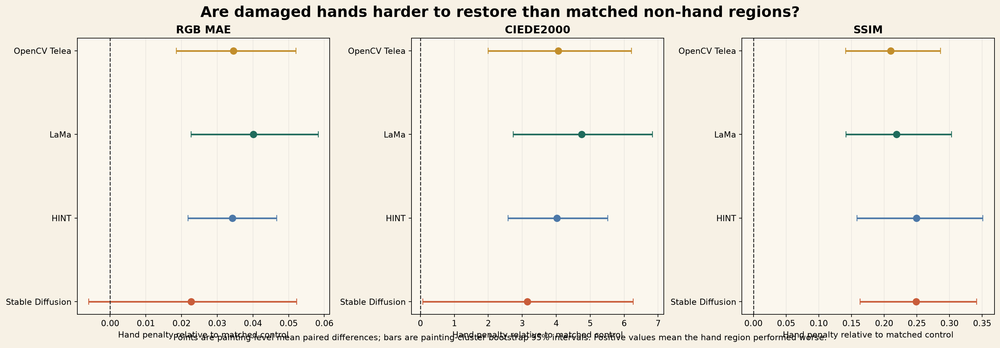

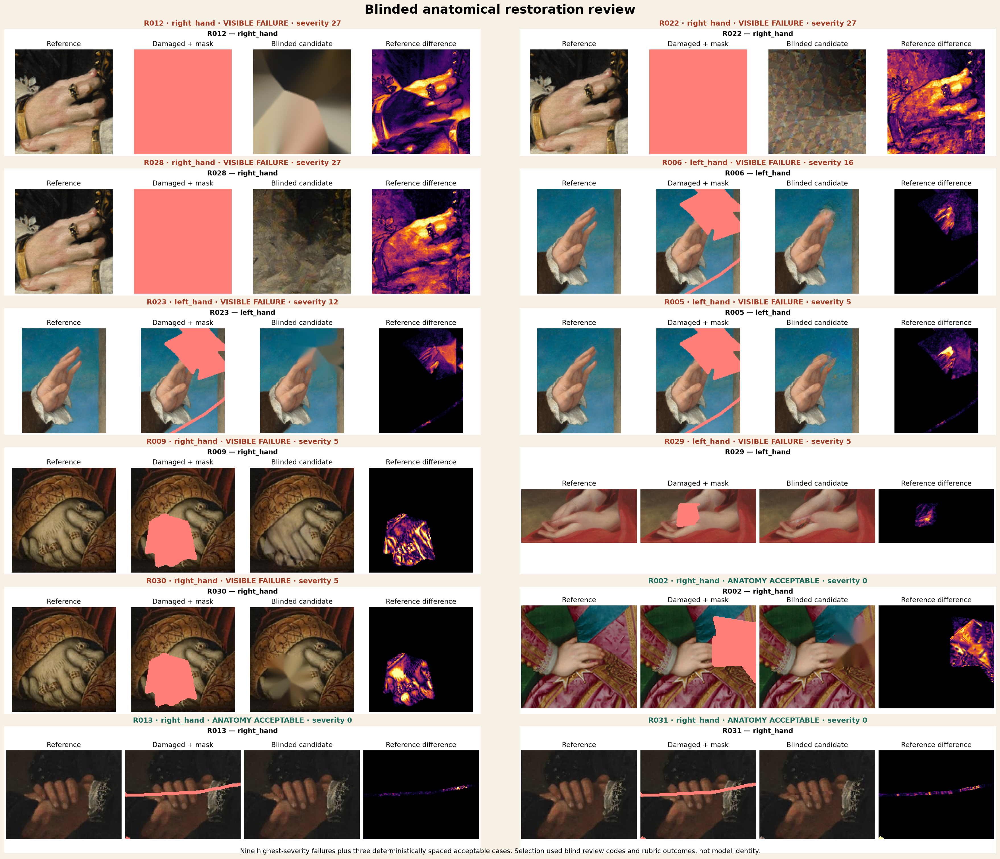

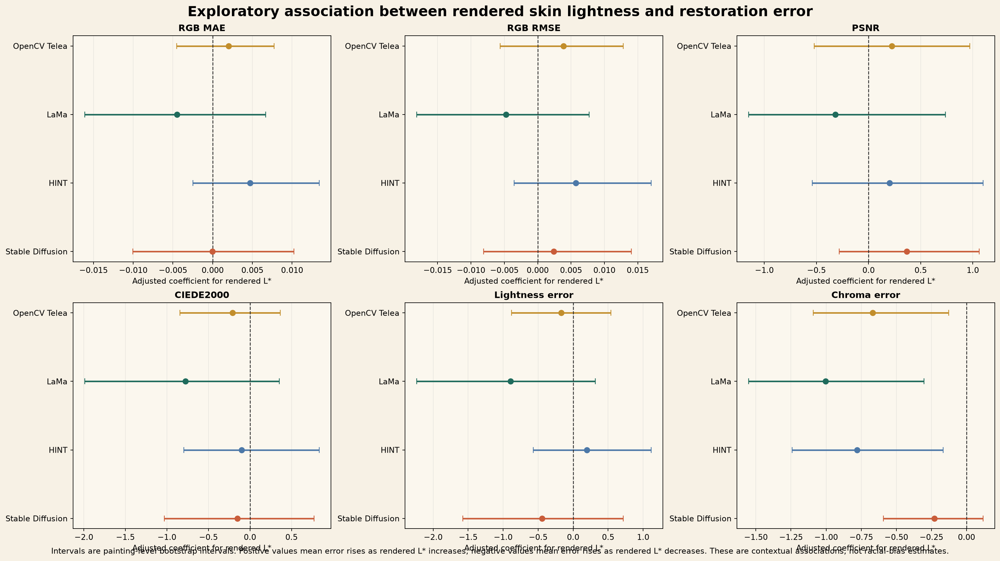

In [32]:
# ---------------------------------------------------------------------------
# Generate canonical hand, anatomy-review, and skin-tone figures
# ---------------------------------------------------------------------------

import math

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from PIL import Image


MODEL_ORDER = [
    "opencv_telea",
    "lama",
    "hint_places2",
    "stable_diffusion_inpainting",
]

MODEL_LABELS = {
    "opencv_telea": "OpenCV Telea",
    "lama": "LaMa",
    "hint_places2": "HINT",
    "stable_diffusion_inpainting": (
        "Stable Diffusion"
    ),
    "sdxl_inpainting": "SDXL",
}

MODEL_COLOURS = {
    "opencv_telea": "#C28E2C",
    "lama": "#1F6B5C",
    "hint_places2": "#4C78A8",
    "stable_diffusion_inpainting": (
        "#C95D3A"
    ),
}

METRIC_LABELS = {
    "mae": "RGB MAE",
    "rmse": "RGB RMSE",
    "psnr": "PSNR",
    "ssim": "SSIM",
    "delta_e_ciede2000_mean": (
        "CIEDE2000"
    ),
    "lightness_error_mean": (
        "Lightness error"
    ),
    "chroma_error_mean": (
        "Chroma error"
    ),
}


def save_figure_as_rgb(
    figure,
    target_path,
    *,
    dpi=170,
):
    target_path = Path(
        target_path
    )

    target_path.parent.mkdir(
        parents=True,
        exist_ok=True,
    )

    figure.savefig(
        target_path,
        dpi=dpi,
        bbox_inches="tight",
        facecolor="#F7F1E5",
    )

    plt.close(figure)

    with Image.open(
        target_path
    ) as source_image:
        rgb_image = (
            source_image
            .convert("RGB")
            .copy()
        )

    rgb_image.save(
        target_path,
        format="PNG",
        optimize=True,
    )

    return target_path


# ---------------------------------------------------------------------------
# Figure 1: painting-level hand-versus-control estimates
# ---------------------------------------------------------------------------

hand_figure, hand_axes = plt.subplots(
    1,
    len(PRIMARY_HAND_METRICS),
    figsize=(17, 5.8),
    constrained_layout=True,
)

hand_figure.patch.set_facecolor(
    "#F7F1E5"
)

for axis, metric_name in zip(
    hand_axes,
    PRIMARY_HAND_METRICS,
):
    metric_df = (
        hand_inference_df[
            hand_inference_df[
                "metric_name"
            ]
            .astype(str)
            .eq(metric_name)
        ]
        .set_index("model_id")
        .reindex(MODEL_ORDER)
        .reset_index()
    )

    y_positions = np.arange(
        len(metric_df)
    )

    means = metric_df[
        "mean_hand_worse_difference"
    ].to_numpy(
        dtype=float
    )

    lower = metric_df[
        "ci_lower"
    ].to_numpy(
        dtype=float
    )

    upper = metric_df[
        "ci_upper"
    ].to_numpy(
        dtype=float
    )

    lower_errors = np.maximum(
        means - lower,
        0.0,
    )

    upper_errors = np.maximum(
        upper - means,
        0.0,
    )

    for position, row in (
        metric_df.iterrows()
    ):
        model_id = str(
            row["model_id"]
        )

        axis.errorbar(
            float(
                row[
                    "mean_hand_worse_difference"
                ]
            ),
            position,
            xerr=np.asarray(
                [
                    [
                        max(
                            float(
                                row[
                                    "mean_hand_worse_difference"
                                ]
                            )
                            - float(
                                row[
                                    "ci_lower"
                                ]
                            ),
                            0.0,
                        )
                    ],
                    [
                        max(
                            float(
                                row[
                                    "ci_upper"
                                ]
                            )
                            - float(
                                row[
                                    "mean_hand_worse_difference"
                                ]
                            ),
                            0.0,
                        )
                    ],
                ]
            ),
            fmt="o",
            markersize=8,
            capsize=4,
            linewidth=2,
            color=MODEL_COLOURS[
                model_id
            ],
            ecolor=MODEL_COLOURS[
                model_id
            ],
        )

    axis.axvline(
        0.0,
        color="#303030",
        linewidth=1.2,
        linestyle="--",
    )

    axis.set_yticks(
        y_positions
    )

    axis.set_yticklabels(
        [
            MODEL_LABELS[
                str(model_id)
            ]
            for model_id in (
                metric_df[
                    "model_id"
                ]
            )
        ]
    )

    axis.invert_yaxis()

    axis.set_title(
        METRIC_LABELS.get(
            metric_name,
            metric_name,
        ),
        fontsize=13,
        fontweight="bold",
    )

    axis.set_xlabel(
        "Hand penalty relative to matched control"
    )

    axis.grid(
        axis="x",
        alpha=0.22,
    )

    axis.set_facecolor(
        "#FBF7EE"
    )

hand_figure.suptitle(
    "Are damaged hands harder to restore than matched non-hand regions?",
    fontsize=18,
    fontweight="bold",
)

hand_figure.text(
    0.5,
    0.005,
    (
        "Points are painting-level mean paired differences; "
        "bars are painting-cluster bootstrap 95% intervals. "
        "Positive values mean the hand region performed worse."
    ),
    ha="center",
    fontsize=10,
)

hand_figure_path = save_figure_as_rgb(
    hand_figure,
    OUTPUTS[
        "hand_comparison_figure_path"
    ],
)


# ---------------------------------------------------------------------------
# Figure 2: deterministic blinded anatomical-review atlas
# ---------------------------------------------------------------------------

review_for_selection_df = (
    reloaded_manual_review_df
    .copy()
)

review_for_selection_df[
    "digit_count_error"
] = pd.to_numeric(
    review_for_selection_df[
        "digit_count_error"
    ],
    errors="coerce",
).fillna(0)

review_for_selection_df[
    "severity_score"
] = (
    review_for_selection_df[
        "digit_count_error"
    ]
    * 4.0
    + boolean_column(
        review_for_selection_df,
        "missing_digits",
    ).astype(float)
    * 3.0
    + boolean_column(
        review_for_selection_df,
        "duplicated_digits",
    ).astype(float)
    * 3.0
    + boolean_column(
        review_for_selection_df,
        "fused_digits",
    ).astype(float)
    * 2.0
    + boolean_column(
        review_for_selection_df,
        "contour_failure",
    ).astype(float)
    + boolean_column(
        review_for_selection_df,
        "articulation_failure",
    ).astype(float)
    + boolean_column(
        review_for_selection_df,
        "wrist_or_arm_discontinuity",
    ).astype(float)
    + boolean_column(
        review_for_selection_df,
        "non_anatomical_texture",
    ).astype(float)
)

review_for_selection_df[
    "overall_failure_boolean"
] = boolean_column(
    review_for_selection_df,
    "overall_anatomy_failure",
)

failure_candidates_df = (
    review_for_selection_df[
        review_for_selection_df[
            "overall_failure_boolean"
        ]
    ]
    .sort_values(
        [
            "severity_score",
            "blind_review_code",
        ],
        ascending=[
            False,
            True,
        ],
    )
)

acceptable_candidates_df = (
    review_for_selection_df[
        ~review_for_selection_df[
            "overall_failure_boolean"
        ]
    ]
    .sort_values(
        "blind_review_code"
    )
    .reset_index(drop=True)
)

selected_failure_df = (
    failure_candidates_df
    .head(9)
    .copy()
)

if len(
    acceptable_candidates_df
) < 3:
    raise RuntimeError(
        "At least three anatomically acceptable "
        "review units are required for the atlas."
    )

acceptable_positions = np.linspace(
    0,
    len(
        acceptable_candidates_df
    )
    - 1,
    num=3,
    dtype=int,
)

selected_acceptable_df = (
    acceptable_candidates_df.iloc[
        acceptable_positions
    ]
    .copy()
)

representative_review_df = (
    pd.concat(
        [
            selected_failure_df,
            selected_acceptable_df,
        ],
        ignore_index=True,
    )
    .drop_duplicates(
        subset=[
            "blind_review_code"
        ]
    )
    .reset_index(drop=True)
)

if len(
    representative_review_df
) != 12:
    raise RuntimeError(
        "The deterministic anatomical atlas "
        "must contain exactly 12 review units."
    )

representative_review_df[
    "selection_role"
] = np.where(
    representative_review_df[
        "overall_failure_boolean"
    ],
    "highest_severity_failure",
    "evenly_spaced_acceptable_context",
)

representative_review_path = (
    WORK_ROOT
    / "representative_review_selection.csv"
)

write_csv_atomic_retry(
    representative_review_df,
    representative_review_path,
)

atlas_rows = 6
atlas_columns = 2

failure_figure, failure_axes = (
    plt.subplots(
        atlas_rows,
        atlas_columns,
        figsize=(24, 20),
        constrained_layout=True,
    )
)

failure_figure.patch.set_facecolor(
    "#F7F1E5"
)

for axis, (_, row) in zip(
    failure_axes.flat,
    representative_review_df.iterrows(),
):
    panel_path = (
        PROJECT_ROOT
        / str(
            row[
                "panel_path"
            ]
        )
    )

    with Image.open(
        panel_path
    ) as panel_image:
        panel_rgb = (
            panel_image
            .convert("RGB")
            .copy()
        )

    axis.imshow(
        panel_rgb
    )

    status_label = (
        "VISIBLE FAILURE"
        if bool(
            row[
                "overall_failure_boolean"
            ]
        )
        else "ANATOMY ACCEPTABLE"
    )

    axis.set_title(
        (
            f"{row['blind_review_code']} · "
            f"{row['region_type']} · "
            f"{status_label} · "
            f"severity {row['severity_score']:.0f}"
        ),
        fontsize=12,
        fontweight="bold",
        color=(
            "#A23A24"
            if bool(
                row[
                    "overall_failure_boolean"
                ]
            )
            else "#1F6B5C"
        ),
    )

    axis.axis("off")

failure_figure.suptitle(
    "Blinded anatomical restoration review",
    fontsize=21,
    fontweight="bold",
)

failure_figure.text(
    0.5,
    0.002,
    (
        "Nine highest-severity failures plus three "
        "deterministically spaced acceptable cases. "
        "Selection used blind review codes and rubric "
        "outcomes, not model identity."
    ),
    ha="center",
    fontsize=11,
)

failure_atlas_path = (
    save_figure_as_rgb(
        failure_figure,
        OUTPUTS[
            "failure_atlas_path"
        ],
        dpi=150,
    )
)


# ---------------------------------------------------------------------------
# Figure 3: exploratory rendered-lightness associations
# ---------------------------------------------------------------------------

skin_metric_order = [
    "mae",
    "rmse",
    "psnr",
    "delta_e_ciede2000_mean",
    "lightness_error_mean",
    "chroma_error_mean",
]

skin_figure, skin_axes = plt.subplots(
    2,
    3,
    figsize=(18, 10),
    constrained_layout=True,
)

skin_figure.patch.set_facecolor(
    "#F7F1E5"
)

for axis, metric_name in zip(
    skin_axes.flat,
    skin_metric_order,
):
    metric_df = (
        skin_lightness_associations_df[
            skin_lightness_associations_df[
                "metric_name"
            ]
            .astype(str)
            .eq(metric_name)
        ]
        .set_index("model_id")
        .reindex(MODEL_ORDER)
        .reset_index()
    )

    for position, row in (
        metric_df.iterrows()
    ):
        model_id = str(
            row[
                "model_id"
            ]
        )

        estimate = float(
            row[
                "standardized_lstar_coefficient"
            ]
        )

        lower = float(
            row[
                "ci_lower"
            ]
        )

        upper = float(
            row[
                "ci_upper"
            ]
        )

        axis.errorbar(
            estimate,
            position,
            xerr=np.asarray(
                [
                    [
                        max(
                            estimate - lower,
                            0.0,
                        )
                    ],
                    [
                        max(
                            upper - estimate,
                            0.0,
                        )
                    ],
                ]
            ),
            fmt="o",
            markersize=7,
            capsize=4,
            linewidth=2,
            color=MODEL_COLOURS[
                model_id
            ],
            ecolor=MODEL_COLOURS[
                model_id
            ],
        )

    axis.axvline(
        0.0,
        color="#303030",
        linewidth=1.1,
        linestyle="--",
    )

    axis.set_yticks(
        np.arange(
            len(metric_df)
        )
    )

    axis.set_yticklabels(
        [
            MODEL_LABELS[
                str(model_id)
            ]
            for model_id in (
                metric_df[
                    "model_id"
                ]
            )
        ]
    )

    axis.invert_yaxis()

    axis.set_title(
        METRIC_LABELS.get(
            metric_name,
            metric_name,
        ),
        fontsize=12,
        fontweight="bold",
    )

    axis.set_xlabel(
        "Adjusted coefficient for rendered L*"
    )

    axis.grid(
        axis="x",
        alpha=0.22,
    )

    axis.set_facecolor(
        "#FBF7EE"
    )

skin_figure.suptitle(
    "Exploratory association between rendered skin lightness and restoration error",
    fontsize=18,
    fontweight="bold",
)

skin_figure.text(
    0.5,
    0.002,
    (
        "Intervals are painting-level bootstrap intervals. "
        "Positive values mean error rises as rendered L* increases; "
        "negative values mean error rises as rendered L* decreases. "
        "These are contextual associations, not racial-bias estimates."
    ),
    ha="center",
    fontsize=10,
)

skin_tone_figure_path = (
    save_figure_as_rgb(
        skin_figure,
        OUTPUTS[
            "skin_tone_figure_path"
        ],
    )
)


# ---------------------------------------------------------------------------
# Validate figure files
# ---------------------------------------------------------------------------

figure_rows = []

for figure_id, figure_path in [
    (
        "hand_vs_control",
        hand_figure_path,
    ),
    (
        "anatomical_failure_atlas",
        failure_atlas_path,
    ),
    (
        "skin_tone_audit",
        skin_tone_figure_path,
    ),
]:
    if not figure_path.is_file():
        raise FileNotFoundError(
            f"Missing figure: {figure_path}"
        )

    with Image.open(
        figure_path
    ) as figure_image:
        figure_image.verify()

    with Image.open(
        figure_path
    ) as figure_image:
        figure_rows.append(
            {
                "figure_id": figure_id,
                "relative_path": (
                    figure_path
                    .relative_to(
                        PROJECT_ROOT
                    )
                    .as_posix()
                ),
                "format": (
                    figure_image.format
                ),
                "mode": (
                    figure_image.mode
                ),
                "width": (
                    figure_image.width
                ),
                "height": (
                    figure_image.height
                ),
                "size_bytes": (
                    figure_path
                    .stat()
                    .st_size
                ),
            }
        )

figure_audit_df = pd.DataFrame(
    figure_rows
)

invalid_figure_rows = (
    figure_audit_df[
        figure_audit_df[
            "format"
        ]
        .astype(str)
        .ne("PNG")
        | figure_audit_df[
            "mode"
        ]
        .astype(str)
        .ne("RGB")
        | figure_audit_df[
            "width"
        ]
        .astype(int)
        .lt(1200)
        | figure_audit_df[
            "height"
        ]
        .astype(int)
        .lt(700)
    ]
)

if not invalid_figure_rows.empty:
    raise RuntimeError(
        "One or more canonical figures failed "
        "the image contract: "
        f"{invalid_figure_rows.to_dict('records')}"
    )

print(
    "D02 Batch 9 canonical figures generated."
)
print(
    "Representative review units:",
    len(
        representative_review_df
    ),
)
print(
    "Selected visible failures:",
    int(
        representative_review_df[
            "overall_failure_boolean"
        ].sum()
    ),
)
print(
    "Selected acceptable cases:",
    int(
        (
            ~representative_review_df[
                "overall_failure_boolean"
            ]
        ).sum()
    ),
)
print(
    "Canonical figures:",
    len(
        figure_audit_df
    ),
)

display(figure_audit_df)
display(
    representative_review_df[
        [
            "blind_review_code",
            "painting_id",
            "damage_family",
            "region_type",
            "severity_score",
            "selection_role",
            "reviewer_confidence",
        ]
    ]
)

for figure_path in [
    hand_figure_path,
    failure_atlas_path,
    skin_tone_figure_path,
]:
    with Image.open(
        figure_path
    ) as figure_image:
        display(
            figure_image
            .convert("RGB")
            .copy()
        )

In [34]:
# ---------------------------------------------------------------------------
# Build the self-contained D02 HTML report
# ---------------------------------------------------------------------------

import base64
import html
import os
import time
from io import BytesIO

from IPython.display import FileLink, display


REPORT_SETTINGS = SETTINGS[
    "report"
]


def write_text_atomic_retry(
    text,
    target,
    *,
    attempts=8,
    delay_seconds=0.25,
):
    target = Path(target)

    target.parent.mkdir(
        parents=True,
        exist_ok=True,
    )

    temporary = target.with_suffix(
        target.suffix + ".tmp"
    )

    for attempt in range(
        1,
        attempts + 1,
    ):
        try:
            temporary.write_text(
                text,
                encoding="utf-8",
            )

            os.replace(
                temporary,
                target,
            )

            return target

        except PermissionError:
            temporary.unlink(
                missing_ok=True
            )

            if attempt == attempts:
                raise

            time.sleep(
                delay_seconds * attempt
            )

    raise RuntimeError(
        f"Could not write {target}"
    )


def path_to_data_uri(
    path,
):
    path = Path(path)

    if not path.is_file():
        raise FileNotFoundError(
            f"Embedded asset missing: {path}"
        )

    suffix = (
        path.suffix
        .lower()
    )

    mime_types = {
        ".png": "image/png",
        ".jpg": "image/jpeg",
        ".jpeg": "image/jpeg",
        ".webp": "image/webp",
    }

    if suffix not in mime_types:
        raise ValueError(
            "Unsupported embedded-image type: "
            f"{path}"
        )

    encoded = base64.b64encode(
        path.read_bytes()
    ).decode("ascii")

    return (
        f"data:{mime_types[suffix]};"
        f"base64,{encoded}"
    )


def dataframe_csv_data_uri(
    frame,
):
    csv_bytes = (
        frame.to_csv(
            index=False
        )
        .encode("utf-8")
    )

    encoded = base64.b64encode(
        csv_bytes
    ).decode("ascii")

    return (
        "data:text/csv;charset=utf-8;"
        f"base64,{encoded}"
    )


def display_frame(
    frame,
    *,
    rows=None,
):
    prepared = (
        frame.copy()
    )

    if rows is not None:
        prepared = (
            prepared.head(rows)
        )

    numeric_columns = (
        prepared.select_dtypes(
            include=[
                "number",
            ]
        ).columns
    )

    for column in numeric_columns:
        prepared[column] = (
            prepared[column]
            .round(5)
        )

    return prepared


def frame_to_html(
    frame,
    *,
    rows=None,
    index=False,
):
    return (
        display_frame(
            frame,
            rows=rows,
        )
        .to_html(
            index=index,
            border=0,
            classes=[
                "data-table",
            ],
            escape=True,
        )
    )


def complete_table_block(
    table_id,
    title,
    frame,
    *,
    preview_rows=20,
    explanation="",
):
    download_uri = (
        dataframe_csv_data_uri(
            frame
        )
    )

    preview_count = min(
        preview_rows,
        len(frame),
    )

    explanation_html = (
        (
            "<p class='table-note'>"
            + html.escape(
                explanation
            )
            + "</p>"
        )
        if explanation
        else ""
    )

    return f"""
    <details class="evidence-table">
      <summary>
        <span>{html.escape(title)}</span>
        <span class="row-count">{len(frame):,} rows</span>
      </summary>
      <div class="table-content">
        {explanation_html}
        <p>
          <a
            class="download-button"
            download="{html.escape(table_id)}.csv"
            href="{download_uri}"
          >
            Download complete embedded CSV
          </a>
        </p>
        <p class="table-note">
          Showing {preview_count:,} of {len(frame):,} rows below.
          The download contains the complete table.
        </p>
        <div class="table-scroll">
          {frame_to_html(frame, rows=preview_rows)}
        </div>
      </div>
    </details>
    """


# ---------------------------------------------------------------------------
# Reload canonical persisted evidence
# ---------------------------------------------------------------------------

report_tables = {
    "portrait_screening": pd.read_csv(
        OUTPUTS[
            "portrait_screening_path"
        ],
        keep_default_na=False,
        low_memory=False,
    ),
    "anatomical_annotations": pd.read_csv(
        OUTPUTS[
            "annotations_path"
        ],
        keep_default_na=False,
        low_memory=False,
    ),
    "anatomical_overlap_audit": pd.read_csv(
        OUTPUTS[
            "overlap_audit_path"
        ],
        keep_default_na=False,
        low_memory=False,
    ),
    "eligible_cases": pd.read_csv(
        OUTPUTS[
            "eligible_cases_path"
        ],
        keep_default_na=False,
        low_memory=False,
    ),
    "manual_anatomy_review": pd.read_csv(
        OUTPUTS[
            "manual_review_path"
        ],
        keep_default_na=False,
        low_memory=False,
    ),
    "hand_region_comparison": pd.read_csv(
        OUTPUTS[
            "hand_comparison_path"
        ],
        keep_default_na=False,
        low_memory=False,
    ),
    "skin_tone_audit": pd.read_csv(
        OUTPUTS[
            "skin_tone_audit_path"
        ],
        keep_default_na=False,
        low_memory=False,
    ),
}

analysis_tables = {
    "hand_control_design": (
        hand_control_design_df.copy()
    ),
    "hand_inference": (
        hand_inference_df.copy()
    ),
    "hand_model_contrasts": (
        hand_model_contrasts_df.copy()
    ),
    "hand_sensitivity": (
        hand_sensitivity_df.copy()
    ),
    "skin_profiles": (
        skin_profile_df.copy()
    ),
    "skin_claim_gate": (
        skin_claim_gate_df.copy()
    ),
    "skin_context_matches": (
        skin_matches_df.copy()
    ),
    "skin_lightness_associations": (
        skin_lightness_associations_df
        .copy()
    ),
    "skin_bin_summary": (
        skin_bin_summary_df.copy()
    ),
    "skin_matched_summary": (
        skin_matched_summary_df.copy()
    ),
}


# ---------------------------------------------------------------------------
# Derive concise report conclusions
# ---------------------------------------------------------------------------

positive_hand_rows = int(
    hand_inference_df[
        "mean_hand_worse_difference"
    ]
    .astype(float)
    .gt(0)
    .sum()
)

significant_hand_rows = int(
    boolean_column(
        hand_inference_df,
        "bh_reject_0p05",
    ).sum()
)

hand_metric_winners_df = (
    hand_inference_df.loc[
        hand_inference_df.groupby(
            "metric_name"
        )[
            "mean_hand_worse_difference"
        ]
        .idxmin()
    ][
        [
            "metric_name",
            "model_id",
            "mean_hand_worse_difference",
            "ci_lower",
            "ci_upper",
        ]
    ]
    .sort_values(
        "metric_name"
    )
    .reset_index(drop=True)
)

hand_metric_winners_df[
    "metric"
] = (
    hand_metric_winners_df[
        "metric_name"
    ]
    .map(METRIC_LABELS)
)

hand_metric_winners_df[
    "lowest_observed_penalty_model"
] = (
    hand_metric_winners_df[
        "model_id"
    ]
    .map(MODEL_LABELS)
)

hand_metric_winners_report_df = (
    hand_metric_winners_df[
        [
            "metric",
            "lowest_observed_penalty_model",
            "mean_hand_worse_difference",
            "ci_lower",
            "ci_upper",
        ]
    ]
)

manual_review_for_summary_df = (
    report_tables[
        "manual_anatomy_review"
    ]
    .copy()
)

manual_review_for_summary_df[
    "overall_failure_boolean"
] = (
    boolean_column(
        manual_review_for_summary_df,
        "overall_anatomy_failure",
    )
)

review_model_summary_df = (
    manual_review_for_summary_df
    .groupby(
        "model_id",
        as_index=False,
        sort=True,
    )
    .agg(
        review_units=(
            "review_unit_id",
            "nunique",
        ),
        visible_failures=(
            "overall_failure_boolean",
            "sum",
        ),
        reviewed_paintings=(
            "painting_id",
            "nunique",
        ),
        reviewed_cases=(
            "case_id",
            "nunique",
        ),
    )
)

review_model_summary_df[
    "failure_rate"
] = (
    review_model_summary_df[
        "visible_failures"
    ]
    / review_model_summary_df[
        "review_units"
    ]
)

review_model_summary_df[
    "model"
] = (
    review_model_summary_df[
        "model_id"
    ]
    .map(MODEL_LABELS)
    .fillna(
        review_model_summary_df[
            "model_id"
        ]
    )
)

review_model_summary_report_df = (
    review_model_summary_df[
        [
            "model",
            "review_units",
            "visible_failures",
            "failure_rate",
            "reviewed_paintings",
            "reviewed_cases",
        ]
    ]
)

failure_taxonomy_rows = []

for model_id, model_df in (
    manual_review_for_summary_df
    .groupby(
        "model_id",
        sort=True,
    )
):
    row = {
        "model": MODEL_LABELS.get(
            str(model_id),
            str(model_id),
        ),
        "digit_count_error_total": int(
            pd.to_numeric(
                model_df[
                    "digit_count_error"
                ],
                errors="coerce",
            )
            .fillna(0)
            .sum()
        ),
    }

    for field in [
        "missing_digits",
        "duplicated_digits",
        "fused_digits",
        "contour_failure",
        "articulation_failure",
        "wrist_or_arm_discontinuity",
        "non_anatomical_texture",
    ]:
        row[field] = int(
            boolean_column(
                model_df,
                field,
            ).sum()
        )

    failure_taxonomy_rows.append(
        row
    )

failure_taxonomy_df = pd.DataFrame(
    failure_taxonomy_rows
)

clear_positive_skin = int(
    skin_lightness_associations_df[
        "ci_lower"
    ]
    .astype(float)
    .gt(0)
    .sum()
)

clear_negative_skin = int(
    skin_lightness_associations_df[
        "ci_upper"
    ]
    .astype(float)
    .lt(0)
    .sum()
)

uncertain_skin = (
    len(
        skin_lightness_associations_df
    )
    - clear_positive_skin
    - clear_negative_skin
)

hand_inference_report_df = (
    hand_inference_df.copy()
)

hand_inference_report_df[
    "model"
] = (
    hand_inference_report_df[
        "model_id"
    ]
    .map(MODEL_LABELS)
)

hand_inference_report_df[
    "metric"
] = (
    hand_inference_report_df[
        "metric_name"
    ]
    .map(METRIC_LABELS)
)

hand_inference_report_df[
    "BH significant"
] = np.where(
    boolean_column(
        hand_inference_report_df,
        "bh_reject_0p05",
    ),
    "Yes",
    "No",
)

hand_inference_report_df = (
    hand_inference_report_df[
        [
            "model",
            "metric",
            "painting_count",
            "mean_hand_worse_difference",
            "ci_lower",
            "ci_upper",
            "standardized_paired_effect",
            "sign_flip_p_value",
            "bh_adjusted_p_value",
            "BH significant",
        ]
    ]
)


# ---------------------------------------------------------------------------
# Embed visual evidence
# ---------------------------------------------------------------------------

canonical_visual_paths = [
    OUTPUTS[
        "screening_atlas_path"
    ],
    OUTPUTS[
        "annotation_qa_path"
    ],
    OUTPUTS[
        "hand_comparison_figure_path"
    ],
    OUTPUTS[
        "failure_atlas_path"
    ],
    OUTPUTS[
        "skin_tone_figure_path"
    ],
]

representative_panel_paths = [
    (
        PROJECT_ROOT
        / str(relative_path)
    )
    for relative_path in (
        representative_review_df[
            "panel_path"
        ]
    )
]

context_example_row = (
    representative_review_df
    .sort_values(
        [
            "severity_score",
            "blind_review_code",
        ],
        ascending=[
            False,
            True,
        ],
    )
    .iloc[0]
)

context_visual_paths = [
    (
        PROJECT_ROOT
        / str(
            context_example_row[
                "clean_image_path"
            ]
        )
    ),
    (
        PROJECT_ROOT
        / str(
            context_example_row[
                "damaged_image_path"
            ]
        )
    ),
    (
        PROJECT_ROOT
        / str(
            context_example_row[
                "restored_path"
            ]
        )
    ),
]

embedded_visual_paths = [
    *canonical_visual_paths,
    *representative_panel_paths,
    *context_visual_paths,
]

missing_report_visuals = [
    str(path)
    for path in (
        embedded_visual_paths
    )
    if not Path(path).is_file()
]

if missing_report_visuals:
    raise FileNotFoundError(
        "Report visuals are missing: "
        f"{missing_report_visuals}"
    )

report_visual_count = len(
    embedded_visual_paths
)

minimum_visual_count = int(
    REPORT_SETTINGS[
        "minimum_embedded_visuals"
    ]
)

if (
    report_visual_count
    < minimum_visual_count
):
    raise RuntimeError(
        "The report contains too few "
        "embedded visuals. "
        f"Expected at least "
        f"{minimum_visual_count}; "
        f"observed {report_visual_count}."
    )

screening_atlas_uri = (
    path_to_data_uri(
        OUTPUTS[
            "screening_atlas_path"
        ]
    )
)

annotation_qa_uri = (
    path_to_data_uri(
        OUTPUTS[
            "annotation_qa_path"
        ]
    )
)

hand_figure_uri = (
    path_to_data_uri(
        OUTPUTS[
            "hand_comparison_figure_path"
        ]
    )
)

failure_atlas_uri = (
    path_to_data_uri(
        OUTPUTS[
            "failure_atlas_path"
        ]
    )
)

skin_figure_uri = (
    path_to_data_uri(
        OUTPUTS[
            "skin_tone_figure_path"
        ]
    )
)

context_reference_uri = (
    path_to_data_uri(
        context_visual_paths[0]
    )
)

context_damaged_uri = (
    path_to_data_uri(
        context_visual_paths[1]
    )
)

context_restored_uri = (
    path_to_data_uri(
        context_visual_paths[2]
    )
)


# ---------------------------------------------------------------------------
# Representative blinded-review cards
# ---------------------------------------------------------------------------

representative_panel_cards = []

for _, row in (
    representative_review_df
    .sort_values(
        "blind_review_code"
    )
    .iterrows()
):
    panel_path = (
        PROJECT_ROOT
        / str(
            row[
                "panel_path"
            ]
        )
    )

    panel_uri = (
        path_to_data_uri(
            panel_path
        )
    )

    is_failure = bool(
        row[
            "overall_failure_boolean"
        ]
    )

    status_text = (
        "Visible anatomical failure"
        if is_failure
        else "Anatomy acceptable"
    )

    status_class = (
        "failure"
        if is_failure
        else "acceptable"
    )

    model_label = (
        MODEL_LABELS.get(
            str(
                row[
                    "model_id"
                ]
            ),
            str(
                row[
                    "model_id"
                ]
            ),
        )
    )

    representative_panel_cards.append(
        f"""
        <article class="review-card">
          <img
            src="{panel_uri}"
            alt="Blinded anatomical review panel
                 {html.escape(str(row['blind_review_code']))}"
          />
          <div class="review-card-body">
            <div class="review-card-heading">
              <strong>
                {html.escape(str(row['blind_review_code']))}
              </strong>
              <span class="badge {status_class}">
                {html.escape(status_text)}
              </span>
            </div>
            <p>
              <strong>Painting:</strong>
              {html.escape(str(row['painting_id']))}
              &nbsp;·&nbsp;
              <strong>Damage:</strong>
              {html.escape(str(row['damage_family']))}
              &nbsp;·&nbsp;
              <strong>Region:</strong>
              {html.escape(str(row['region_type']))}
            </p>
            <p>
              <strong>Model revealed after review:</strong>
              {html.escape(model_label)}
            </p>
            <p>
              {html.escape(str(row['review_notes']))}
            </p>
          </div>
        </article>
        """
    )

representative_panel_html = "\n".join(
    representative_panel_cards
)


# ---------------------------------------------------------------------------
# Complete embedded evidence appendix
# ---------------------------------------------------------------------------

appendix_specs = [
    (
        "portrait_screening",
        "Portrait screening",
        report_tables[
            "portrait_screening"
        ],
        (
            "All 60 governed portraits and their "
            "outcome-blind anatomical screening decisions."
        ),
    ),
    (
        "anatomical_annotations",
        "Reviewed anatomical annotations",
        report_tables[
            "anatomical_annotations"
        ],
        (
            "All approved, ambiguous, or excluded "
            "face, skin, hand, and exposed-body annotations."
        ),
    ),
    (
        "anatomical_overlap_audit",
        "Anatomical overlap audit",
        report_tables[
            "anatomical_overlap_audit"
        ],
        (
            "Exact damage-mask intersections with "
            "independently reviewed anatomical regions."
        ),
    ),
    (
        "eligible_cases",
        "Eligible analysis cases",
        report_tables[
            "eligible_cases"
        ],
        (
            "All retained and non-retained cases with "
            "hand, skin, and control eligibility fields."
        ),
    ),
    (
        "manual_anatomy_review",
        "Blinded manual anatomy review",
        report_tables[
            "manual_anatomy_review"
        ],
        (
            "All 32 completed review units, failure "
            "codes, confidence levels, and provenance."
        ),
    ),
    (
        "hand_region_comparison",
        "Hand-versus-control measurements",
        report_tables[
            "hand_region_comparison"
        ],
        (
            "Complete candidate-level matched hand "
            "and non-hand control measurements."
        ),
    ),
    (
        "skin_tone_audit",
        "Depicted skin-tone audit measurements",
        report_tables[
            "skin_tone_audit"
        ],
        (
            "Complete candidate-level rendered-lightness "
            "and restoration evidence."
        ),
    ),
    (
        "hand_control_design",
        "Matched hand-control design",
        analysis_tables[
            "hand_control_design"
        ],
        (
            "All deterministic same-size non-hand "
            "controls and match-quality evidence."
        ),
    ),
    (
        "hand_inference",
        "Painting-level hand inference",
        analysis_tables[
            "hand_inference"
        ],
        (
            "Primary painting-level paired estimates, "
            "intervals, tests, and corrected p-values."
        ),
    ),
    (
        "hand_model_contrasts",
        "Pairwise model contrasts",
        analysis_tables[
            "hand_model_contrasts"
        ],
        (
            "Secondary paired differences between "
            "model-specific hand penalties."
        ),
    ),
    (
        "hand_sensitivity",
        "Hand-analysis sensitivity checks",
        analysis_tables[
            "hand_sensitivity"
        ],
        (
            "Results under pixel-count, match-quality, "
            "and canonical-only restrictions."
        ),
    ),
    (
        "skin_profiles",
        "Rendered skin profiles",
        analysis_tables[
            "skin_profiles"
        ],
        (
            "Painting-level rendered L*, chroma, local "
            "contrast, source, and presentation bins."
        ),
    ),
    (
        "skin_claim_gate",
        "Skin-tone claim gate",
        analysis_tables[
            "skin_claim_gate"
        ],
        (
            "The explicit applicability decision for "
            "comparative rendered-lightness analysis."
        ),
    ),
    (
        "skin_context_matches",
        "Rendered-lightness context matches",
        analysis_tables[
            "skin_context_matches"
        ],
        (
            "Deterministic lower- and higher-L* painting "
            "pairs with context-match diagnostics."
        ),
    ),
    (
        "skin_lightness_associations",
        "Rendered-lightness associations",
        analysis_tables[
            "skin_lightness_associations"
        ],
        (
            "Exploratory adjusted painting-level "
            "associations for every model and metric."
        ),
    ),
    (
        "skin_bin_summary",
        "Rendered-lightness bin summaries",
        analysis_tables[
            "skin_bin_summary"
        ],
        (
            "Descriptive evidence for the three "
            "presentation bins."
        ),
    ),
    (
        "skin_matched_summary",
        "Matched rendered-lightness summaries",
        analysis_tables[
            "skin_matched_summary"
        ],
        (
            "Exploratory summaries across the retained "
            "context-matched painting pairs."
        ),
    ),
]

appendix_html = "\n".join(
    complete_table_block(
        table_id,
        title,
        frame,
        preview_rows=(
            30
            if len(frame) <= 200
            else 15
        ),
        explanation=explanation,
    )
    for (
        table_id,
        title,
        frame,
        explanation,
    ) in appendix_specs
)


# ---------------------------------------------------------------------------
# Construct the report
# ---------------------------------------------------------------------------

winner_statements = []

for _, row in (
    hand_metric_winners_report_df
    .iterrows()
):
    winner_statements.append(
        (
            "<li><strong>"
            + html.escape(
                str(row["metric"])
            )
            + ":</strong> "
            + html.escape(
                str(
                    row[
                        "lowest_observed_penalty_model"
                    ]
                )
            )
            + " had the lowest observed mean hand penalty "
            + f"({float(row['mean_hand_worse_difference']):.4f})."
            + "</li>"
        )
    )

winner_list_html = "\n".join(
    winner_statements
)

context_model_label = (
    MODEL_LABELS.get(
        str(
            context_example_row[
                "model_id"
            ]
        ),
        str(
            context_example_row[
                "model_id"
            ]
        ),
    )
)

report_title = str(
    REPORT_SETTINGS[
        "title"
    ]
)

report_subtitle = str(
    REPORT_SETTINGS[
        "subtitle"
    ]
)

central_boundary = str(
    REPORT_SETTINGS[
        "central_boundary"
    ]
)

report_html = f"""<!DOCTYPE html>
<html lang="en">
<head>
<meta charset="utf-8" />
<meta
  name="viewport"
  content="width=device-width, initial-scale=1"
/>
<title>{html.escape(report_title)}</title>
<style>
:root {{
  --paper: #f7f1e5;
  --paper-light: #fffaf1;
  --ink: #242018;
  --muted: #6f675c;
  --green: #174f45;
  --green-light: #dce9e2;
  --rust: #a74428;
  --rust-light: #f4ddd2;
  --gold: #b88728;
  --gold-light: #f4e7c2;
  --line: #cfc3ae;
  --shadow: rgba(55, 43, 28, 0.12);
}}

* {{
  box-sizing: border-box;
}}

body {{
  margin: 0;
  color: var(--ink);
  background:
    radial-gradient(
      circle at 15% 10%,
      rgba(184, 135, 40, 0.07),
      transparent 28%
    ),
    var(--paper);
  font-family:
    Georgia,
    "Times New Roman",
    serif;
  line-height: 1.55;
}}

main {{
  width: min(1480px, calc(100% - 40px));
  margin: 0 auto;
  padding: 44px 0 80px;
}}

header {{
  border-bottom: 2px solid var(--green);
  padding-bottom: 28px;
}}

.eyebrow {{
  color: var(--rust);
  font-size: 0.78rem;
  font-weight: bold;
  letter-spacing: 0.16em;
  text-transform: uppercase;
}}

h1 {{
  max-width: 1100px;
  margin: 8px 0 4px;
  color: var(--green);
  font-size: clamp(2.2rem, 5vw, 4.6rem);
  line-height: 1.03;
}}

.subtitle {{
  max-width: 980px;
  margin: 12px 0;
  color: var(--muted);
  font-size: 1.25rem;
}}

.boundary {{
  margin-top: 22px;
  padding: 16px 20px;
  border-left: 5px solid var(--gold);
  background: var(--gold-light);
  font-weight: bold;
}}

nav {{
  position: sticky;
  top: 0;
  z-index: 3;
  display: flex;
  gap: 10px;
  flex-wrap: wrap;
  margin: 28px 0;
  padding: 12px;
  border: 1px solid var(--line);
  background: rgba(247, 241, 229, 0.96);
  box-shadow: 0 6px 18px var(--shadow);
}}

nav a {{
  color: var(--green);
  text-decoration: none;
  font-size: 0.9rem;
  font-weight: bold;
}}

section {{
  margin: 52px 0;
}}

h2 {{
  margin-bottom: 18px;
  padding-bottom: 8px;
  border-bottom: 1px solid var(--line);
  color: var(--green);
  font-size: 2rem;
}}

h3 {{
  color: var(--rust);
  font-size: 1.35rem;
}}

.kpi-grid {{
  display: grid;
  grid-template-columns:
    repeat(auto-fit, minmax(190px, 1fr));
  gap: 14px;
}}

.kpi {{
  padding: 20px;
  border: 1px solid var(--line);
  background: var(--paper-light);
  box-shadow: 0 4px 12px var(--shadow);
}}

.kpi strong {{
  display: block;
  color: var(--green);
  font-size: 2rem;
}}

.kpi span {{
  color: var(--muted);
}}

.conclusion-grid {{
  display: grid;
  grid-template-columns:
    repeat(auto-fit, minmax(320px, 1fr));
  gap: 18px;
}}

.conclusion {{
  padding: 22px;
  border-left: 5px solid var(--green);
  background: var(--paper-light);
  box-shadow: 0 4px 12px var(--shadow);
}}

.conclusion.caution {{
  border-left-color: var(--rust);
}}

.conclusion h3 {{
  margin-top: 0;
}}

.figure {{
  margin: 24px 0;
  padding: 14px;
  border: 1px solid var(--line);
  background: var(--paper-light);
  box-shadow: 0 5px 16px var(--shadow);
}}

.figure img {{
  display: block;
  width: 100%;
  height: auto;
}}

.figure figcaption {{
  margin-top: 10px;
  color: var(--muted);
  font-size: 0.92rem;
}}

.image-pair,
.image-triplet {{
  display: grid;
  gap: 14px;
}}

.image-pair {{
  grid-template-columns:
    repeat(auto-fit, minmax(420px, 1fr));
}}

.image-triplet {{
  grid-template-columns:
    repeat(auto-fit, minmax(270px, 1fr));
}}

.image-triplet figure {{
  margin: 0;
}}

.review-grid {{
  display: grid;
  grid-template-columns:
    repeat(auto-fit, minmax(460px, 1fr));
  gap: 18px;
}}

.review-card {{
  overflow: hidden;
  border: 1px solid var(--line);
  background: var(--paper-light);
  box-shadow: 0 4px 12px var(--shadow);
}}

.review-card img {{
  display: block;
  width: 100%;
  height: auto;
}}

.review-card-body {{
  padding: 14px 18px 18px;
}}

.review-card-heading {{
  display: flex;
  align-items: center;
  justify-content: space-between;
  gap: 12px;
}}

.badge {{
  padding: 4px 9px;
  border-radius: 999px;
  font-size: 0.72rem;
  font-weight: bold;
  text-transform: uppercase;
}}

.badge.failure {{
  color: #7a2414;
  background: var(--rust-light);
}}

.badge.acceptable {{
  color: var(--green);
  background: var(--green-light);
}}

.table-scroll {{
  overflow-x: auto;
  max-height: 620px;
  overflow-y: auto;
}}

.data-table {{
  width: 100%;
  border-collapse: collapse;
  font-family:
    "Segoe UI",
    Arial,
    sans-serif;
  font-size: 0.78rem;
}}

.data-table th {{
  position: sticky;
  top: 0;
  z-index: 1;
  color: white;
  background: var(--green);
}}

.data-table th,
.data-table td {{
  padding: 7px 9px;
  border: 1px solid #ddd2bf;
  text-align: left;
  vertical-align: top;
}}

.data-table tr:nth-child(even) {{
  background: #f2eadc;
}}

.evidence-table {{
  margin: 12px 0;
  border: 1px solid var(--line);
  background: var(--paper-light);
}}

.evidence-table summary {{
  display: flex;
  justify-content: space-between;
  gap: 20px;
  padding: 15px 18px;
  cursor: pointer;
  color: var(--green);
  font-weight: bold;
}}

.table-content {{
  padding: 0 18px 18px;
}}

.row-count,
.table-note {{
  color: var(--muted);
  font-size: 0.88rem;
}}

.download-button {{
  display: inline-block;
  padding: 8px 12px;
  color: white;
  background: var(--green);
  text-decoration: none;
  font-family:
    "Segoe UI",
    Arial,
    sans-serif;
  font-size: 0.85rem;
}}

.callout {{
  padding: 18px 22px;
  border-left: 5px solid var(--gold);
  background: var(--gold-light);
}}

.limitations li,
.assertions li {{
  margin-bottom: 8px;
}}

footer {{
  margin-top: 60px;
  padding-top: 22px;
  border-top: 2px solid var(--green);
  color: var(--muted);
}}
</style>
</head>

<body>
<main>
<header>
  <div class="eyebrow">
    Decision/Analysis Notebook D02 · Controlled-300
  </div>
  <h1>{html.escape(report_title)}</h1>
  <p class="subtitle">
    {html.escape(report_subtitle)}
  </p>
  <div class="boundary">
    {html.escape(central_boundary)}
  </div>
</header>

<nav>
  <a href="#summary">Executive findings</a>
  <a href="#design">Study design</a>
  <a href="#hand">Hand difficulty</a>
  <a href="#review">Blinded review</a>
  <a href="#skin">Rendered skin tone</a>
  <a href="#limits">Interpretation limits</a>
  <a href="#evidence">Complete evidence</a>
</nav>

<section id="summary">
  <h2>Executive findings</h2>

  <div class="kpi-grid">
    <div class="kpi">
      <strong>{len(report_tables['portrait_screening']):,}</strong>
      <span>portraits screened</span>
    </div>
    <div class="kpi">
      <strong>{len(report_tables['eligible_cases']):,}</strong>
      <span>eligible-case records</span>
    </div>
    <div class="kpi">
      <strong>{hand_control_design_df['case_id'].nunique():,}</strong>
      <span>hand-hit cases</span>
    </div>
    <div class="kpi">
      <strong>{hand_control_design_df['painting_id'].nunique():,}</strong>
      <span>independent hand-study paintings</span>
    </div>
    <div class="kpi">
      <strong>{len(report_tables['manual_anatomy_review']):,}</strong>
      <span>blinded anatomy reviews</span>
    </div>
    <div class="kpi">
      <strong>{report_visual_count:,}</strong>
      <span>embedded report visuals</span>
    </div>
  </div>

  <div class="conclusion-grid">
    <article class="conclusion">
      <h3>Hands were usually harder</h3>
      <p>
        All <strong>{positive_hand_rows} of
        {len(hand_inference_df)}</strong> primary model–metric estimates
        were positive, meaning hand regions performed worse than their
        same-case matched controls on average.
      </p>
      <p>
        <strong>{significant_hand_rows} of
        {len(hand_inference_df)}</strong> remained significant after
        Benjamini–Hochberg correction. The result therefore extends
        beyond a few visually striking failures.
      </p>
    </article>

    <article class="conclusion">
      <h3>Visual review exposed anatomical failures</h3>
      <p>
        <strong>{overall_failure_count} of
        {len(reloaded_manual_review_df)}</strong> blinded candidates
        contained at least one visible anatomical failure.
      </p>
      <p>
        This confirms that region-average metrics alone can miss
        malformed fingers, broken wrists and non-anatomical fills.
      </p>
    </article>

    <article class="conclusion caution">
      <h3>No universal model winner</h3>
      <p>
        The model with the smallest observed hand penalty changed
        with the metric. Lower RGB or colour error did not guarantee
        the best structural hand preservation.
      </p>
      <ul class="assertions">
        {winner_list_html}
      </ul>
    </article>

    <article class="conclusion caution">
      <h3>Skin-tone evidence remains exploratory</h3>
      <p>
        Of <strong>{len(skin_lightness_associations_df)}</strong>
        adjusted model–metric associations,
        <strong>{clear_positive_skin}</strong> were clearly positive,
        <strong>{clear_negative_skin}</strong> clearly negative and
        <strong>{uncertain_skin}</strong> crossed zero.
      </p>
      <p>
        The direction is not sufficiently consistent for a general
        inherent-bias claim.
      </p>
    </article>
  </div>
</section>

<section id="design">
  <h2>Study design and evidence boundary</h2>

  <p>
    Anatomical regions were reviewed independently from damage masks.
    Model outputs were joined only after the overlap feasibility gate
    had passed. No new masks or restoration inference were generated.
  </p>

  <div class="image-pair">
    <figure class="figure">
      <img
        src="{screening_atlas_uri}"
        alt="Complete portrait screening atlas"
      />
      <figcaption>
        All governed portraits used for outcome-blind anatomical
        screening.
      </figcaption>
    </figure>

    <figure class="figure">
      <img
        src="{annotation_qa_uri}"
        alt="Reviewed anatomical annotation quality assurance"
      />
      <figcaption>
        Reviewed anatomical regions used for exact damage-mask
        intersection. These annotations are not generated from the
        damage masks.
      </figcaption>
    </figure>
  </div>

  <div class="callout">
    <strong>Independent unit:</strong> painting.
    Stable Diffusion seeds were collapsed inside fixed case and prompt
    groups before painting-level inference. Candidate rows, pixels,
    masks and seeds were not treated as independent paintings.
  </div>
</section>

<section id="hand">
  <h2>Primary study: hand-restoration difficulty</h2>

  <p>
    Every retained hand region was compared with a same-case,
    same-size non-hand control selected through deterministic local
    feature matching. Positive values mean the hand region was
    restored less faithfully than its matched control.
  </p>

  <figure class="figure">
    <img
      src="{hand_figure_uri}"
      alt="Painting-level hand versus matched control estimates"
    />
    <figcaption>
      Painting-level paired effects with cluster-bootstrap intervals.
      The three metrics are shown separately because their units and
      meanings differ.
    </figcaption>
  </figure>

  <h3>Primary estimates</h3>
  <div class="table-scroll">
    {frame_to_html(hand_inference_report_df)}
  </div>

  <h3>What the result means</h3>
  <ul class="assertions">
    <li>
      <strong>Hand anatomy is a genuine stress case.</strong>
      The same models that plausibly fill ordinary texture can still
      fail on finger count, articulation and wrist continuity.
    </li>
    <li>
      <strong>Metric choice changes model comparison.</strong>
      A method may minimize pixel error while producing a visibly
      implausible hand, so separate colour, pixel, structural and
      manual evidence must remain visible.
    </li>
    <li>
      <strong>The comparison is controlled but bounded.</strong>
      It covers the paintings and damage intersections available in
      this benchmark; it does not establish performance for every
      type of painted hand.
    </li>
  </ul>
</section>

<section id="review">
  <h2>Blinded anatomical review</h2>

  <p>
    Reviewers saw the clean reference, damaged input, a model-blinded
    candidate and an absolute reference-difference map. Model identity
    was revealed only after review and deterministic case selection.
  </p>

  <figure class="figure">
    <img
      src="{failure_atlas_uri}"
      alt="Blinded anatomical failure atlas"
    />
    <figcaption>
      Nine highest-severity failures and three acceptable examples.
      Selection used only blind review codes and rubric outcomes.
    </figcaption>
  </figure>

  <h3>Failure rate after model identity was revealed</h3>
  <div class="table-scroll">
    {frame_to_html(review_model_summary_report_df)}
  </div>

  <h3>Failure taxonomy by model</h3>
  <div class="table-scroll">
    {frame_to_html(failure_taxonomy_df)}
  </div>

  <h3>One severe case in full-image context</h3>
  <p>
    The example below is
    <strong>{html.escape(str(context_example_row['blind_review_code']))}</strong>
    from painting
    <strong>{html.escape(str(context_example_row['painting_id']))}</strong>.
    Blind selection occurred before the model was revealed as
    <strong>{html.escape(context_model_label)}</strong>.
  </p>

  <div class="image-triplet">
    <figure class="figure">
      <img
        src="{context_reference_uri}"
        alt="Clean reference painting"
      />
      <figcaption>Clean reference</figcaption>
    </figure>

    <figure class="figure">
      <img
        src="{context_damaged_uri}"
        alt="Damaged painting input"
      />
      <figcaption>Damaged input</figcaption>
    </figure>

    <figure class="figure">
      <img
        src="{context_restored_uri}"
        alt="Restored painting candidate"
      />
      <figcaption>Restored candidate</figcaption>
    </figure>
  </div>

  <h3>Representative review units</h3>
  <div class="review-grid">
    {representative_panel_html}
  </div>
</section>

<section id="skin">
  <h2>Secondary study: depicted skin-tone audit</h2>

  <p>
    Rendered skin tone is described through median CIELAB
    <strong>L*</strong> measured from reviewed clean-image regions.
    It is an image property—not a race, ethnicity or identity label.
  </p>

  <figure class="figure">
    <img
      src="{skin_figure_uri}"
      alt="Exploratory rendered-lightness associations"
    />
    <figcaption>
      Painting-level adjusted associations with bootstrap intervals.
      Positive values indicate increasing error as rendered L*
      increases; negative values indicate increasing error as rendered
      L* decreases.
    </figcaption>
  </figure>

  <h3>Adjusted associations</h3>
  <div class="table-scroll">
    {frame_to_html(skin_lightness_associations_df)}
  </div>

  <h3>Context-matched comparisons</h3>
  <div class="table-scroll">
    {frame_to_html(skin_matched_summary_df)}
  </div>

  <div class="callout">
    <strong>Conclusion:</strong>
    this audit can identify benchmark-specific disparities worth
    inspecting, but it cannot establish racial bias, social identity,
    historical meaning or model behaviour outside this controlled
    collection. Palette, lighting, period, source, medium and style
    remain possible confounders.
  </div>
</section>

<section id="limits">
  <h2>Interpretation limits</h2>

  <ul class="limitations">
    <li>
      The manual review contains a bounded sample of
      <strong>{len(reloaded_manual_review_df)}</strong> candidates,
      selected through a fixed case design rather than exhaustive
      review of every restoration.
    </li>
    <li>
      Reference similarity measures reconstruction fidelity to the
      clean digital image. It does not establish historical
      authenticity or conservation suitability.
    </li>
    <li>
      A low numerical error can coexist with malformed anatomy.
      Conversely, a visible difference does not automatically mean
      that every changed brushstroke is unacceptable.
    </li>
    <li>
      The depicted-skin-tone analysis is observational and
      exploratory. Rendered L* is entangled with palette, illumination,
      painting technique, date, source and composition.
    </li>
    <li>
      SDXL retains its bounded descriptive role and is excluded from
      painting-level inference because it lacks full matched coverage.
    </li>
    <li>
      No combined quality, uncertainty, trustworthiness or bias score
      is constructed.
    </li>
  </ul>
</section>

<section id="evidence">
  <h2>Complete numerical evidence</h2>

  <p>
    Every complete table is embedded inside this HTML document as a
    downloadable CSV. The visible previews are intentionally shorter
    for readability, but downloading the report alone preserves the
    full numerical evidence.
  </p>

  {appendix_html}
</section>

<footer>
  <p>
    Generated by Decision/Analysis Notebook D02 under the
    Controlled-300 contract.
  </p>
  <p>
    Report scope: hand-restoration difficulty and exploratory
    depicted-skin-tone restoration disparities.
  </p>
</footer>
</main>
</body>
</html>
"""


# ---------------------------------------------------------------------------
# Persist and validate the self-contained report
# ---------------------------------------------------------------------------

report_path = write_text_atomic_retry(
    report_html,
    OUTPUTS[
        "report_path"
    ],
)

reloaded_report_html = (
    report_path.read_text(
        encoding="utf-8"
    )
)

embedded_image_count = (
    reloaded_report_html.count(
        "<img"
    )
)

embedded_image_data_count = (
    reloaded_report_html.count(
        "data:image/"
    )
)

embedded_csv_count = (
    reloaded_report_html.count(
        "data:text/csv"
    )
)

external_image_references = (
    'src="http://' in reloaded_report_html
    or 'src="https://' in reloaded_report_html
)

if (
    embedded_image_count
    < minimum_visual_count
):
    raise RuntimeError(
        "Persisted report contains too few "
        "image elements."
    )

if (
    embedded_image_data_count
    != embedded_image_count
):
    raise RuntimeError(
        "Every report image must be embedded "
        "as a data URI."
    )

if external_image_references:
    raise RuntimeError(
        "The report contains an external "
        "image reference."
    )

if (
    embedded_csv_count
    != len(appendix_specs)
):
    raise RuntimeError(
        "The report does not contain every "
        "complete embedded CSV."
    )

report_sha256 = hashlib.sha256(
    report_path.read_bytes()
).hexdigest()

report_audit = {
    "path": (
        report_path
        .relative_to(
            PROJECT_ROOT
        )
        .as_posix()
    ),
    "size_bytes": (
        report_path
        .stat()
        .st_size
    ),
    "sha256": report_sha256,
    "embedded_images": (
        embedded_image_count
    ),
    "embedded_csv_tables": (
        embedded_csv_count
    ),
    "external_image_references": (
        external_image_references
    ),
    "self_contained": True,
}

print(
    "D02 self-contained report generated."
)
print(
    "Report:",
    report_path,
)
print(
    "Embedded visuals:",
    embedded_image_count,
)
print(
    "Embedded complete CSV tables:",
    embedded_csv_count,
)
print(
    "Size bytes:",
    report_audit[
        "size_bytes"
    ],
)
print(
    "SHA-256:",
    report_sha256,
)
print(
    "External image references:",
    external_image_references,
)

display(
    pd.DataFrame(
        [
            report_audit
        ]
    )
)

display(
    FileLink(
        report_path
    )
)

D02 self-contained report generated.
Report: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\d02_portrait_skin_tone_and_hand_restoration_audit\reports\portrait_skin_tone_and_hand_audit.html
Embedded visuals: 20
Embedded complete CSV tables: 17
Size bytes: 28222966
SHA-256: 4842db15e6310f2cb4b690767838a14a54987118a344bce14185f5503b47a4db
External image references: False


,path,size_bytes,sha256,embedded_images,embedded_csv_tables,external_image_references,self_contained
0,outputs/d02_portrait_skin_tone_and_hand_restor...,28222966,4842db15e6310f2cb4b690767838a14a54987118a344bc...,20,17,False,True


D:\Masters\FH\Thesis\painting-restoration-eval\outputs\d02_portrait_skin_tone_and_hand_restoration_audit\reports\portrait_skin_tone_and_hand_audit.html

In [35]:
# ---------------------------------------------------------------------------
# Validate Batch 9 review, figures, and self-contained report
# ---------------------------------------------------------------------------

BATCH_9_VALIDATION = (
    ValidationCollector()
)

persisted_review_df = pd.read_csv(
    OUTPUTS[
        "manual_review_path"
    ],
    keep_default_na=False,
    low_memory=False,
)

persisted_report_path = Path(
    OUTPUTS[
        "report_path"
    ]
)

persisted_report_html = (
    persisted_report_path.read_text(
        encoding="utf-8"
    )
)

expected_review_count = 32

pending_review_codes = (
    persisted_review_df[
        persisted_review_df[
            "review_status"
        ]
        .astype(str)
        .ne("completed")
    ][
        "blind_review_code"
    ]
    .astype(str)
    .tolist()
)

duplicate_review_codes = (
    persisted_review_df[
        persisted_review_df[
            "blind_review_code"
        ]
        .astype(str)
        .duplicated(keep=False)
    ][
        "blind_review_code"
    ]
    .astype(str)
    .tolist()
)

duplicate_review_unit_ids = (
    persisted_review_df[
        persisted_review_df[
            "review_unit_id"
        ]
        .astype(str)
        .duplicated(keep=False)
    ][
        "review_unit_id"
    ]
    .astype(str)
    .tolist()
)

missing_review_provenance = (
    persisted_review_df[
        persisted_review_df[
            "reviewer"
        ]
        .astype(str)
        .str.strip()
        .eq("")
        | persisted_review_df[
            "reviewed_at_utc"
        ]
        .astype(str)
        .str.strip()
        .eq("")
    ][
        "blind_review_code"
    ]
    .astype(str)
    .tolist()
)

review_failure_fields = [
    "missing_digits",
    "duplicated_digits",
    "fused_digits",
    "contour_failure",
    "articulation_failure",
    "wrist_or_arm_discontinuity",
    "non_anatomical_texture",
]

derived_overall_failure = (
    pd.to_numeric(
        persisted_review_df[
            "digit_count_error"
        ],
        errors="coerce",
    )
    .fillna(0)
    .gt(0)
)

for field in (
    review_failure_fields
):
    derived_overall_failure = (
        derived_overall_failure
        | boolean_column(
            persisted_review_df,
            field,
        )
    )

observed_overall_failure = (
    boolean_column(
        persisted_review_df,
        "overall_anatomy_failure",
    )
)

failure_derivation_mismatches = (
    persisted_review_df.loc[
        derived_overall_failure
        .ne(
            observed_overall_failure
        ),
        "blind_review_code",
    ]
    .astype(str)
    .tolist()
)

review_case_model_counts = (
    persisted_review_df.groupby(
        "case_id"
    )[
        "model_id"
    ]
    .nunique()
)

incomplete_review_cases = (
    review_case_model_counts[
        review_case_model_counts
        .ne(
            len(PRIMARY_MODELS)
        )
    ]
    .index
    .astype(str)
    .tolist()
)

review_model_unit_counts = (
    persisted_review_df.groupby(
        "model_id"
    )[
        "review_unit_id"
    ]
    .nunique()
    .to_dict()
)

expected_units_per_model = (
    expected_review_count
    // len(PRIMARY_MODELS)
)

unexpected_model_unit_counts = {
    str(model_id): int(count)
    for model_id, count in (
        review_model_unit_counts.items()
    )
    if int(count)
    != expected_units_per_model
}

representative_codes = (
    representative_review_df[
        "blind_review_code"
    ]
    .astype(str)
    .tolist()
)

duplicate_representative_codes = sorted(
    {
        code
        for code in (
            representative_codes
        )
        if representative_codes.count(
            code
        )
        > 1
    }
)

representative_failure_count = int(
    representative_review_df[
        "overall_failure_boolean"
    ].sum()
)

representative_acceptable_count = int(
    (
        ~representative_review_df[
            "overall_failure_boolean"
        ]
    ).sum()
)

canonical_figure_paths = [
    OUTPUTS[
        "hand_comparison_figure_path"
    ],
    OUTPUTS[
        "failure_atlas_path"
    ],
    OUTPUTS[
        "skin_tone_figure_path"
    ],
]

figure_validation_rows = []

for figure_path in (
    canonical_figure_paths
):
    figure_path = Path(
        figure_path
    )

    if not figure_path.is_file():
        figure_validation_rows.append(
            {
                "path": str(
                    figure_path
                ),
                "exists": False,
                "valid": False,
                "format": "",
                "mode": "",
                "width": 0,
                "height": 0,
            }
        )

        continue

    try:
        with Image.open(
            figure_path
        ) as figure_image:
            figure_image.verify()

        with Image.open(
            figure_path
        ) as figure_image:
            figure_validation_rows.append(
                {
                    "path": (
                        figure_path
                        .relative_to(
                            PROJECT_ROOT
                        )
                        .as_posix()
                    ),
                    "exists": True,
                    "valid": True,
                    "format": (
                        figure_image.format
                    ),
                    "mode": (
                        figure_image.mode
                    ),
                    "width": (
                        figure_image.width
                    ),
                    "height": (
                        figure_image.height
                    ),
                }
            )

    except Exception as exc:
        figure_validation_rows.append(
            {
                "path": str(
                    figure_path
                ),
                "exists": True,
                "valid": False,
                "format": "",
                "mode": "",
                "width": 0,
                "height": 0,
                "error": (
                    f"{type(exc).__name__}: "
                    f"{exc}"
                ),
            }
        )

figure_validation_df = pd.DataFrame(
    figure_validation_rows
)

invalid_figure_records = (
    figure_validation_df[
        ~figure_validation_df[
            "valid"
        ].astype(bool)
        | figure_validation_df[
            "format"
        ]
        .astype(str)
        .ne("PNG")
        | figure_validation_df[
            "mode"
        ]
        .astype(str)
        .ne("RGB")
        | figure_validation_df[
            "width"
        ]
        .astype(int)
        .lt(1200)
        | figure_validation_df[
            "height"
        ]
        .astype(int)
        .lt(700)
    ]
    .to_dict("records")
)

report_image_count = (
    persisted_report_html.count(
        "<img"
    )
)

report_embedded_image_count = (
    persisted_report_html.count(
        "data:image/"
    )
)

report_embedded_csv_count = (
    persisted_report_html.count(
        "data:text/csv"
    )
)

report_external_image_reference = bool(
    'src="http://' in (
        persisted_report_html
    )
    or 'src="https://' in (
        persisted_report_html
    )
)

required_report_phrases = [
    "Hands were usually harder",
    "No universal model winner",
    "Skin-tone evidence remains exploratory",
    "race, ethnicity or identity",
    (
        "No combined quality, uncertainty, "
        "trustworthiness or bias score"
    ),
    "Download complete embedded CSV",
]

missing_report_phrases = [
    phrase
    for phrase in (
        required_report_phrases
    )
    if phrase not in (
        persisted_report_html
    )
]

current_report_sha256 = (
    hashlib.sha256(
        persisted_report_path
        .read_bytes()
    )
    .hexdigest()
)

BATCH_9_VALIDATION.add(
    validation_stage=(
        "batch_9_manual_review"
    ),
    check_id="manual_review_population_exact",
    check_description=(
        "The bounded blinded review contains "
        "exactly 32 completed units."
    ),
    severity="blocking",
    expected=expected_review_count,
    observed=len(
        persisted_review_df
    ),
    passed=(
        len(
            persisted_review_df
        )
        == expected_review_count
        and not pending_review_codes
    ),
    details={
        "pending_codes": (
            pending_review_codes
        ),
    },
)

BATCH_9_VALIDATION.add(
    validation_stage=(
        "batch_9_manual_review"
    ),
    check_id="manual_review_ids_unique",
    check_description=(
        "Blind review codes and review-unit "
        "identifiers are unique."
    ),
    severity="blocking",
    expected=[],
    observed={
        "duplicate_review_codes": (
            duplicate_review_codes
        ),
        "duplicate_review_unit_ids": (
            duplicate_review_unit_ids
        ),
    },
    passed=(
        not duplicate_review_codes
        and not duplicate_review_unit_ids
    ),
)

BATCH_9_VALIDATION.add(
    validation_stage=(
        "batch_9_manual_review"
    ),
    check_id="manual_review_provenance_complete",
    check_description=(
        "Every completed review records its "
        "review method and completion timestamp."
    ),
    severity="blocking",
    expected=[],
    observed=(
        missing_review_provenance
    ),
    passed=(
        not missing_review_provenance
    ),
)

BATCH_9_VALIDATION.add(
    validation_stage=(
        "batch_9_manual_review"
    ),
    check_id="overall_failure_is_derived",
    check_description=(
        "The overall failure flag exactly "
        "matches the component rubric fields."
    ),
    severity="blocking",
    expected=[],
    observed=(
        failure_derivation_mismatches
    ),
    passed=(
        not failure_derivation_mismatches
    ),
)

BATCH_9_VALIDATION.add(
    validation_stage=(
        "batch_9_manual_review"
    ),
    check_id="review_design_balanced",
    check_description=(
        "Every reviewed case contains all four "
        "primary methods and each method has "
        "eight review units."
    ),
    severity="blocking",
    expected={
        "models_per_case": (
            len(PRIMARY_MODELS)
        ),
        "units_per_model": (
            expected_units_per_model
        ),
    },
    observed={
        "incomplete_cases": (
            incomplete_review_cases
        ),
        "model_unit_counts": (
            review_model_unit_counts
        ),
    },
    passed=(
        not incomplete_review_cases
        and not unexpected_model_unit_counts
    ),
)

BATCH_9_VALIDATION.add(
    validation_stage=(
        "batch_9_representative_selection"
    ),
    check_id="representative_selection_exact",
    check_description=(
        "The report selection contains nine "
        "highest-severity failures and three "
        "acceptable contextual examples."
    ),
    severity="blocking",
    expected={
        "total": 12,
        "failures": 9,
        "acceptable": 3,
    },
    observed={
        "total": len(
            representative_review_df
        ),
        "failures": (
            representative_failure_count
        ),
        "acceptable": (
            representative_acceptable_count
        ),
        "duplicate_codes": (
            duplicate_representative_codes
        ),
    },
    passed=(
        len(
            representative_review_df
        )
        == 12
        and representative_failure_count
        == 9
        and representative_acceptable_count
        == 3
        and not duplicate_representative_codes
    ),
)

BATCH_9_VALIDATION.add(
    validation_stage=(
        "batch_9_figures"
    ),
    check_id="canonical_figures_valid",
    check_description=(
        "All three canonical figures are "
        "readable, sufficiently large RGB PNGs."
    ),
    severity="blocking",
    expected=[],
    observed=invalid_figure_records,
    passed=(
        not invalid_figure_records
    ),
)

BATCH_9_VALIDATION.add(
    validation_stage=(
        "batch_9_report"
    ),
    check_id="report_is_self_contained",
    check_description=(
        "Every report image is embedded and "
        "no external image reference remains."
    ),
    severity="blocking",
    expected={
        "minimum_images": int(
            REPORT_SETTINGS[
                "minimum_embedded_visuals"
            ]
        ),
        "external_images": False,
    },
    observed={
        "image_elements": (
            report_image_count
        ),
        "embedded_images": (
            report_embedded_image_count
        ),
        "external_images": (
            report_external_image_reference
        ),
    },
    passed=(
        report_image_count
        >= int(
            REPORT_SETTINGS[
                "minimum_embedded_visuals"
            ]
        )
        and report_embedded_image_count
        == report_image_count
        and not (
            report_external_image_reference
        )
    ),
)

BATCH_9_VALIDATION.add(
    validation_stage=(
        "batch_9_report"
    ),
    check_id="complete_tables_embedded",
    check_description=(
        "The report embeds every declared "
        "complete numerical table as CSV."
    ),
    severity="blocking",
    expected=len(
        appendix_specs
    ),
    observed=(
        report_embedded_csv_count
    ),
    passed=(
        report_embedded_csv_count
        == len(
            appendix_specs
        )
    ),
)

BATCH_9_VALIDATION.add(
    validation_stage=(
        "batch_9_report"
    ),
    check_id="report_narrative_boundaries_present",
    check_description=(
        "The report retains its main findings "
        "and prohibited-claim boundaries."
    ),
    severity="blocking",
    expected=[],
    observed=(
        missing_report_phrases
    ),
    passed=(
        not missing_report_phrases
    ),
)

BATCH_9_VALIDATION.add(
    validation_stage=(
        "batch_9_report"
    ),
    check_id="report_hash_matches_generation",
    check_description=(
        "The persisted report matches the "
        "report generated in this notebook run."
    ),
    severity="blocking",
    expected=(
        report_sha256
    ),
    observed=(
        current_report_sha256
    ),
    passed=(
        current_report_sha256
        == report_sha256
    ),
)

BATCH_9_VALIDATION.raise_for_blocking()

batch_9_validation_df = (
    BATCH_9_VALIDATION
    .to_dataframe()
)

print("D02 Batch 9 passed.")
print(
    "Completed blind reviews:",
    len(
        persisted_review_df
    ),
)
print(
    "Visible anatomy failures:",
    int(
        observed_overall_failure.sum()
    ),
)
print(
    "Canonical figures:",
    len(
        figure_validation_df
    ),
)
print(
    "Embedded report visuals:",
    report_embedded_image_count,
)
print(
    "Embedded complete tables:",
    report_embedded_csv_count,
)
print(
    "Report size bytes:",
    persisted_report_path
    .stat()
    .st_size,
)
print(
    "Blocking failures:",
    len(
        BATCH_9_VALIDATION
        .blocking_failures
    ),
)

display(
    review_model_summary_report_df
)
display(
    figure_validation_df
)
display(
    batch_9_validation_df
)

D02 Batch 9 passed.
Completed blind reviews: 32
Visible anatomy failures: 25
Canonical figures: 3
Embedded report visuals: 20
Embedded complete tables: 17
Report size bytes: 28222966
Blocking failures: 0


,model,review_units,visible_failures,failure_rate,reviewed_paintings,reviewed_cases
0,HINT,8,6,0.750,8,8
1,LaMa,8,6,0.750,8,8
2,OpenCV Telea,8,6,0.750,8,8
3,Stable Diffusion,8,7,0.875,8,8


,path,exists,valid,format,mode,width,height
0,outputs/d02_portrait_skin_tone_and_hand_restor...,True,True,PNG,RGB,2909,1013
1,outputs/d02_portrait_skin_tone_and_hand_restor...,True,True,PNG,RGB,3516,3023
2,outputs/d02_portrait_skin_tone_and_hand_restor...,True,True,PNG,RGB,3079,1729


,validation_stage,check_id,check_description,severity,expected,observed,passed,details
0,batch_9_manual_review,manual_review_population_exact,The bounded blinded review contains exactly 32...,blocking,32,32,True,"{""pending_codes"": []}"
1,batch_9_manual_review,manual_review_ids_unique,Blind review codes and review-unit identifiers...,blocking,[],"{""duplicate_review_codes"": [], ""duplicate_revi...",True,
2,batch_9_manual_review,manual_review_provenance_complete,Every completed review records its review meth...,blocking,[],[],True,
3,batch_9_manual_review,overall_failure_is_derived,The overall failure flag exactly matches the c...,blocking,[],[],True,
4,batch_9_manual_review,review_design_balanced,Every reviewed case contains all four primary ...,blocking,"{""models_per_case"": 4, ""units_per_model"": 8}","{""incomplete_cases"": [], ""model_unit_counts"": ...",True,
5,batch_9_representative_selection,representative_selection_exact,The report selection contains nine highest-sev...,blocking,"{""acceptable"": 3, ""failures"": 9, ""total"": 12}","{""acceptable"": 3, ""duplicate_codes"": [], ""fail...",True,
6,batch_9_figures,canonical_figures_valid,"All three canonical figures are readable, suff...",blocking,[],[],True,
7,batch_9_report,report_is_self_contained,Every report image is embedded and no external...,blocking,"{""external_images"": false, ""minimum_images"": 18}","{""embedded_images"": 20, ""external_images"": fal...",True,
8,batch_9_report,complete_tables_embedded,The report embeds every declared complete nume...,blocking,17,17,True,
9,batch_9_report,report_narrative_boundaries_present,The report retains its main findings and prohi...,blocking,[],[],True,


## Batch 10 — Persistence, manifests, traceability, and completion gate

This batch completes the D02 handoff.

It:

- maps every approved roadmap responsibility to concrete evidence;
- consolidates and persists validation from all ten batches;
- verifies all canonical tables, figures, and the self-contained report;
- registers fourteen non-self-referential canonical artifacts;
- creates the universal run manifest;
- updates the project-path registry only after validation passes;
- removes only the validated temporary `work/` directory;
- independently reloads every final artifact and applies the completion gate.

The artifact and run manifests do not register themselves. This avoids
circular checksum dependencies.

The final output contract contains sixteen files:

- five canonical data tables;
- two canonical metric tables;
- five figures;
- one self-contained HTML report;
- one validation table;
- one artifact manifest;
- one run manifest.

In [37]:
# ---------------------------------------------------------------------------
# Final contracts, manifest utilities, and roadmap traceability
# ---------------------------------------------------------------------------

import gc
import os
import shutil
import time

from restoration_eval.manifests import (
    MANIFESTS_MODULE_VERSION,
    artifact_records_dataframe,
    build_artifact_record,
    build_run_manifest,
    sha256_path,
    write_artifact_manifest,
    write_run_manifest,
)

from restoration_eval.paths import (
    upsert_project_path_artifacts,
    validate_project_paths_registry,
    write_project_paths_registry,
)

from restoration_eval.schemas import (
    ARTIFACT_MANIFEST_SCHEMA,
    VALIDATION_CHECKS_SCHEMA,
    validate_dataframe,
)


NOTEBOOK_ORIGIN = str(
    SETTINGS[
        "origin"
    ]
)

FINAL_ARTIFACT_RECORD_COUNT = 14
FINAL_CANONICAL_FILE_COUNT = 16

if (
    len(OUTPUTS)
    != FINAL_CANONICAL_FILE_COUNT
):
    raise ValueError(
        "D02 must declare exactly sixteen "
        "canonical output files. "
        f"Observed {len(OUTPUTS)}."
    )


# ---------------------------------------------------------------------------
# Reload persisted scientific tables for final traceability
# ---------------------------------------------------------------------------

final_source_frames = {
    "portrait_screening": pd.read_csv(
        OUTPUTS[
            "portrait_screening_path"
        ],
        keep_default_na=False,
        low_memory=False,
    ),
    "anatomical_annotations": pd.read_csv(
        OUTPUTS[
            "annotations_path"
        ],
        keep_default_na=False,
        low_memory=False,
    ),
    "anatomical_overlap_audit": pd.read_csv(
        OUTPUTS[
            "overlap_audit_path"
        ],
        keep_default_na=False,
        low_memory=False,
    ),
    "eligible_cases": pd.read_csv(
        OUTPUTS[
            "eligible_cases_path"
        ],
        keep_default_na=False,
        low_memory=False,
    ),
    "manual_anatomy_review": pd.read_csv(
        OUTPUTS[
            "manual_review_path"
        ],
        keep_default_na=False,
        low_memory=False,
    ),
    "hand_region_comparison": pd.read_csv(
        OUTPUTS[
            "hand_comparison_path"
        ],
        keep_default_na=False,
        low_memory=False,
    ),
    "skin_tone_audit": pd.read_csv(
        OUTPUTS[
            "skin_tone_audit_path"
        ],
        keep_default_na=False,
        low_memory=False,
    ),
}

final_report_html_for_traceability = (
    OUTPUTS[
        "report_path"
    ]
    .read_text(
        encoding="utf-8"
    )
)

observed_primary_models = set(
    hand_inference_df[
        "model_id"
    ].astype(str)
)

expected_primary_models = set(
    PRIMARY_MODELS
)

observed_hand_damage_families = set(
    hand_control_design_df[
        "damage_family"
    ].astype(str)
)

annotation_outcome_columns = {
    "case_id",
    "damage_family",
    "mask_path",
    "candidate_id",
    "model_id",
    "restored_path",
    "metric_name",
}

annotation_columns = set(
    final_source_frames[
        "anatomical_annotations"
    ].columns
)

annotation_outcome_leakage = sorted(
    annotation_columns
    & annotation_outcome_columns
)

completed_review_mask = (
    final_source_frames[
        "manual_anatomy_review"
    ][
        "review_status"
    ]
    .astype(str)
    .eq("completed")
)

report_required_phrases = {
    "Hands were usually harder",
    "No universal model winner",
    "Skin-tone evidence remains exploratory",
    "race, ethnicity or identity",
    (
        "No combined quality, uncertainty, "
        "trustworthiness or bias score"
    ),
    "Complete numerical evidence",
    "Download complete embedded CSV",
}

missing_report_required_phrases = sorted(
    phrase
    for phrase in (
        report_required_phrases
    )
    if phrase not in (
        final_report_html_for_traceability
    )
)

report_image_count_for_traceability = (
    final_report_html_for_traceability
    .count("<img")
)

report_embedded_image_count_for_traceability = (
    final_report_html_for_traceability
    .count("data:image/")
)

report_embedded_csv_count_for_traceability = (
    final_report_html_for_traceability
    .count("data:text/csv")
)

roadmap_traceability_records = [
    {
        "requirement_id": "D02-R01",
        "roadmap_requirement": (
            "Screen all 60 governed portrait "
            "paintings before outcome analysis."
        ),
        "implementation_evidence": (
            f"{len(final_source_frames['portrait_screening'])} "
            "portrait-screening rows with no pending decisions."
        ),
        "passed": (
            len(
                final_source_frames[
                    "portrait_screening"
                ]
            )
            == 60
            and not final_source_frames[
                "portrait_screening"
            ][
                "screening_status"
            ]
            .astype(str)
            .eq(
                "pending_manual_review"
            )
            .any()
        ),
    },
    {
        "requirement_id": "D02-R02",
        "roadmap_requirement": (
            "Keep anatomical annotations "
            "independent from damage masks and outcomes."
        ),
        "implementation_evidence": (
            f"{len(final_source_frames['anatomical_annotations'])} "
            "reviewed anatomical rows contain no "
            "case, mask, model, candidate, or metric columns."
        ),
        "passed": (
            len(
                final_source_frames[
                    "anatomical_annotations"
                ]
            )
            > 0
            and not annotation_outcome_leakage
        ),
    },
    {
        "requirement_id": "D02-R03",
        "roadmap_requirement": (
            "Apply exact anatomical intersection "
            "thresholds before reading outcomes."
        ),
        "implementation_evidence": (
            f"{len(final_source_frames['anatomical_overlap_audit']):,} "
            "overlap rows produced "
            f"{len(final_source_frames['eligible_cases']):,} "
            "eligible-case records."
        ),
        "passed": (
            len(
                final_source_frames[
                    "anatomical_overlap_audit"
                ]
            )
            == 1265
            and len(
                final_source_frames[
                    "eligible_cases"
                ]
            )
            == 292
        ),
    },
    {
        "requirement_id": "D02-R04",
        "roadmap_requirement": (
            "Proceed with the hand study only "
            "after its hard feasibility gate passes."
        ),
        "implementation_evidence": (
            f"{hand_control_design_df['case_id'].nunique()} "
            "eligible cases across "
            f"{hand_control_design_df['painting_id'].nunique()} "
            "paintings and "
            f"{len(observed_hand_damage_families)} "
            "damage families."
        ),
        "passed": (
            hand_control_design_df[
                "case_id"
            ].nunique()
            >= int(
                GATE[
                    "minimum_usable_hand_cases"
                ]
            )
            and hand_control_design_df[
                "painting_id"
            ].nunique()
            >= int(
                GATE[
                    "minimum_independent_hand_paintings"
                ]
            )
            and len(
                observed_hand_damage_families
            )
            >= int(
                GATE[
                    "minimum_hand_damage_families"
                ]
            )
        ),
    },
    {
        "requirement_id": "D02-R05",
        "roadmap_requirement": (
            "Compare hands with reproducible "
            "same-case, same-size non-hand controls."
        ),
        "implementation_evidence": (
            f"{len(hand_control_design_df)} "
            "matched hand-control units with exact "
            "pixel-count equality."
        ),
        "passed": (
            len(
                hand_control_design_df
            )
            == 53
            and hand_control_design_df[
                "hand_pixel_count"
            ]
            .astype(int)
            .eq(
                hand_control_design_df[
                    "control_pixel_count"
                ]
                .astype(int)
            )
            .all()
            and hand_control_design_df[
                "hand_control_overlap_pixels"
            ]
            .astype(int)
            .eq(0)
            .all()
        ),
    },
    {
        "requirement_id": "D02-R06",
        "roadmap_requirement": (
            "Preserve all four primary methods "
            "and collapse Stable Diffusion seeds "
            "before painting-level inference."
        ),
        "implementation_evidence": (
            "All four primary models appear in "
            "the painting-level inference table; "
            "Stable Diffusion seed groups include "
            "repeated candidates."
        ),
        "passed": (
            observed_primary_models
            == expected_primary_models
            and hand_seed_group_df[
                hand_seed_group_df[
                    "model_id"
                ]
                .astype(str)
                .eq(
                    "stable_diffusion_inpainting"
                )
            ][
                "seed_count"
            ]
            .astype(int)
            .gt(1)
            .any()
        ),
    },
    {
        "requirement_id": "D02-R07",
        "roadmap_requirement": (
            "Complete the bounded blinded "
            "anatomical review without using model identity."
        ),
        "implementation_evidence": (
            f"{int(completed_review_mask.sum())} "
            "completed review units with blind codes "
            "and explicit reviewer provenance."
        ),
        "passed": (
            len(
                final_source_frames[
                    "manual_anatomy_review"
                ]
            )
            == 32
            and completed_review_mask.all()
            and final_source_frames[
                "manual_anatomy_review"
            ][
                "blind_review_code"
            ]
            .astype(str)
            .is_unique
            and final_source_frames[
                "manual_anatomy_review"
            ][
                "reviewer"
            ]
            .astype(str)
            .str.contains(
                "blind visual review",
                case=False,
                regex=False,
            )
            .all()
        ),
    },
    {
        "requirement_id": "D02-R08",
        "roadmap_requirement": (
            "Keep hand and rendered-skin-tone "
            "analyses separate."
        ),
        "implementation_evidence": (
            f"{len(final_source_frames['hand_region_comparison']):,} "
            "hand-control rows and "
            f"{len(final_source_frames['skin_tone_audit']):,} "
            "separate skin-audit rows."
        ),
        "passed": (
            len(
                final_source_frames[
                    "hand_region_comparison"
                ]
            )
            == 1638
            and len(
                final_source_frames[
                    "skin_tone_audit"
                ]
            )
            == 2760
        ),
    },
    {
        "requirement_id": "D02-R09",
        "roadmap_requirement": (
            "Treat rendered skin lightness as "
            "an exploratory image property, not identity."
        ),
        "implementation_evidence": (
            f"{skin_profile_df['painting_id'].nunique()} "
            "paintings across three exact presentation bins "
            "and ten context matches; claim status is "
            f"{skin_claim_status}."
        ),
        "passed": (
            skin_profile_df[
                "painting_id"
            ].nunique()
            == 30
            and set(
                skin_profile_df[
                    "rendered_lightness_bin"
                ].astype(str)
            )
            == {
                "lower_rendered_lightness",
                "middle_rendered_lightness",
                "higher_rendered_lightness",
            }
            and len(
                skin_matches_df[
                    skin_matches_df[
                        "sufficient_context_match"
                    ].astype(bool)
                ]
            )
            == 10
            and skin_claim_status
            == (
                "qualified_exploratory_"
                "comparison_allowed"
            )
        ),
    },
    {
        "requirement_id": "D02-R10",
        "roadmap_requirement": (
            "Retain painting-level independence, "
            "clustered intervals, corrected primary "
            "tests, and sensitivity checks."
        ),
        "implementation_evidence": (
            f"{len(hand_inference_df)} primary rows, "
            f"{len(hand_model_contrasts_df)} model contrasts, "
            f"and {len(hand_sensitivity_df)} sensitivity rows."
        ),
        "passed": (
            len(
                hand_inference_df
            )
            == (
                len(PRIMARY_MODELS)
                * len(
                    PRIMARY_HAND_METRICS
                )
            )
            and len(
                hand_model_contrasts_df
            )
            == 18
            and len(
                hand_sensitivity_df
            )
            == 72
            and np.isfinite(
                hand_inference_df[
                    [
                        "ci_lower",
                        "ci_upper",
                        "bh_adjusted_p_value",
                    ]
                ]
                .to_numpy(
                    dtype=float
                )
            )
            .all()
        ),
    },
    {
        "requirement_id": "D02-R11",
        "roadmap_requirement": (
            "Generate all canonical figures and a "
            "self-contained, conclusion-led report."
        ),
        "implementation_evidence": (
            f"Five figures, "
            f"{report_embedded_image_count_for_traceability} "
            "embedded visuals, and "
            f"{report_embedded_csv_count_for_traceability} "
            "complete embedded CSV tables."
        ),
        "passed": (
            all(
                Path(path).is_file()
                for path in [
                    OUTPUTS[
                        "screening_atlas_path"
                    ],
                    OUTPUTS[
                        "annotation_qa_path"
                    ],
                    OUTPUTS[
                        "hand_comparison_figure_path"
                    ],
                    OUTPUTS[
                        "failure_atlas_path"
                    ],
                    OUTPUTS[
                        "skin_tone_figure_path"
                    ],
                ]
            )
            and report_image_count_for_traceability
            == report_embedded_image_count_for_traceability
            and report_embedded_image_count_for_traceability
            >= int(
                REPORT_SETTINGS[
                    "minimum_embedded_visuals"
                ]
            )
            and report_embedded_csv_count_for_traceability
            == 17
            and not (
                missing_report_required_phrases
            )
        ),
    },
    {
        "requirement_id": "D02-R12",
        "roadmap_requirement": (
            "Do not generate new masks or "
            "restoration candidates."
        ),
        "implementation_evidence": (
            "The governed evidence policy keeps "
            "new inference authorization false."
        ),
        "passed": (
            not bool(
                POLICY[
                    "new_masks_or_restoration_inference_authorized"
                ]
            )
        ),
    },
    {
        "requirement_id": "D02-R13",
        "roadmap_requirement": (
            "Do not infer race, ethnicity, inherent "
            "bias, historical correctness, conservation "
            "approval, or a combined score."
        ),
        "implementation_evidence": (
            "All prohibited-claim policy fields remain "
            "active and the report states the boundaries."
        ),
        "passed": (
            bool(
                POLICY[
                    "no_race_or_ethnicity_classification"
                ]
            )
            and bool(
                SKIN_TONE[
                    "prohibit_inherent_model_bias_claim"
                ]
            )
            and bool(
                POLICY[
                    "no_conservation_approval_claim"
                ]
            )
            and bool(
                POLICY[
                    "no_historical_correctness_claim"
                ]
            )
            and bool(
                POLICY[
                    "no_combined_quality_score"
                ]
            )
            and not (
                missing_report_required_phrases
            )
        ),
    },
]

requirement_traceability_df = pd.DataFrame(
    roadmap_traceability_records
)

traceability_failures_df = (
    requirement_traceability_df[
        ~requirement_traceability_df[
            "passed"
        ].astype(bool)
    ]
    .copy()
)

if not traceability_failures_df.empty:
    raise RuntimeError(
        "D02 roadmap traceability failed: "
        f"{traceability_failures_df.to_dict('records')}"
    )


# ---------------------------------------------------------------------------
# Declare non-self-referential canonical artifact records
# ---------------------------------------------------------------------------

artifact_specifications = [
    {
        "artifact_key": "d02_portrait_screening",
        "path": OUTPUTS[
            "portrait_screening_path"
        ],
        "artifact_type": "table",
        "artifact_role": (
            "canonical_screening_evidence"
        ),
        "schema_version": (
            "portrait_anatomy_screening.v1"
        ),
        "row_count": len(
            final_source_frames[
                "portrait_screening"
            ]
        ),
    },
    {
        "artifact_key": (
            "d02_anatomical_annotations"
        ),
        "path": OUTPUTS[
            "annotations_path"
        ],
        "artifact_type": "table",
        "artifact_role": (
            "canonical_annotation_evidence"
        ),
        "schema_version": (
            "portrait_anatomy_annotations.v1"
        ),
        "row_count": len(
            final_source_frames[
                "anatomical_annotations"
            ]
        ),
    },
    {
        "artifact_key": (
            "d02_anatomical_overlap_audit"
        ),
        "path": OUTPUTS[
            "overlap_audit_path"
        ],
        "artifact_type": "table",
        "artifact_role": (
            "canonical_overlap_evidence"
        ),
        "schema_version": (
            "anatomical_overlap_audit.v1"
        ),
        "row_count": len(
            final_source_frames[
                "anatomical_overlap_audit"
            ]
        ),
    },
    {
        "artifact_key": "d02_eligible_cases",
        "path": OUTPUTS[
            "eligible_cases_path"
        ],
        "artifact_type": "table",
        "artifact_role": (
            "canonical_case_evidence"
        ),
        "schema_version": (
            "portrait_anatomy_eligible_cases.v1"
        ),
        "row_count": len(
            final_source_frames[
                "eligible_cases"
            ]
        ),
    },
    {
        "artifact_key": (
            "d02_manual_anatomy_review"
        ),
        "path": OUTPUTS[
            "manual_review_path"
        ],
        "artifact_type": "table",
        "artifact_role": (
            "canonical_review_evidence"
        ),
        "schema_version": (
            "manual_anatomy_review.v1"
        ),
        "row_count": len(
            final_source_frames[
                "manual_anatomy_review"
            ]
        ),
    },
    {
        "artifact_key": (
            "d02_hand_region_comparison"
        ),
        "path": OUTPUTS[
            "hand_comparison_path"
        ],
        "artifact_type": "table",
        "artifact_role": (
            "canonical_metric_evidence"
        ),
        "schema_version": (
            "hand_region_comparison.v1"
        ),
        "row_count": len(
            final_source_frames[
                "hand_region_comparison"
            ]
        ),
    },
    {
        "artifact_key": (
            "d02_skin_tone_audit"
        ),
        "path": OUTPUTS[
            "skin_tone_audit_path"
        ],
        "artifact_type": "table",
        "artifact_role": (
            "canonical_metric_evidence"
        ),
        "schema_version": (
            "skin_tone_audit.v1"
        ),
        "row_count": len(
            final_source_frames[
                "skin_tone_audit"
            ]
        ),
    },
    {
        "artifact_key": (
            "d02_portrait_screening_atlas"
        ),
        "path": OUTPUTS[
            "screening_atlas_path"
        ],
        "artifact_type": "figure",
        "artifact_role": (
            "canonical_visual_evidence"
        ),
        "schema_version": "png.v1",
        "row_count": None,
    },
    {
        "artifact_key": (
            "d02_anatomical_annotation_qa"
        ),
        "path": OUTPUTS[
            "annotation_qa_path"
        ],
        "artifact_type": "figure",
        "artifact_role": (
            "canonical_visual_evidence"
        ),
        "schema_version": "png.v1",
        "row_count": None,
    },
    {
        "artifact_key": (
            "d02_hand_vs_control_figure"
        ),
        "path": OUTPUTS[
            "hand_comparison_figure_path"
        ],
        "artifact_type": "figure",
        "artifact_role": (
            "canonical_visual_evidence"
        ),
        "schema_version": "png.v1",
        "row_count": None,
    },
    {
        "artifact_key": (
            "d02_anatomical_failure_atlas"
        ),
        "path": OUTPUTS[
            "failure_atlas_path"
        ],
        "artifact_type": "figure",
        "artifact_role": (
            "canonical_visual_evidence"
        ),
        "schema_version": "png.v1",
        "row_count": None,
    },
    {
        "artifact_key": (
            "d02_skin_tone_figure"
        ),
        "path": OUTPUTS[
            "skin_tone_figure_path"
        ],
        "artifact_type": "figure",
        "artifact_role": (
            "canonical_visual_evidence"
        ),
        "schema_version": "png.v1",
        "row_count": None,
    },
    {
        "artifact_key": (
            "d02_self_contained_report"
        ),
        "path": OUTPUTS[
            "report_path"
        ],
        "artifact_type": "report",
        "artifact_role": (
            "canonical_scientific_report"
        ),
        "schema_version": (
            "self_contained_html.v1"
        ),
        "row_count": None,
    },
    {
        "artifact_key": (
            "d02_validation_checks"
        ),
        "path": OUTPUTS[
            "validation_path"
        ],
        "artifact_type": "validation",
        "artifact_role": (
            "canonical_validation_evidence"
        ),
        "schema_version": (
            "validation_checks.v1"
        ),
        "row_count": None,
    },
]

if (
    len(
        artifact_specifications
    )
    != FINAL_ARTIFACT_RECORD_COUNT
):
    raise RuntimeError(
        "D02 artifact specification count "
        "does not equal fourteen."
    )

print(
    "D02 final contracts prepared."
)
print(
    "Roadmap requirements:",
    len(
        requirement_traceability_df
    ),
)
print(
    "Traceability failures:",
    len(
        traceability_failures_df
    ),
)
print(
    "Expected artifact records:",
    FINAL_ARTIFACT_RECORD_COUNT,
)
print(
    "Expected canonical files:",
    FINAL_CANONICAL_FILE_COUNT,
)
print(
    "Current work files:",
    sum(
        1
        for path in (
            WORK_ROOT.rglob("*")
        )
        if path.is_file()
    )
    if WORK_ROOT.exists()
    else 0,
)

display(
    requirement_traceability_df
)

D02 final contracts prepared.
Roadmap requirements: 13
Traceability failures: 0
Expected artifact records: 14
Expected canonical files: 16
Current work files: 66


,requirement_id,roadmap_requirement,implementation_evidence,passed
0,D02-R01,Screen all 60 governed portrait paintings befo...,60 portrait-screening rows with no pending dec...,True
1,D02-R02,Keep anatomical annotations independent from d...,"91 reviewed anatomical rows contain no case, m...",True
2,D02-R03,Apply exact anatomical intersection thresholds...,"1,265 overlap rows produced 292 eligible-case ...",True
3,D02-R04,Proceed with the hand study only after its har...,45 eligible cases across 20 paintings and 4 da...,True
4,D02-R05,"Compare hands with reproducible same-case, sam...",53 matched hand-control units with exact pixel...,True
5,D02-R06,Preserve all four primary methods and collapse...,All four primary models appear in the painting...,True
6,D02-R07,Complete the bounded blinded anatomical review...,32 completed review units with blind codes and...,True
7,D02-R08,Keep hand and rendered-skin-tone analyses sepa...,"1,638 hand-control rows and 2,760 separate ski...",True
8,D02-R09,Treat rendered skin lightness as an explorator...,30 paintings across three exact presentation b...,True
9,D02-R10,"Retain painting-level independence, clustered ...","12 primary rows, 18 model contrasts, and 72 se...",True


In [38]:
# ---------------------------------------------------------------------------
# Windows-safe retry helper
# ---------------------------------------------------------------------------

def call_with_permission_retry(
    function,
    *args,
    attempts=8,
    retry_delay_seconds=0.25,
    **kwargs,
):
    last_error = None

    for attempt in range(
        1,
        int(attempts) + 1,
    ):
        try:
            return {
                "result": function(
                    *args,
                    **kwargs,
                ),
                "attempts": attempt,
            }

        except PermissionError as error:
            last_error = error
            gc.collect()

            if attempt < attempts:
                time.sleep(
                    float(
                        retry_delay_seconds
                    )
                    * attempt
                )

    raise PermissionError(
        "Operation remained locked after "
        f"{attempts} attempts: {last_error}"
    )


# ---------------------------------------------------------------------------
# Validate scientific outputs before final metadata persistence
# ---------------------------------------------------------------------------

BATCH_10_VALIDATION = ValidationCollector()

scientific_output_keys = [
    "portrait_screening_path",
    "annotations_path",
    "overlap_audit_path",
    "eligible_cases_path",
    "manual_review_path",
    "hand_comparison_path",
    "skin_tone_audit_path",
    "screening_atlas_path",
    "annotation_qa_path",
    "hand_comparison_figure_path",
    "failure_atlas_path",
    "skin_tone_figure_path",
    "report_path",
]

missing_scientific_outputs = [
    key
    for key in scientific_output_keys
    if not Path(
        OUTPUTS[key]
    ).is_file()
]

report_path = Path(
    OUTPUTS[
        "report_path"
    ]
)

final_report_html = (
    report_path.read_text(
        encoding="utf-8"
    )
)

report_embedded_images = (
    final_report_html.count(
        "data:image/"
    )
)

report_embedded_csvs = (
    final_report_html.count(
        "data:text/csv"
    )
)

report_has_external_images = bool(
    'src="http://' in final_report_html
    or 'src="https://' in final_report_html
)

expected_work_relative_paths = {
    "anatomical_annotation_qa_proposed.png",
    "anatomical_annotation_worklist_proposed.csv",
    "anatomical_annotation_worklist.csv",
    "anatomical_annotations_proposed.csv",
    "anatomical_overlap_audit_checkpoint.csv",
    "eligible_candidates.csv",
    "hand_case_level.csv",
    "hand_control_design.csv",
    "hand_inference.csv",
    "hand_model_contrasts.csv",
    "hand_painting_level.csv",
    "hand_seed_group_level.csv",
    "hand_sensitivity.csv",
    "representative_review_selection.csv",
    "skin_bin_summary.csv",
    "skin_lightness_associations.csv",
    "skin_matched_comparisons.csv",
    "skin_matched_summary.csv",
    "skin_painting_level.csv",
    "skin_tone_case_design.csv",
    "skin_tone_claim_gate.csv",
    "skin_tone_context_matches.csv",
    "skin_tone_profiles.csv",
    (
        "batch_5_evidence/"
        "eligible_candidate_evidence_index.csv"
    ),
    (
        "batch_5_evidence/"
        "eligible_case_evidence_index.csv"
    ),
    (
        "batch_5_evidence/"
        "evidence_join_summary.csv"
    ),
    (
        "batch_5_evidence/"
        "n13_classical_metrics.csv"
    ),
    (
        "batch_5_evidence/"
        "n14_lpips_metrics.csv"
    ),
    (
        "batch_5_evidence/"
        "n15_feature_metrics.csv"
    ),
    (
        "batch_5_evidence/"
        "n16_spatial_diagnostics.csv"
    ),
    (
        "batch_5_evidence/"
        "n17_local_consistency.csv"
    ),
    (
        "batch_5_evidence/"
        "n18_uncertainty_metrics.csv"
    ),
    (
        "batch_5_evidence/"
        "n19_spatial_explanations.csv"
    ),
    (
        "batch_5_evidence/"
        "n20_semantic_structural.csv"
    ),
}

expected_work_relative_paths.update(
    {
        (
            "manual_review_panels/"
            f"R{number:03d}.png"
        )
        for number in range(
            1,
            33,
        )
    }
)

observed_work_relative_paths = (
    {
        path.relative_to(
            WORK_ROOT
        ).as_posix()
        for path in (
            WORK_ROOT.rglob("*")
        )
        if path.is_file()
    }
    if WORK_ROOT.exists()
    else set()
)

if observed_work_relative_paths:
    unexpected_work_files = sorted(
        observed_work_relative_paths
        - expected_work_relative_paths
    )

    missing_expected_work_files = sorted(
        expected_work_relative_paths
        - observed_work_relative_paths
    )

else:
    # A missing work directory is valid when this cell is rerun
    # after an earlier successful cleanup.
    unexpected_work_files = []
    missing_expected_work_files = []

work_cleanup_contract_passed = (
    not unexpected_work_files
    and not missing_expected_work_files
)

BATCH_10_VALIDATION.add(
    validation_stage=(
        "batch_10_final_persistence"
    ),
    check_id=(
        "roadmap_traceability_complete"
    ),
    check_description=(
        "Every approved D02 roadmap responsibility "
        "maps to passing implementation evidence."
    ),
    severity="blocking",
    expected=0,
    observed=len(
        traceability_failures_df
    ),
    passed=(
        traceability_failures_df.empty
    ),
    details=(
        traceability_failures_df
        .to_dict("records")
    ),
)

BATCH_10_VALIDATION.add(
    validation_stage=(
        "batch_10_final_persistence"
    ),
    check_id=(
        "scientific_outputs_exist"
    ),
    check_description=(
        "All thirteen scientific and reporting "
        "outputs exist before manifest creation."
    ),
    severity="blocking",
    expected=0,
    observed=len(
        missing_scientific_outputs
    ),
    passed=(
        not missing_scientific_outputs
    ),
    details=missing_scientific_outputs,
)

BATCH_10_VALIDATION.add(
    validation_stage=(
        "batch_10_final_persistence"
    ),
    check_id=(
        "report_visual_contract"
    ),
    check_description=(
        "The report contains at least twenty "
        "embedded visuals and no external images."
    ),
    severity="blocking",
    expected={
        "embedded_images_minimum": 20,
        "external_images": 0,
    },
    observed={
        "embedded_images": (
            report_embedded_images
        ),
        "external_images": int(
            report_has_external_images
        ),
    },
    passed=(
        report_embedded_images >= 20
        and not report_has_external_images
    ),
)

BATCH_10_VALIDATION.add(
    validation_stage=(
        "batch_10_final_persistence"
    ),
    check_id=(
        "report_complete_table_contract"
    ),
    check_description=(
        "The self-contained report embeds all "
        "seventeen approved downloadable CSV tables."
    ),
    severity="blocking",
    expected=17,
    observed=report_embedded_csvs,
    passed=(
        report_embedded_csvs == 17
    ),
)

BATCH_10_VALIDATION.add(
    validation_stage=(
        "batch_10_final_persistence"
    ),
    check_id=(
        "artifact_specification_count"
    ),
    check_description=(
        "Exactly fourteen non-self-referential "
        "artifacts are registered."
    ),
    severity="blocking",
    expected=(
        FINAL_ARTIFACT_RECORD_COUNT
    ),
    observed=len(
        artifact_specifications
    ),
    passed=(
        len(
            artifact_specifications
        )
        == FINAL_ARTIFACT_RECORD_COUNT
    ),
)

BATCH_10_VALIDATION.add(
    validation_stage=(
        "batch_10_final_persistence"
    ),
    check_id=(
        "canonical_file_contract"
    ),
    check_description=(
        "The final D02 output contract declares "
        "exactly sixteen canonical files."
    ),
    severity="blocking",
    expected=(
        FINAL_CANONICAL_FILE_COUNT
    ),
    observed=len(OUTPUTS),
    passed=(
        len(OUTPUTS)
        == FINAL_CANONICAL_FILE_COUNT
    ),
)

BATCH_10_VALIDATION.add(
    validation_stage=(
        "batch_10_final_persistence"
    ),
    check_id=(
        "temporary_work_cleanup_contract"
    ),
    check_description=(
        "Every remaining work file is an explicitly "
        "approved temporary D02 artifact."
    ),
    severity="blocking",
    expected={
        "unexpected": [],
        "missing": [],
    },
    observed={
        "unexpected": (
            unexpected_work_files
        ),
        "missing": (
            missing_expected_work_files
        ),
    },
    passed=(
        work_cleanup_contract_passed
    ),
)

BATCH_10_VALIDATION.add(
    validation_stage=(
        "batch_10_final_persistence"
    ),
    check_id=(
        "skin_lightness_bins_exact"
    ),
    check_description=(
        "The exploratory skin-lightness analysis "
        "contains the three approved presentation bins."
    ),
    severity="blocking",
    expected=[
        "higher_rendered_lightness",
        "lower_rendered_lightness",
        "middle_rendered_lightness",
    ],
    observed=sorted(
        skin_profile_df[
            "rendered_lightness_bin"
        ]
        .astype(str)
        .unique()
        .tolist()
    ),
    passed=(
        set(
            skin_profile_df[
                "rendered_lightness_bin"
            ].astype(str)
        )
        == {
            "lower_rendered_lightness",
            "middle_rendered_lightness",
            "higher_rendered_lightness",
        }
    ),
)

batch_10_validation_df = (
    BATCH_10_VALIDATION.to_dataframe()
)


# ---------------------------------------------------------------------------
# Consolidate every validation stage without silently deduplicating
# ---------------------------------------------------------------------------

validation_frames = [
    batch_1_validation_df,
    batch_2_validation_df,
    batch_3_screening_validation_df,
    batch_3_annotation_validation_df,
    batch_4_validation_df,
    batch_5_validation_df,
    batch_6_validation_df,
    batch_7_validation_df,
    batch_8_validation_df,
    batch_9_validation_df,
    batch_10_validation_df,
]

consolidated_validation_df = (
    pd.concat(
        validation_frames,
        ignore_index=True,
    )
)

duplicate_validation_rows = (
    consolidated_validation_df[
        consolidated_validation_df
        .duplicated(
            subset=[
                "validation_stage",
                "check_id",
            ],
            keep=False,
        )
    ]
)

if not duplicate_validation_rows.empty:
    raise RuntimeError(
        "Duplicate validation identities were "
        "found during final consolidation: "
        + str(
            duplicate_validation_rows[
                [
                    "validation_stage",
                    "check_id",
                ]
            ]
            .to_dict("records")
        )
    )

validation_schema_result = (
    validate_dataframe(
        consolidated_validation_df,
        VALIDATION_CHECKS_SCHEMA,
        allow_extra_columns=False,
    )
)

if not validation_schema_result.passed:
    raise RuntimeError(
        "Consolidated D02 validation violates "
        "validation_checks.v1: "
        + str(
            validation_schema_result.to_dict()
        )
    )

validation_passed_mask = (
    consolidated_validation_df[
        "passed"
    ]
    .astype(str)
    .str.strip()
    .str.lower()
    .eq("true")
)

blocking_validation_failures = (
    consolidated_validation_df[
        ~validation_passed_mask
        & consolidated_validation_df[
            "severity"
        ]
        .astype(str)
        .str.lower()
        .isin(
            {
                "blocking",
                "error",
            }
        )
    ]
)

warning_validation_failures = (
    consolidated_validation_df[
        ~validation_passed_mask
        & consolidated_validation_df[
            "severity"
        ]
        .astype(str)
        .str.lower()
        .eq("warning")
    ]
)

if not blocking_validation_failures.empty:
    raise RuntimeError(
        "D02 still has blocking validation "
        "failures: "
        + str(
            blocking_validation_failures[
                [
                    "validation_stage",
                    "check_id",
                    "observed",
                ]
            ]
            .to_dict("records")
        )
    )

if not warning_validation_failures.empty:
    raise RuntimeError(
        "D02 still has warning validation "
        "failures: "
        + str(
            warning_validation_failures[
                [
                    "validation_stage",
                    "check_id",
                    "observed",
                ]
            ]
            .to_dict("records")
        )
    )

write_csv_atomic_retry(
    consolidated_validation_df,
    OUTPUTS[
        "validation_path"
    ],
)

persisted_validation_df = pd.read_csv(
    OUTPUTS[
        "validation_path"
    ],
    keep_default_na=False,
    low_memory=False,
)

persisted_validation_schema = (
    validate_dataframe(
        persisted_validation_df,
        VALIDATION_CHECKS_SCHEMA,
        allow_extra_columns=False,
    )
)

if not persisted_validation_schema.passed:
    raise RuntimeError(
        "Persisted D02 validation violates "
        "validation_checks.v1."
    )

for specification in (
    artifact_specifications
):
    if (
        specification[
            "artifact_key"
        ]
        == "d02_validation_checks"
    ):
        specification[
            "row_count"
        ] = len(
            persisted_validation_df
        )

validation_stage_summary_df = (
    persisted_validation_df.groupby(
        "validation_stage",
        as_index=False,
    )
    .agg(
        checks=(
            "check_id",
            "size",
        ),
        passed=(
            "passed",
            lambda values: int(
                values.astype(str)
                .str.strip()
                .str.lower()
                .eq("true")
                .sum()
            ),
        ),
    )
)

display(
    validation_stage_summary_df
)

print("D02 validation consolidated.")
print(
    "Validation rows:",
    len(
        persisted_validation_df
    ),
)
print(
    "Blocking failures:",
    len(
        blocking_validation_failures
    ),
)
print(
    "Warning failures:",
    len(
        warning_validation_failures
    ),
)
print(
    "Approved temporary work files:",
    len(
        observed_work_relative_paths
    ),
)

,validation_stage,checks,passed
0,batch_10_final_persistence,8,8
1,batch_1_contract,6,6
2,batch_1_preflight,8,8
3,batch_2_persistence,3,3
4,batch_2_population,10,10
5,batch_3_anatomical_annotation,6,6
6,batch_3_anatomical_screening,4,4
7,batch_4_overlap_feasibility,9,9
8,batch_5_candidate_evidence_join,7,7
9,batch_6_hand_control_measurement,8,8


D02 validation consolidated.
Validation rows: 99
Blocking failures: 0
Warning failures: 0
Approved temporary work files: 66


In [40]:
# ---------------------------------------------------------------------------
# Build and persist the fourteen registered artifacts
# ---------------------------------------------------------------------------

final_artifact_records = [
    build_artifact_record(
        artifact_key=specification[
            "artifact_key"
        ],
        producer_notebook=NOTEBOOK_STEM,
        path=specification["path"],
        artifact_type=specification[
            "artifact_type"
        ],
        artifact_role=specification[
            "artifact_role"
        ],
        schema_version=specification[
            "schema_version"
        ],
        dataset_scope=str(
            SETTINGS["dataset_scope"]
        ),
        experiment_id="",
        validation_status="passed",
        row_count=specification[
            "row_count"
        ],
        project_root=PROJECT_ROOT,
    )
    for specification in (
        artifact_specifications
    )
]

final_artifacts_df = (
    artifact_records_dataframe(
        final_artifact_records
    )
)

if (
    len(final_artifacts_df)
    != FINAL_ARTIFACT_RECORD_COUNT
):
    raise RuntimeError(
        "Unexpected D02 artifact-record count."
    )

artifact_write_result = (
    call_with_permission_retry(
        write_artifact_manifest,
        OUTPUTS["artifacts_path"],
        final_artifact_records,
    )
)

persisted_artifacts_df = pd.read_csv(
    OUTPUTS["artifacts_path"],
    keep_default_na=False,
    low_memory=False,
)

persisted_artifact_schema = (
    validate_dataframe(
        persisted_artifacts_df,
        ARTIFACT_MANIFEST_SCHEMA,
        allow_extra_columns=False,
    )
)

if not persisted_artifact_schema.passed:
    raise RuntimeError(
        "Persisted D02 artifact manifest "
        "violates artifact_manifest.v1."
    )


# ---------------------------------------------------------------------------
# Remove only validated temporary work files
#
# This deletion is:
# - safe after a partially completed earlier cleanup;
# - tolerant of transient Windows file locks;
# - restricted to the governed D02 work directory;
# - independently verified after completion.
# ---------------------------------------------------------------------------

def unlink_with_windows_retry(
    path,
    *,
    attempts=60,
    delay_seconds=0.25,
):
    path = Path(path)
    last_error = None

    for attempt in range(
        1,
        int(attempts) + 1,
    ):
        try:
            path.unlink(
                missing_ok=True
            )
            return attempt

        except FileNotFoundError:
            return attempt

        except PermissionError as error:
            last_error = error

            try:
                os.chmod(
                    path,
                    0o666,
                )
            except OSError:
                pass

            gc.collect()

            time.sleep(
                min(
                    float(delay_seconds)
                    * attempt,
                    2.0,
                )
            )

    raise PermissionError(
        "D02 could not remove a locked "
        "temporary file after "
        f"{attempts} attempts: {path}. "
        f"Last error: {last_error}"
    )


def rmdir_with_windows_retry(
    path,
    *,
    attempts=30,
    delay_seconds=0.20,
):
    path = Path(path)
    last_error = None

    for attempt in range(
        1,
        int(attempts) + 1,
    ):
        try:
            path.rmdir()
            return attempt

        except FileNotFoundError:
            return attempt

        except (
            PermissionError,
            OSError,
        ) as error:
            last_error = error
            gc.collect()

            time.sleep(
                min(
                    float(delay_seconds)
                    * attempt,
                    1.5,
                )
            )

    raise PermissionError(
        "D02 could not remove a temporary "
        "directory after "
        f"{attempts} attempts: {path}. "
        f"Last error: {last_error}"
    )


# Release notebook-side image and dataframe resources.
try:
    plt.close("all")
except NameError:
    pass

gc.collect()

remaining_work_files_before_cleanup = (
    sorted(
        (
            path
            for path in (
                WORK_ROOT.rglob("*")
            )
            if path.is_file()
        ),
        key=lambda path: (
            len(path.parts),
            path.as_posix(),
        ),
        reverse=True,
    )
    if WORK_ROOT.exists()
    else []
)

cleanup_attempt_records = []

for temporary_path in (
    remaining_work_files_before_cleanup
):
    attempts_used = (
        unlink_with_windows_retry(
            temporary_path
        )
    )

    cleanup_attempt_records.append(
        {
            "relative_path": (
                temporary_path
                .relative_to(
                    NOTEBOOK_OUTPUT_ROOT
                )
                .as_posix()
            ),
            "attempts": int(
                attempts_used
            ),
        }
    )

remaining_work_directories = (
    sorted(
        (
            path
            for path in (
                WORK_ROOT.rglob("*")
            )
            if path.is_dir()
        ),
        key=lambda path: (
            len(path.parts),
            path.as_posix(),
        ),
        reverse=True,
    )
    if WORK_ROOT.exists()
    else []
)

for directory in (
    remaining_work_directories
):
    if (
        directory.exists()
        and not any(
            directory.iterdir()
        )
    ):
        rmdir_with_windows_retry(
            directory
        )

if (
    WORK_ROOT.exists()
    and not any(
        WORK_ROOT.iterdir()
    )
):
    rmdir_with_windows_retry(
        WORK_ROOT
    )

remaining_work_files_after_cleanup = (
    sorted(
        path.relative_to(
            NOTEBOOK_OUTPUT_ROOT
        ).as_posix()
        for path in (
            WORK_ROOT.rglob("*")
        )
        if path.is_file()
    )
    if WORK_ROOT.exists()
    else []
)

if remaining_work_files_after_cleanup:
    raise RuntimeError(
        "D02 temporary files remained after "
        "the Windows-safe cleanup: "
        + str(
            remaining_work_files_after_cleanup
        )
    )

if WORK_ROOT.exists():
    raise RuntimeError(
        "D02 work directory remained after "
        "the validated cleanup."
    )

temporary_files_removed = len(
    remaining_work_files_before_cleanup
)


# ---------------------------------------------------------------------------
# Universal run-manifest inputs and configuration
# ---------------------------------------------------------------------------

def d02_repo_relative(
    path,
):
    return (
        Path(path)
        .resolve()
        .relative_to(
            PROJECT_ROOT
        )
        .as_posix()
    )


configuration_paths = [
    CONFIG_PATH,
    coverage_path,
    (
        PROJECT_ROOT
        / INPUTS[
            "implementation_guidelines_path"
        ]
    ),
    (
        PROJECT_ROOT
        / INPUTS[
            "notebook_roadmap_path"
        ]
    ),
]

configuration_checksums = {
    d02_repo_relative(
        path
    ): sha256_path(
        path
    )
    for path in (
        configuration_paths
    )
}

helper_paths = {
    "portrait_anatomy_audit": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "portrait_anatomy_audit.py"
    ),
    "schemas": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "schemas.py"
    ),
    "paths": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "paths.py"
    ),
    "manifests": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "manifests.py"
    ),
    "validation": (
        PROJECT_ROOT
        / "src"
        / "restoration_eval"
        / "validation.py"
    ),
}

helper_checksums = {
    key: sha256_path(
        path
    )
    for key, path in (
        helper_paths.items()
    )
}


# ---------------------------------------------------------------------------
# Record governed inputs
# ---------------------------------------------------------------------------

manifest_input_records = []

for input_key, relative_path in (
    INPUTS.items()
):
    if (
        input_key
        == "upstream_manifest_paths"
    ):
        continue

    input_path = (
        PROJECT_ROOT
        / relative_path
    )

    manifest_input_records.append(
        {
            "input_key": str(
                input_key
            ),
            "producer": (
                "repository_or_upstream"
            ),
            "relative_path": (
                str(relative_path)
                .replace("\\", "/")
            ),
            "required": True,
            "size_bytes": int(
                input_path.stat().st_size
            ),
        }
    )

for upstream_id, relative_path in (
    INPUTS[
        "upstream_manifest_paths"
    ].items()
):
    input_path = (
        PROJECT_ROOT
        / relative_path
    )

    manifest_input_records.append(
        {
            "input_key": (
                "upstream_manifest_"
                + str(upstream_id)
            ),
            "producer": str(
                upstream_id
            ),
            "relative_path": (
                str(relative_path)
                .replace("\\", "/")
            ),
            "required": True,
            "size_bytes": int(
                input_path.stat().st_size
            ),
        }
    )

manifest_output_records = [
    {
        "artifact_key": str(
            record[
                "artifact_key"
            ]
        ),
        "relative_path": str(
            record[
                "relative_path"
            ]
        ),
        "artifact_type": str(
            record[
                "artifact_type"
            ]
        ),
    }
    for record in (
        final_artifact_records
    )
]

upstream_run_ids = {
    str(notebook_id): str(
        manifest.get(
            "run_id",
            "",
        )
    )
    for notebook_id, manifest in (
        upstream_manifests.items()
    )
}


# ---------------------------------------------------------------------------
# Validation summary
# ---------------------------------------------------------------------------

validation_passed_values = (
    persisted_validation_df[
        "passed"
    ]
    .astype(str)
    .str.strip()
    .str.lower()
    .eq("true")
)

validation_summary = {
    "check_count": int(
        len(
            persisted_validation_df
        )
    ),
    "passed_count": int(
        validation_passed_values.sum()
    ),
    "failed_count": int(
        (
            ~validation_passed_values
        ).sum()
    ),
    "blocking_failure_count": int(
        (
            ~validation_passed_values
            & persisted_validation_df[
                "severity"
            ]
            .astype(str)
            .str.lower()
            .isin(
                {
                    "blocking",
                    "error",
                }
            )
        ).sum()
    ),
    "warning_failure_count": int(
        (
            ~validation_passed_values
            & persisted_validation_df[
                "severity"
            ]
            .astype(str)
            .str.lower()
            .eq("warning")
        ).sum()
    ),
}


# ---------------------------------------------------------------------------
# Expected and observed counts
# ---------------------------------------------------------------------------

expected_counts = {
    "portrait_screening_rows": 60,
    "anatomical_annotation_rows": 91,
    "anatomical_overlap_rows": 1265,
    "eligible_case_rows": 292,
    "hand_control_cases": 45,
    "hand_control_paintings": 20,
    "hand_region_comparison_rows": 1638,
    "skin_tone_audit_rows": 2760,
    "skin_profile_paintings": 30,
    "skin_context_matches": 10,
    "manual_review_rows": 32,
    "canonical_figure_count": 5,
    "report_embedded_visuals": 20,
    "report_embedded_csv_tables": 17,
    "artifact_record_count": 14,
    "canonical_file_count": 16,
}

observed_counts = {
    "portrait_screening_rows": int(
        len(
            final_source_frames[
                "portrait_screening"
            ]
        )
    ),
    "anatomical_annotation_rows": int(
        len(
            final_source_frames[
                "anatomical_annotations"
            ]
        )
    ),
    "anatomical_overlap_rows": int(
        len(
            final_source_frames[
                "anatomical_overlap_audit"
            ]
        )
    ),
    "eligible_case_rows": int(
        len(
            final_source_frames[
                "eligible_cases"
            ]
        )
    ),
    "hand_control_cases": int(
        hand_control_design_df[
            "case_id"
        ].nunique()
    ),
    "hand_control_paintings": int(
        hand_control_design_df[
            "painting_id"
        ].nunique()
    ),
    "hand_region_comparison_rows": int(
        len(
            final_source_frames[
                "hand_region_comparison"
            ]
        )
    ),
    "skin_tone_audit_rows": int(
        len(
            final_source_frames[
                "skin_tone_audit"
            ]
        )
    ),
    "skin_profile_paintings": int(
        skin_profile_df[
            "painting_id"
        ].nunique()
    ),
    "skin_context_matches": int(
        skin_matches_df[
            "sufficient_context_match"
        ]
        .astype(bool)
        .sum()
    ),
    "manual_review_rows": int(
        len(
            final_source_frames[
                "manual_anatomy_review"
            ]
        )
    ),
    "canonical_figure_count": 5,
    "report_embedded_visuals": int(
        report_embedded_images
    ),
    "report_embedded_csv_tables": int(
        report_embedded_csvs
    ),
    "artifact_record_count": int(
        len(
            persisted_artifacts_df
        )
    ),
    "validation_row_count": int(
        len(
            persisted_validation_df
        )
    ),
    "canonical_file_count": int(
        FINAL_CANONICAL_FILE_COUNT
    ),
    "temporary_work_file_count": 0,
}


# ---------------------------------------------------------------------------
# Interpretation limits
# ---------------------------------------------------------------------------

known_limitations = [
    (
        "The anatomical study is restricted to the "
        "governed portrait subset and eligible existing cases."
    ),
    (
        "Anatomical annotations are computational study "
        "regions, not clinical or identity annotations."
    ),
    (
        "Manual anatomy review describes visible restoration "
        "failures and does not establish historical correctness."
    ),
    (
        "Rendered skin lightness is an image property and "
        "must not be interpreted as race, ethnicity, identity, "
        "or inherent model bias."
    ),
    (
        "SDXL is retained only as descriptive exact-case "
        "overlap evidence and is excluded from the primary "
        "painting-level inference."
    ),
    (
        "No combined quality, uncertainty, trustworthiness, "
        "or conservation-approval score is constructed."
    ),
]


# ---------------------------------------------------------------------------
# Build and persist the universal run manifest
# ---------------------------------------------------------------------------

NOTEBOOK_COMPLETED_AT_UTC = (
    utc_now_iso()
)

final_run_manifest = (
    build_run_manifest(
        notebook_id=NOTEBOOK_ID,
        notebook_name=NOTEBOOK_STEM,
        origin=NOTEBOOK_ORIGIN,
        run_status="completed",
        started_at_utc=(
            RUN_STARTED_AT_UTC
        ),
        completed_at_utc=(
            NOTEBOOK_COMPLETED_AT_UTC
        ),
        inventory_run_id=str(
            inventory_run[
                "inventory_run_id"
            ]
        ),
        dataset_versions={
            "config_version": str(
                CONFIG[
                    "config_version"
                ]
            ),
            "dataset_scope": str(
                SETTINGS[
                    "dataset_scope"
                ]
            ),
            "upstream_run_ids": (
                upstream_run_ids
            ),
        },
        configuration_paths=[
            d02_repo_relative(
                path
            )
            for path in (
                configuration_paths
            )
        ],
        configuration_checksums_by_path=(
            configuration_checksums
        ),
        helper_versions={
            "portrait_anatomy_audit": (
                PORTRAIT_ANATOMY_MODULE_VERSION
            ),
            "schemas": (
                SCHEMAS_MODULE_VERSION
            ),
            "paths": (
                PATHS_MODULE_VERSION
            ),
            "manifests": (
                MANIFESTS_MODULE_VERSION
            ),
            "validation": (
                VALIDATION_MODULE_VERSION
            ),
        },
        inputs=(
            manifest_input_records
        ),
        outputs=(
            manifest_output_records
        ),
        expected_counts=(
            expected_counts
        ),
        observed_counts=(
            observed_counts
        ),
        validation_summary=(
            validation_summary
        ),
        known_limitations=(
            known_limitations
        ),
        project_root=PROJECT_ROOT,
        package_names=(
            "numpy",
            "pandas",
            "Pillow",
            "matplotlib",
            "scipy",
            "statsmodels",
            "PyYAML",
        ),
        hardware={
            "analysis_mode": (
                "saved_evidence_analysis"
            ),
            "restoration_inference_performed": False,
            "manual_review_units": 32,
            "bootstrap_replicates": int(
                ANALYSIS[
                    "bootstrap_replicates"
                ]
            ),
        },
    )
)

output_checksum_paths = {
    specification[
        "artifact_key"
    ]: specification[
        "path"
    ]
    for specification in (
        artifact_specifications
    )
}

final_run_manifest.update(
    {
        "validation_status": "passed",
        "refactor_status": "refactored",
        "completion_gate_passed": True,
        "helper_checksums": (
            helper_checksums
        ),
        "output_checksums": {
            key: sha256_path(
                path
            )
            for key, path in (
                output_checksum_paths.items()
            )
        },
        "artifact_manifest_checksum": (
            sha256_path(
                OUTPUTS[
                    "artifacts_path"
                ]
            )
        ),
        "report_policy_id": str(
            SETTINGS[
                "report_policy_id"
            ]
        ),
        "primary_estimand": str(
            ANALYSIS[
                "primary_estimand"
            ]
        ),
        "independent_unit": str(
            ANALYSIS[
                "independent_unit"
            ]
        ),
        "skin_tone_claim_status": str(
            skin_claim_status
        ),
        "no_combined_quality_score": True,
        "no_race_or_ethnicity_classification": True,
        "no_conservation_approval_claim": True,
        "roadmap_requirement_count": int(
            len(
                requirement_traceability_df
            )
        ),
        "roadmap_traceability_failures": int(
            len(
                traceability_failures_df
            )
        ),
    }
)

run_manifest_write_result = (
    call_with_permission_retry(
        write_run_manifest,
        OUTPUTS[
            "run_manifest_path"
        ],
        final_run_manifest,
    )
)


# ---------------------------------------------------------------------------
# Register validated downstream artifacts
# ---------------------------------------------------------------------------

latest_project_paths_registry = (
    load_project_paths_registry(
        PROJECT_ROOT
    )
)

final_project_paths_registry = (
    upsert_project_path_artifacts(
        latest_project_paths_registry,
        final_artifact_records,
    )
)

registry_errors = (
    validate_project_paths_registry(
        final_project_paths_registry
    )
)

if registry_errors:
    raise RuntimeError(
        "Proposed project-path registry "
        "is invalid: "
        + "; ".join(
            registry_errors
        )
    )

registry_write_result = (
    call_with_permission_retry(
        write_project_paths_registry,
        final_project_paths_registry,
        PROJECT_ROOT,
    )
)


# ---------------------------------------------------------------------------
# Human-readable persistence summary
# ---------------------------------------------------------------------------

cleanup_retry_df = pd.DataFrame(
    cleanup_attempt_records
)

display(
    persisted_artifacts_df
)

if not cleanup_retry_df.empty:
    display(
        cleanup_retry_df.sort_values(
            [
                "attempts",
                "relative_path",
            ],
            ascending=[
                False,
                True,
            ],
        )
        .head(10)
    )

print("D02 final metadata persisted.")
print(
    "Artifact records:",
    len(
        persisted_artifacts_df
    ),
)
print(
    "Artifact-manifest write attempts:",
    artifact_write_result[
        "attempts"
    ],
)
print(
    "Run-manifest write attempts:",
    run_manifest_write_result[
        "attempts"
    ],
)
print(
    "Registry write attempts:",
    registry_write_result[
        "attempts"
    ],
)
print(
    "Temporary files removed on this run:",
    temporary_files_removed,
)
print(
    "Maximum file-deletion attempts:",
    (
        int(
            cleanup_retry_df[
                "attempts"
            ].max()
        )
        if not cleanup_retry_df.empty
        else 0
    ),
)
print(
    "Temporary work directory exists:",
    WORK_ROOT.exists(),
)

,artifact_id,artifact_key,producer_notebook,artifact_type,artifact_role,relative_path,format,dataset_scope,experiment_id,schema_version,row_count,file_count,size_bytes,checksum,validation_status
0,artifact_487170afc34e3b0c8c82,d02_portrait_screening,d02_portrait_skin_tone_and_hand_restoration_audit,table,canonical_screening_evidence,outputs/d02_portrait_skin_tone_and_hand_restor...,csv,controlled_300,,portrait_anatomy_screening.v1,60,1,21883,b48ee744590765acbb031623351606145ddafbb0fb57f9...,passed
1,artifact_a62089f49868635fe84c,d02_anatomical_annotations,d02_portrait_skin_tone_and_hand_restoration_audit,table,canonical_annotation_evidence,outputs/d02_portrait_skin_tone_and_hand_restor...,csv,controlled_300,,portrait_anatomy_annotations.v1,91,1,29161,5a40d08b54e6b76193b01a9c903e0a6488f02bf069cba4...,passed
2,artifact_2c35394488e143e96729,d02_anatomical_overlap_audit,d02_portrait_skin_tone_and_hand_restoration_audit,table,canonical_overlap_evidence,outputs/d02_portrait_skin_tone_and_hand_restor...,csv,controlled_300,,anatomical_overlap_audit.v1,1265,1,648347,5fdfb9e3778c433a177a11a7ada61da5e2c5aae191a6a6...,passed
3,artifact_67e22944b4ad320352bb,d02_eligible_cases,d02_portrait_skin_tone_and_hand_restoration_audit,table,canonical_case_evidence,outputs/d02_portrait_skin_tone_and_hand_restor...,csv,controlled_300,,portrait_anatomy_eligible_cases.v1,292,1,154062,d0d50acebe5875b66e73ebab571364ddf831ed0ebc574f...,passed
4,artifact_c04eca0cad8de73f7834,d02_manual_anatomy_review,d02_portrait_skin_tone_and_hand_restoration_audit,table,canonical_review_evidence,outputs/d02_portrait_skin_tone_and_hand_restor...,csv,controlled_300,,manual_anatomy_review.v1,32,1,32506,f96b6638447fd0f8122b4f856bbc898f9a2bccbe2e93a3...,passed
5,artifact_85a6c54062a65ef029dd,d02_hand_region_comparison,d02_portrait_skin_tone_and_hand_restoration_audit,table,canonical_metric_evidence,outputs/d02_portrait_skin_tone_and_hand_restor...,csv,controlled_300,,hand_region_comparison.v1,1638,1,1023713,de1d0a534ff550c78dbeaffd4c4bd678020ee93a3da773...,passed
6,artifact_3bea581f68eb31049c30,d02_skin_tone_audit,d02_portrait_skin_tone_and_hand_restoration_audit,table,canonical_metric_evidence,outputs/d02_portrait_skin_tone_and_hand_restor...,csv,controlled_300,,skin_tone_audit.v1,2760,1,1822553,1db89fda0da30c45e291b127e2e3bbb70e59975316f548...,passed
7,artifact_b8bb74626790e61826c2,d02_portrait_screening_atlas,d02_portrait_skin_tone_and_hand_restoration_audit,figure,canonical_visual_evidence,outputs/d02_portrait_skin_tone_and_hand_restor...,png,controlled_300,,png.v1,,1,2511495,2f98aaa2839806bbcd861cb526519b4bba7d48e2a94939...,passed
8,artifact_04bdbf076686f1add3a6,d02_anatomical_annotation_qa,d02_portrait_skin_tone_and_hand_restoration_audit,figure,canonical_visual_evidence,outputs/d02_portrait_skin_tone_and_hand_restor...,png,controlled_300,,png.v1,,1,2176739,eaf74c6d438932be1a11c5aebc292d9d0dfed8e985dd02...,passed
9,artifact_43500d499a58b9b70260,d02_hand_vs_control_figure,d02_portrait_skin_tone_and_hand_restoration_audit,figure,canonical_visual_evidence,outputs/d02_portrait_skin_tone_and_hand_restor...,png,controlled_300,,png.v1,,1,123771,24b3c52e5240fa20d57c27109fdcc4e390f47fc1e63e70...,passed


,relative_path,attempts
60,work/anatomical_annotation_qa_proposed.png,1
59,work/anatomical_annotation_worklist.csv,1
58,work/anatomical_annotation_worklist_proposed.csv,1
57,work/anatomical_annotations_proposed.csv,1
56,work/anatomical_overlap_audit_checkpoint.csv,1
37,work/batch_5_evidence/n15_feature_metrics.csv,1
36,work/batch_5_evidence/n16_spatial_diagnostics.csv,1
35,work/batch_5_evidence/n17_local_consistency.csv,1
34,work/batch_5_evidence/n18_uncertainty_metrics.csv,1
33,work/batch_5_evidence/n19_spatial_explanations...,1


D02 final metadata persisted.
Artifact records: 14
Artifact-manifest write attempts: 1
Run-manifest write attempts: 1
Registry write attempts: 1
Temporary files removed on this run: 61
Maximum file-deletion attempts: 1
Temporary work directory exists: False


In [42]:
# ---------------------------------------------------------------------------
# Independently reload every final D02 artifact
# ---------------------------------------------------------------------------

final_tables = {
    "portrait_screening": pd.read_csv(
        OUTPUTS[
            "portrait_screening_path"
        ],
        keep_default_na=False,
        low_memory=False,
    ),
    "anatomical_annotations": pd.read_csv(
        OUTPUTS[
            "annotations_path"
        ],
        keep_default_na=False,
        low_memory=False,
    ),
    "anatomical_overlap_audit": pd.read_csv(
        OUTPUTS[
            "overlap_audit_path"
        ],
        keep_default_na=False,
        low_memory=False,
    ),
    "eligible_cases": pd.read_csv(
        OUTPUTS[
            "eligible_cases_path"
        ],
        keep_default_na=False,
        low_memory=False,
    ),
    "manual_anatomy_review": pd.read_csv(
        OUTPUTS[
            "manual_review_path"
        ],
        keep_default_na=False,
        low_memory=False,
    ),
    "hand_region_comparison": pd.read_csv(
        OUTPUTS[
            "hand_comparison_path"
        ],
        keep_default_na=False,
        low_memory=False,
    ),
    "skin_tone_audit": pd.read_csv(
        OUTPUTS[
            "skin_tone_audit_path"
        ],
        keep_default_na=False,
        low_memory=False,
    ),
}

final_validation_df = pd.read_csv(
    OUTPUTS[
        "validation_path"
    ],
    keep_default_na=False,
    low_memory=False,
)

final_artifacts_df = pd.read_csv(
    OUTPUTS[
        "artifacts_path"
    ],
    keep_default_na=False,
    low_memory=False,
)

with OUTPUTS[
    "run_manifest_path"
].open(
    "r",
    encoding="utf-8",
) as handle:
    reloaded_run_manifest = (
        json.load(handle)
    )

reloaded_report_html = (
    OUTPUTS[
        "report_path"
    ]
    .read_text(
        encoding="utf-8"
    )
)

reloaded_registry = (
    load_project_paths_registry(
        PROJECT_ROOT
    )
)


# ---------------------------------------------------------------------------
# Schema and validation checks
# ---------------------------------------------------------------------------

final_validation_schema = (
    validate_dataframe(
        final_validation_df,
        VALIDATION_CHECKS_SCHEMA,
        allow_extra_columns=False,
    )
)

final_artifact_schema = (
    validate_dataframe(
        final_artifacts_df,
        ARTIFACT_MANIFEST_SCHEMA,
        allow_extra_columns=False,
    )
)

final_passed_mask = (
    final_validation_df[
        "passed"
    ]
    .astype(str)
    .str.strip()
    .str.lower()
    .eq("true")
)

final_blocking_failures = (
    final_validation_df[
        ~final_passed_mask
        & final_validation_df[
            "severity"
        ]
        .astype(str)
        .str.lower()
        .isin(
            {
                "blocking",
                "error",
            }
        )
    ]
)

final_warning_failures = (
    final_validation_df[
        ~final_passed_mask
        & final_validation_df[
            "severity"
        ]
        .astype(str)
        .str.lower()
        .eq("warning")
    ]
)


# ---------------------------------------------------------------------------
# Exact output ownership and temporary-file checks
# ---------------------------------------------------------------------------

expected_final_owned_files = {
    Path(path).resolve()
    for path in (
        OUTPUTS.values()
    )
}

observed_final_owned_files = {
    path.resolve()
    for path in (
        NOTEBOOK_OUTPUT_ROOT.rglob("*")
    )
    if path.is_file()
}

temporary_final_files = [
    path
    for path in (
        observed_final_owned_files
    )
    if (
        ".tmp" in path.name
        or path.suffix.lower()
        in {
            ".part",
            ".partial",
        }
    )
]


# ---------------------------------------------------------------------------
# Verify figures
# ---------------------------------------------------------------------------

final_figure_paths = [
    OUTPUTS[
        "screening_atlas_path"
    ],
    OUTPUTS[
        "annotation_qa_path"
    ],
    OUTPUTS[
        "hand_comparison_figure_path"
    ],
    OUTPUTS[
        "failure_atlas_path"
    ],
    OUTPUTS[
        "skin_tone_figure_path"
    ],
]

invalid_final_figures = []

for figure_path in (
    final_figure_paths
):
    figure_path = Path(
        figure_path
    )

    try:
        with Image.open(
            figure_path
        ) as image:
            image.verify()

        with Image.open(
            figure_path
        ) as image:
            if (
                image.format != "PNG"
                or image.mode != "RGB"
                or image.width < 1000
                or image.height < 700
            ):
                invalid_final_figures.append(
                    {
                        "path": (
                            figure_path
                            .relative_to(
                                PROJECT_ROOT
                            )
                            .as_posix()
                        ),
                        "format": (
                            image.format
                        ),
                        "mode": image.mode,
                        "width": (
                            image.width
                        ),
                        "height": (
                            image.height
                        ),
                    }
                )

    except Exception as exc:
        invalid_final_figures.append(
            {
                "path": str(
                    figure_path
                ),
                "error": (
                    f"{type(exc).__name__}: "
                    f"{exc}"
                ),
            }
        )


# ---------------------------------------------------------------------------
# Artifact checksum and registry verification
# ---------------------------------------------------------------------------

registry_validation_errors = (
    validate_project_paths_registry(
        reloaded_registry
    )
)

registry_records_by_key = {
    str(record["artifact_key"]): record
    for record in (
        reloaded_registry[
            "artifacts"
        ]
    )
}

artifact_checksum_failures = []
registry_record_failures = []

for artifact_number, record in enumerate(
    final_artifacts_df.to_dict(
        "records"
    ),
    start=1,
):
    artifact_path = (
        PROJECT_ROOT
        / str(
            record[
                "relative_path"
            ]
        )
    ).resolve()

    if not artifact_path.is_file():
        artifact_checksum_failures.append(
            str(
                record[
                    "artifact_key"
                ]
            )
        )
        continue

    observed_checksum = (
        sha256_path(
            artifact_path
        )
    )

    if (
        observed_checksum
        != str(
            record[
                "checksum"
            ]
        )
    ):
        artifact_checksum_failures.append(
            str(
                record[
                    "artifact_key"
                ]
            )
        )

    registry_record = (
        registry_records_by_key.get(
            str(
                record[
                    "artifact_key"
                ]
            )
        )
    )

    if (
        registry_record is None
        or str(
            registry_record[
                "relative_path"
            ]
        )
        != str(
            record[
                "relative_path"
            ]
        )
        or str(
            registry_record[
                "checksum"
            ]
        )
        != str(
            record[
                "checksum"
            ]
        )
        or str(
            registry_record[
                "validation_status"
            ]
        )
        != "passed"
    ):
        registry_record_failures.append(
            str(
                record[
                    "artifact_key"
                ]
            )
        )

    print(
        "Artifact audit:",
        f"{artifact_number}/"
        f"{len(final_artifacts_df)}",
    )


# ---------------------------------------------------------------------------
# Exact report checks
# ---------------------------------------------------------------------------

final_report_image_count = (
    reloaded_report_html.count(
        "<img"
    )
)

final_report_embedded_image_count = (
    reloaded_report_html.count(
        "data:image/"
    )
)

final_report_embedded_csv_count = (
    reloaded_report_html.count(
        "data:text/csv"
    )
)

final_report_external_images = bool(
    'src="http://' in (
        reloaded_report_html
    )
    or 'src="https://' in (
        reloaded_report_html
    )
)

required_final_report_phrases = [
    "Hands were usually harder",
    "No universal model winner",
    "Skin-tone evidence remains exploratory",
    "race, ethnicity or identity",
    (
        "No combined quality, uncertainty, "
        "trustworthiness or bias score"
    ),
    "Complete numerical evidence",
    "Download complete embedded CSV",
]

missing_final_report_phrases = [
    phrase
    for phrase in (
        required_final_report_phrases
    )
    if phrase not in (
        reloaded_report_html
    )
]


# ---------------------------------------------------------------------------
# Independent final assertions
# ---------------------------------------------------------------------------

expected_table_rows = {
    "portrait_screening": 60,
    "anatomical_annotations": 91,
    "anatomical_overlap_audit": 1265,
    "eligible_cases": 292,
    "manual_anatomy_review": 32,
    "hand_region_comparison": 1638,
    "skin_tone_audit": 2760,
}

table_row_failures = {
    key: {
        "expected": expected_count,
        "observed": len(
            final_tables[key]
        ),
    }
    for key, expected_count in (
        expected_table_rows.items()
    )
    if (
        len(
            final_tables[key]
        )
        != expected_count
    )
}

final_failures = []

if not final_validation_schema.passed:
    final_failures.append(
        "validation schema"
    )

if not final_artifact_schema.passed:
    final_failures.append(
        "artifact-manifest schema"
    )

if table_row_failures:
    final_failures.append(
        "canonical table row counts"
    )

if (
    len(
        final_artifacts_df
    )
    != FINAL_ARTIFACT_RECORD_COUNT
):
    final_failures.append(
        "artifact record count"
    )

if (
    observed_final_owned_files
    != expected_final_owned_files
    or len(
        observed_final_owned_files
    )
    != FINAL_CANONICAL_FILE_COUNT
):
    final_failures.append(
        "canonical output ownership"
    )

if temporary_final_files:
    final_failures.append(
        "temporary files"
    )

if WORK_ROOT.exists():
    final_failures.append(
        "temporary work directory"
    )

if not final_blocking_failures.empty:
    final_failures.append(
        "blocking validation failures"
    )

if not final_warning_failures.empty:
    final_failures.append(
        "warning validation failures"
    )

if invalid_final_figures:
    final_failures.append(
        "canonical figures"
    )

if artifact_checksum_failures:
    final_failures.append(
        "artifact checksums"
    )

if registry_record_failures:
    final_failures.append(
        "project-path registry records"
    )

if registry_validation_errors:
    final_failures.append(
        "project-path registry schema"
    )

if (
    final_report_image_count != 20
    or final_report_embedded_image_count
    != 20
):
    final_failures.append(
        "report embedded visuals"
    )

if (
    final_report_embedded_csv_count
    != 17
):
    final_failures.append(
        "report embedded CSV tables"
    )

if final_report_external_images:
    final_failures.append(
        "external report images"
    )

if missing_final_report_phrases:
    final_failures.append(
        "report narrative contract"
    )

if not traceability_failures_df.empty:
    final_failures.append(
        "roadmap traceability"
    )

if (
    reloaded_run_manifest[
        "run_status"
    ]
    != "completed"
    or reloaded_run_manifest[
        "validation_status"
    ]
    != "passed"
    or reloaded_run_manifest[
        "refactor_status"
    ]
    != "refactored"
    or not reloaded_run_manifest[
        "completion_gate_passed"
    ]
):
    final_failures.append(
        "run-manifest completion status"
    )

if (
    int(
        reloaded_run_manifest[
            "validation_summary"
        ][
            "check_count"
        ]
    )
    != len(
        final_validation_df
    )
):
    final_failures.append(
        "run-manifest validation count"
    )

if (
    reloaded_run_manifest[
        "artifact_manifest_checksum"
    ]
    != sha256_path(
        OUTPUTS[
            "artifacts_path"
        ]
    )
):
    final_failures.append(
        "run-manifest artifact checksum"
    )

for output_key, output_path in (
    output_checksum_paths.items()
):
    expected_checksum = (
        reloaded_run_manifest[
            "output_checksums"
        ].get(
            output_key
        )
    )

    observed_checksum = (
        sha256_path(
            output_path
        )
    )

    if (
        expected_checksum
        != observed_checksum
    ):
        final_failures.append(
            "run-manifest output checksum: "
            + str(
                output_key
            )
        )

if final_failures:
    raise RuntimeError(
        "D02 final completion gate failed: "
        + ", ".join(
            final_failures
        )
        + ". Table details: "
        + str(
            table_row_failures
        )
        + ". Figure details: "
        + str(
            invalid_final_figures
        )
    )


# ---------------------------------------------------------------------------
# Final human-readable handoff
# ---------------------------------------------------------------------------

final_validation_stage_summary_df = (
    final_validation_df.groupby(
        "validation_stage",
        as_index=False,
    )
    .agg(
        checks=(
            "check_id",
            "size",
        ),
        passed=(
            "passed",
            lambda values: int(
                values.astype(str)
                .str.strip()
                .str.lower()
                .eq("true")
                .sum()
            ),
        ),
    )
)

registered_d02_artifacts_df = (
    pd.DataFrame(
        [
            registry_records_by_key[
                str(
                    record[
                        "artifact_key"
                    ]
                )
            ]
            for record in (
                final_artifact_records
            )
        ]
    )
)

display(
    final_validation_stage_summary_df
)

display(
    final_artifacts_df
)

display(
    registered_d02_artifacts_df
)

display(
    requirement_traceability_df
)

print("D02 completion gate passed.")
print(
    "Portrait screening rows:",
    len(
        final_tables[
            "portrait_screening"
        ]
    ),
)
print(
    "Anatomical annotations:",
    len(
        final_tables[
            "anatomical_annotations"
        ]
    ),
)
print(
    "Eligible cases:",
    len(
        final_tables[
            "eligible_cases"
        ]
    ),
)
print(
    "Hand-comparison rows:",
    len(
        final_tables[
            "hand_region_comparison"
        ]
    ),
)
print(
    "Skin-tone audit rows:",
    len(
        final_tables[
            "skin_tone_audit"
        ]
    ),
)
print(
    "Manual review rows:",
    len(
        final_tables[
            "manual_anatomy_review"
        ]
    ),
)
print(
    "Embedded report visuals:",
    final_report_embedded_image_count,
)
print(
    "Embedded complete CSV tables:",
    final_report_embedded_csv_count,
)
print(
    "Validation rows:",
    len(
        final_validation_df
    ),
)
print(
    "Blocking failures:",
    len(
        final_blocking_failures
    ),
)
print(
    "Warning failures:",
    len(
        final_warning_failures
    ),
)
print(
    "Canonical files:",
    len(
        observed_final_owned_files
    ),
)
print(
    "Registered artifacts:",
    len(
        registered_d02_artifacts_df
    ),
)
print(
    "Roadmap requirements:",
    len(
        requirement_traceability_df
    ),
)
print(
    "Artifact checksum failures:",
    artifact_checksum_failures,
)
print(
    "Registry failures:",
    registry_record_failures,
)
print(
    "Run status:",
    reloaded_run_manifest[
        "run_status"
    ],
)
print(
    "Validation status:",
    reloaded_run_manifest[
        "validation_status"
    ],
)
print(
    "Refactor status:",
    reloaded_run_manifest[
        "refactor_status"
    ],
)
print(
    "Completion gate:",
    reloaded_run_manifest[
        "completion_gate_passed"
    ],
)
print(
    "Temporary work directory exists:",
    WORK_ROOT.exists(),
)

Artifact audit: 1/14
Artifact audit: 2/14
Artifact audit: 3/14
Artifact audit: 4/14
Artifact audit: 5/14
Artifact audit: 6/14
Artifact audit: 7/14
Artifact audit: 8/14
Artifact audit: 9/14
Artifact audit: 10/14
Artifact audit: 11/14
Artifact audit: 12/14
Artifact audit: 13/14
Artifact audit: 14/14


,validation_stage,checks,passed
0,batch_10_final_persistence,8,8
1,batch_1_contract,6,6
2,batch_1_preflight,8,8
3,batch_2_persistence,3,3
4,batch_2_population,10,10
5,batch_3_anatomical_annotation,6,6
6,batch_3_anatomical_screening,4,4
7,batch_4_overlap_feasibility,9,9
8,batch_5_candidate_evidence_join,7,7
9,batch_6_hand_control_measurement,8,8


,artifact_id,artifact_key,producer_notebook,artifact_type,artifact_role,relative_path,format,dataset_scope,experiment_id,schema_version,row_count,file_count,size_bytes,checksum,validation_status
0,artifact_487170afc34e3b0c8c82,d02_portrait_screening,d02_portrait_skin_tone_and_hand_restoration_audit,table,canonical_screening_evidence,outputs/d02_portrait_skin_tone_and_hand_restor...,csv,controlled_300,,portrait_anatomy_screening.v1,60,1,21883,b48ee744590765acbb031623351606145ddafbb0fb57f9...,passed
1,artifact_a62089f49868635fe84c,d02_anatomical_annotations,d02_portrait_skin_tone_and_hand_restoration_audit,table,canonical_annotation_evidence,outputs/d02_portrait_skin_tone_and_hand_restor...,csv,controlled_300,,portrait_anatomy_annotations.v1,91,1,29161,5a40d08b54e6b76193b01a9c903e0a6488f02bf069cba4...,passed
2,artifact_2c35394488e143e96729,d02_anatomical_overlap_audit,d02_portrait_skin_tone_and_hand_restoration_audit,table,canonical_overlap_evidence,outputs/d02_portrait_skin_tone_and_hand_restor...,csv,controlled_300,,anatomical_overlap_audit.v1,1265,1,648347,5fdfb9e3778c433a177a11a7ada61da5e2c5aae191a6a6...,passed
3,artifact_67e22944b4ad320352bb,d02_eligible_cases,d02_portrait_skin_tone_and_hand_restoration_audit,table,canonical_case_evidence,outputs/d02_portrait_skin_tone_and_hand_restor...,csv,controlled_300,,portrait_anatomy_eligible_cases.v1,292,1,154062,d0d50acebe5875b66e73ebab571364ddf831ed0ebc574f...,passed
4,artifact_c04eca0cad8de73f7834,d02_manual_anatomy_review,d02_portrait_skin_tone_and_hand_restoration_audit,table,canonical_review_evidence,outputs/d02_portrait_skin_tone_and_hand_restor...,csv,controlled_300,,manual_anatomy_review.v1,32,1,32506,f96b6638447fd0f8122b4f856bbc898f9a2bccbe2e93a3...,passed
5,artifact_85a6c54062a65ef029dd,d02_hand_region_comparison,d02_portrait_skin_tone_and_hand_restoration_audit,table,canonical_metric_evidence,outputs/d02_portrait_skin_tone_and_hand_restor...,csv,controlled_300,,hand_region_comparison.v1,1638,1,1023713,de1d0a534ff550c78dbeaffd4c4bd678020ee93a3da773...,passed
6,artifact_3bea581f68eb31049c30,d02_skin_tone_audit,d02_portrait_skin_tone_and_hand_restoration_audit,table,canonical_metric_evidence,outputs/d02_portrait_skin_tone_and_hand_restor...,csv,controlled_300,,skin_tone_audit.v1,2760,1,1822553,1db89fda0da30c45e291b127e2e3bbb70e59975316f548...,passed
7,artifact_b8bb74626790e61826c2,d02_portrait_screening_atlas,d02_portrait_skin_tone_and_hand_restoration_audit,figure,canonical_visual_evidence,outputs/d02_portrait_skin_tone_and_hand_restor...,png,controlled_300,,png.v1,,1,2511495,2f98aaa2839806bbcd861cb526519b4bba7d48e2a94939...,passed
8,artifact_04bdbf076686f1add3a6,d02_anatomical_annotation_qa,d02_portrait_skin_tone_and_hand_restoration_audit,figure,canonical_visual_evidence,outputs/d02_portrait_skin_tone_and_hand_restor...,png,controlled_300,,png.v1,,1,2176739,eaf74c6d438932be1a11c5aebc292d9d0dfed8e985dd02...,passed
9,artifact_43500d499a58b9b70260,d02_hand_vs_control_figure,d02_portrait_skin_tone_and_hand_restoration_audit,figure,canonical_visual_evidence,outputs/d02_portrait_skin_tone_and_hand_restor...,png,controlled_300,,png.v1,,1,123771,24b3c52e5240fa20d57c27109fdcc4e390f47fc1e63e70...,passed


,artifact_key,producer_notebook,relative_path,artifact_type,artifact_role,schema_version,dataset_scope,experiment_scope,validation_status,row_count,file_count,checksum
0,d02_portrait_screening,d02_portrait_skin_tone_and_hand_restoration_audit,outputs/d02_portrait_skin_tone_and_hand_restor...,table,canonical_screening_evidence,portrait_anatomy_screening.v1,controlled_300,,passed,60,1,b48ee744590765acbb031623351606145ddafbb0fb57f9...
1,d02_anatomical_annotations,d02_portrait_skin_tone_and_hand_restoration_audit,outputs/d02_portrait_skin_tone_and_hand_restor...,table,canonical_annotation_evidence,portrait_anatomy_annotations.v1,controlled_300,,passed,91,1,5a40d08b54e6b76193b01a9c903e0a6488f02bf069cba4...
2,d02_anatomical_overlap_audit,d02_portrait_skin_tone_and_hand_restoration_audit,outputs/d02_portrait_skin_tone_and_hand_restor...,table,canonical_overlap_evidence,anatomical_overlap_audit.v1,controlled_300,,passed,1265,1,5fdfb9e3778c433a177a11a7ada61da5e2c5aae191a6a6...
3,d02_eligible_cases,d02_portrait_skin_tone_and_hand_restoration_audit,outputs/d02_portrait_skin_tone_and_hand_restor...,table,canonical_case_evidence,portrait_anatomy_eligible_cases.v1,controlled_300,,passed,292,1,d0d50acebe5875b66e73ebab571364ddf831ed0ebc574f...
4,d02_manual_anatomy_review,d02_portrait_skin_tone_and_hand_restoration_audit,outputs/d02_portrait_skin_tone_and_hand_restor...,table,canonical_review_evidence,manual_anatomy_review.v1,controlled_300,,passed,32,1,f96b6638447fd0f8122b4f856bbc898f9a2bccbe2e93a3...
5,d02_hand_region_comparison,d02_portrait_skin_tone_and_hand_restoration_audit,outputs/d02_portrait_skin_tone_and_hand_restor...,table,canonical_metric_evidence,hand_region_comparison.v1,controlled_300,,passed,1638,1,de1d0a534ff550c78dbeaffd4c4bd678020ee93a3da773...
6,d02_skin_tone_audit,d02_portrait_skin_tone_and_hand_restoration_audit,outputs/d02_portrait_skin_tone_and_hand_restor...,table,canonical_metric_evidence,skin_tone_audit.v1,controlled_300,,passed,2760,1,1db89fda0da30c45e291b127e2e3bbb70e59975316f548...
7,d02_portrait_screening_atlas,d02_portrait_skin_tone_and_hand_restoration_audit,outputs/d02_portrait_skin_tone_and_hand_restor...,figure,canonical_visual_evidence,png.v1,controlled_300,,passed,,1,2f98aaa2839806bbcd861cb526519b4bba7d48e2a94939...
8,d02_anatomical_annotation_qa,d02_portrait_skin_tone_and_hand_restoration_audit,outputs/d02_portrait_skin_tone_and_hand_restor...,figure,canonical_visual_evidence,png.v1,controlled_300,,passed,,1,eaf74c6d438932be1a11c5aebc292d9d0dfed8e985dd02...
9,d02_hand_vs_control_figure,d02_portrait_skin_tone_and_hand_restoration_audit,outputs/d02_portrait_skin_tone_and_hand_restor...,figure,canonical_visual_evidence,png.v1,controlled_300,,passed,,1,24b3c52e5240fa20d57c27109fdcc4e390f47fc1e63e70...


,requirement_id,roadmap_requirement,implementation_evidence,passed
0,D02-R01,Screen all 60 governed portrait paintings befo...,60 portrait-screening rows with no pending dec...,True
1,D02-R02,Keep anatomical annotations independent from d...,"91 reviewed anatomical rows contain no case, m...",True
2,D02-R03,Apply exact anatomical intersection thresholds...,"1,265 overlap rows produced 292 eligible-case ...",True
3,D02-R04,Proceed with the hand study only after its har...,45 eligible cases across 20 paintings and 4 da...,True
4,D02-R05,"Compare hands with reproducible same-case, sam...",53 matched hand-control units with exact pixel...,True
5,D02-R06,Preserve all four primary methods and collapse...,All four primary models appear in the painting...,True
6,D02-R07,Complete the bounded blinded anatomical review...,32 completed review units with blind codes and...,True
7,D02-R08,Keep hand and rendered-skin-tone analyses sepa...,"1,638 hand-control rows and 2,760 separate ski...",True
8,D02-R09,Treat rendered skin lightness as an explorator...,30 paintings across three exact presentation b...,True
9,D02-R10,"Retain painting-level independence, clustered ...","12 primary rows, 18 model contrasts, and 72 se...",True


D02 completion gate passed.
Portrait screening rows: 60
Anatomical annotations: 91
Eligible cases: 292
Hand-comparison rows: 1638
Skin-tone audit rows: 2760
Manual review rows: 32
Embedded report visuals: 20
Embedded complete CSV tables: 17
Validation rows: 99
Blocking failures: 0
Warning failures: 0
Canonical files: 16
Registered artifacts: 14
Roadmap requirements: 13
Artifact checksum failures: []
Registry failures: []
Run status: completed
Validation status: passed
Refactor status: refactored
Completion gate: True
Temporary work directory exists: False
